# 25 — Synthetic Degradation Analysis

**Origin:** New analysis stage separated from Notebook 07 generation\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/25_synthetic_degradation_analysis/`\
**Depends on:** Notebooks 01, 07–17, 20, and 21

## Purpose

Evaluate how approved restoration models behave under localized, non-binary procedural degradations while keeping this evidence separate from canonical missing-region restoration.

Notebook 07 generated 165 controlled degradation cases. Notebook 08 approved only 50 localized cases for supplementary inpainting-based analysis:

- 15 dirt-and-dust cases;
- 15 partial-transparency cases;
- 15 water-stain cases;
- 5 ordered water-stain-and-dirt cases;
- five paintings;
- three configured severity levels for each individual degradation family.

The primary comparison contains 150 preselected candidates:

- 50 OpenCV Telea candidates;
- 50 LaMa candidates;
- 50 Stable Diffusion Inpainting primary generic-prompt candidates using seed `2026`.

A bounded six-case SDXL subset supports a separate descriptive four-model comparison. It does not represent full SDXL coverage.

## Main analyses

The notebook evaluates:

- eligibility decisions and excluded degradation objectives;
- model quality by degradation family, configured severity, affected area, painting, and model;
- painting-level severity slopes;
- paired differences between restoration models;
- the ordered water-stain-and-dirt condition against its individual components;
- reference, perceptual, feature, texture, colour, seam, semantic, structural, and spatial evidence;
- adverse-anchor failure profiles and metric disagreement;
- outside-mask restoration spillover;
- family-balanced model ranks;
- recorded runtime as separate operational evidence;
- the bounded six-case SDXL subset;
- representative restorations, diagnostic maps, and failure examples.

No combined quality score, efficiency score, uncertainty score, or trust score is created.

## Critical interpretation boundaries

These degradations are controlled procedural RGB transformations. They are not exact simulations of moisture transport, pigment chemistry, varnish change, substrate damage, material aging, or conservation treatment.

The effect-support masks represent algorithmic influence. They are not physical-damage annotations or binary missing-pixel masks.

Only eligibility-approved model/degradation combinations are analyzed. Excluded blur, defocus, tonal, colour-change, and pigment-transport cases are not counted as model failures.

The five paintings—not the 50 cases or 150 core candidates—are the independent units. Each category contains one painting, so painting and category effects cannot be separated.

Configured severity is ordinal rather than a calibrated conservation-condition grade. Affected-area associations are descriptive and do not establish an independent causal area effect.

The ordered water-stain-and-dirt comparison does not establish physical interaction or synergy.

Notebooks 18 and 19 contain no repeated-seed synthetic-degradation groups. This notebook therefore does not estimate generative uncertainty or answer RQ3 with new uncertainty evidence.

General-purpose computational metrics do not establish historical authenticity, conservation suitability, or museum approval.

## Canonical outputs

- `metrics/degradation_analysis.csv`
- `figures/degradation_performance.png`
- `figures/degradation_failure_examples.png`
- `reports/synthetic_degradation_analysis.html`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

The standalone report is written to `reports/synthetic_degradation_analysis.html` as a self-contained HTML document with embedded report visuals.

## Batch 1 — Contract and preflight

This batch:

- locates the repository without assuming the notebook working directory;
- loads and validates the approved Notebook 25 configuration;
- defines the complete input and output contract;
- checks the refreshed inventory and governing evidence records;
- verifies every direct upstream completion gate;
- confirms the 165-case, 50-case, 150-candidate, and six-case SDXL arithmetic;
- locks the metric-independent candidate policy;
- confirms that synthetic-degradation uncertainty is unavailable rather than omitted accidentally;
- validates the 4,695-row canonical analysis contract;
- enforces the approved 15-section mock-report structure;
- creates only Notebook 25’s owned output directories.

It does not load the full metric tables, perform analysis, generate figures, or write canonical outputs.

In [1]:
from __future__ import annotations

import json
import platform
import sys
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml
from IPython.display import display


def locate_project_root(start: Path) -> Path:
    """Locate the repository from either its root or notebooks directory."""
    start = start.resolve()

    for candidate in (start, *start.parents):
        if (
            (candidate / "src" / "restoration_eval").is_dir()
            and (candidate / "config").is_dir()
            and (candidate / "notebooks").is_dir()
        ):
            return candidate

    raise RuntimeError(
        "Could not locate the painting-restoration-eval repository root."
    )


PROJECT_ROOT = locate_project_root(Path.cwd())
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

from restoration_eval.synthetic_degradation_analysis import (
    ANALYSIS_COLUMNS,
    ANALYSIS_SCHEMA_VERSION,
    CONFIG_SCHEMA_VERSION,
    MODULE_NAME,
    MODULE_VERSION,
    atomic_write_csv,
    benjamini_hochberg,
    build_eligibility_audit,
    build_multi_model_adapter_config,
    build_runtime_evidence,
    compute_case_family_balanced_ranks,
    compute_painting_slopes,
    empty_analysis_frame,
    exact_sign_flip_test,
    exhaustive_bootstrap_interval,
    family_balanced_ranks,
    load_synthetic_degradation_analysis_config,
    matched_rank_biserial,
    normalise_quality_evidence,
    resolve_analysis_inputs,
    select_quality_anchor_values,
    select_spillover_evidence,
    select_synthetic_degradation_population,
    summarise_painting_slopes,
    theil_sen_slope,
    validate_synthetic_degradation_analysis,
    validate_synthetic_degradation_report_html,
    validate_upstream_run_manifests,
    within_family_cluster_spearman,
)
from restoration_eval.manifests import (
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    configuration_checksums,
    environment_summary,
    git_state,
    package_versions,
    sha256_file,
    utc_now_iso,
    write_artifact_manifest,
    write_run_manifest,
)
from restoration_eval.validation import ValidationCollector

pd.set_option("display.max_columns", 160)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", 150)

mpl.rcParams.update(
    {
        "figure.dpi": 120,
        "savefig.dpi": 180,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": True,
        "grid.alpha": 0.22,
    }
)

RUN_STARTED_AT_UTC = utc_now_iso()
VALIDATION = ValidationCollector()

print("Notebook 25 environment initialized.")
print(f"Project root: {PROJECT_ROOT}")
print(f"Python: {platform.python_version()}")
print(f"Analysis helper: {MODULE_NAME} {MODULE_VERSION}")

Notebook 25 environment initialized.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Python: 3.12.6
Analysis helper: restoration_eval.synthetic_degradation_analysis 1.0.0


In [2]:
CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "synthetic_degradation_analysis.yaml"
)

ANALYSIS_CONFIG = load_synthetic_degradation_analysis_config(
    CONFIG_PATH
)
SETTINGS = ANALYSIS_CONFIG[
    "synthetic_degradation_analysis"
]

INPUT_PATHS = resolve_analysis_inputs(
    ANALYSIS_CONFIG,
    PROJECT_ROOT,
    must_exist=True,
)

OUTPUT_SPEC = SETTINGS["output"]
OUTPUT_ROOT = (
    PROJECT_ROOT / OUTPUT_SPEC["root"]
).resolve()

OUTPUT_PATHS = {
    "metrics": (
        OUTPUT_ROOT / OUTPUT_SPEC["metrics_path"]
    ),
    "performance_figure": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["performance_figure_path"]
    ),
    "failure_figure": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["failure_figure_path"]
    ),
    "report": (
        OUTPUT_ROOT / OUTPUT_SPEC["report_path"]
    ),
    "run_manifest": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["run_manifest_path"]
    ),
    "artifacts": (
        OUTPUT_ROOT / OUTPUT_SPEC["artifacts_path"]
    ),
    "validation": (
        OUTPUT_ROOT / OUTPUT_SPEC["validation_path"]
    ),
}

WORK_ROOT = (
    OUTPUT_ROOT / OUTPUT_SPEC["work_root"]
)
CANONICAL_OUTPUT_PATHS = tuple(
    OUTPUT_PATHS.values()
)

preexisting_output_files = (
    sorted(
        path
        for path in OUTPUT_ROOT.rglob("*")
        if path.is_file()
    )
    if OUTPUT_ROOT.exists()
    else []
)

for output_path in CANONICAL_OUTPUT_PATHS:
    output_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

WORK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

paths_inside_output_root = all(
    path.resolve().is_relative_to(OUTPUT_ROOT)
    for path in (
        *CANONICAL_OUTPUT_PATHS,
        WORK_ROOT,
    )
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="supported_python_version",
    check_description=(
        "Python uses an approved major and minor version."
    ),
    severity="blocking",
    expected=["3.11", "3.12"],
    observed=(
        f"{sys.version_info.major}."
        f"{sys.version_info.minor}"
    ),
    passed=(
        sys.version_info.major,
        sys.version_info.minor,
    ) in {(3, 11), (3, 12)},
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="configuration_schema_version",
    check_description=(
        "The loaded configuration uses the supported schema."
    ),
    severity="blocking",
    expected=CONFIG_SCHEMA_VERSION,
    observed=ANALYSIS_CONFIG[
        "config_schema_version"
    ],
    passed=(
        ANALYSIS_CONFIG["config_schema_version"]
        == CONFIG_SCHEMA_VERSION
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="analysis_schema_version",
    check_description=(
        "The configured analysis schema matches the helper."
    ),
    severity="blocking",
    expected=ANALYSIS_SCHEMA_VERSION,
    observed=SETTINGS[
        "analysis_schema_version"
    ],
    passed=(
        SETTINGS["analysis_schema_version"]
        == ANALYSIS_SCHEMA_VERSION
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="all_declared_inputs_exist",
    check_description=(
        "Every explicitly declared Notebook 25 input exists."
    ),
    severity="blocking",
    expected=len(SETTINGS["inputs"]),
    observed=sum(
        path.exists()
        for path in INPUT_PATHS.values()
    ),
    passed=all(
        path.exists()
        for path in INPUT_PATHS.values()
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="output_path_ownership",
    check_description=(
        "Every output is inside Notebook 25's owned root."
    ),
    severity="blocking",
    expected=OUTPUT_SPEC["root"],
    observed=str(
        OUTPUT_ROOT.relative_to(PROJECT_ROOT)
    ).replace("\\", "/"),
    passed=paths_inside_output_root,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="canonical_output_count",
    check_description=(
        "The contract contains exactly seven canonical files."
    ),
    severity="blocking",
    expected=SETTINGS[
        "expected_counts"
    ]["canonical_output_files"],
    observed=len(CANONICAL_OUTPUT_PATHS),
    passed=(
        len(CANONICAL_OUTPUT_PATHS)
        == int(
            SETTINGS[
                "expected_counts"
            ]["canonical_output_files"]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="initial_output_state_recorded",
    check_description=(
        "Existing Notebook 25 files are recorded "
        "without deletion."
    ),
    severity="info",
    expected="informational",
    observed={
        "preexisting_file_count": len(
            preexisting_output_files
        ),
        "paths": [
            str(
                path.relative_to(PROJECT_ROOT)
            ).replace("\\", "/")
            for path in preexisting_output_files
        ],
    },
    passed=True,
)

print("Configuration and path contract validated.")
print(f"Declared inputs: {len(INPUT_PATHS)}")
print(
    "Canonical outputs: "
    f"{len(CANONICAL_OUTPUT_PATHS)}"
)
print(
    "Pre-existing output files: "
    f"{len(preexisting_output_files)}"
)

Configuration and path contract validated.
Declared inputs: 43
Canonical outputs: 7
Pre-existing output files: 0


In [3]:
with INPUT_PATHS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    INVENTORY_RUN = json.load(handle)

INVENTORY = pd.read_csv(
    INPUT_PATHS["inventory_path"],
    low_memory=False,
)

with INPUT_PATHS["project_paths_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    PROJECT_PATHS_REGISTRY = json.load(handle)

with INPUT_PATHS["evidence_coverage_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    EVIDENCE_COVERAGE = yaml.safe_load(handle)

EVIDENCE_AUDIT_TEXT = INPUT_PATHS[
    "evidence_audit_path"
].read_text(encoding="utf-8-sig")

ROADMAP_TEXT = INPUT_PATHS[
    "roadmap_path"
].read_text(encoding="utf-8-sig")

evidence_audit_lower = (
    EVIDENCE_AUDIT_TEXT.lower()
)

inventory_relative_paths = set(
    INVENTORY["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

required_preparation_paths = {
    (
        "config/evaluation/"
        "synthetic_degradation_analysis.yaml"
    ),
    (
        "src/restoration_eval/"
        "synthetic_degradation_analysis.py"
    ),
    (
        "tests/"
        "test_synthetic_degradation_analysis.py"
    ),
    "docs/final_notebook_roadmap.md",
}

registered_artifacts = {
    str(record["artifact_key"]): record
    for record in PROJECT_PATHS_REGISTRY.get(
        "artifacts",
        [],
    )
}

required_registry_keys = {
    "dataset.artworks",
    "synthetic_degradation.cases",
    "synthetic_degradation.generation_audit",
    "synthetic_degradation.effect_masks",
    "synthetic_degradation.images",
    "synthetic_degradation.protocol",
    "experiment_contracts.case_registry",
    "experiment_contracts.model_eligibility",
    "experiment_contracts.region_policy",
    "opencv_telea.restorations",
    "lama.restorations",
    "stable_diffusion.candidates",
    "sdxl.candidates",
    "classical_metrics.metrics",
    "lpips_metrics.metrics",
    "feature_similarity.metrics",
    "spatial_diagnostics.metrics",
    "spatial_diagnostics.map_manifest",
    "local_consistency.metrics",
    "local_consistency.map_manifest",
    "semantic_structural.metrics",
    "multi_model_comparison.metrics",
    "multi_model_comparison.disagreement",
}

coverage_root = EVIDENCE_COVERAGE.get(
    "evidence_coverage",
    EVIDENCE_COVERAGE,
)

planned_notebooks = {
    str(record["notebook_id"]): record
    for record in coverage_root.get(
        "planned_notebooks",
        [],
    )
}

n25_coverage = planned_notebooks.get(
    "25",
    {},
)

inventory_status_ok = (
    INVENTORY_RUN.get("status") == "completed"
    and int(
        INVENTORY_RUN.get(
            "summary",
            {},
        ).get(
            "read_error_count",
            -1,
        )
    )
    == 0
)

audit_mentions_n25 = (
    "25 synthetic degradation"
    in evidence_audit_lower
    or "notebook 25"
    in evidence_audit_lower
)

roadmap_dependency_locked = (
    "**Depends on:** Notebooks 01, 07–17, "
    "20, and 21"
    in ROADMAP_TEXT
)

input_path_strings = {
    str(path.relative_to(PROJECT_ROOT)).replace(
        "\\",
        "/",
    )
    for path in INPUT_PATHS.values()
}

uncertainty_inputs_absent = all(
    not path.startswith(
        "outputs/18_diffusion_uncertainty_analysis/"
    )
    and not path.startswith(
        "outputs/19_uncertainty_and_spatial_"
        "explanation_maps/"
    )
    for path in input_path_strings
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_run_completed",
    check_description=(
        "The current inventory completed without read errors."
    ),
    severity="blocking",
    expected={
        "status": "completed",
        "read_error_count": 0,
    },
    observed={
        "status": INVENTORY_RUN.get("status"),
        "read_error_count": (
            INVENTORY_RUN.get(
                "summary",
                {},
            ).get("read_error_count")
        ),
        "inventory_run_id": (
            INVENTORY_RUN.get(
                "inventory_run_id"
            )
        ),
    },
    passed=inventory_status_ok,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="preparation_files_in_inventory",
    check_description=(
        "Notebook 25 preparation files are indexed."
    ),
    severity="blocking",
    expected=sorted(
        required_preparation_paths
    ),
    observed=sorted(
        required_preparation_paths
        & inventory_relative_paths
    ),
    passed=required_preparation_paths.issubset(
        inventory_relative_paths
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="required_artifacts_registered",
    check_description=(
        "Every required upstream artifact is registered."
    ),
    severity="blocking",
    expected=sorted(required_registry_keys),
    observed=sorted(
        required_registry_keys
        & set(registered_artifacts)
    ),
    passed=required_registry_keys.issubset(
        registered_artifacts
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="notebook_25_evidence_ready",
    check_description=(
        "Notebook 25 is registered as a supported "
        "planned analysis."
    ),
    severity="blocking",
    expected="planned_supported",
    observed=n25_coverage.get("status"),
    passed=(
        n25_coverage.get("status")
        == "planned_supported"
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="evidence_audit_covers_notebook_25",
    check_description=(
        "The evidence dependency audit contains "
        "Notebook 25."
    ),
    severity="blocking",
    expected="25 Synthetic degradation",
    observed={
        "audit_row_present": audit_mentions_n25,
    },
    passed=audit_mentions_n25,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="roadmap_dependency_boundary",
    check_description=(
        "The roadmap lists only the exact direct "
        "Notebook 25 dependencies."
    ),
    severity="blocking",
    expected=(
        "Notebooks 01, 07–17, 20, and 21"
    ),
    observed={
        "exact_dependency_text_present": (
            roadmap_dependency_locked
        ),
    },
    passed=roadmap_dependency_locked,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="uncertainty_inputs_not_declared",
    check_description=(
        "Notebooks 18 and 19 are not falsely declared "
        "as synthetic-degradation evidence."
    ),
    severity="blocking",
    expected=True,
    observed=uncertainty_inputs_absent,
    passed=uncertainty_inputs_absent,
)

print("Inventory and governance records loaded.")
print(
    "Inventory run: "
    f"{INVENTORY_RUN['inventory_run_id']}"
)
print(f"Inventory rows: {len(INVENTORY):,}")
print(
    "Registered artifacts: "
    f"{len(registered_artifacts):,}"
)
print(
    "Notebook 25 audit coverage: "
    f"{audit_mentions_n25}"
)
print(
    "Uncertainty inputs absent: "
    f"{uncertainty_inputs_absent}"
)

Inventory and governance records loaded.
Inventory run: inventory_20260901T115509Z_6a72ca2d
Inventory rows: 18,763
Registered artifacts: 140
Notebook 25 audit coverage: True
Uncertainty inputs absent: True


In [4]:
UPSTREAM_MANIFEST_INPUTS = {
    "01": "artworks_run_manifest_path",
    "07": "degradation_run_manifest_path",
    "08": "contracts_run_manifest_path",
    "09": "opencv_run_manifest_path",
    "10": "lama_run_manifest_path",
    "11": "stable_diffusion_run_manifest_path",
    "12": "sdxl_run_manifest_path",
    "13": "classical_run_manifest_path",
    "14": "lpips_run_manifest_path",
    "15": "feature_run_manifest_path",
    "16": "spatial_run_manifest_path",
    "17": "local_run_manifest_path",
    "20": "semantic_run_manifest_path",
    "21": "comparison_run_manifest_path",
}

UPSTREAM_MANIFESTS = {}

for (
    notebook_id,
    input_key,
) in UPSTREAM_MANIFEST_INPUTS.items():
    with INPUT_PATHS[input_key].open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        UPSTREAM_MANIFESTS[
            notebook_id
        ] = json.load(handle)

UPSTREAM_MANIFEST_STATUS = (
    validate_upstream_run_manifests(
        UPSTREAM_MANIFESTS
    )
)

for row in UPSTREAM_MANIFEST_STATUS.itertuples(
    index=False
):
    VALIDATION.add(
        validation_stage="batch_1_preflight",
        check_id=(
            "upstream_notebook_"
            f"{row.notebook_id}_completion_gate"
        ),
        check_description=(
            f"Notebook {row.notebook_id} completed "
            "with passed validation."
        ),
        severity="blocking",
        expected={
            "run_status": "completed",
            "validation_status": "passed",
            "completion_gate_passed": True,
        },
        observed={
            "run_status": row.run_status,
            "validation_status": (
                row.validation_status
            ),
            "completion_gate_passed": bool(
                row.completion_gate_passed
            ),
        },
        passed=bool(row.passed),
    )

display(UPSTREAM_MANIFEST_STATUS)

print("Direct upstream manifests checked.")
print(
    "Passed completion gates: "
    f"{int(UPSTREAM_MANIFEST_STATUS['passed'].sum())}/"
    f"{len(UPSTREAM_MANIFEST_STATUS)}"
)

,notebook_id,manifest_present,run_status,validation_status,completion_gate_passed,passed
0,01,True,completed,passed,True,True
1,07,True,completed,passed,True,True
2,08,True,completed,passed,True,True
3,09,True,completed,passed,True,True
4,10,True,completed,passed,True,True
5,11,True,completed,passed,True,True
6,12,True,completed,passed,True,True
7,13,True,completed,passed,True,True
8,14,True,completed,passed,True,True
9,15,True,completed,passed,True,True


Direct upstream manifests checked.
Passed completion gates: 14/14


In [5]:
EXPECTED = SETTINGS["expected_counts"]
POPULATION = SETTINGS["population"]
STATISTICS = SETTINGS["statistics"]
REPORT = SETTINGS["report"]
POLICY = SETTINGS["evidence_policy"]

population_contract = pd.DataFrame(
    [
        (
            "Generated degradation cases",
            EXPECTED["generated_cases"],
        ),
        (
            "Eligibility-approved cases",
            EXPECTED["eligible_cases"],
        ),
        (
            "Core three-model candidates",
            EXPECTED["core_candidates"],
        ),
        (
            "SDXL candidates",
            EXPECTED["sdxl_candidates"],
        ),
        (
            "All selected candidates",
            EXPECTED["selected_candidates"],
        ),
        (
            "Four-model subset cases",
            EXPECTED[
                "four_model_subset_cases"
            ],
        ),
        (
            "Four-model subset candidates",
            EXPECTED[
                "four_model_subset_candidates"
            ],
        ),
        (
            "Quality anchors",
            EXPECTED["quality_anchors"],
        ),
        (
            "Normalized quality rows",
            EXPECTED[
                "normalized_quality_rows"
            ],
        ),
        (
            "Canonical analysis rows",
            EXPECTED[
                "canonical_analysis_rows"
            ],
        ),
        (
            "Canonical output files",
            EXPECTED[
                "canonical_output_files"
            ],
        ),
    ],
    columns=[
        "contract_item",
        "expected_count",
    ],
)

degradation_contract = pd.DataFrame(
    [
        {
            "degradation_family": (
                "dirt_dust"
            ),
            "mild_cases": 5,
            "moderate_cases": 5,
            "severe_cases": 5,
            "total_cases": 15,
            "combined": False,
        },
        {
            "degradation_family": (
                "partial_transparency"
            ),
            "mild_cases": 5,
            "moderate_cases": 5,
            "severe_cases": 5,
            "total_cases": 15,
            "combined": False,
        },
        {
            "degradation_family": (
                "water_stain"
            ),
            "mild_cases": 5,
            "moderate_cases": 5,
            "severe_cases": 5,
            "total_cases": 15,
            "combined": False,
        },
        {
            "degradation_family": (
                "water_stain_dirt"
            ),
            "mild_cases": 0,
            "moderate_cases": 5,
            "severe_cases": 0,
            "total_cases": 5,
            "combined": True,
        },
    ]
)

candidate_contract = pd.DataFrame(
    [
        {
            "model_id": model_id,
            "expected_candidates": count,
            "comparison_role": (
                "bounded descriptive subset"
                if model_id == "sdxl_inpainting"
                else "core three-model comparison"
            ),
        }
        for (
            model_id,
            count,
        ) in EXPECTED[
            "candidates_by_model"
        ].items()
    ]
)

output_contract = pd.DataFrame(
    [
        {
            "artifact": artifact,
            "relative_path": str(
                path.relative_to(PROJECT_ROOT)
            ).replace("\\", "/"),
            "exists_before_analysis": (
                path.exists()
            ),
        }
        for (
            artifact,
            path,
        ) in OUTPUT_PATHS.items()
    ]
)

analysis_row_keys = [
    f"{analysis_kind}_rows"
    for analysis_kind
    in SETTINGS["analysis_kinds"]
]

computed_analysis_rows = sum(
    int(EXPECTED[key])
    for key in analysis_row_keys
)

computed_metric_source_rows = sum(
    int(EXPECTED[key])
    for key in (
        "selected_classical_source_rows",
        "selected_lpips_source_rows",
        "selected_feature_source_rows",
        "selected_spatial_source_rows",
        "selected_local_source_rows",
        "selected_semantic_source_rows",
    )
)

prohibited_policy_keys = [
    "missing_region_claim_permitted",
    "exact_conservation_damage_claim_permitted",
    (
        "physical_degradation_"
        "interaction_claim_permitted"
    ),
    "independent_category_effect_permitted",
    "independent_style_effect_permitted",
    "stochastic_uncertainty_claim_permitted",
    "full_sdxl_comparison_claim_permitted",
    "historical_authenticity_claim_permitted",
    "conservation_approval_claim_permitted",
    "runtime_is_quality_evidence",
]

prohibited_claims_disabled = all(
    not bool(POLICY[key])
    for key in prohibited_policy_keys
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="population_arithmetic",
    check_description=(
        "The generated, eligible, core, and partial "
        "populations are internally consistent."
    ),
    severity="blocking",
    expected={
        "generated_cases": 165,
        "eligible_cases": 50,
        "core_candidates": 150,
        "sdxl_candidates": 6,
        "selected_candidates": 156,
    },
    observed={
        "generated_cases": int(
            EXPECTED["generated_cases"]
        ),
        "eligible_cases": int(
            EXPECTED["eligible_cases"]
        ),
        "core_candidates": int(
            EXPECTED["core_candidates"]
        ),
        "sdxl_candidates": int(
            EXPECTED["sdxl_candidates"]
        ),
        "selected_candidates": sum(
            int(value)
            for value in EXPECTED[
                "candidates_by_model"
            ].values()
        ),
    },
    passed=(
        int(EXPECTED["generated_cases"]) == 165
        and int(EXPECTED["eligible_cases"]) == 50
        and int(EXPECTED["core_candidates"]) == 150
        and int(EXPECTED["sdxl_candidates"]) == 6
        and sum(
            int(value)
            for value in EXPECTED[
                "candidates_by_model"
            ].values()
        )
        == 156
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="eligible_degradation_design",
    check_description=(
        "Only the four approved localized degradation "
        "families enter restoration analysis."
    ),
    severity="blocking",
    expected=[
        "dirt_dust",
        "partial_transparency",
        "water_stain",
        "water_stain_dirt",
    ],
    observed=list(
        POPULATION[
            "eligible_degradation_order"
        ]
    ),
    passed=list(
        POPULATION[
            "eligible_degradation_order"
        ]
    )
    == [
        "dirt_dust",
        "partial_transparency",
        "water_stain",
        "water_stain_dirt",
    ],
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="metric_independent_candidate_selection",
    check_description=(
        "Stable Diffusion selection is fixed before "
        "metric inspection."
    ),
    severity="blocking",
    expected={
        "role": "primary",
        "prompt_variant": "p00_generic",
        "seed": 2026,
        "metric_independent": True,
    },
    observed={
        "role": POPULATION[
            "stable_diffusion_primary_role"
        ],
        "prompt_variant": POPULATION[
            "stable_diffusion_primary_prompt_variant"
        ],
        "seed": POPULATION[
            "stable_diffusion_primary_seed"
        ],
        "metric_independent": POPULATION[
            "metric_independent_selection"
        ],
    },
    passed=(
        POPULATION[
            "stable_diffusion_primary_role"
        ]
        == "primary"
        and POPULATION[
            "stable_diffusion_primary_prompt_variant"
        ]
        == "p00_generic"
        and int(
            POPULATION[
                "stable_diffusion_primary_seed"
            ]
        )
        == 2026
        and bool(
            POPULATION[
                "metric_independent_selection"
            ]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="sdxl_partial_scope",
    check_description=(
        "SDXL remains a six-case bounded descriptive "
        "subset."
    ),
    severity="blocking",
    expected={
        "cases": 6,
        "seed": 2026,
        "full_comparison_claim": False,
    },
    observed={
        "cases": len(
            POPULATION["sdxl_case_ids"]
        ),
        "seed": POPULATION["sdxl_seed"],
        "full_comparison_claim": POLICY[
            "full_sdxl_comparison_claim_permitted"
        ],
    },
    passed=(
        len(POPULATION["sdxl_case_ids"]) == 6
        and int(POPULATION["sdxl_seed"]) == 2026
        and not bool(
            POLICY[
                "full_sdxl_comparison_claim_permitted"
            ]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="metric_source_row_arithmetic",
    check_description=(
        "The six selected source tables total "
        "34,476 raw metric rows."
    ),
    severity="blocking",
    expected=EXPECTED[
        "selected_metric_source_rows"
    ],
    observed=computed_metric_source_rows,
    passed=(
        computed_metric_source_rows
        == int(
            EXPECTED[
                "selected_metric_source_rows"
            ]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="canonical_analysis_row_arithmetic",
    check_description=(
        "The 17 approved analysis blocks total "
        "4,695 rows."
    ),
    severity="blocking",
    expected=EXPECTED[
        "canonical_analysis_rows"
    ],
    observed=computed_analysis_rows,
    passed=(
        computed_analysis_rows
        == int(
            EXPECTED[
                "canonical_analysis_rows"
            ]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="independent_unit_and_exact_inference",
    check_description=(
        "Inference uses five paintings and exact "
        "small-sample methods."
    ),
    severity="blocking",
    expected={
        "independent_unit": "painting",
        "bootstrap_resamples": 3125,
        "sign_flip_assignments": 32,
    },
    observed={
        "independent_unit": STATISTICS[
            "independent_unit"
        ],
        "bootstrap_resamples": STATISTICS[
            "bootstrap_resamples"
        ],
        "sign_flip_assignments": STATISTICS[
            "sign_flip_assignments"
        ],
    },
    passed=(
        STATISTICS["independent_unit"]
        == "painting"
        and int(
            STATISTICS[
                "bootstrap_resamples"
            ]
        )
        == 3125
        and int(
            STATISTICS[
                "sign_flip_assignments"
            ]
        )
        == 32
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="uncertainty_non_applicability",
    check_description=(
        "Synthetic-degradation uncertainty is "
        "explicitly unavailable."
    ),
    severity="blocking",
    expected=False,
    observed=STATISTICS[
        "uncertainty_analysis_applicable"
    ],
    passed=not bool(
        STATISTICS[
            "uncertainty_analysis_applicable"
        ]
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="prohibited_claims_disabled",
    check_description=(
        "Unsupported scientific claims remain disabled."
    ),
    severity="blocking",
    expected=True,
    observed=prohibited_claims_disabled,
    passed=prohibited_claims_disabled,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="no_combined_quality_score",
    check_description=(
        "No combined quality or trust score is enabled."
    ),
    severity="blocking",
    expected=False,
    observed=STATISTICS[
        "combined_quality_score_retained"
    ],
    passed=not bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="approved_report_structure_locked",
    check_description=(
        "The final report must retain the approved "
        "15-section mock and visual density."
    ),
    severity="blocking",
    expected={
        "locked": True,
        "section_count": 15,
        "analytical_views": 12,
        "diagnostic_panels": 9,
        "evidence_to_assertion": True,
    },
    observed={
        "locked": REPORT[
            "approved_mock_structure_locked"
        ],
        "section_count": len(
            REPORT["required_section_ids"]
        ),
        "analytical_views": REPORT[
            "minimum_embedded_analytical_views"
        ],
        "diagnostic_panels": REPORT[
            "minimum_embedded_restoration_or_diagnostic_panels"
        ],
        "evidence_to_assertion": REPORT[
            "require_evidence_to_assertion_pairs"
        ],
    },
    passed=(
        bool(
            REPORT[
                "approved_mock_structure_locked"
            ]
        )
        and len(
            REPORT["required_section_ids"]
        )
        == 15
        and int(
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        )
        == 12
        and int(
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        )
        == 9
        and bool(
            REPORT[
                "require_evidence_to_assertion_pairs"
            ]
        )
    ),
)

BATCH_1_CHECKS = (
    VALIDATION.to_dataframe()
)
BATCH_1_SUMMARY = VALIDATION.summary()

display(population_contract)
display(degradation_contract)
display(candidate_contract)
display(output_contract)
display(BATCH_1_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 1 passed.")
print(
    "Validation checks: "
    f"{BATCH_1_SUMMARY['check_count']}"
)
print(
    "Blocking failures: "
    f"{BATCH_1_SUMMARY['blocking_failure_count']}"
)
print(
    "No canonical Notebook 25 artifact "
    "has been written."
)
print(
    "Next batch: population, eligibility, "
    "and candidate loading."
)

,contract_item,expected_count
0,Generated degradation cases,165
1,Eligibility-approved cases,50
2,Core three-model candidates,150
3,SDXL candidates,6
4,All selected candidates,156
5,Four-model subset cases,6
6,Four-model subset candidates,24
7,Quality anchors,11
8,Normalized quality rows,54756
9,Canonical analysis rows,4695


,degradation_family,mild_cases,moderate_cases,severe_cases,total_cases,combined
0,dirt_dust,5,5,5,15,False
1,partial_transparency,5,5,5,15,False
2,water_stain,5,5,5,15,False
3,water_stain_dirt,0,5,0,5,True


,model_id,expected_candidates,comparison_role
0,opencv_telea,50,core three-model comparison
1,lama,50,core three-model comparison
2,stable_diffusion_inpainting,50,core three-model comparison
3,sdxl_inpainting,6,bounded descriptive subset


,artifact,relative_path,exists_before_analysis
0,metrics,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,False
1,performance_figure,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,False
2,failure_figure,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,False
3,report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,False
4,run_manifest,outputs/25_synthetic_degradation_analysis/manifests/run_manifest.json,False
5,artifacts,outputs/25_synthetic_degradation_analysis/manifests/artifacts.csv,False
6,validation,outputs/25_synthetic_degradation_analysis/validation/checks.csv,False


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python_version,Python uses an approved major and minor version.,blocking,"[""3.11"", ""3.12""]",3.12,True,
1,batch_1_preflight,configuration_schema_version,The loaded configuration uses the supported schema.,blocking,synthetic_degradation_analysis_config.v1,synthetic_degradation_analysis_config.v1,True,
2,batch_1_preflight,analysis_schema_version,The configured analysis schema matches the helper.,blocking,synthetic_degradation_analysis.v1,synthetic_degradation_analysis.v1,True,
3,batch_1_preflight,all_declared_inputs_exist,Every explicitly declared Notebook 25 input exists.,blocking,43,43,True,
4,batch_1_preflight,output_path_ownership,Every output is inside Notebook 25's owned root.,blocking,outputs/25_synthetic_degradation_analysis,outputs/25_synthetic_degradation_analysis,True,
5,batch_1_preflight,canonical_output_count,The contract contains exactly seven canonical files.,blocking,7,7,True,
6,batch_1_preflight,initial_output_state_recorded,Existing Notebook 25 files are recorded without deletion.,info,informational,"{""paths"": [], ""preexisting_file_count"": 0}",True,
7,batch_1_preflight,inventory_run_completed,The current inventory completed without read errors.,blocking,"{""read_error_count"": 0, ""status"": ""completed""}","{""inventory_run_id"": ""inventory_20260901T115509Z_6a72ca2d"", ""read_error_count"": 0, ""status"": ""completed""}",True,
8,batch_1_preflight,preparation_files_in_inventory,Notebook 25 preparation files are indexed.,blocking,"[""config/evaluation/synthetic_degradation_analysis.yaml"", ""docs/final_notebook_roadmap.md"", ""src/restoration_eval/synthetic_degradation_analysis.p...","[""config/evaluation/synthetic_degradation_analysis.yaml"", ""docs/final_notebook_roadmap.md"", ""src/restoration_eval/synthetic_degradation_analysis.p...",True,
9,batch_1_preflight,required_artifacts_registered,Every required upstream artifact is registered.,blocking,"[""classical_metrics.metrics"", ""dataset.artworks"", ""experiment_contracts.case_registry"", ""experiment_contracts.model_eligibility"", ""experiment_cont...","[""classical_metrics.metrics"", ""dataset.artworks"", ""experiment_contracts.case_registry"", ""experiment_contracts.model_eligibility"", ""experiment_cont...",True,


Batch 1 passed.
Validation checks: 39
Blocking failures: 0
No canonical Notebook 25 artifact has been written.
Next batch: population, eligibility, and candidate loading.


## Batch 2 — Population, eligibility, and candidate loading

Load and validate the frozen dataset, procedural degradation, experiment-contract, eligibility, and restoration-candidate tables.

This batch establishes:

- the complete 165-case procedural degradation population;
- the 50 cases approved for localized restoration analysis;
- the exact 150-candidate core comparison across OpenCV Telea, LaMa, and Stable Diffusion;
- the six-candidate bounded SDXL subset;
- exclusion of all 200 Stable Diffusion prompt-context candidates;
- the 24-candidate four-model matched subset;
- candidate and case path availability;
- the distinction between model eligibility and actual bounded candidate availability.

Candidate selection is fixed from upstream execution roles, prompt policy, seed, completion status, and the Notebook 08 eligibility contract. No quality metric is inspected or used to choose candidates.

In [6]:
ARTWORKS = pd.read_csv(
    INPUT_PATHS["artworks_path"],
    low_memory=False,
)

DEGRADATION_CASES = pd.read_csv(
    INPUT_PATHS["degradation_cases_path"],
    low_memory=False,
)

DEGRADATION_AUDIT = pd.read_csv(
    INPUT_PATHS["degradation_audit_path"],
    low_memory=False,
)

CASE_REGISTRY = pd.read_csv(
    INPUT_PATHS["case_registry_path"],
    low_memory=False,
)

MODEL_ELIGIBILITY = pd.read_csv(
    INPUT_PATHS["eligibility_path"],
    low_memory=False,
)

REGION_POLICY = pd.read_csv(
    INPUT_PATHS["region_policy_path"],
    low_memory=False,
)


def as_boolean(series: pd.Series) -> pd.Series:
    """Interpret persisted Boolean-like values consistently."""
    return (
        series.astype(str)
        .str.strip()
        .str.lower()
        .isin({"true", "1", "yes"})
    )


SYNTHETIC_CASES = DEGRADATION_CASES.loc[
    DEGRADATION_CASES["experiment_id"]
    .astype(str)
    .eq(POPULATION["experiment_id"])
].copy()

SYNTHETIC_CASE_IDS = set(
    SYNTHETIC_CASES["case_id"].astype(str)
)

SYNTHETIC_AUDIT = DEGRADATION_AUDIT.loc[
    DEGRADATION_AUDIT["case_id"]
    .astype(str)
    .isin(SYNTHETIC_CASE_IDS)
].copy()

SYNTHETIC_REGISTRY = CASE_REGISTRY.loc[
    CASE_REGISTRY["experiment_id"]
    .astype(str)
    .eq(POPULATION["experiment_id"])
].copy()

SYNTHETIC_ELIGIBILITY = MODEL_ELIGIBILITY.loc[
    MODEL_ELIGIBILITY["case_id"]
    .astype(str)
    .isin(SYNTHETIC_CASE_IDS)
].copy()

SYNTHETIC_ELIGIBILITY["eligible"] = as_boolean(
    SYNTHETIC_ELIGIBILITY["eligible"]
)

source_population_summary = pd.DataFrame(
    [
        {
            "source": "Notebook 01 artworks",
            "loaded_rows": len(ARTWORKS),
            "relevant_rows": ARTWORKS[
                "painting_id"
            ].astype(str).isin(
                POPULATION["painting_ids"]
            ).sum(),
        },
        {
            "source": "Notebook 07 cases",
            "loaded_rows": len(DEGRADATION_CASES),
            "relevant_rows": len(SYNTHETIC_CASES),
        },
        {
            "source": "Notebook 07 generation audit",
            "loaded_rows": len(DEGRADATION_AUDIT),
            "relevant_rows": len(SYNTHETIC_AUDIT),
        },
        {
            "source": "Notebook 08 case registry",
            "loaded_rows": len(CASE_REGISTRY),
            "relevant_rows": len(SYNTHETIC_REGISTRY),
        },
        {
            "source": "Notebook 08 model eligibility",
            "loaded_rows": len(MODEL_ELIGIBILITY),
            "relevant_rows": len(SYNTHETIC_ELIGIBILITY),
        },
        {
            "source": "Notebook 08 region policy",
            "loaded_rows": len(REGION_POLICY),
            "relevant_rows": len(REGION_POLICY),
        },
    ]
)

display(source_population_summary)

print("Frozen population and contract tables loaded.")
print(
    "Synthetic degradation cases: "
    f"{len(SYNTHETIC_CASES):,}"
)
print(
    "Synthetic eligibility decisions: "
    f"{len(SYNTHETIC_ELIGIBILITY):,}"
)
print(
    "Eligible decisions: "
    f"{int(SYNTHETIC_ELIGIBILITY['eligible'].sum()):,}"
)
print(
    "Excluded decisions: "
    f"{int((~SYNTHETIC_ELIGIBILITY['eligible']).sum()):,}"
)

,source,loaded_rows,relevant_rows
0,Notebook 01 artworks,50,5
1,Notebook 07 cases,165,165
2,Notebook 07 generation audit,165,165
3,Notebook 08 case registry,525,165
4,Notebook 08 model eligibility,2100,660
5,Notebook 08 region policy,143,143


Frozen population and contract tables loaded.
Synthetic degradation cases: 165
Synthetic eligibility decisions: 660
Eligible decisions: 200
Excluded decisions: 460


In [7]:
OPENCV_CANDIDATES = pd.read_csv(
    INPUT_PATHS["opencv_candidates_path"],
    low_memory=False,
)

LAMA_CANDIDATES = pd.read_csv(
    INPUT_PATHS["lama_candidates_path"],
    low_memory=False,
)

STABLE_DIFFUSION_CANDIDATES = pd.read_csv(
    INPUT_PATHS[
        "stable_diffusion_candidates_path"
    ],
    low_memory=False,
)

SDXL_SOURCE_CANDIDATES = pd.read_csv(
    INPUT_PATHS["sdxl_candidates_path"],
    low_memory=False,
)

SELECTED_CANDIDATES = (
    select_synthetic_degradation_population(
        DEGRADATION_CASES,
        ARTWORKS,
        MODEL_ELIGIBILITY,
        OPENCV_CANDIDATES,
        LAMA_CANDIDATES,
        STABLE_DIFFUSION_CANDIDATES,
        SDXL_SOURCE_CANDIDATES,
        config=ANALYSIS_CONFIG,
    )
)

ELIGIBILITY_AUDIT = build_eligibility_audit(
    DEGRADATION_CASES,
    MODEL_ELIGIBILITY,
    SELECTED_CANDIDATES,
    config=ANALYSIS_CONFIG,
)

CORE_CANDIDATES = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["coverage_role"]
    .astype(str)
    .eq("core_three_model")
].copy()

SDXL_CANDIDATES = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["model_id"]
    .astype(str)
    .eq("sdxl_inpainting")
].copy()

CORE_CASE_IDS = set(
    CORE_CANDIDATES["case_id"].astype(str)
)

SDXL_CASE_IDS = set(
    SDXL_CANDIDATES["case_id"].astype(str)
)

APPROVED_CASES = (
    CORE_CANDIDATES.loc[
        CORE_CANDIDATES["model_id"]
        .astype(str)
        .eq("opencv_telea")
    ]
    .drop_duplicates("case_id")
    .copy()
)

FOUR_MODEL_SUBSET_CANDIDATES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES["case_id"]
        .astype(str)
        .isin(SDXL_CASE_IDS)
    ]
    .copy()
)

SD_SYNTHETIC_COMPLETED = (
    STABLE_DIFFUSION_CANDIDATES.loc[
        STABLE_DIFFUSION_CANDIDATES[
            "experiment_id"
        ]
        .astype(str)
        .eq(POPULATION["experiment_id"])
        & STABLE_DIFFUSION_CANDIDATES[
            "case_id"
        ]
        .astype(str)
        .isin(CORE_CASE_IDS)
        & STABLE_DIFFUSION_CANDIDATES[
            "status"
        ]
        .astype(str)
        .eq(POPULATION["completed_status"])
    ]
    .copy()
)

SD_PROMPT_CONTEXT_EXCLUDED = (
    SD_SYNTHETIC_COMPLETED.loc[
        SD_SYNTHETIC_COMPLETED[
            "execution_role"
        ]
        .astype(str)
        .eq("prompt_context")
    ]
    .copy()
)

candidate_count_summary = (
    SELECTED_CANDIDATES.groupby(
        ["model_id", "coverage_role"],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        cases=("case_id", "nunique"),
        paintings=("painting_id", "nunique"),
        total_runtime_seconds=(
            "runtime_seconds",
            "sum",
        ),
    )
    .reset_index()
)

degradation_design = (
    APPROVED_CASES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        dropna=False,
    )
    .size()
    .unstack(fill_value=0)
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=POPULATION["severity_order"],
        fill_value=0,
    )
    .reset_index()
)

eligibility_availability_summary = (
    ELIGIBILITY_AUDIT.groupby(
        [
            "model_id",
            "eligibility_status",
            "candidate_available",
        ],
        dropna=False,
    )
    .size()
    .rename("case_count")
    .reset_index()
)

sd_policy_summary = (
    SD_SYNTHETIC_COMPLETED.groupby(
        [
            "execution_role",
            "prompt_variant_id",
            "seed",
        ],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        cases=("case_id", "nunique"),
    )
    .reset_index()
    .sort_values(
        [
            "execution_role",
            "prompt_variant_id",
            "seed",
        ],
        kind="stable",
    )
)

display(candidate_count_summary)
display(degradation_design)
display(eligibility_availability_summary)
display(sd_policy_summary)

print("Metric-independent candidate selection completed.")
print(
    "Selected candidates: "
    f"{len(SELECTED_CANDIDATES):,}"
)
print(
    "Core three-model candidates: "
    f"{len(CORE_CANDIDATES):,}"
)
print(
    "Bounded SDXL candidates: "
    f"{len(SDXL_CANDIDATES):,}"
)
print(
    "Four-model matched-subset candidates: "
    f"{len(FOUR_MODEL_SUBSET_CANDIDATES):,}"
)
print(
    "Excluded Stable Diffusion prompt-context "
    f"candidates: {len(SD_PROMPT_CONTEXT_EXCLUDED):,}"
)

,model_id,coverage_role,candidates,cases,paintings,total_runtime_seconds
0,lama,core_three_model,50,50,5,102.253576
1,opencv_telea,core_three_model,50,50,5,30.945133
2,sdxl_inpainting,bounded_sdxl_subset,6,6,5,2185.150000
3,stable_diffusion_inpainting,core_three_model,50,50,5,478.396127


severity,degradation_family,mild,moderate,severe
0,dirt_dust,5,5,5
1,partial_transparency,5,5,5
2,water_stain,5,5,5
3,water_stain_dirt,0,5,0


,model_id,eligibility_status,candidate_available,case_count
0,lama,eligible,True,50
1,lama,excluded,False,115
2,opencv_telea,eligible,True,50
3,opencv_telea,excluded,False,115
4,sdxl_inpainting,eligible,False,44
5,sdxl_inpainting,eligible,True,6
6,sdxl_inpainting,excluded,False,115
7,stable_diffusion_inpainting,eligible,True,50
8,stable_diffusion_inpainting,excluded,False,115


,execution_role,prompt_variant_id,seed,candidates,cases
0,primary,p00_generic,2026,50,50
1,prompt_context,p01_category,2026,50,50
2,prompt_context,p02_artist,2026,50,50
3,prompt_context,p03_artist_category,2026,50,50
4,prompt_context,p04_full_context,2026,50,50


Metric-independent candidate selection completed.
Selected candidates: 156
Core three-model candidates: 150
Bounded SDXL candidates: 6
Four-model matched-subset candidates: 24
Excluded Stable Diffusion prompt-context candidates: 200


In [8]:
def inspect_repository_paths(
    frame: pd.DataFrame,
    *,
    source_name: str,
    columns: list[str],
) -> pd.DataFrame:
    """Summarize repository-relative file availability."""
    records = []

    for column in columns:
        values = (
            frame[column]
            .dropna()
            .astype(str)
            .str.strip()
        )
        values = values.loc[values.ne("")]

        relative_flags = []
        inside_root_flags = []
        exists_flags = []

        for value in values:
            source_path = Path(value)
            resolved = (
                source_path.resolve()
                if source_path.is_absolute()
                else (PROJECT_ROOT / source_path).resolve()
            )

            is_relative = not source_path.is_absolute()
            inside_root = resolved.is_relative_to(
                PROJECT_ROOT
            )

            relative_flags.append(is_relative)
            inside_root_flags.append(inside_root)
            exists_flags.append(
                inside_root and resolved.is_file()
            )

        records.append(
            {
                "source": source_name,
                "path_column": column,
                "path_count": len(values),
                "repository_relative_count": int(
                    sum(relative_flags)
                ),
                "inside_project_root_count": int(
                    sum(inside_root_flags)
                ),
                "existing_file_count": int(
                    sum(exists_flags)
                ),
                "all_valid": bool(values.empty)
                or (
                    all(relative_flags)
                    and all(inside_root_flags)
                    and all(exists_flags)
                ),
            }
        )

    return pd.DataFrame(records)


case_path_audit = inspect_repository_paths(
    SYNTHETIC_CASES,
    source_name="Notebook 07 synthetic cases",
    columns=[
        "clean_image_path",
        "effect_mask_path",
        "degraded_image_path",
    ],
)

candidate_path_audit = inspect_repository_paths(
    SELECTED_CANDIDATES,
    source_name="selected restoration candidates",
    columns=[
        "input_image_path",
        "clean_image_path",
        "mask_or_effect_path",
        "restored_path",
    ],
)

PATH_AUDIT = pd.concat(
    [
        case_path_audit,
        candidate_path_audit,
    ],
    ignore_index=True,
)

REQUIRED_REGION_IDS = {
    str(anchor["region_id"])
    for anchor in SETTINGS["quality_anchors"]
}
REQUIRED_REGION_IDS.add(
    str(SETTINGS["spillover"]["region_id"])
)

REGION_POLICY_WORK = REGION_POLICY.copy()
REGION_POLICY_WORK["_compatible"] = as_boolean(
    REGION_POLICY_WORK["compatible"]
)

region_policy_summary = (
    REGION_POLICY_WORK.loc[
        REGION_POLICY_WORK["region_id"]
        .astype(str)
        .isin(REQUIRED_REGION_IDS)
    ]
    .groupby("region_id", dropna=False)
    .agg(
        policy_rows=("policy_id", "size"),
        compatible_rows=("_compatible", "sum"),
        metric_families=(
            "metric_family",
            "nunique",
        ),
    )
    .reindex(sorted(REQUIRED_REGION_IDS))
    .reset_index()
)

generation_audit_summary = pd.DataFrame(
    [
        {
            "check": "validation_status_passed",
            "observed": int(
                SYNTHETIC_AUDIT[
                    "validation_status"
                ]
                .astype(str)
                .eq("passed")
                .sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
        {
            "check": "output_contract_valid",
            "observed": int(
                as_boolean(
                    SYNTHETIC_AUDIT[
                        "output_contract_valid"
                    ]
                ).sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
        {
            "check": "outside_support_unchanged",
            "observed": int(
                pd.to_numeric(
                    SYNTHETIC_AUDIT[
                        "outside_support_changed_pixels"
                    ],
                    errors="coerce",
                )
                .fillna(-1)
                .eq(0)
                .sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
    ]
)

sdxl_scope_summary = (
    SDXL_CANDIDATES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        paintings=("painting_id", "nunique"),
    )
    .reset_index()
)

display(generation_audit_summary)
display(PATH_AUDIT)
display(region_policy_summary)
display(sdxl_scope_summary)

print("Population integrity inspection completed.")
print(
    "All inspected paths valid: "
    f"{bool(PATH_AUDIT['all_valid'].all())}"
)
print(
    "Required region IDs represented: "
    f"{region_policy_summary['region_id'].nunique()}/"
    f"{len(REQUIRED_REGION_IDS)}"
)
print(
    "Selected paintings: "
    f"{SELECTED_CANDIDATES['painting_id'].nunique()}"
)

,check,observed,expected
0,validation_status_passed,165,165
1,output_contract_valid,165,165
2,outside_support_unchanged,165,165


,source,path_column,path_count,repository_relative_count,inside_project_root_count,existing_file_count,all_valid
0,Notebook 07 synthetic cases,clean_image_path,165,165,165,165,True
1,Notebook 07 synthetic cases,effect_mask_path,165,165,165,165,True
2,Notebook 07 synthetic cases,degraded_image_path,165,165,165,165,True
3,selected restoration candidates,input_image_path,156,156,156,156,True
4,selected restoration candidates,clean_image_path,156,156,156,156,True
5,selected restoration candidates,mask_or_effect_path,156,156,156,156,True
6,selected restoration candidates,restored_path,156,156,156,156,True


,region_id,policy_rows,compatible_rows,metric_families
0,boundary_ring,13,6,13
1,content_region,13,12,13
2,mask_bbox_crop,13,12,13
3,masked_region,13,5,13
4,outside_mask_content,13,5,13


,degradation_family,severity,candidates,paintings
0,dirt_dust,severe,2,2
1,partial_transparency,severe,1,1
2,water_stain,severe,2,2
3,water_stain_dirt,moderate,1,1


Population integrity inspection completed.
All inspected paths valid: True
Required region IDs represented: 5/5
Selected paintings: 5


In [9]:
BATCH_2_STAGE = "batch_2_population_loading"

# Make this validation cell safely rerunnable. The previous failed
# execution registered five Batch 2 checks before encountering the
# non-serializable tuple-key dictionary.
preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != BATCH_2_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_2_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    """Register one JSON-safe Batch 2 validation check."""
    VALIDATION.add(
        validation_stage=BATCH_2_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


observed_candidate_counts = {
    str(model_id): int(count)
    for model_id, count in (
        SELECTED_CANDIDATES.groupby("model_id")
        .size()
        .to_dict()
        .items()
    )
}

expected_candidate_counts = {
    str(model_id): int(count)
    for model_id, count in EXPECTED[
        "candidates_by_model"
    ].items()
}

observed_family_counts = {
    str(family): int(count)
    for family, count in (
        APPROVED_CASES.groupby(
            "degradation_family"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_family_counts = {
    "dirt_dust": 15,
    "partial_transparency": 15,
    "water_stain": 15,
    "water_stain_dirt": 5,
}

# String keys replace the tuple keys that caused the JSON error.
observed_severity_design = {
    f"{family}::{severity}": int(count)
    for (
        family,
        severity,
    ), count in (
        APPROVED_CASES.groupby(
            [
                "degradation_family",
                "severity",
            ]
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_severity_design = {
    "dirt_dust::mild": 5,
    "dirt_dust::moderate": 5,
    "dirt_dust::severe": 5,
    "partial_transparency::mild": 5,
    "partial_transparency::moderate": 5,
    "partial_transparency::severe": 5,
    "water_stain::mild": 5,
    "water_stain::moderate": 5,
    "water_stain::severe": 5,
    "water_stain_dirt::moderate": 5,
}

eligible_available = ELIGIBILITY_AUDIT.loc[
    ELIGIBILITY_AUDIT["eligible"]
    & ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

eligible_unavailable = ELIGIBILITY_AUDIT.loc[
    ELIGIBILITY_AUDIT["eligible"]
    & ~ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

excluded_but_available = ELIGIBILITY_AUDIT.loc[
    ~ELIGIBILITY_AUDIT["eligible"]
    & ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

selected_sd = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["model_id"]
    .astype(str)
    .eq("stable_diffusion_inpainting")
].copy()

selected_sdxl_severity = {
    str(severity): int(count)
    for severity, count in (
        SDXL_CANDIDATES.groupby("severity")
        .size()
        .to_dict()
        .items()
    )
}

source_counts_observed = {
    "artworks": len(ARTWORKS),
    "synthetic_cases": len(SYNTHETIC_CASES),
    "synthetic_generation_audit": len(
        SYNTHETIC_AUDIT
    ),
    "synthetic_case_registry": len(
        SYNTHETIC_REGISTRY
    ),
    "synthetic_eligibility": len(
        SYNTHETIC_ELIGIBILITY
    ),
    "opencv_candidates": len(
        OPENCV_CANDIDATES
    ),
    "lama_candidates": len(
        LAMA_CANDIDATES
    ),
    "stable_diffusion_candidates": len(
        STABLE_DIFFUSION_CANDIDATES
    ),
    "sdxl_candidates": len(
        SDXL_SOURCE_CANDIDATES
    ),
}

source_counts_expected = {
    "artworks": 50,
    "synthetic_cases": 165,
    "synthetic_generation_audit": 165,
    "synthetic_case_registry": 165,
    "synthetic_eligibility": 660,
    "opencv_candidates": 410,
    "lama_candidates": 410,
    "stable_diffusion_candidates": 1330,
    "sdxl_candidates": 10,
}

add_batch_2_check(
    check_id="frozen_source_row_counts",
    description=(
        "Frozen upstream source tables retain "
        "their expected row counts."
    ),
    expected=source_counts_expected,
    observed=source_counts_observed,
    passed=(
        source_counts_observed
        == source_counts_expected
    ),
)

generation_passed_count = int(
    SYNTHETIC_AUDIT[
        "validation_status"
    ]
    .astype(str)
    .eq("passed")
    .sum()
)

generation_contract_count = int(
    as_boolean(
        SYNTHETIC_AUDIT[
            "output_contract_valid"
        ]
    ).sum()
)

outside_support_unchanged_count = int(
    pd.to_numeric(
        SYNTHETIC_AUDIT[
            "outside_support_changed_pixels"
        ],
        errors="coerce",
    )
    .fillna(-1)
    .eq(0)
    .sum()
)

add_batch_2_check(
    check_id="generation_audit_passed",
    description=(
        "All procedural cases passed the Notebook 07 "
        "contract without outside-support changes."
    ),
    expected={
        "rows": 165,
        "validation_passed": 165,
        "output_contract_valid": 165,
        "outside_support_unchanged": 165,
    },
    observed={
        "rows": len(SYNTHETIC_AUDIT),
        "validation_passed": (
            generation_passed_count
        ),
        "output_contract_valid": (
            generation_contract_count
        ),
        "outside_support_unchanged": (
            outside_support_unchanged_count
        ),
    },
    passed=(
        len(SYNTHETIC_AUDIT) == 165
        and generation_passed_count == 165
        and generation_contract_count == 165
        and outside_support_unchanged_count
        == 165
    ),
)

registry_case_ids = set(
    SYNTHETIC_REGISTRY[
        "case_id"
    ].astype(str)
)

add_batch_2_check(
    check_id="case_registry_alignment",
    description=(
        "Notebook 08 registers exactly the same "
        "165 procedural case IDs."
    ),
    expected={
        "case_count": 165,
        "status": "passed",
    },
    observed={
        "case_count": len(registry_case_ids),
        "statuses": sorted(
            SYNTHETIC_REGISTRY[
                "status"
            ].astype(str).unique()
        ),
    },
    passed=(
        registry_case_ids
        == SYNTHETIC_CASE_IDS
        and SYNTHETIC_REGISTRY[
            "status"
        ]
        .astype(str)
        .eq("passed")
        .all()
    ),
)

unique_eligibility_pairs = len(
    SYNTHETIC_ELIGIBILITY[
        ["case_id", "model_id"]
    ].drop_duplicates()
)

add_batch_2_check(
    check_id="eligibility_ledger_contract",
    description=(
        "The eligibility ledger contains one decision "
        "for every synthetic case-model pair."
    ),
    expected={
        "rows": 660,
        "unique_case_model_pairs": 660,
    },
    observed={
        "rows": len(SYNTHETIC_ELIGIBILITY),
        "unique_case_model_pairs": (
            unique_eligibility_pairs
        ),
    },
    passed=(
        len(SYNTHETIC_ELIGIBILITY)
        == int(
            EXPECTED[
                "eligibility_case_model_rows"
            ]
        )
        and unique_eligibility_pairs == 660
    ),
)

eligible_decisions = int(
    SYNTHETIC_ELIGIBILITY[
        "eligible"
    ].sum()
)

excluded_decisions = int(
    (
        ~SYNTHETIC_ELIGIBILITY[
            "eligible"
        ]
    ).sum()
)

add_batch_2_check(
    check_id="eligibility_decision_counts",
    description=(
        "Exactly 200 decisions are eligible and "
        "460 are excluded."
    ),
    expected={
        "eligible": 200,
        "excluded": 460,
    },
    observed={
        "eligible": eligible_decisions,
        "excluded": excluded_decisions,
    },
    passed=(
        eligible_decisions
        == int(
            EXPECTED[
                "eligible_case_model_rows"
            ]
        )
        and excluded_decisions
        == int(
            EXPECTED[
                "excluded_case_model_rows"
            ]
        )
    ),
)

add_batch_2_check(
    check_id="eligible_case_design",
    description=(
        "The approved cases retain the exact "
        "degradation-family and severity design."
    ),
    expected={
        "case_count": 50,
        "family_counts": (
            expected_family_counts
        ),
        "severity_cells": (
            expected_severity_design
        ),
    },
    observed={
        "case_count": len(APPROVED_CASES),
        "family_counts": (
            observed_family_counts
        ),
        "severity_cells": (
            observed_severity_design
        ),
    },
    passed=(
        len(APPROVED_CASES)
        == int(EXPECTED["eligible_cases"])
        and observed_family_counts
        == expected_family_counts
        and observed_severity_design
        == expected_severity_design
    ),
)

add_batch_2_check(
    check_id="selected_candidate_counts",
    description=(
        "The selected population contains the exact "
        "per-model candidate counts."
    ),
    expected=expected_candidate_counts,
    observed=observed_candidate_counts,
    passed=(
        observed_candidate_counts
        == expected_candidate_counts
        and len(SELECTED_CANDIDATES)
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
    ),
)

duplicate_candidate_ids = int(
    SELECTED_CANDIDATES[
        "candidate_id"
    ].duplicated().sum()
)

duplicate_model_case_pairs = int(
    SELECTED_CANDIDATES[
        ["model_id", "case_id"]
    ].duplicated().sum()
)

add_batch_2_check(
    check_id="candidate_key_uniqueness",
    description=(
        "Candidate IDs and model-case pairs are "
        "unique after selection."
    ),
    expected={
        "duplicate_candidate_ids": 0,
        "duplicate_model_case_pairs": 0,
    },
    observed={
        "duplicate_candidate_ids": (
            duplicate_candidate_ids
        ),
        "duplicate_model_case_pairs": (
            duplicate_model_case_pairs
        ),
    },
    passed=(
        duplicate_candidate_ids == 0
        and duplicate_model_case_pairs == 0
    ),
)

core_coverage = {
    str(model_id): int(
        CORE_CANDIDATES.loc[
            CORE_CANDIDATES["model_id"]
            .astype(str)
            .eq(str(model_id)),
            "case_id",
        ].nunique()
    )
    for model_id in POPULATION[
        "model_order"
    ]
}

core_case_sets_match = all(
    set(
        CORE_CANDIDATES.loc[
            CORE_CANDIDATES["model_id"]
            .astype(str)
            .eq(str(model_id)),
            "case_id",
        ].astype(str)
    )
    == CORE_CASE_IDS
    for model_id in POPULATION[
        "model_order"
    ]
)

add_batch_2_check(
    check_id="core_model_case_coverage",
    description=(
        "Every core model covers the same exact "
        "50 eligible cases."
    ),
    expected={
        str(model_id): 50
        for model_id in POPULATION[
            "model_order"
        ]
    },
    observed=core_coverage,
    passed=core_case_sets_match,
)

selected_sd_roles = sorted(
    selected_sd[
        "execution_role"
    ].astype(str).unique()
)

selected_sd_variants = sorted(
    selected_sd[
        "prompt_variant_id"
    ].astype(str).unique()
)

selected_sd_seeds = sorted(
    pd.to_numeric(
        selected_sd["seed"],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

add_batch_2_check(
    check_id="stable_diffusion_primary_policy",
    description=(
        "Stable Diffusion uses only the fixed generic "
        "primary seed-2026 candidate."
    ),
    expected={
        "candidates": 50,
        "execution_roles": ["primary"],
        "prompt_variants": ["p00_generic"],
        "seeds": [2026],
    },
    observed={
        "candidates": len(selected_sd),
        "execution_roles": selected_sd_roles,
        "prompt_variants": selected_sd_variants,
        "seeds": selected_sd_seeds,
    },
    passed=(
        len(selected_sd) == 50
        and selected_sd_roles == ["primary"]
        and selected_sd_variants
        == ["p00_generic"]
        and selected_sd_seeds == [2026]
    ),
)

selected_prompt_context_count = int(
    SELECTED_CANDIDATES[
        "execution_role"
    ]
    .astype(str)
    .eq("prompt_context")
    .sum()
)

add_batch_2_check(
    check_id="prompt_context_candidates_excluded",
    description=(
        "All 200 prompt-context candidates remain "
        "outside the comparison population."
    ),
    expected={
        "excluded_candidates": 200,
        "prompt_variants": 4,
        "selected_prompt_context": 0,
    },
    observed={
        "excluded_candidates": len(
            SD_PROMPT_CONTEXT_EXCLUDED
        ),
        "prompt_variants": (
            SD_PROMPT_CONTEXT_EXCLUDED[
                "prompt_variant_id"
            ].nunique()
        ),
        "selected_prompt_context": (
            selected_prompt_context_count
        ),
    },
    passed=(
        len(SD_PROMPT_CONTEXT_EXCLUDED)
        == int(
            EXPECTED[
                "stable_diffusion_excluded_"
                "prompt_context_candidates"
            ]
        )
        and SD_PROMPT_CONTEXT_EXCLUDED[
            "prompt_variant_id"
        ].nunique()
        == 4
        and selected_prompt_context_count == 0
    ),
)

add_batch_2_check(
    check_id="sdxl_bounded_scope",
    description=(
        "SDXL contains the exact six configured cases "
        "and remains severity-imbalanced."
    ),
    expected={
        "case_ids": sorted(
            map(
                str,
                POPULATION["sdxl_case_ids"],
            )
        ),
        "severity_counts": {
            "moderate": 1,
            "severe": 5,
        },
    },
    observed={
        "case_ids": sorted(SDXL_CASE_IDS),
        "severity_counts": (
            selected_sdxl_severity
        ),
    },
    passed=(
        SDXL_CASE_IDS
        == set(
            map(
                str,
                POPULATION["sdxl_case_ids"],
            )
        )
        and selected_sdxl_severity
        == {
            "moderate": 1,
            "severe": 5,
        }
    ),
)

four_model_case_counts = (
    FOUR_MODEL_SUBSET_CANDIDATES.groupby(
        "case_id"
    )["model_id"]
    .nunique()
)

add_batch_2_check(
    check_id="four_model_matched_subset",
    description=(
        "The bounded comparison contains four models "
        "for each of six cases."
    ),
    expected={
        "cases": 6,
        "candidates": 24,
        "models_per_case": [4],
    },
    observed={
        "cases": int(
            FOUR_MODEL_SUBSET_CANDIDATES[
                "case_id"
            ].nunique()
        ),
        "candidates": len(
            FOUR_MODEL_SUBSET_CANDIDATES
        ),
        "models_per_case": sorted(
            four_model_case_counts
            .unique()
            .tolist()
        ),
    },
    passed=(
        FOUR_MODEL_SUBSET_CANDIDATES[
            "case_id"
        ].nunique()
        == int(
            EXPECTED[
                "four_model_subset_cases"
            ]
        )
        and len(
            FOUR_MODEL_SUBSET_CANDIDATES
        )
        == int(
            EXPECTED[
                "four_model_subset_candidates"
            ]
        )
        and four_model_case_counts.eq(4).all()
    ),
)

unavailable_models = sorted(
    eligible_unavailable[
        "model_id"
    ].astype(str).unique()
)

add_batch_2_check(
    check_id="eligibility_and_availability_separated",
    description=(
        "The 44 unavailable eligible rows are only "
        "the unexecuted SDXL cases."
    ),
    expected={
        "available_eligible": 156,
        "eligible_unavailable": 44,
        "excluded_available": 0,
        "unavailable_models": [
            "sdxl_inpainting"
        ],
    },
    observed={
        "available_eligible": len(
            eligible_available
        ),
        "eligible_unavailable": len(
            eligible_unavailable
        ),
        "excluded_available": len(
            excluded_but_available
        ),
        "unavailable_models": (
            unavailable_models
        ),
    },
    passed=(
        len(eligible_available) == 156
        and len(eligible_unavailable) == 44
        and len(excluded_but_available) == 0
        and unavailable_models
        == ["sdxl_inpainting"]
    ),
)

required_metadata_columns = [
    "painting_id",
    "category",
    "style_or_period",
    "degradation_family",
    "severity",
    "runtime_seconds",
]

missing_metadata_values = int(
    SELECTED_CANDIDATES[
        required_metadata_columns
    ]
    .isna()
    .sum()
    .sum()
)

add_batch_2_check(
    check_id="selected_candidate_metadata",
    description=(
        "Every selected candidate has painting, "
        "category, style, severity, and runtime metadata."
    ),
    expected=0,
    observed=missing_metadata_values,
    passed=(missing_metadata_values == 0),
)

add_batch_2_check(
    check_id="repository_file_paths",
    description=(
        "All case and selected-candidate paths are "
        "repository-relative existing files."
    ),
    expected=True,
    observed=bool(
        PATH_AUDIT["all_valid"].all()
    ),
    passed=bool(
        PATH_AUDIT["all_valid"].all()
    ),
)

observed_region_ids = sorted(
    region_policy_summary[
        "region_id"
    ]
    .dropna()
    .astype(str)
    .unique()
)

add_batch_2_check(
    check_id="required_region_policy_coverage",
    description=(
        "Every quality-anchor and spillover region is "
        "represented in the canonical region policy."
    ),
    expected=sorted(REQUIRED_REGION_IDS),
    observed=observed_region_ids,
    passed=(
        set(observed_region_ids)
        == REQUIRED_REGION_IDS
        and region_policy_summary[
            "compatible_rows"
        ]
        .gt(0)
        .all()
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_2_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Population loading did not write any "
        "canonical Notebook 25 artifact."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_2_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_2_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_2_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 2 passed.")
print(
    "Batch 2 checks: "
    f"{len(BATCH_2_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_2_CHECKS['passed']).sum())}"
)
print(
    "Approved cases: "
    f"{len(APPROVED_CASES)}"
)
print(
    "Selected candidates: "
    f"{len(SELECTED_CANDIDATES)}"
)
print(
    "No quality metric was loaded or used "
    "for candidate selection."
)
print(
    "Next batch: representative smoke test "
    "and design-integrity review."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_population_loading,frozen_source_row_counts,Frozen upstream source tables retain their expected row counts.,blocking,"{""artworks"": 50, ""lama_candidates"": 410, ""opencv_candidates"": 410, ""sdxl_candidates"": 10, ""stable_diffusion_candidates"": 1330, ""synthetic_case_reg...","{""artworks"": 50, ""lama_candidates"": 410, ""opencv_candidates"": 410, ""sdxl_candidates"": 10, ""stable_diffusion_candidates"": 1330, ""synthetic_case_reg...",True,
1,batch_2_population_loading,generation_audit_passed,All procedural cases passed the Notebook 07 contract without outside-support changes.,blocking,"{""output_contract_valid"": 165, ""outside_support_unchanged"": 165, ""rows"": 165, ""validation_passed"": 165}","{""output_contract_valid"": 165, ""outside_support_unchanged"": 165, ""rows"": 165, ""validation_passed"": 165}",True,
2,batch_2_population_loading,case_registry_alignment,Notebook 08 registers exactly the same 165 procedural case IDs.,blocking,"{""case_count"": 165, ""status"": ""passed""}","{""case_count"": 165, ""statuses"": [""passed""]}",True,
3,batch_2_population_loading,eligibility_ledger_contract,The eligibility ledger contains one decision for every synthetic case-model pair.,blocking,"{""rows"": 660, ""unique_case_model_pairs"": 660}","{""rows"": 660, ""unique_case_model_pairs"": 660}",True,
4,batch_2_population_loading,eligibility_decision_counts,Exactly 200 decisions are eligible and 460 are excluded.,blocking,"{""eligible"": 200, ""excluded"": 460}","{""eligible"": 200, ""excluded"": 460}",True,
5,batch_2_population_loading,eligible_case_design,The approved cases retain the exact degradation-family and severity design.,blocking,"{""case_count"": 50, ""family_counts"": {""dirt_dust"": 15, ""partial_transparency"": 15, ""water_stain"": 15, ""water_stain_dirt"": 5}, ""severity_cells"": {""d...","{""case_count"": 50, ""family_counts"": {""dirt_dust"": 15, ""partial_transparency"": 15, ""water_stain"": 15, ""water_stain_dirt"": 5}, ""severity_cells"": {""d...",True,
6,batch_2_population_loading,selected_candidate_counts,The selected population contains the exact per-model candidate counts.,blocking,"{""lama"": 50, ""opencv_telea"": 50, ""sdxl_inpainting"": 6, ""stable_diffusion_inpainting"": 50}","{""lama"": 50, ""opencv_telea"": 50, ""sdxl_inpainting"": 6, ""stable_diffusion_inpainting"": 50}",True,
7,batch_2_population_loading,candidate_key_uniqueness,Candidate IDs and model-case pairs are unique after selection.,blocking,"{""duplicate_candidate_ids"": 0, ""duplicate_model_case_pairs"": 0}","{""duplicate_candidate_ids"": 0, ""duplicate_model_case_pairs"": 0}",True,
8,batch_2_population_loading,core_model_case_coverage,Every core model covers the same exact 50 eligible cases.,blocking,"{""lama"": 50, ""opencv_telea"": 50, ""stable_diffusion_inpainting"": 50}","{""lama"": 50, ""opencv_telea"": 50, ""stable_diffusion_inpainting"": 50}",True,
9,batch_2_population_loading,stable_diffusion_primary_policy,Stable Diffusion uses only the fixed generic primary seed-2026 candidate.,blocking,"{""candidates"": 50, ""execution_roles"": [""primary""], ""prompt_variants"": [""p00_generic""], ""seeds"": [2026]}","{""candidates"": 50, ""execution_roles"": [""primary""], ""prompt_variants"": [""p00_generic""], ""seeds"": [2026]}",True,


Batch 2 passed.
Batch 2 checks: 18
Blocking failures: 0
Approved cases: 50
Selected candidates: 156
No quality metric was loaded or used for candidate selection.
Next batch: representative smoke test and design-integrity review.


## Batch 3 — Representative smoke test and design integrity

Perform image-level integrity checks across all 156 selected restoration candidates and visually inspect a fixed representative subset.

The representative subset covers:

- all four eligible degradation families;
- mild, moderate, and severe procedural settings;
- the three complete core models;
- two cases from the bounded SDXL subset;
- one combined `water_stain_dirt` case.

Two complementary views are rendered:

1. full-image context with the procedural effect mask;
2. enlarged affected-region crops for closer restoration inspection.

These views are diagnostic only. They do not select candidates, replace quantitative evaluation, or support conservation claims.

In [10]:
from PIL import Image


SMOKE_CASE_IDS = [
    (
        "synthetic_degradation__p001__"
        "dirt_dust__mild"
    ),
    (
        "synthetic_degradation__p018__"
        "partial_transparency__moderate"
    ),
    (
        "synthetic_degradation__p039__"
        "water_stain__severe"
    ),
    (
        "synthetic_degradation__p026__"
        "water_stain_dirt__moderate"
    ),
]

SMOKE_CASES = (
    APPROVED_CASES.loc[
        APPROVED_CASES["case_id"]
        .astype(str)
        .isin(SMOKE_CASE_IDS)
    ]
    .copy()
)

SMOKE_CASES["_display_order"] = (
    SMOKE_CASES["case_id"]
    .astype(str)
    .map(
        {
            case_id: index
            for index, case_id in enumerate(
                SMOKE_CASE_IDS
            )
        }
    )
)

SMOKE_CASES = (
    SMOKE_CASES.sort_values(
        "_display_order",
        kind="stable",
    )
    .drop(columns="_display_order")
    .reset_index(drop=True)
)

SMOKE_CANDIDATES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES["case_id"]
        .astype(str)
        .isin(SMOKE_CASE_IDS)
    ]
    .copy()
)

smoke_case_summary = (
    SMOKE_CASES[
        [
            "case_id",
            "painting_id",
            "category",
            "degradation_family",
            "severity",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .merge(
        SMOKE_CANDIDATES.groupby(
            "case_id"
        )
        .agg(
            candidate_count=(
                "candidate_id",
                "nunique",
            ),
            model_count=(
                "model_id",
                "nunique",
            ),
            models=(
                "model_id",
                lambda values: ", ".join(
                    sorted(
                        set(
                            values.astype(str)
                        )
                    )
                ),
            ),
        )
        .reset_index(),
        on="case_id",
        how="left",
        validate="one_to_one",
    )
)

display(smoke_case_summary)

print("Representative smoke-test population locked.")
print(
    "Representative cases: "
    f"{len(SMOKE_CASES)}"
)
print(
    "Representative restoration candidates: "
    f"{len(SMOKE_CANDIDATES)}"
)
print(
    "Degradation families: "
    + ", ".join(
        SMOKE_CASES[
            "degradation_family"
        ].astype(str)
    )
)
print(
    "Severity settings represented: "
    + ", ".join(
        sorted(
            SMOKE_CASES["severity"]
            .astype(str)
            .unique()
        )
    )
)

,case_id,painting_id,category,degradation_family,severity,affected_content_fraction,changed_content_fraction,candidate_count,model_count,models
0,synthetic_degradation__p001__dirt_dust__mild,p001,portrait_figure,dirt_dust,mild,0.007045,0.003796,3,3,"lama, opencv_telea, stable_diffusion_inpainting"
1,synthetic_degradation__p018__partial_transparency__moderate,p018,landscape_natural,partial_transparency,moderate,0.462792,0.427299,3,3,"lama, opencv_telea, stable_diffusion_inpainting"
2,synthetic_degradation__p039__water_stain__severe,p039,abstraction_surrealism,water_stain,severe,0.425786,0.407296,4,4,"lama, opencv_telea, sdxl_inpainting, stable_diffusion_inpainting"
3,synthetic_degradation__p026__water_stain_dirt__moderate,p026,architecture_structured,water_stain_dirt,moderate,0.328206,0.305160,4,4,"lama, opencv_telea, sdxl_inpainting, stable_diffusion_inpainting"


Representative smoke-test population locked.
Representative cases: 4
Representative restoration candidates: 14
Degradation families: dirt_dust, partial_transparency, water_stain, water_stain_dirt
Severity settings represented: mild, moderate, severe


In [11]:
def resolve_repository_file(
    relative_path: str,
) -> Path:
    """Resolve one validated repository-relative file."""
    source = Path(str(relative_path))

    if source.is_absolute():
        raise ValueError(
            "Expected a repository-relative path, "
            f"received: {source}"
        )

    resolved = (
        PROJECT_ROOT / source
    ).resolve()

    if not resolved.is_relative_to(
        PROJECT_ROOT
    ):
        raise ValueError(
            "Resolved path escapes the repository: "
            f"{source}"
        )

    if not resolved.is_file():
        raise FileNotFoundError(resolved)

    return resolved


def load_rgb_array(
    relative_path: str,
) -> np.ndarray:
    """Load a repository image as an RGB array."""
    path = resolve_repository_file(
        relative_path
    )

    with Image.open(path) as image:
        return np.asarray(
            image.convert("RGB")
        )


def load_mask_array(
    relative_path: str,
) -> np.ndarray:
    """Load an effect mask as an unsigned 8-bit array."""
    path = resolve_repository_file(
        relative_path
    )

    with Image.open(path) as image:
        return np.asarray(
            image.convert("L")
        )


pixel_integrity_records = []
candidate_total = len(SELECTED_CANDIDATES)

for candidate_number, candidate in enumerate(
    SELECTED_CANDIDATES.itertuples(
        index=False
    ),
    start=1,
):
    input_rgb = load_rgb_array(
        candidate.input_image_path
    )
    clean_rgb = load_rgb_array(
        candidate.clean_image_path
    )
    restored_rgb = load_rgb_array(
        candidate.restored_path
    )
    effect_mask = load_mask_array(
        candidate.mask_or_effect_path
    )

    geometry_valid = (
        input_rgb.shape == clean_rgb.shape
        and input_rgb.shape
        == restored_rgb.shape
        and input_rgb.shape[:2]
        == effect_mask.shape
    )

    if geometry_valid:
        active_mask = effect_mask > 0
        outside_mask = ~active_mask

        absolute_difference = np.abs(
            restored_rgb.astype(np.int16)
            - input_rgb.astype(np.int16)
        )

        changed_pixels = np.any(
            absolute_difference > 0,
            axis=2,
        )

        outside_changed_pixels = int(
            np.count_nonzero(
                changed_pixels & outside_mask
            )
        )

        inside_changed_pixels = int(
            np.count_nonzero(
                changed_pixels & active_mask
            )
        )

        outside_max_abs_difference = (
            int(
                absolute_difference[
                    outside_mask
                ].max()
            )
            if np.any(outside_mask)
            else 0
        )

        active_mask_pixels = int(
            np.count_nonzero(active_mask)
        )
    else:
        outside_changed_pixels = -1
        inside_changed_pixels = -1
        outside_max_abs_difference = -1
        active_mask_pixels = -1

    pixel_integrity_records.append(
        {
            "candidate_id": (
                candidate.candidate_id
            ),
            "case_id": candidate.case_id,
            "model_id": candidate.model_id,
            "painting_id": (
                candidate.painting_id
            ),
            "degradation_family": (
                candidate.degradation_family
            ),
            "severity": candidate.severity,
            "image_height": int(
                restored_rgb.shape[0]
            ),
            "image_width": int(
                restored_rgb.shape[1]
            ),
            "geometry_valid": (
                geometry_valid
            ),
            "active_mask_pixels": (
                active_mask_pixels
            ),
            "inside_changed_pixels": (
                inside_changed_pixels
            ),
            "outside_changed_pixels": (
                outside_changed_pixels
            ),
            "outside_max_abs_difference": (
                outside_max_abs_difference
            ),
        }
    )

    if (
        candidate_number % 10 == 0
        or candidate_number
        == candidate_total
    ):
        print(
            "Image integrity progress: "
            f"{candidate_number}/"
            f"{candidate_total}"
        )

PIXEL_INTEGRITY_AUDIT = pd.DataFrame(
    pixel_integrity_records
)

pixel_integrity_summary = (
    PIXEL_INTEGRITY_AUDIT.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        geometry_passed=(
            "geometry_valid",
            "sum",
        ),
        candidates_with_active_mask=(
            "active_mask_pixels",
            lambda values: int(
                values.gt(0).sum()
            ),
        ),
        candidates_with_inside_change=(
            "inside_changed_pixels",
            lambda values: int(
                values.gt(0).sum()
            ),
        ),
        outside_changed_pixels=(
            "outside_changed_pixels",
            "sum",
        ),
        maximum_outside_difference=(
            "outside_max_abs_difference",
            "max",
        ),
    )
    .reset_index()
)

display(pixel_integrity_summary)

print("Full selected-population pixel audit completed.")
print(
    "Audited candidates: "
    f"{len(PIXEL_INTEGRITY_AUDIT)}"
)
print(
    "Geometry failures: "
    f"{int((~PIXEL_INTEGRITY_AUDIT['geometry_valid']).sum())}"
)
print(
    "Outside-mask changed pixels: "
    f"{int(PIXEL_INTEGRITY_AUDIT['outside_changed_pixels'].sum())}"
)
print(
    "Candidates with no inside-mask change: "
    f"{int(PIXEL_INTEGRITY_AUDIT['inside_changed_pixels'].le(0).sum())}"
)

Image integrity progress: 10/156
Image integrity progress: 20/156
Image integrity progress: 30/156
Image integrity progress: 40/156
Image integrity progress: 50/156
Image integrity progress: 60/156
Image integrity progress: 70/156
Image integrity progress: 80/156
Image integrity progress: 90/156
Image integrity progress: 100/156
Image integrity progress: 110/156
Image integrity progress: 120/156
Image integrity progress: 130/156
Image integrity progress: 140/156
Image integrity progress: 150/156
Image integrity progress: 156/156


,model_id,candidates,geometry_passed,candidates_with_active_mask,candidates_with_inside_change,outside_changed_pixels,maximum_outside_difference
0,lama,50,50,50,50,0,0
1,opencv_telea,50,50,50,50,0,0
2,sdxl_inpainting,6,6,6,6,0,0
3,stable_diffusion_inpainting,50,50,50,50,0,0


Full selected-population pixel audit completed.
Audited candidates: 156
Geometry failures: 0
Outside-mask changed pixels: 0
Candidates with no inside-mask change: 0


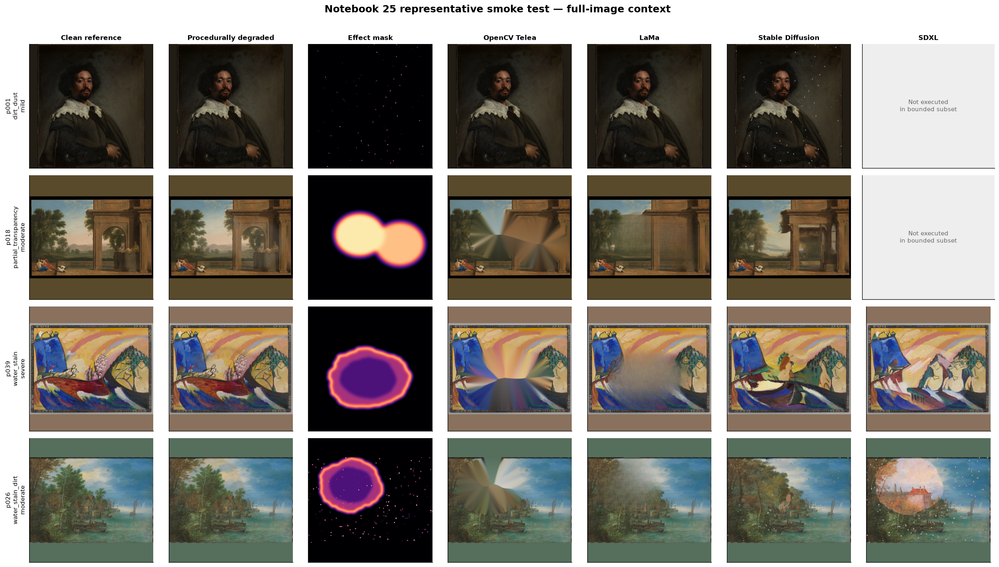

Full-image representative comparison rendered.
Rows: four fixed degradation cases; columns: reference, input, mask, and restorations.


In [12]:
MODEL_DISPLAY = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "stable_diffusion_inpainting": (
        "Stable Diffusion"
    ),
    "sdxl_inpainting": "SDXL",
}

FULL_VIEW_COLUMNS = [
    ("clean", "Clean reference"),
    ("degraded", "Procedurally degraded"),
    ("mask", "Effect mask"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
    ("sdxl_inpainting", "SDXL"),
]

smoke_candidate_lookup = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in SMOKE_CANDIDATES.itertuples(
        index=False
    )
}

figure, axes = plt.subplots(
    nrows=len(SMOKE_CASES),
    ncols=len(FULL_VIEW_COLUMNS),
    figsize=(21, 12),
    squeeze=False,
)

for row_index, case in enumerate(
    SMOKE_CASES.itertuples(index=False)
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )
    degraded_rgb = load_rgb_array(
        case.input_image_path
    )
    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(FULL_VIEW_COLUMNS):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            axis.imshow(clean_rgb)
        elif view_id == "degraded":
            axis.imshow(degraded_rgb)
        elif view_id == "mask":
            axis.imshow(
                mask_array,
                cmap="magma",
                vmin=0,
                vmax=255,
            )
        else:
            candidate = (
                smoke_candidate_lookup.get(
                    (
                        str(case.case_id),
                        view_id,
                    )
                )
            )

            if candidate is None:
                axis.set_facecolor("#eeeeee")
                axis.text(
                    0.5,
                    0.5,
                    "Not executed\nin bounded subset",
                    ha="center",
                    va="center",
                    fontsize=9,
                    color="#666666",
                    transform=axis.transAxes,
                )
            else:
                axis.imshow(
                    load_rgb_array(
                        candidate.restored_path
                    )
                )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    f"{case.painting_id}\n"
                    f"{case.degradation_family}\n"
                    f"{case.severity}"
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

figure.suptitle(
    (
        "Notebook 25 representative smoke test — "
        "full-image context"
    ),
    fontsize=15,
    fontweight="bold",
)

figure.tight_layout(
    rect=(0, 0, 1, 0.97)
)
plt.show()
plt.close(figure)

print("Full-image representative comparison rendered.")
print(
    "Rows: four fixed degradation cases; "
    "columns: reference, input, mask, and restorations."
)

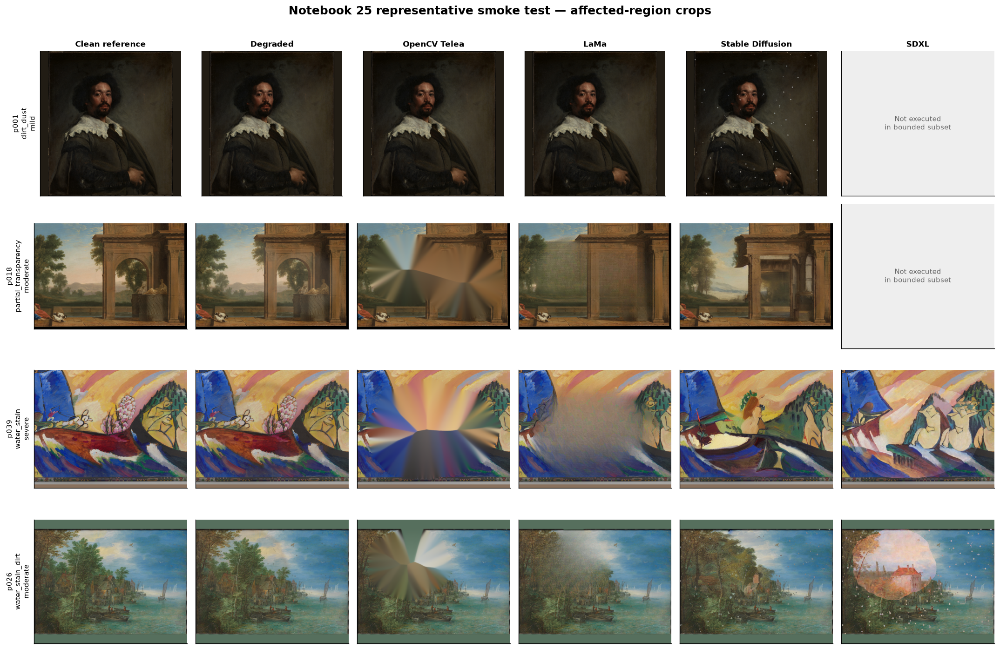

,case_id,x_min,y_min,x_max,y_max,crop_width,crop_height
0,synthetic_degradation__p001__dirt_dust__mild,10,0,758,768,748,768
1,synthetic_degradation__p018__partial_transparency__moderate,91,163,768,630,677,467
2,synthetic_degradation__p039__water_stain__severe,66,194,695,681,629,487
3,synthetic_degradation__p026__water_stain_dirt__moderate,0,73,768,694,768,621


Affected-region comparison rendered.
The crop boundary is derived only from the upstream effect-mask support.


In [13]:
def mask_bounding_box(
    mask: np.ndarray,
    *,
    margin_fraction: float = 0.06,
) -> tuple[int, int, int, int]:
    """Return a padded bounding box around active mask support."""
    active_y, active_x = np.nonzero(
        mask > 0
    )

    height, width = mask.shape

    if len(active_x) == 0:
        return 0, 0, width, height

    x_min = int(active_x.min())
    x_max = int(active_x.max()) + 1
    y_min = int(active_y.min())
    y_max = int(active_y.max()) + 1

    margin = max(
        8,
        int(
            max(
                x_max - x_min,
                y_max - y_min,
            )
            * margin_fraction
        ),
    )

    return (
        max(0, x_min - margin),
        max(0, y_min - margin),
        min(width, x_max + margin),
        min(height, y_max + margin),
    )


CROP_VIEW_COLUMNS = [
    ("clean", "Clean reference"),
    ("degraded", "Degraded"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
    ("sdxl_inpainting", "SDXL"),
]

figure, axes = plt.subplots(
    nrows=len(SMOKE_CASES),
    ncols=len(CROP_VIEW_COLUMNS),
    figsize=(18, 12),
    squeeze=False,
)

crop_extent_records = []

for row_index, case in enumerate(
    SMOKE_CASES.itertuples(index=False)
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )
    degraded_rgb = load_rgb_array(
        case.input_image_path
    )
    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    x_min, y_min, x_max, y_max = (
        mask_bounding_box(mask_array)
    )

    crop_extent_records.append(
        {
            "case_id": case.case_id,
            "x_min": x_min,
            "y_min": y_min,
            "x_max": x_max,
            "y_max": y_max,
            "crop_width": x_max - x_min,
            "crop_height": y_max - y_min,
        }
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(CROP_VIEW_COLUMNS):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            image_array = clean_rgb
        elif view_id == "degraded":
            image_array = degraded_rgb
        else:
            candidate = (
                smoke_candidate_lookup.get(
                    (
                        str(case.case_id),
                        view_id,
                    )
                )
            )

            if candidate is None:
                image_array = None
            else:
                image_array = load_rgb_array(
                    candidate.restored_path
                )

        if image_array is None:
            axis.set_facecolor("#eeeeee")
            axis.text(
                0.5,
                0.5,
                "Not executed\nin bounded subset",
                ha="center",
                va="center",
                fontsize=9,
                color="#666666",
                transform=axis.transAxes,
            )
        else:
            axis.imshow(
                image_array[
                    y_min:y_max,
                    x_min:x_max,
                ]
            )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    f"{case.painting_id}\n"
                    f"{case.degradation_family}\n"
                    f"{case.severity}"
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

SMOKE_CROP_EXTENTS = pd.DataFrame(
    crop_extent_records
)

figure.suptitle(
    (
        "Notebook 25 representative smoke test — "
        "affected-region crops"
    ),
    fontsize=15,
    fontweight="bold",
)

figure.tight_layout(
    rect=(0, 0, 1, 0.97)
)
plt.show()
plt.close(figure)

display(SMOKE_CROP_EXTENTS)

print("Affected-region comparison rendered.")
print(
    "The crop boundary is derived only from "
    "the upstream effect-mask support."
)

In [14]:
BATCH_3_STAGE = (
    "batch_3_representative_smoke_test"
)

# Preserve earlier checks while allowing this entire
# Batch 3 validation cell to be rerun safely.
preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_3_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_3_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
    severity: str = "blocking",
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_3_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


smoke_families = sorted(
    SMOKE_CASES[
        "degradation_family"
    ].astype(str).unique()
)

smoke_severities = sorted(
    SMOKE_CASES[
        "severity"
    ].astype(str).unique()
)

add_batch_3_check(
    check_id="representative_case_ids",
    description=(
        "All four fixed representative cases "
        "were found exactly once."
    ),
    expected=SMOKE_CASE_IDS,
    observed=SMOKE_CASES[
        "case_id"
    ].astype(str).tolist(),
    passed=(
        SMOKE_CASES[
            "case_id"
        ].astype(str).tolist()
        == SMOKE_CASE_IDS
    ),
)

add_batch_3_check(
    check_id="representative_design_coverage",
    description=(
        "The smoke test covers all eligible families, "
        "all severity settings, and the combined case."
    ),
    expected={
        "families": sorted(
            POPULATION[
                "eligible_degradation_order"
            ]
        ),
        "severities": [
            "mild",
            "moderate",
            "severe",
        ],
        "combined_cases": 1,
    },
    observed={
        "families": smoke_families,
        "severities": smoke_severities,
        "combined_cases": int(
            as_boolean(
                SMOKE_CASES[
                    "is_combined"
                ]
            ).sum()
        ),
    },
    passed=(
        set(smoke_families)
        == set(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
        and set(smoke_severities)
        == {
            "mild",
            "moderate",
            "severe",
        }
        and int(
            as_boolean(
                SMOKE_CASES[
                    "is_combined"
                ]
            ).sum()
        )
        == 1
    ),
)

add_batch_3_check(
    check_id="representative_candidate_coverage",
    description=(
        "The representative subset contains the "
        "expected core and bounded-SDXL candidates."
    ),
    expected={
        "cases": 4,
        "candidates": 14,
        "core_candidates": 12,
        "sdxl_candidates": 2,
    },
    observed={
        "cases": int(
            SMOKE_CANDIDATES[
                "case_id"
            ].nunique()
        ),
        "candidates": len(
            SMOKE_CANDIDATES
        ),
        "core_candidates": int(
            SMOKE_CANDIDATES[
                "coverage_role"
            ]
            .astype(str)
            .eq("core_three_model")
            .sum()
        ),
        "sdxl_candidates": int(
            SMOKE_CANDIDATES[
                "model_id"
            ]
            .astype(str)
            .eq("sdxl_inpainting")
            .sum()
        ),
    },
    passed=(
        SMOKE_CANDIDATES[
            "case_id"
        ].nunique()
        == 4
        and len(SMOKE_CANDIDATES) == 14
        and SMOKE_CANDIDATES[
            "coverage_role"
        ]
        .astype(str)
        .eq("core_three_model")
        .sum()
        == 12
        and SMOKE_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .sum()
        == 2
    ),
)

add_batch_3_check(
    check_id="pixel_audit_population",
    description=(
        "The pixel-integrity audit covers every "
        "selected candidate exactly once."
    ),
    expected={
        "rows": 156,
        "unique_candidates": 156,
    },
    observed={
        "rows": len(
            PIXEL_INTEGRITY_AUDIT
        ),
        "unique_candidates": int(
            PIXEL_INTEGRITY_AUDIT[
                "candidate_id"
            ].nunique()
        ),
    },
    passed=(
        len(PIXEL_INTEGRITY_AUDIT)
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
        and PIXEL_INTEGRITY_AUDIT[
            "candidate_id"
        ].nunique()
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
    ),
)

geometry_failures = int(
    (
        ~PIXEL_INTEGRITY_AUDIT[
            "geometry_valid"
        ]
    ).sum()
)

empty_masks = int(
    PIXEL_INTEGRITY_AUDIT[
        "active_mask_pixels"
    ]
    .le(0)
    .sum()
)

add_batch_3_check(
    check_id="image_geometry_and_mask_support",
    description=(
        "Every candidate matches its input geometry "
        "and has non-empty effect-mask support."
    ),
    expected={
        "geometry_failures": 0,
        "empty_masks": 0,
    },
    observed={
        "geometry_failures": (
            geometry_failures
        ),
        "empty_masks": empty_masks,
    },
    passed=(
        geometry_failures == 0
        and empty_masks == 0
    ),
)

outside_changed_pixels = int(
    PIXEL_INTEGRITY_AUDIT[
        "outside_changed_pixels"
    ].sum()
)

maximum_outside_difference = int(
    PIXEL_INTEGRITY_AUDIT[
        "outside_max_abs_difference"
    ].max()
)

add_batch_3_check(
    check_id="exact_compositing_containment",
    description=(
        "Every selected restoration preserves the "
        "degraded input outside effect-mask support."
    ),
    expected={
        "outside_changed_pixels": 0,
        "maximum_absolute_difference": 0,
    },
    observed={
        "outside_changed_pixels": (
            outside_changed_pixels
        ),
        "maximum_absolute_difference": (
            maximum_outside_difference
        ),
    },
    passed=(
        outside_changed_pixels == 0
        and maximum_outside_difference == 0
    ),
)

unchanged_inside_candidates = int(
    PIXEL_INTEGRITY_AUDIT[
        "inside_changed_pixels"
    ]
    .le(0)
    .sum()
)

add_batch_3_check(
    check_id="inside_mask_restoration_activity",
    description=(
        "Every selected candidate changes at least "
        "one pixel inside effect-mask support."
    ),
    expected=0,
    observed=unchanged_inside_candidates,
    passed=(
        unchanged_inside_candidates == 0
    ),
)

valid_crop_extents = (
    SMOKE_CROP_EXTENTS[
        "crop_width"
    ].gt(0)
    & SMOKE_CROP_EXTENTS[
        "crop_height"
    ].gt(0)
)

add_batch_3_check(
    check_id="representative_crop_extents",
    description=(
        "Every representative effect mask produces "
        "a valid non-empty inspection crop."
    ),
    expected={
        "valid_crops": 4,
        "invalid_crops": 0,
    },
    observed={
        "valid_crops": int(
            valid_crop_extents.sum()
        ),
        "invalid_crops": int(
            (~valid_crop_extents).sum()
        ),
    },
    passed=bool(
        valid_crop_extents.all()
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_3_check(
    check_id="canonical_outputs_not_written",
    description=(
        "The smoke test rendered notebook diagnostics "
        "without writing canonical artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_3_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_3_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_3_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 3 passed.")
print(
    "Batch 3 checks: "
    f"{len(BATCH_3_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_3_CHECKS['passed']).sum())}"
)
print(
    "Rendered diagnostic figures: 2"
)
print(
    "Canonical files written: "
    f"{existing_canonical_output_count}"
)
print(
    "Next batch: quality, spillover, "
    "and runtime evidence normalization."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_representative_smoke_test,representative_case_ids,All four fixed representative cases were found exactly once.,blocking,"[""synthetic_degradation__p001__dirt_dust__mild"", ""synthetic_degradation__p018__partial_transparency__moderate"", ""synthetic_degradation__p039__wate...","[""synthetic_degradation__p001__dirt_dust__mild"", ""synthetic_degradation__p018__partial_transparency__moderate"", ""synthetic_degradation__p039__wate...",True,
1,batch_3_representative_smoke_test,representative_design_coverage,"The smoke test covers all eligible families, all severity settings, and the combined case.",blocking,"{""combined_cases"": 1, ""families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""severities"": [""mild"", ""moderate"", ""se...","{""combined_cases"": 1, ""families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""severities"": [""mild"", ""moderate"", ""se...",True,
2,batch_3_representative_smoke_test,representative_candidate_coverage,The representative subset contains the expected core and bounded-SDXL candidates.,blocking,"{""candidates"": 14, ""cases"": 4, ""core_candidates"": 12, ""sdxl_candidates"": 2}","{""candidates"": 14, ""cases"": 4, ""core_candidates"": 12, ""sdxl_candidates"": 2}",True,
3,batch_3_representative_smoke_test,pixel_audit_population,The pixel-integrity audit covers every selected candidate exactly once.,blocking,"{""rows"": 156, ""unique_candidates"": 156}","{""rows"": 156, ""unique_candidates"": 156}",True,
4,batch_3_representative_smoke_test,image_geometry_and_mask_support,Every candidate matches its input geometry and has non-empty effect-mask support.,blocking,"{""empty_masks"": 0, ""geometry_failures"": 0}","{""empty_masks"": 0, ""geometry_failures"": 0}",True,
5,batch_3_representative_smoke_test,exact_compositing_containment,Every selected restoration preserves the degraded input outside effect-mask support.,blocking,"{""maximum_absolute_difference"": 0, ""outside_changed_pixels"": 0}","{""maximum_absolute_difference"": 0, ""outside_changed_pixels"": 0}",True,
6,batch_3_representative_smoke_test,inside_mask_restoration_activity,Every selected candidate changes at least one pixel inside effect-mask support.,blocking,0,0,True,
7,batch_3_representative_smoke_test,representative_crop_extents,Every representative effect mask produces a valid non-empty inspection crop.,blocking,"{""invalid_crops"": 0, ""valid_crops"": 4}","{""invalid_crops"": 0, ""valid_crops"": 4}",True,
8,batch_3_representative_smoke_test,canonical_outputs_not_written,The smoke test rendered notebook diagnostics without writing canonical artifacts.,blocking,0,0,True,


Batch 3 passed.
Batch 3 checks: 9
Blocking failures: 0
Rendered diagnostic figures: 2
Canonical files written: 0
Next batch: quality, spillover, and runtime evidence normalization.


## Batch 4 — Quality, spillover, and runtime evidence normalization

Load the frozen quantitative evidence from Notebooks 13–17 and 20 and normalize it against the exact 156-candidate population selected before metric inspection.

The normalized evidence includes:

- classical pixel and structural metrics;
- LPIPS perceptual distance;
- CLIP and DINOv2 feature similarity;
- spatial error and improvement diagnostics;
- local texture, colour, and seam consistency;
- semantic and structural preservation;
- outside-mask spillover;
- recorded candidate runtime.

Eleven prespecified quality anchors are extracted for later model comparisons. Runtime and spillover remain separate from quality ranking. No combined quality or trust score is constructed.

In [15]:
CLASSICAL_METRICS = pd.read_csv(
    INPUT_PATHS["classical_metrics_path"],
    low_memory=False,
)

LPIPS_METRICS = pd.read_csv(
    INPUT_PATHS["lpips_metrics_path"],
    low_memory=False,
)

FEATURE_METRICS = pd.read_csv(
    INPUT_PATHS["feature_metrics_path"],
    low_memory=False,
)

SPATIAL_METRICS = pd.read_csv(
    INPUT_PATHS["spatial_metrics_path"],
    low_memory=False,
)

SPATIAL_MAP_MANIFEST = pd.read_csv(
    INPUT_PATHS["spatial_maps_path"],
    low_memory=False,
)

LOCAL_METRICS = pd.read_csv(
    INPUT_PATHS["local_metrics_path"],
    low_memory=False,
)

LOCAL_MAP_MANIFEST = pd.read_csv(
    INPUT_PATHS["local_maps_path"],
    low_memory=False,
)

SEMANTIC_METRICS = pd.read_csv(
    INPUT_PATHS["semantic_metrics_path"],
    low_memory=False,
)

QUALITY_SOURCE_TABLES = {
    "classical": CLASSICAL_METRICS,
    "perceptual": LPIPS_METRICS,
    "feature": FEATURE_METRICS,
    "spatial": SPATIAL_METRICS,
    "local_consistency": LOCAL_METRICS,
    "semantic_structural": (
        SEMANTIC_METRICS
    ),
}

SELECTED_CANDIDATE_IDS = set(
    SELECTED_CANDIDATES[
        "candidate_id"
    ].astype(str)
)

SELECTED_SOURCE_TABLES = {
    source_key: frame.loc[
        frame["candidate_id"]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ].copy()
    for source_key, frame
    in QUALITY_SOURCE_TABLES.items()
}

SOURCE_ROW_EXPECTATIONS = {
    "classical": int(
        EXPECTED[
            "selected_classical_source_rows"
        ]
    ),
    "perceptual": int(
        EXPECTED[
            "selected_lpips_source_rows"
        ]
    ),
    "feature": int(
        EXPECTED[
            "selected_feature_source_rows"
        ]
    ),
    "spatial": int(
        EXPECTED[
            "selected_spatial_source_rows"
        ]
    ),
    "local_consistency": int(
        EXPECTED[
            "selected_local_source_rows"
        ]
    ),
    "semantic_structural": int(
        EXPECTED[
            "selected_semantic_source_rows"
        ]
    ),
}

metric_source_summary = pd.DataFrame(
    [
        {
            "source_key": source_key,
            "all_source_rows": len(
                QUALITY_SOURCE_TABLES[
                    source_key
                ]
            ),
            "selected_rows": len(
                SELECTED_SOURCE_TABLES[
                    source_key
                ]
            ),
            "expected_selected_rows": (
                SOURCE_ROW_EXPECTATIONS[
                    source_key
                ]
            ),
            "selected_candidates": (
                SELECTED_SOURCE_TABLES[
                    source_key
                ]["candidate_id"].nunique()
            ),
            "status_values": ", ".join(
                sorted(
                    SELECTED_SOURCE_TABLES[
                        source_key
                    ]["status"]
                    .astype(str)
                    .unique()
                )
            ),
        }
        for source_key
        in QUALITY_SOURCE_TABLES
    ]
)

display(metric_source_summary)

print("Frozen quality-evidence tables loaded.")
print(
    "Selected raw metric rows: "
    f"{sum(len(frame) for frame in SELECTED_SOURCE_TABLES.values()):,}"
)
print(
    "Expected raw metric rows: "
    f"{EXPECTED['selected_metric_source_rows']:,}"
)
print(
    "Selected candidate IDs: "
    f"{len(SELECTED_CANDIDATE_IDS)}"
)

,source_key,all_source_rows,selected_rows,expected_selected_rows,selected_candidates,status_values
0,classical,63018,5148,5148,156,ok
1,perceptual,4170,312,312,156,ok
2,feature,8340,624,624,156,ok
3,spatial,18896,1560,1560,156,ok
4,local_consistency,271988,22464,22464,156,ok
5,semantic_structural,58980,4368,4368,156,ok


Frozen quality-evidence tables loaded.
Selected raw metric rows: 34,476
Expected raw metric rows: 34,476
Selected candidate IDs: 156


In [16]:
selected_spatial_candidate_maps = (
    SPATIAL_MAP_MANIFEST.loc[
        SPATIAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

selected_spatial_panels = (
    SPATIAL_MAP_MANIFEST.loc[
        SPATIAL_MAP_MANIFEST[
            "map_type"
        ]
        .astype(str)
        .eq("candidate_spatial_panel")
        & SPATIAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

SELECTED_SPATIAL_MAPS = (
    pd.concat(
        [
            selected_spatial_candidate_maps,
            selected_spatial_panels,
        ],
        ignore_index=True,
        sort=False,
    )
    .drop_duplicates("map_image_id")
    .reset_index(drop=True)
)

selected_local_candidate_maps = (
    LOCAL_MAP_MANIFEST.loc[
        LOCAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

selected_local_panels = (
    LOCAL_MAP_MANIFEST.loc[
        LOCAL_MAP_MANIFEST[
            "map_type"
        ]
        .astype(str)
        .eq(
            "local_consistency_candidate_panel"
        )
        & LOCAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

SELECTED_LOCAL_MAPS = (
    pd.concat(
        [
            selected_local_candidate_maps,
            selected_local_panels,
        ],
        ignore_index=True,
        sort=False,
    )
    .drop_duplicates("map_image_id")
    .reset_index(drop=True)
)

SPATIAL_MAP_PATH_AUDIT = (
    inspect_repository_paths(
        SELECTED_SPATIAL_MAPS,
        source_name=(
            "selected Notebook 16 maps"
        ),
        columns=["relative_path"],
    )
)

LOCAL_MAP_PATH_AUDIT = (
    inspect_repository_paths(
        SELECTED_LOCAL_MAPS,
        source_name=(
            "selected Notebook 17 maps"
        ),
        columns=["relative_path"],
    )
)

MAP_PATH_AUDIT = pd.concat(
    [
        SPATIAL_MAP_PATH_AUDIT,
        LOCAL_MAP_PATH_AUDIT,
    ],
    ignore_index=True,
)

map_record_summary = pd.DataFrame(
    [
        {
            "map_source": (
                "Notebook 16 spatial"
            ),
            "selected_records": len(
                SELECTED_SPATIAL_MAPS
            ),
            "expected_records": int(
                EXPECTED[
                    "spatial_map_records"
                ]
            ),
            "candidate_records": len(
                selected_spatial_candidate_maps
            ),
            "selected_panels": len(
                selected_spatial_panels
            ),
        },
        {
            "map_source": (
                "Notebook 17 local consistency"
            ),
            "selected_records": len(
                SELECTED_LOCAL_MAPS
            ),
            "expected_records": int(
                EXPECTED[
                    "local_map_records"
                ]
            ),
            "candidate_records": len(
                selected_local_candidate_maps
            ),
            "selected_panels": len(
                selected_local_panels
            ),
        },
    ]
)

display(map_record_summary)
display(MAP_PATH_AUDIT)

print("Diagnostic map records selected.")
print(
    "Notebook 16 selected map records: "
    f"{len(SELECTED_SPATIAL_MAPS):,}"
)
print(
    "Notebook 17 selected map records: "
    f"{len(SELECTED_LOCAL_MAPS):,}"
)
print(
    "All selected map files exist: "
    f"{bool(MAP_PATH_AUDIT['all_valid'].all())}"
)

,map_source,selected_records,expected_records,candidate_records,selected_panels
0,Notebook 16 spatial,785,785,785,5
1,Notebook 17 local consistency,469,469,469,1


,source,path_column,path_count,repository_relative_count,inside_project_root_count,existing_file_count,all_valid
0,selected Notebook 16 maps,relative_path,785,785,785,785,True
1,selected Notebook 17 maps,relative_path,469,469,469,469,True


Diagnostic map records selected.
Notebook 16 selected map records: 785
Notebook 17 selected map records: 469
All selected map files exist: True


In [17]:
print("Normalizing frozen quality evidence...")

NORMALIZED_QUALITY = (
    normalise_quality_evidence(
        QUALITY_SOURCE_TABLES,
        SELECTED_CANDIDATES,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Normalized quality rows: "
    f"{len(NORMALIZED_QUALITY):,}"
)

QUALITY_ANCHORS = (
    select_quality_anchor_values(
        NORMALIZED_QUALITY,
        spatial_source=SPATIAL_METRICS,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Selected quality-anchor rows: "
    f"{len(QUALITY_ANCHORS):,}"
)

SPILLOVER_EVIDENCE = (
    select_spillover_evidence(
        NORMALIZED_QUALITY,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Selected spillover rows: "
    f"{len(SPILLOVER_EVIDENCE):,}"
)

RUNTIME_EVIDENCE = build_runtime_evidence(
    SELECTED_CANDIDATES,
    config=ANALYSIS_CONFIG,
)

print(
    "Selected runtime rows: "
    f"{len(RUNTIME_EVIDENCE):,}"
)

normalized_source_summary = (
    NORMALIZED_QUALITY.groupby(
        "source_notebook_id",
        dropna=False,
    )
    .agg(
        normalized_rows=(
            "source_metric_row_id",
            "size",
        ),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        evidence_families=(
            "evidence_family",
            "nunique",
        ),
        metric_names=(
            "metric_name",
            "nunique",
        ),
        anchor_rows=(
            "anchor_id",
            lambda values: int(
                values.fillna("")
                .astype(str)
                .ne("")
                .sum()
            ),
        ),
    )
    .reset_index()
)

anchor_coverage_summary = (
    QUALITY_ANCHORS.groupby(
        [
            "anchor_id",
            "comparison_direction",
        ],
        dropna=False,
    )
    .agg(
        rows=("candidate_id", "size"),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        models=("model_id", "nunique"),
        finite_values=(
            "comparison_value",
            lambda values: int(
                np.isfinite(
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    )
                ).sum()
            ),
        ),
    )
    .reset_index()
)

spillover_summary = (
    SPILLOVER_EVIDENCE.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        maximum_changed_fraction=(
            "comparison_value",
            "max",
        ),
        mean_changed_fraction=(
            "comparison_value",
            "mean",
        ),
    )
    .reset_index()
)

runtime_summary_preview = (
    RUNTIME_EVIDENCE.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        median_runtime_seconds=(
            "comparison_value",
            "median",
        ),
        minimum_runtime_seconds=(
            "comparison_value",
            "min",
        ),
        maximum_runtime_seconds=(
            "comparison_value",
            "max",
        ),
    )
    .reset_index()
)

display(normalized_source_summary)
display(anchor_coverage_summary)
display(spillover_summary)
display(runtime_summary_preview)

print("Quality, spillover, and runtime evidence normalized.")
print(
    "Quality anchors per candidate: "
    f"{QUALITY_ANCHORS.groupby('candidate_id').size().min()}"
)
print(
    "Maximum normalized spillover: "
    f"{pd.to_numeric(SPILLOVER_EVIDENCE['comparison_value'], errors='coerce').max():.6f}"
)
print(
    "Runtime remains quality-ranking eligible: "
    f"{bool(RUNTIME_EVIDENCE['quality_ranking_eligible'].any())}"
)

Normalizing frozen quality evidence...
Normalized quality rows: 54,756
Selected quality-anchor rows: 1,716
Selected spillover rows: 156
Selected runtime rows: 156


,source_notebook_id,normalized_rows,candidates,evidence_families,metric_names,anchor_rows
0,13,5148,156,2,4,312
1,14,312,156,1,1,156
2,15,624,156,1,2,312
3,16,21840,156,1,14,156
4,17,22464,156,4,34,468
5,20,4368,156,7,10,312


,anchor_id,comparison_direction,rows,candidates,models,finite_values
0,classical_masked_mae,lower_is_better,156,156,4,156
1,colour_masked_delta_e,lower_is_better,156,156,4,156
2,feature_clip_crop,higher_is_better,156,156,4,156
3,feature_dino_crop,higher_is_better,156,156,4,156
4,perceptual_crop_lpips,lower_is_better,156,156,4,156
5,seam_boundary_gradient,lower_is_better,156,156,4,156
6,semantic_local_dino,higher_is_better,156,156,4,156
7,spatial_masked_error,lower_is_better,156,156,4,156
8,structural_affinity_correlation,higher_is_better,156,156,4,156
9,structural_crop_ssim,higher_is_better,156,156,4,156


,model_id,candidates,maximum_changed_fraction,mean_changed_fraction
0,lama,50,0.0,0.0
1,opencv_telea,50,0.0,0.0
2,sdxl_inpainting,6,0.0,0.0
3,stable_diffusion_inpainting,50,0.0,0.0


,model_id,candidates,median_runtime_seconds,minimum_runtime_seconds,maximum_runtime_seconds
0,lama,50,2.045072,2.045072,2.045072
1,opencv_telea,50,0.615850,0.354015,1.019818
2,sdxl_inpainting,6,294.174500,207.408000,590.075000
3,stable_diffusion_inpainting,50,9.573321,9.394659,9.724213


Quality, spillover, and runtime evidence normalized.
Quality anchors per candidate: 11
Maximum normalized spillover: 0.000000
Runtime remains quality-ranking eligible: False


In [18]:
BATCH_4_STAGE = (
    "batch_4_evidence_normalization"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_4_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_4_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_4_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


selected_source_counts = {
    source_key: len(frame)
    for source_key, frame
    in SELECTED_SOURCE_TABLES.items()
}

add_batch_4_check(
    check_id="selected_source_row_counts",
    description=(
        "Each frozen metric source contributes the "
        "exact contracted number of selected rows."
    ),
    expected=SOURCE_ROW_EXPECTATIONS,
    observed=selected_source_counts,
    passed=(
        selected_source_counts
        == SOURCE_ROW_EXPECTATIONS
    ),
)

selected_raw_total = int(
    sum(selected_source_counts.values())
)

add_batch_4_check(
    check_id="selected_source_row_total",
    description=(
        "The six frozen sources contribute exactly "
        "34,476 selected raw metric rows."
    ),
    expected=int(
        EXPECTED[
            "selected_metric_source_rows"
        ]
    ),
    observed=selected_raw_total,
    passed=(
        selected_raw_total
        == int(
            EXPECTED[
                "selected_metric_source_rows"
            ]
        )
    ),
)

valid_source_statuses = {
    "ok",
    "passed",
}

invalid_source_status_counts = {
    source_key: int(
        (
            ~frame["status"]
            .astype(str)
            .isin(valid_source_statuses)
        ).sum()
    )
    for source_key, frame
    in SELECTED_SOURCE_TABLES.items()
}

add_batch_4_check(
    check_id="selected_source_status",
    description=(
        "Every selected upstream metric row has an "
        "accepted completed status."
    ),
    expected={
        source_key: 0
        for source_key
        in QUALITY_SOURCE_TABLES
    },
    observed=invalid_source_status_counts,
    passed=all(
        count == 0
        for count
        in invalid_source_status_counts.values()
    ),
)

map_counts_observed = {
    "spatial": len(
        SELECTED_SPATIAL_MAPS
    ),
    "local_consistency": len(
        SELECTED_LOCAL_MAPS
    ),
}

map_counts_expected = {
    "spatial": int(
        EXPECTED[
            "spatial_map_records"
        ]
    ),
    "local_consistency": int(
        EXPECTED[
            "local_map_records"
        ]
    ),
}

add_batch_4_check(
    check_id="diagnostic_map_record_counts",
    description=(
        "The selected diagnostic-map manifests retain "
        "their exact candidate and panel records."
    ),
    expected=map_counts_expected,
    observed=map_counts_observed,
    passed=(
        map_counts_observed
        == map_counts_expected
    ),
)

add_batch_4_check(
    check_id="diagnostic_map_files_exist",
    description=(
        "Every selected Notebook 16 and 17 diagnostic "
        "map file exists inside the repository."
    ),
    expected=True,
    observed=bool(
        MAP_PATH_AUDIT["all_valid"].all()
    ),
    passed=bool(
        MAP_PATH_AUDIT["all_valid"].all()
    ),
)

normalized_candidate_count = int(
    NORMALIZED_QUALITY[
        "candidate_id"
    ].nunique()
)

add_batch_4_check(
    check_id="normalized_quality_contract",
    description=(
        "Normalized quality evidence contains exactly "
        "54,756 rows covering all selected candidates."
    ),
    expected={
        "rows": 54756,
        "candidates": 156,
    },
    observed={
        "rows": len(
            NORMALIZED_QUALITY
        ),
        "candidates": (
            normalized_candidate_count
        ),
    },
    passed=(
        len(NORMALIZED_QUALITY)
        == int(
            EXPECTED[
                "normalized_quality_rows"
            ]
        )
        and normalized_candidate_count
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
    ),
)

allowed_directions = {
    "higher_is_better",
    "lower_is_better",
    "descriptive_only",
}

observed_directions = set(
    NORMALIZED_QUALITY[
        "comparison_direction"
    ]
    .dropna()
    .astype(str)
)

add_batch_4_check(
    check_id="comparison_direction_contract",
    description=(
        "Every normalized metric uses an approved "
        "direction or descriptive-only status."
    ),
    expected=sorted(
        allowed_directions
    ),
    observed=sorted(
        observed_directions
    ),
    passed=(
        observed_directions
        .issubset(allowed_directions)
        and bool(observed_directions)
    ),
)

anchor_rows_per_candidate = (
    QUALITY_ANCHORS.groupby(
        "candidate_id"
    )
    .size()
)

anchor_pair_duplicates = int(
    QUALITY_ANCHORS[
        ["candidate_id", "anchor_id"]
    ]
    .duplicated()
    .sum()
)

add_batch_4_check(
    check_id="quality_anchor_contract",
    description=(
        "Every selected candidate has exactly one row "
        "for each of the eleven approved anchors."
    ),
    expected={
        "rows": 1716,
        "anchors": 11,
        "rows_per_candidate": 11,
        "duplicate_pairs": 0,
    },
    observed={
        "rows": len(
            QUALITY_ANCHORS
        ),
        "anchors": int(
            QUALITY_ANCHORS[
                "anchor_id"
            ].nunique()
        ),
        "minimum_rows_per_candidate": int(
            anchor_rows_per_candidate.min()
        ),
        "maximum_rows_per_candidate": int(
            anchor_rows_per_candidate.max()
        ),
        "duplicate_pairs": (
            anchor_pair_duplicates
        ),
    },
    passed=(
        len(QUALITY_ANCHORS)
        == int(
            EXPECTED[
                "candidate_quality_anchor_rows"
            ]
        )
        and QUALITY_ANCHORS[
            "anchor_id"
        ].nunique()
        == int(
            EXPECTED["quality_anchors"]
        )
        and anchor_rows_per_candidate
        .eq(
            int(
                EXPECTED[
                    "quality_anchors"
                ]
            )
        )
        .all()
        and anchor_pair_duplicates == 0
    ),
)

finite_anchor_comparison = np.isfinite(
    pd.to_numeric(
        QUALITY_ANCHORS[
            "comparison_value"
        ],
        errors="coerce",
    )
)

finite_anchor_utility = np.isfinite(
    pd.to_numeric(
        QUALITY_ANCHORS[
            "directional_utility"
        ],
        errors="coerce",
    )
)

add_batch_4_check(
    check_id="quality_anchor_values_finite",
    description=(
        "Every approved anchor has finite comparison "
        "and directional-improvement evidence."
    ),
    expected={
        "finite_comparison_values": 1716,
        "finite_directional_utilities": 1716,
    },
    observed={
        "finite_comparison_values": int(
            finite_anchor_comparison.sum()
        ),
        "finite_directional_utilities": int(
            finite_anchor_utility.sum()
        ),
    },
    passed=(
        finite_anchor_comparison.all()
        and finite_anchor_utility.all()
    ),
)

spillover_values = pd.to_numeric(
    SPILLOVER_EVIDENCE[
        "comparison_value"
    ],
    errors="coerce",
)

add_batch_4_check(
    check_id="spillover_contract",
    description=(
        "Spillover is one finite containment value per "
        "candidate and remains outside quality ranking."
    ),
    expected={
        "rows": 156,
        "maximum_value": 0.0,
        "quality_ranking_rows": 0,
    },
    observed={
        "rows": len(
            SPILLOVER_EVIDENCE
        ),
        "maximum_value": float(
            spillover_values.max()
        ),
        "quality_ranking_rows": int(
            SPILLOVER_EVIDENCE[
                "quality_ranking_eligible"
            ].sum()
        ),
    },
    passed=(
        len(SPILLOVER_EVIDENCE)
        == int(
            EXPECTED[
                "candidate_spillover_rows"
            ]
        )
        and spillover_values.notna().all()
        and np.isclose(
            spillover_values.to_numpy(
                dtype=float
            ),
            0.0,
            atol=0.0,
        ).all()
        and not SPILLOVER_EVIDENCE[
            "quality_ranking_eligible"
        ].any()
    ),
)

runtime_values = pd.to_numeric(
    RUNTIME_EVIDENCE[
        "comparison_value"
    ],
    errors="coerce",
)

add_batch_4_check(
    check_id="runtime_contract",
    description=(
        "Runtime is finite and positive for every "
        "candidate but excluded from quality ranking."
    ),
    expected={
        "rows": 156,
        "finite_positive_values": 156,
        "quality_ranking_rows": 0,
    },
    observed={
        "rows": len(
            RUNTIME_EVIDENCE
        ),
        "finite_positive_values": int(
            (
                np.isfinite(runtime_values)
                & runtime_values.gt(0)
            ).sum()
        ),
        "quality_ranking_rows": int(
            RUNTIME_EVIDENCE[
                "quality_ranking_eligible"
            ].sum()
        ),
    },
    passed=(
        len(RUNTIME_EVIDENCE)
        == int(
            EXPECTED[
                "candidate_runtime_rows"
            ]
        )
        and np.isfinite(
            runtime_values
        ).all()
        and runtime_values.gt(0).all()
        and not RUNTIME_EVIDENCE[
            "quality_ranking_eligible"
        ].any()
    ),
)

add_batch_4_check(
    check_id="no_combined_quality_score",
    description=(
        "Normalization retains separate evidence "
        "families without creating a combined score."
    ),
    expected=False,
    observed=bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
    passed=not bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_4_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Evidence normalization did not write any "
        "canonical Notebook 25 artifact."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_4_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_4_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_4_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 4 passed.")
print(
    "Batch 4 checks: "
    f"{len(BATCH_4_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_4_CHECKS['passed']).sum())}"
)
print(
    "Normalized quality rows: "
    f"{len(NORMALIZED_QUALITY):,}"
)
print(
    "Quality-anchor rows: "
    f"{len(QUALITY_ANCHORS):,}"
)
print(
    "Spillover rows: "
    f"{len(SPILLOVER_EVIDENCE):,}"
)
print(
    "Runtime rows: "
    f"{len(RUNTIME_EVIDENCE):,}"
)
print(
    "Next batch: core three-model performance "
    "and paired contrasts."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_evidence_normalization,selected_source_row_counts,Each frozen metric source contributes the exact contracted number of selected rows.,blocking,"{""classical"": 5148, ""feature"": 624, ""local_consistency"": 22464, ""perceptual"": 312, ""semantic_structural"": 4368, ""spatial"": 1560}","{""classical"": 5148, ""feature"": 624, ""local_consistency"": 22464, ""perceptual"": 312, ""semantic_structural"": 4368, ""spatial"": 1560}",True,
1,batch_4_evidence_normalization,selected_source_row_total,"The six frozen sources contribute exactly 34,476 selected raw metric rows.",blocking,34476,34476,True,
2,batch_4_evidence_normalization,selected_source_status,Every selected upstream metric row has an accepted completed status.,blocking,"{""classical"": 0, ""feature"": 0, ""local_consistency"": 0, ""perceptual"": 0, ""semantic_structural"": 0, ""spatial"": 0}","{""classical"": 0, ""feature"": 0, ""local_consistency"": 0, ""perceptual"": 0, ""semantic_structural"": 0, ""spatial"": 0}",True,
3,batch_4_evidence_normalization,diagnostic_map_record_counts,The selected diagnostic-map manifests retain their exact candidate and panel records.,blocking,"{""local_consistency"": 469, ""spatial"": 785}","{""local_consistency"": 469, ""spatial"": 785}",True,
4,batch_4_evidence_normalization,diagnostic_map_files_exist,Every selected Notebook 16 and 17 diagnostic map file exists inside the repository.,blocking,True,True,True,
5,batch_4_evidence_normalization,normalized_quality_contract,"Normalized quality evidence contains exactly 54,756 rows covering all selected candidates.",blocking,"{""candidates"": 156, ""rows"": 54756}","{""candidates"": 156, ""rows"": 54756}",True,
6,batch_4_evidence_normalization,comparison_direction_contract,Every normalized metric uses an approved direction or descriptive-only status.,blocking,"[""descriptive_only"", ""higher_is_better"", ""lower_is_better""]","[""descriptive_only"", ""higher_is_better"", ""lower_is_better""]",True,
7,batch_4_evidence_normalization,quality_anchor_contract,Every selected candidate has exactly one row for each of the eleven approved anchors.,blocking,"{""anchors"": 11, ""duplicate_pairs"": 0, ""rows"": 1716, ""rows_per_candidate"": 11}","{""anchors"": 11, ""duplicate_pairs"": 0, ""maximum_rows_per_candidate"": 11, ""minimum_rows_per_candidate"": 11, ""rows"": 1716}",True,
8,batch_4_evidence_normalization,quality_anchor_values_finite,Every approved anchor has finite comparison and directional-improvement evidence.,blocking,"{""finite_comparison_values"": 1716, ""finite_directional_utilities"": 1716}","{""finite_comparison_values"": 1716, ""finite_directional_utilities"": 1716}",True,
9,batch_4_evidence_normalization,spillover_contract,Spillover is one finite containment value per candidate and remains outside quality ranking.,blocking,"{""maximum_value"": 0.0, ""quality_ranking_rows"": 0, ""rows"": 156}","{""maximum_value"": 0.0, ""quality_ranking_rows"": 0, ""rows"": 156}",True,


Batch 4 passed.
Batch 4 checks: 13
Blocking failures: 0
Normalized quality rows: 54,756
Quality-anchor rows: 1,716
Spillover rows: 156
Runtime rows: 156
Next batch: core three-model performance and paired contrasts.


## Batch 5 — Core three-model performance and paired contrasts

Compare OpenCV Telea, LaMa, and Stable Diffusion across their exact matched 50-case population.

Performance is summarized separately for each of the eleven approved quality anchors across:

- the complete eligible population;
- four degradation families;
- three severity settings;
- five individual paintings.

Inferential contrasts use painting as the independent unit. Repeated degradation cases are first averaged within each painting and model. Each pairwise model contrast then uses:

- five painting-level paired differences;
- all 32 possible sign assignments for the exact two-sided sign-flip test;
- all 3,125 ordered five-painting bootstrap resamples;
- matched-pairs rank-biserial effect size;
- Benjamini–Hochberg correction within each reported analysis scope.

Directional utility is oriented so that larger values always indicate greater improvement over the procedurally degraded input. No cross-metric combined quality score is calculated.

In [19]:
import hashlib


def stable_analysis_identifier(
    prefix: str,
    *parts,
) -> str:
    """Create a stable Notebook 25 analysis identifier."""
    payload = "|".join(
        "" if part is None else str(part)
        for part in parts
    )

    digest = hashlib.sha256(
        payload.encode("utf-8")
    ).hexdigest()[:20]

    return f"{prefix}_{digest}"


def make_analysis_record(
    analysis_kind: str,
    *,
    identifier_parts: tuple,
    **values,
) -> dict:
    """Create one complete canonical analysis record."""
    record = {
        column: pd.NA
        for column in ANALYSIS_COLUMNS
    }

    record.update(
        {
            "analysis_row_id": (
                stable_analysis_identifier(
                    "n25",
                    analysis_kind,
                    *identifier_parts,
                )
            ),
            "analysis_kind": analysis_kind,
            "analysis_family_id": (
                stable_analysis_identifier(
                    "n25_family",
                    analysis_kind,
                    *identifier_parts[:-1],
                )
            ),
            "population_id": (
                "core_three_model"
            ),
            "coverage_role": (
                "core_three_model"
            ),
            "independent_unit": (
                STATISTICS[
                    "independent_unit"
                ]
            ),
            "schema_version": (
                ANALYSIS_SCHEMA_VERSION
            ),
            "status": "ok",
            "issue": "",
        }
    )

    record.update(values)

    return record


def source_provenance(
    frame: pd.DataFrame,
) -> tuple[str, str]:
    """Return compact source-notebook and metric-row provenance."""
    notebook_ids = sorted(
        set(
            frame[
                "source_notebook_id"
            ]
            .dropna()
            .astype(str)
        )
    )

    source_metric_ids = sorted(
        set(
            frame[
                "source_metric_row_id"
            ]
            .dropna()
            .astype(str)
        )
    )

    return (
        ",".join(notebook_ids),
        json.dumps(
            source_metric_ids,
            ensure_ascii=False,
        ),
    )


def anchor_metadata(
    frame: pd.DataFrame,
) -> dict:
    """Extract stable metadata shared by one anchor group."""
    first = frame.iloc[0]

    return {
        "evidence_family": (
            first["evidence_family"]
        ),
        "metric_family": (
            first["metric_family"]
        ),
        "metric_id": first["metric_id"],
        "metric_name": (
            first["metric_name"]
        ),
        "feature_model_id": (
            first["feature_model_id"]
        ),
        "region_id": first["region_id"],
        "summary_statistic": (
            first["summary_statistic"]
        ),
        "value_unit": first["value_unit"],
        "comparison_direction": (
            first[
                "comparison_direction"
            ]
        ),
        "quality_ranking_eligible": True,
        "anchor_id": first["anchor_id"],
    }


CORE_ANCHOR_METADATA_COLUMNS = [
    "case_id",
    "candidate_id",
    "model_id",
    "degradation_family",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
]

CORE_ANCHOR_METADATA = (
    SELECTED_CANDIDATES[
        CORE_ANCHOR_METADATA_COLUMNS
    ]
    .drop_duplicates(
        [
            "case_id",
            "candidate_id",
            "model_id",
        ]
    )
    .copy()
)

CORE_ANCHORS = (
    QUALITY_ANCHORS.loc[
        QUALITY_ANCHORS["model_id"]
        .astype(str)
        .isin(POPULATION["model_order"])
    ]
    .merge(
        CORE_ANCHOR_METADATA,
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
    .reset_index(drop=True)
)

required_core_metadata = [
    "degradation_family",
    "severity",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
]

missing_core_metadata = sorted(
    set(required_core_metadata)
    - set(CORE_ANCHORS.columns)
)

if missing_core_metadata:
    raise ValueError(
        "Core anchors are missing Notebook 25 "
        f"metadata: {missing_core_metadata}"
    )

null_core_metadata = {
    column: int(
        CORE_ANCHORS[column]
        .isna()
        .sum()
    )
    for column in required_core_metadata
}

if any(
    count > 0
    for count in null_core_metadata.values()
):
    raise ValueError(
        "Core anchor metadata contains null values: "
        f"{null_core_metadata}"
    )

CORE_SCOPE_DEFINITIONS = [
    {
        "scope_type": "overall",
        "scope_value": "all_eligible_cases",
        "mask": pd.Series(
            True,
            index=CORE_ANCHORS.index,
        ),
    },
    *[
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_value": family,
            "mask": CORE_ANCHORS[
                "degradation_family"
            ]
            .astype(str)
            .eq(str(family)),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": CORE_ANCHORS[
                "severity"
            ]
            .astype(str)
            .eq(str(severity)),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": CORE_ANCHORS[
                "painting_id"
            ]
            .astype(str)
            .eq(str(painting_id)),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

PAIRWISE_SCOPE_DEFINITIONS = [
    scope
    for scope in CORE_SCOPE_DEFINITIONS
    if scope["scope_type"]
    != "painting"
]

CORE_MODEL_PAIRS = [
    (
        "opencv_telea",
        "lama",
    ),
    (
        "opencv_telea",
        "stable_diffusion_inpainting",
    ),
    (
        "lama",
        "stable_diffusion_inpainting",
    ),
]

scope_contract = pd.DataFrame(
    [
        {
            "scope_type": "overall",
            "scope_count": 1,
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_count": 4,
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": "severity",
            "scope_count": 3,
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": "painting",
            "scope_count": 5,
            "included_in_model_summary": True,
            "included_in_paired_contrast": False,
        },
    ]
)

display(scope_contract)

print("Canonical analysis utilities initialized.")
print(
    "Core quality-anchor rows: "
    f"{len(CORE_ANCHORS):,}"
)
print(
    "Summary scopes: "
    f"{len(CORE_SCOPE_DEFINITIONS)}"
)
print(
    "Inferential contrast scopes: "
    f"{len(PAIRWISE_SCOPE_DEFINITIONS)}"
)
print(
    "Core model pairs: "
    f"{len(CORE_MODEL_PAIRS)}"
)

,scope_type,scope_count,included_in_model_summary,included_in_paired_contrast
0,overall,1,True,True
1,degradation_family,4,True,True
2,severity,3,True,True
3,painting,5,True,False


Canonical analysis utilities initialized.
Core quality-anchor rows: 1,650
Summary scopes: 13
Inferential contrast scopes: 8
Core model pairs: 3


In [20]:
core_scope_records = []

for scope_number, scope in enumerate(
    CORE_SCOPE_DEFINITIONS,
    start=1,
):
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped = CORE_ANCHORS.loc[
        scope["mask"]
    ].copy()

    for anchor_id in sorted(
        scoped["anchor_id"]
        .astype(str)
        .unique()
    ):
        anchor_rows = scoped.loc[
            scoped["anchor_id"]
            .astype(str)
            .eq(anchor_id)
        ].copy()

        metadata = anchor_metadata(
            anchor_rows
        )

        for model_id in POPULATION[
            "model_order"
        ]:
            model_rows = anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .eq(str(model_id))
            ].copy()

            painting_summary = (
                model_rows.groupby(
                    "painting_id",
                    dropna=False,
                )
                .agg(
                    directional_utility=(
                        "directional_utility",
                        "mean",
                    ),
                    damaged_value=(
                        "damaged_value",
                        "mean",
                    ),
                    restored_value=(
                        "restored_value",
                        "mean",
                    ),
                    improvement_value=(
                        "improvement_value",
                        "mean",
                    ),
                )
                .reset_index()
            )

            painting_utilities = (
                pd.to_numeric(
                    painting_summary[
                        "directional_utility"
                    ],
                    errors="coerce",
                )
                .to_numpy(dtype=float)
            )

            if (
                painting_summary[
                    "painting_id"
                ].nunique()
                == int(EXPECTED["paintings"])
            ):
                interval = (
                    exhaustive_bootstrap_interval(
                        painting_utilities,
                        confidence_level=float(
                            STATISTICS[
                                "confidence_level"
                            ]
                        ),
                        statistic=np.mean,
                    )
                )
                bootstrap_method = (
                    STATISTICS[
                        "bootstrap_method"
                    ]
                )
                interpretation_status = (
                    "painting_cluster_summary"
                )
            else:
                interval = {
                    "estimate": float(
                        np.mean(
                            painting_utilities
                        )
                    ),
                    "ci_lower": np.nan,
                    "ci_upper": np.nan,
                    "resamples": 0,
                }
                bootstrap_method = (
                    "not_applicable_single_painting"
                )
                interpretation_status = (
                    "within_painting_descriptive"
                )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                model_rows
            )

            scope_metadata = {
                "degradation_family": (
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                "severity": (
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                "severity_rank": (
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                "painting_id": (
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                "is_combined": (
                    scope_value
                    == POPULATION[
                        "combined_degradation"
                    ]
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
            }

            record = make_analysis_record(
                "core_model_scope_summary",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    anchor_id,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=int(
                    painting_summary[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_rows
                ),
                affected_content_fraction=float(
                    pd.to_numeric(
                        model_rows[
                            "affected_content_fraction"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                changed_content_fraction=float(
                    pd.to_numeric(
                        model_rows[
                            "changed_content_fraction"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                damaged_value=float(
                    pd.to_numeric(
                        model_rows[
                            "damaged_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                restored_value=float(
                    pd.to_numeric(
                        model_rows[
                            "restored_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                improvement_value=float(
                    pd.to_numeric(
                        model_rows[
                            "improvement_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                directional_utility=float(
                    interval["estimate"]
                ),
                estimate_name=(
                    "mean_directional_utility"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                test_method=(
                    "descriptive_painting_cluster_summary"
                ),
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable"
                ),
                interpretation_status=(
                    interpretation_status
                ),
                **metadata,
                **scope_metadata,
            )

            core_scope_records.append(
                record
            )

    print(
        "Core summary progress: "
        f"{scope_number}/"
        f"{len(CORE_SCOPE_DEFINITIONS)} "
        f"({scope_type}: {scope_value})"
    )

CORE_MODEL_SCOPE_SUMMARY = pd.DataFrame(
    core_scope_records,
    columns=ANALYSIS_COLUMNS,
)

core_scope_count_summary = (
    CORE_MODEL_SCOPE_SUMMARY.groupby(
        "scope_type"
    )
    .agg(
        scopes=("scope_value", "nunique"),
        rows=("analysis_row_id", "size"),
        models=("model_id", "nunique"),
        anchors=("anchor_id", "nunique"),
    )
    .reset_index()
)

overall_model_summary = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("overall")
    ]
    .pivot(
        index="anchor_id",
        columns="model_id",
        values="estimate",
    )
    .reset_index()
)

display(core_scope_count_summary)
display(overall_model_summary)

print("Core model-scope summaries completed.")
print(
    "Summary rows: "
    f"{len(CORE_MODEL_SCOPE_SUMMARY):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['core_model_scope_summary_rows']:,}"
)

Core summary progress: 1/13 (overall: all_eligible_cases)
Core summary progress: 2/13 (degradation_family: dirt_dust)
Core summary progress: 3/13 (degradation_family: partial_transparency)
Core summary progress: 4/13 (degradation_family: water_stain)
Core summary progress: 5/13 (degradation_family: water_stain_dirt)
Core summary progress: 6/13 (severity: mild)
Core summary progress: 7/13 (severity: moderate)
Core summary progress: 8/13 (severity: severe)
Core summary progress: 9/13 (painting: p001)
Core summary progress: 10/13 (painting: p018)
Core summary progress: 11/13 (painting: p026)
Core summary progress: 12/13 (painting: p039)
Core summary progress: 13/13 (painting: p043)


,scope_type,scopes,rows,models,anchors
0,degradation_family,4,132,3,11
1,overall,1,33,3,11
2,painting,5,165,3,11
3,severity,3,99,3,11


model_id,anchor_id,lama,opencv_telea,stable_diffusion_inpainting
0,classical_masked_mae,-11.318812,-13.725016,-28.241014
1,colour_masked_delta_e,-5.742014,-6.797019,-12.879855
2,feature_clip_crop,-0.113423,-0.223123,-0.092133
3,feature_dino_crop,-0.316105,-0.547781,-0.191960
4,perceptual_crop_lpips,-0.266214,-0.345369,-0.282665
5,seam_boundary_gradient,-0.004165,-0.005499,-0.017011
6,semantic_local_dino,-0.322311,-0.513446,-0.327652
7,spatial_masked_error,-11.318812,-13.725016,-28.241014
8,structural_affinity_correlation,-0.127017,-0.411050,-0.220673
9,structural_crop_ssim,-0.229452,-0.220071,-0.283695


Core model-scope summaries completed.
Summary rows: 429
Expected rows: 429


In [21]:
paired_contrast_records = []

for scope_number, scope in enumerate(
    PAIRWISE_SCOPE_DEFINITIONS,
    start=1,
):
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped = CORE_ANCHORS.loc[
        scope["mask"]
    ].copy()

    for anchor_id in sorted(
        scoped["anchor_id"]
        .astype(str)
        .unique()
    ):
        anchor_rows = scoped.loc[
            scoped["anchor_id"]
            .astype(str)
            .eq(anchor_id)
        ].copy()

        metadata = anchor_metadata(
            anchor_rows
        )

        painting_model_means = (
            anchor_rows.groupby(
                [
                    "painting_id",
                    "model_id",
                ],
                dropna=False,
            )
            .agg(
                directional_utility=(
                    "directional_utility",
                    "mean",
                ),
                case_count=(
                    "case_id",
                    "nunique",
                ),
            )
            .reset_index()
        )

        utility_pivot = (
            painting_model_means.pivot(
                index="painting_id",
                columns="model_id",
                values="directional_utility",
            )
        )

        for (
            model_id,
            comparison_model_id,
        ) in CORE_MODEL_PAIRS:
            paired = utility_pivot[
                [
                    model_id,
                    comparison_model_id,
                ]
            ].dropna()

            paired_differences = (
                pd.to_numeric(
                    paired[model_id],
                    errors="coerce",
                )
                - pd.to_numeric(
                    paired[
                        comparison_model_id
                    ],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            exact_test = exact_sign_flip_test(
                paired_differences
            )

            interval = (
                exhaustive_bootstrap_interval(
                    paired_differences,
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )

            effect_size = (
                matched_rank_biserial(
                    paired_differences
                )
            )

            source_rows = anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .isin(
                    [
                        model_id,
                        comparison_model_id,
                    ]
                )
            ]

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            scope_metadata = {
                "degradation_family": (
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                "severity": (
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                "severity_rank": (
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                "is_combined": (
                    scope_value
                    == POPULATION[
                        "combined_degradation"
                    ]
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
            }

            record = make_analysis_record(
                "paired_core_model_contrast",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    anchor_id,
                    model_id,
                    comparison_model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                comparison_model_id=(
                    comparison_model_id
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=len(paired),
                n_cases=int(
                    source_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(paired),
                directional_utility=float(
                    interval["estimate"]
                ),
                estimate_name=(
                    "mean_paired_directional_"
                    "utility_difference"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=float(
                    interval["ci_lower"]
                ),
                ci_upper=float(
                    interval["ci_upper"]
                ),
                effect_size_name=(
                    "matched_pairs_rank_biserial"
                ),
                effect_size=float(
                    effect_size
                ),
                p_value=float(
                    exact_test["p_value"]
                ),
                test_method=(
                    "exact_two_sided_sign_flip_"
                    f"{exact_test['assignments']}_assignments"
                ),
                bootstrap_method=(
                    STATISTICS[
                        "bootstrap_method"
                    ]
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable"
                ),
                interpretation_status=(
                    "positive_estimate_favours_model_id"
                ),
                **metadata,
                **scope_metadata,
            )

            paired_contrast_records.append(
                record
            )

    print(
        "Paired contrast progress: "
        f"{scope_number}/"
        f"{len(PAIRWISE_SCOPE_DEFINITIONS)} "
        f"({scope_type}: {scope_value})"
    )

PAIRED_CORE_MODEL_CONTRAST = pd.DataFrame(
    paired_contrast_records,
    columns=ANALYSIS_COLUMNS,
)

PAIRED_CORE_MODEL_CONTRAST[
    "q_value"
] = np.nan

for (
    scope_type,
    scope_value,
), indices in (
    PAIRED_CORE_MODEL_CONTRAST.groupby(
        [
            "scope_type",
            "scope_value",
        ],
        sort=False,
    ).groups.items()
):
    PAIRED_CORE_MODEL_CONTRAST.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            PAIRED_CORE_MODEL_CONTRAST.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

paired_scope_summary = (
    PAIRED_CORE_MODEL_CONTRAST.groupby(
        "scope_type"
    )
    .agg(
        scopes=("scope_value", "nunique"),
        rows=("analysis_row_id", "size"),
        model_pairs=(
            "comparison_model_id",
            "size",
        ),
        anchors=("anchor_id", "nunique"),
        minimum_p_value=(
            "p_value",
            "min",
        ),
        minimum_q_value=(
            "q_value",
            "min",
        ),
    )
    .reset_index()
)

overall_pairwise_preview = (
    PAIRED_CORE_MODEL_CONTRAST.loc[
        PAIRED_CORE_MODEL_CONTRAST[
            "scope_type"
        ].eq("overall"),
        [
            "anchor_id",
            "model_id",
            "comparison_model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
            "effect_size",
            "p_value",
            "q_value",
        ],
    ]
    .sort_values(
        [
            "anchor_id",
            "model_id",
            "comparison_model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(paired_scope_summary)
display(overall_pairwise_preview)

print("Painting-paired model contrasts completed.")
print(
    "Contrast rows: "
    f"{len(PAIRED_CORE_MODEL_CONTRAST):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['paired_core_model_contrast_rows']:,}"
)
print(
    "Every positive estimate favours model_id "
    "over comparison_model_id."
)

Paired contrast progress: 1/8 (overall: all_eligible_cases)
Paired contrast progress: 2/8 (degradation_family: dirt_dust)
Paired contrast progress: 3/8 (degradation_family: partial_transparency)
Paired contrast progress: 4/8 (degradation_family: water_stain)
Paired contrast progress: 5/8 (degradation_family: water_stain_dirt)
Paired contrast progress: 6/8 (severity: mild)
Paired contrast progress: 7/8 (severity: moderate)
Paired contrast progress: 8/8 (severity: severe)


,scope_type,scopes,rows,model_pairs,anchors,minimum_p_value,minimum_q_value
0,degradation_family,4,132,132,11,0.0625,0.082500
1,overall,1,33,33,11,0.0625,0.073661
2,severity,3,99,99,11,0.0625,0.071121


,anchor_id,model_id,comparison_model_id,estimate,ci_lower,ci_upper,effect_size,p_value,q_value
0,classical_masked_mae,lama,stable_diffusion_inpainting,16.922202,11.063953,26.000797,1.000000,0.0625,0.073661
1,classical_masked_mae,opencv_telea,lama,-2.406204,-3.390672,-1.700476,-1.000000,0.0625,0.073661
2,classical_masked_mae,opencv_telea,stable_diffusion_inpainting,14.515998,8.544636,23.868361,1.000000,0.0625,0.073661
3,colour_masked_delta_e,lama,stable_diffusion_inpainting,7.137842,5.063147,9.795363,1.000000,0.0625,0.073661
4,colour_masked_delta_e,opencv_telea,lama,-1.055006,-1.396918,-0.745802,-1.000000,0.0625,0.073661
5,colour_masked_delta_e,opencv_telea,stable_diffusion_inpainting,6.082836,3.966472,9.022266,1.000000,0.0625,0.073661
6,feature_clip_crop,lama,stable_diffusion_inpainting,-0.021290,-0.033628,-0.009811,-1.000000,0.0625,0.073661
7,feature_clip_crop,opencv_telea,lama,-0.109700,-0.136832,-0.079925,-1.000000,0.0625,0.073661
8,feature_clip_crop,opencv_telea,stable_diffusion_inpainting,-0.130990,-0.156678,-0.100375,-1.000000,0.0625,0.073661
9,feature_dino_crop,lama,stable_diffusion_inpainting,-0.124145,-0.182250,-0.066040,-1.000000,0.0625,0.073661


Painting-paired model contrasts completed.
Contrast rows: 264
Expected rows: 264
Every positive estimate favours model_id over comparison_model_id.


In [23]:
BATCH_5_STAGE = (
    "batch_5_core_model_performance"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_5_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_5_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_5_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


add_batch_5_check(
    check_id="core_anchor_population",
    description=(
        "The core comparison contains eleven anchors "
        "for all 150 matched candidates."
    ),
    expected={
        "rows": 1650,
        "candidates": 150,
        "anchors": 11,
        "models": 3,
    },
    observed={
        "rows": len(CORE_ANCHORS),
        "candidates": int(
            CORE_ANCHORS[
                "candidate_id"
            ].nunique()
        ),
        "anchors": int(
            CORE_ANCHORS[
                "anchor_id"
            ].nunique()
        ),
        "models": int(
            CORE_ANCHORS[
                "model_id"
            ].nunique()
        ),
    },
    passed=(
        len(CORE_ANCHORS) == 1650
        and CORE_ANCHORS[
            "candidate_id"
        ].nunique()
        == 150
        and CORE_ANCHORS[
            "anchor_id"
        ].nunique()
        == 11
        and CORE_ANCHORS[
            "model_id"
        ].nunique()
        == 3
    ),
)

summary_scope_counts = {
    str(scope_type): int(count)
    for scope_type, count in (
        CORE_MODEL_SCOPE_SUMMARY.groupby(
            "scope_type"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_summary_scope_counts = {
    "overall": 33,
    "degradation_family": 132,
    "severity": 99,
    "painting": 165,
}

add_batch_5_check(
    check_id="core_scope_summary_rows",
    description=(
        "Core model summaries contain the exact "
        "429-row scope design."
    ),
    expected={
        "total": 429,
        "by_scope": (
            expected_summary_scope_counts
        ),
    },
    observed={
        "total": len(
            CORE_MODEL_SCOPE_SUMMARY
        ),
        "by_scope": summary_scope_counts,
    },
    passed=(
        len(CORE_MODEL_SCOPE_SUMMARY)
        == int(
            EXPECTED[
                "core_model_scope_summary_rows"
            ]
        )
        and summary_scope_counts
        == expected_summary_scope_counts
    ),
)

summary_key_duplicates = int(
    CORE_MODEL_SCOPE_SUMMARY[
        [
            "scope_type",
            "scope_value",
            "anchor_id",
            "model_id",
        ]
    ]
    .duplicated()
    .sum()
)

add_batch_5_check(
    check_id="core_scope_summary_keys",
    description=(
        "Every model-anchor-scope summary is unique."
    ),
    expected=0,
    observed=summary_key_duplicates,
    passed=(summary_key_duplicates == 0),
)

summary_estimates = pd.to_numeric(
    CORE_MODEL_SCOPE_SUMMARY[
        "estimate"
    ],
    errors="coerce",
)

cluster_summary_rows = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        ~CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("painting")
    ]
)

painting_summary_rows = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("painting")
    ]
)

add_batch_5_check(
    check_id="core_scope_inference_boundary",
    description=(
        "Five-painting scopes use exhaustive intervals, "
        "while individual paintings remain descriptive."
    ),
    expected={
        "cluster_rows": 264,
        "cluster_resamples": 3125,
        "painting_rows": 165,
        "painting_resamples": 0,
    },
    observed={
        "cluster_rows": len(
            cluster_summary_rows
        ),
        "cluster_resample_values": sorted(
            pd.to_numeric(
                cluster_summary_rows[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "painting_rows": len(
            painting_summary_rows
        ),
        "painting_resample_values": sorted(
            pd.to_numeric(
                painting_summary_rows[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(cluster_summary_rows) == 264
        and pd.to_numeric(
            cluster_summary_rows[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(3125)
        .all()
        and len(painting_summary_rows)
        == 165
        and pd.to_numeric(
            painting_summary_rows[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(0)
        .all()
    ),
)

add_batch_5_check(
    check_id="core_scope_estimates_finite",
    description=(
        "Every core model-scope summary has a finite "
        "directional-utility estimate."
    ),
    expected=429,
    observed=int(
        np.isfinite(
            summary_estimates
        ).sum()
    ),
    passed=bool(
        np.isfinite(
            summary_estimates
        ).all()
    ),
)

contrast_scope_counts = {
    str(scope_type): int(count)
    for scope_type, count in (
        PAIRED_CORE_MODEL_CONTRAST.groupby(
            "scope_type"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_contrast_scope_counts = {
    "overall": 33,
    "degradation_family": 132,
    "severity": 99,
}

add_batch_5_check(
    check_id="paired_contrast_rows",
    description=(
        "Pairwise model comparisons contain the exact "
        "264-row inferential scope design."
    ),
    expected={
        "total": 264,
        "by_scope": (
            expected_contrast_scope_counts
        ),
    },
    observed={
        "total": len(
            PAIRED_CORE_MODEL_CONTRAST
        ),
        "by_scope": contrast_scope_counts,
    },
    passed=(
        len(PAIRED_CORE_MODEL_CONTRAST)
        == int(
            EXPECTED[
                "paired_core_model_contrast_rows"
            ]
        )
        and contrast_scope_counts
        == expected_contrast_scope_counts
    ),
)

contrast_key_duplicates = int(
    PAIRED_CORE_MODEL_CONTRAST[
        [
            "scope_type",
            "scope_value",
            "anchor_id",
            "model_id",
            "comparison_model_id",
        ]
    ]
    .duplicated()
    .sum()
)

add_batch_5_check(
    check_id="paired_contrast_keys",
    description=(
        "Every scope-anchor-model-pair contrast "
        "is unique."
    ),
    expected=0,
    observed=contrast_key_duplicates,
    passed=(contrast_key_duplicates == 0),
)

paired_painting_counts = sorted(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "n_paintings"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

sign_flip_methods = sorted(
    PAIRED_CORE_MODEL_CONTRAST[
        "test_method"
    ].astype(str).unique()
)

bootstrap_counts = sorted(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "bootstrap_resamples"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

add_batch_5_check(
    check_id="painting_level_exact_inference",
    description=(
        "Every paired contrast uses five paintings, "
        "32 sign assignments, and 3,125 bootstraps."
    ),
    expected={
        "painting_counts": [5],
        "test_methods": [
            (
                "exact_two_sided_sign_flip_"
                "32_assignments"
            )
        ],
        "bootstrap_counts": [3125],
    },
    observed={
        "painting_counts": (
            paired_painting_counts
        ),
        "test_methods": (
            sign_flip_methods
        ),
        "bootstrap_counts": (
            bootstrap_counts
        ),
    },
    passed=(
        paired_painting_counts == [5]
        and sign_flip_methods
        == [
            (
                "exact_two_sided_sign_flip_"
                "32_assignments"
            )
        ]
        and bootstrap_counts == [3125]
    ),
)

probability_columns_finite = (
    PAIRED_CORE_MODEL_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_5_check(
    check_id="paired_probability_contract",
    description=(
        "Every paired contrast has valid exact p-values "
        "and scope-wise adjusted q-values."
    ),
    expected={
        "finite_p_values": 264,
        "finite_q_values": 264,
        "range": "[0, 1]",
    },
    observed={
        "finite_p_values": int(
            probability_columns_finite[
                "p_value"
            ].notna().sum()
        ),
        "finite_q_values": int(
            probability_columns_finite[
                "q_value"
            ].notna().sum()
        ),
        "minimum_p_value": float(
            probability_columns_finite[
                "p_value"
            ].min()
        ),
        "maximum_p_value": float(
            probability_columns_finite[
                "p_value"
            ].max()
        ),
        "minimum_q_value": float(
            probability_columns_finite[
                "q_value"
            ].min()
        ),
        "maximum_q_value": float(
            probability_columns_finite[
                "q_value"
            ].max()
        ),
    },
    passed=(
        probability_columns_finite
        .notna()
        .all()
        .all()
        and probability_columns_finite
        .ge(0.0)
        .all()
        .all()
        and probability_columns_finite
        .le(1.0)
        .all()
        .all()
    ),
)

partial_core_analysis = pd.DataFrame(
    [
        *CORE_MODEL_SCOPE_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_CORE_MODEL_CONTRAST.to_dict(
            orient="records"
        ),
    ],
    columns=ANALYSIS_COLUMNS,
)

partial_core_validation = (
    validate_synthetic_degradation_analysis(
        partial_core_analysis,
        config=ANALYSIS_CONFIG,
        require_complete=False,
    )
)

add_batch_5_check(
    check_id="partial_canonical_schema",
    description=(
        "Both completed core-performance blocks "
        "satisfy the canonical analysis schema."
    ),
    expected=True,
    observed=partial_core_validation,
    passed=bool(
        partial_core_validation["passed"]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_5_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Core performance analysis did not write "
        "canonical Notebook 25 artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_5_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_5_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_5_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 5 passed.")
print(
    "Batch 5 checks: "
    f"{len(BATCH_5_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_5_CHECKS['passed']).sum())}"
)
print(
    "Core model-scope rows: "
    f"{len(CORE_MODEL_SCOPE_SUMMARY):,}"
)
print(
    "Paired contrast rows: "
    f"{len(PAIRED_CORE_MODEL_CONTRAST):,}"
)
print(
    "Partial canonical rows: "
    f"{len(partial_core_analysis):,}"
)
print(
    "Next batch: severity, affected-area, "
    "and combined-degradation analysis."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_core_model_performance,core_anchor_population,The core comparison contains eleven anchors for all 150 matched candidates.,blocking,"{""anchors"": 11, ""candidates"": 150, ""models"": 3, ""rows"": 1650}","{""anchors"": 11, ""candidates"": 150, ""models"": 3, ""rows"": 1650}",True,
1,batch_5_core_model_performance,core_scope_summary_rows,Core model summaries contain the exact 429-row scope design.,blocking,"{""by_scope"": {""degradation_family"": 132, ""overall"": 33, ""painting"": 165, ""severity"": 99}, ""total"": 429}","{""by_scope"": {""degradation_family"": 132, ""overall"": 33, ""painting"": 165, ""severity"": 99}, ""total"": 429}",True,
2,batch_5_core_model_performance,core_scope_summary_keys,Every model-anchor-scope summary is unique.,blocking,0,0,True,
3,batch_5_core_model_performance,core_scope_inference_boundary,"Five-painting scopes use exhaustive intervals, while individual paintings remain descriptive.",blocking,"{""cluster_resamples"": 3125, ""cluster_rows"": 264, ""painting_resamples"": 0, ""painting_rows"": 165}","{""cluster_resample_values"": [3125], ""cluster_rows"": 264, ""painting_resample_values"": [0], ""painting_rows"": 165}",True,
4,batch_5_core_model_performance,core_scope_estimates_finite,Every core model-scope summary has a finite directional-utility estimate.,blocking,429,429,True,
5,batch_5_core_model_performance,paired_contrast_rows,Pairwise model comparisons contain the exact 264-row inferential scope design.,blocking,"{""by_scope"": {""degradation_family"": 132, ""overall"": 33, ""severity"": 99}, ""total"": 264}","{""by_scope"": {""degradation_family"": 132, ""overall"": 33, ""severity"": 99}, ""total"": 264}",True,
6,batch_5_core_model_performance,paired_contrast_keys,Every scope-anchor-model-pair contrast is unique.,blocking,0,0,True,
7,batch_5_core_model_performance,painting_level_exact_inference,"Every paired contrast uses five paintings, 32 sign assignments, and 3,125 bootstraps.",blocking,"{""bootstrap_counts"": [3125], ""painting_counts"": [5], ""test_methods"": [""exact_two_sided_sign_flip_32_assignments""]}","{""bootstrap_counts"": [3125], ""painting_counts"": [5], ""test_methods"": [""exact_two_sided_sign_flip_32_assignments""]}",True,
8,batch_5_core_model_performance,paired_probability_contract,Every paired contrast has valid exact p-values and scope-wise adjusted q-values.,blocking,"{""finite_p_values"": 264, ""finite_q_values"": 264, ""range"": ""[0, 1]""}","{""finite_p_values"": 264, ""finite_q_values"": 264, ""maximum_p_value"": 1.0, ""maximum_q_value"": 1.0, ""minimum_p_value"": 0.0625, ""minimum_q_value"": 0.0...",True,
9,batch_5_core_model_performance,partial_canonical_schema,Both completed core-performance blocks satisfy the canonical analysis schema.,blocking,True,"{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_prohibited_score_or_cla...",True,


Batch 5 passed.
Batch 5 checks: 11
Blocking failures: 0
Core model-scope rows: 429
Paired contrast rows: 264
Partial canonical rows: 693
Next batch: severity, affected-area, and combined-degradation analysis.


## Batch 6 — Severity, affected area, and combined degradations

Measure how restoration behaviour changes across the three configured procedural severity settings.

For each single degradation family, quality anchor, model, and painting, the notebook computes a Theil–Sen slope across mild, moderate, and severe cases. Positive adverse slopes mean that restoration performance worsens as configured severity increases.

Painting-level slopes are then summarized across the five paintings and compared between models using exact paired inference.

The batch also evaluates:

- within-painting associations between affected content area and adverse restoration outcome;
- the moderate `water_stain_dirt` composition against its moderate `water_stain` and `dirt_dust` components.

The combined-effect comparison is a controlled computational contrast. It does not establish physical material interaction, conservation severity, or causal synergy.

In [25]:
SINGLE_DEGRADATION_FAMILIES = list(
    POPULATION["single_degradation_order"]
)

painting_severity_records = []

severity_group_total = (
    len(SINGLE_DEGRADATION_FAMILIES)
    * len(POPULATION["model_order"])
    * int(EXPECTED["quality_anchors"])
)

severity_group_number = 0

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for model_id in POPULATION[
        "model_order"
    ]:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            severity_group_number += 1

            source_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(degradation_family)
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            slopes = compute_painting_slopes(
                source_rows,
                exposure_column=(
                    "severity_rank"
                ),
                value_column=(
                    "directional_utility"
                ),
                direction=(
                    "higher_is_better"
                ),
                reporting_scale_percentage_points=(
                    100.0
                ),
            )

            metadata = anchor_metadata(
                source_rows
            )
            metadata["value_unit"] = (
                f"{metadata['value_unit']}"
                "_per_severity_level"
            )

            for slope in slopes.itertuples(
                index=False
            ):
                painting_rows = (
                    source_rows.loc[
                        source_rows[
                            "painting_id"
                        ]
                        .astype(str)
                        .eq(str(slope.painting_id))
                    ]
                    .copy()
                )

                (
                    source_notebook_ids,
                    source_metric_ids_json,
                ) = source_provenance(
                    painting_rows
                )

                painting_severity_records.append(
                    make_analysis_record(
                        "painting_severity_slope",
                        identifier_parts=(
                            degradation_family,
                            anchor_id,
                            model_id,
                            slope.painting_id,
                        ),
                        source_notebook_ids=(
                            source_notebook_ids
                        ),
                        source_metric_ids_json=(
                            source_metric_ids_json
                        ),
                        model_id=model_id,
                        painting_id=(
                            slope.painting_id
                        ),
                        degradation_family=(
                            degradation_family
                        ),
                        severity=(
                            "mild_to_severe_ordinal"
                        ),
                        is_combined=False,
                        scope_type=(
                            "painting_severity_slope"
                        ),
                        scope_value=(
                            degradation_family
                        ),
                        n_paintings=1,
                        n_cases=int(
                            painting_rows[
                                "case_id"
                            ].nunique()
                        ),
                        n_observations=int(
                            slope.level_count
                        ),
                        estimate_name=(
                            "adverse_theil_sen_"
                            "slope_per_severity_level"
                        ),
                        estimate=float(slope.adverse_slope_per_reporting_interval),
                        test_method=(
                            "theil_sen_within_painting"
                        ),
                        bootstrap_method=(
                            "not_applicable_"
                            "individual_painting"
                        ),
                        bootstrap_resamples=0,
                        applicability_status=(
                            "applicable"
                        ),
                        interpretation_status=(
                            "positive_estimate_means_"
                            "worsening_with_severity"
                        ),
                        **metadata,
                    )
                )

            if (
                severity_group_number % 10 == 0
                or severity_group_number
                == severity_group_total
            ):
                print(
                    "Painting-slope progress: "
                    f"{severity_group_number}/"
                    f"{severity_group_total}"
                )

PAINTING_SEVERITY_SLOPE = pd.DataFrame(
    painting_severity_records,
    columns=ANALYSIS_COLUMNS,
)

painting_slope_summary = (
    PAINTING_SEVERITY_SLOPE.groupby(
        [
            "degradation_family",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        paintings=(
            "painting_id",
            "nunique",
        ),
        anchors=(
            "anchor_id",
            "nunique",
        ),
        median_adverse_slope=(
            "estimate",
            "median",
        ),
        positive_adverse_slopes=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
    )
    .reset_index()
)

display(painting_slope_summary)

print("Painting-level severity slopes completed.")
print(
    "Slope rows: "
    f"{len(PAINTING_SEVERITY_SLOPE):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['painting_severity_slope_rows']:,}"
)

Painting-slope progress: 10/99
Painting-slope progress: 20/99
Painting-slope progress: 30/99
Painting-slope progress: 40/99
Painting-slope progress: 50/99
Painting-slope progress: 60/99
Painting-slope progress: 70/99
Painting-slope progress: 80/99
Painting-slope progress: 90/99
Painting-slope progress: 99/99


,degradation_family,model_id,rows,paintings,anchors,median_adverse_slope,positive_adverse_slopes
0,dirt_dust,lama,55,5,11,-0.010429,0
1,dirt_dust,opencv_telea,55,5,11,-0.009429,1
2,dirt_dust,stable_diffusion_inpainting,55,5,11,0.016400,37
3,partial_transparency,lama,55,5,11,-0.041726,15
4,partial_transparency,opencv_telea,55,5,11,-0.056654,10
5,partial_transparency,stable_diffusion_inpainting,55,5,11,-0.031739,22
6,water_stain,lama,55,5,11,0.031497,35
7,water_stain,opencv_telea,55,5,11,0.004916,34
8,water_stain,stable_diffusion_inpainting,55,5,11,0.007816,33


Painting-level severity slopes completed.
Slope rows: 495
Expected rows: 495


In [26]:
model_severity_records = []
paired_severity_records = []

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for anchor_id in sorted(
        CORE_ANCHORS[
            "anchor_id"
        ].astype(str).unique()
    ):
        family_anchor_slopes = (
            PAINTING_SEVERITY_SLOPE.loc[
                PAINTING_SEVERITY_SLOPE[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
                & PAINTING_SEVERITY_SLOPE[
                    "anchor_id"
                ]
                .astype(str)
                .eq(anchor_id)
            ]
            .copy()
        )

        raw_anchor_rows = (
            CORE_ANCHORS.loc[
                CORE_ANCHORS[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
                & CORE_ANCHORS[
                    "anchor_id"
                ]
                .astype(str)
                .eq(anchor_id)
            ]
            .copy()
        )

        metadata = anchor_metadata(
            raw_anchor_rows
        )
        metadata["value_unit"] = (
            f"{metadata['value_unit']}"
            "_per_severity_level"
        )

        for model_id in POPULATION[
            "model_order"
        ]:
            model_slopes = (
                family_anchor_slopes.loc[
                    family_anchor_slopes[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                ]
                .copy()
            )

            slope_input = pd.DataFrame(
                {
                    "painting_id": (
                        model_slopes[
                            "painting_id"
                        ].astype(str)
                    ),
                    (
                        "adverse_slope_"
                        "per_reporting_interval"
                    ): pd.to_numeric(
                        model_slopes[
                            "estimate"
                        ],
                        errors="coerce",
                    ),
                }
            )

            slope_summary = (
                summarise_painting_slopes(
                    slope_input,
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                )
            )

            model_raw_rows = (
                raw_anchor_rows.loc[
                    raw_anchor_rows[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                ]
                .copy()
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                model_raw_rows
            )

            model_severity_records.append(
                make_analysis_record(
                    "model_severity_summary",
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        degradation_family
                    ),
                    severity=(
                        "mild_to_severe_ordinal"
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=int(
                        slope_summary[
                            "painting_count"
                        ]
                    ),
                    n_cases=int(
                        model_raw_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(
                        model_slopes
                    ),
                    estimate_name=(
                        "median_adverse_slope_"
                        "per_severity_level"
                    ),
                    estimate=float(
                        slope_summary[
                            "estimate"
                        ]
                    ),
                    ci_lower=float(
                        slope_summary[
                            "ci_lower"
                        ]
                    ),
                    ci_upper=float(
                        slope_summary[
                            "ci_upper"
                        ]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial_"
                        "against_zero"
                    ),
                    effect_size=float(
                        slope_summary[
                            "rank_biserial"
                        ]
                    ),
                    p_value=float(
                        slope_summary[
                            "p_value"
                        ]
                    ),
                    test_method=(
                        "exact_two_sided_sign_flip_"
                        f"{slope_summary['sign_flip_assignments']}"
                        "_assignments"
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        slope_summary[
                            "resamples"
                        ]
                    ),
                    applicability_status=(
                        "applicable"
                    ),
                    interpretation_status=(
                        "positive_estimate_means_"
                        "worsening_with_severity"
                    ),
                    **metadata,
                )
            )

        slope_pivot = (
            family_anchor_slopes.pivot(
                index="painting_id",
                columns="model_id",
                values="estimate",
            )
        )

        for (
            model_id,
            comparison_model_id,
        ) in CORE_MODEL_PAIRS:
            paired = slope_pivot[
                [
                    model_id,
                    comparison_model_id,
                ]
            ].dropna()

            # Positive means model_id has a lower adverse
            # slope and is therefore more robust.
            robustness_advantage = (
                pd.to_numeric(
                    paired[
                        comparison_model_id
                    ],
                    errors="coerce",
                )
                - pd.to_numeric(
                    paired[model_id],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            interval = (
                exhaustive_bootstrap_interval(
                    robustness_advantage,
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )

            exact_test = exact_sign_flip_test(
                robustness_advantage
            )

            pair_raw_rows = (
                raw_anchor_rows.loc[
                    raw_anchor_rows[
                        "model_id"
                    ]
                    .astype(str)
                    .isin(
                        [
                            model_id,
                            comparison_model_id,
                        ]
                    )
                ]
                .copy()
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                pair_raw_rows
            )

            paired_severity_records.append(
                make_analysis_record(
                    (
                        "paired_model_"
                        "severity_contrast"
                    ),
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                        comparison_model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    comparison_model_id=(
                        comparison_model_id
                    ),
                    degradation_family=(
                        degradation_family
                    ),
                    severity=(
                        "mild_to_severe_ordinal"
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=len(paired),
                    n_cases=int(
                        pair_raw_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(paired),
                    estimate_name=(
                        "mean_paired_adverse_"
                        "slope_advantage"
                    ),
                    estimate=float(
                        interval["estimate"]
                    ),
                    ci_lower=float(
                        interval["ci_lower"]
                    ),
                    ci_upper=float(
                        interval["ci_upper"]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial"
                    ),
                    effect_size=float(
                        matched_rank_biserial(
                            robustness_advantage
                        )
                    ),
                    p_value=float(
                        exact_test["p_value"]
                    ),
                    test_method=(
                        "exact_two_sided_sign_flip_"
                        f"{exact_test['assignments']}"
                        "_assignments"
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        interval["resamples"]
                    ),
                    applicability_status=(
                        "applicable"
                    ),
                    interpretation_status=(
                        "positive_estimate_favours_"
                        "model_id_robustness"
                    ),
                    **metadata,
                )
            )

MODEL_SEVERITY_SUMMARY = pd.DataFrame(
    model_severity_records,
    columns=ANALYSIS_COLUMNS,
)

PAIRED_MODEL_SEVERITY_CONTRAST = (
    pd.DataFrame(
        paired_severity_records,
        columns=ANALYSIS_COLUMNS,
    )
)

MODEL_SEVERITY_SUMMARY["q_value"] = np.nan
PAIRED_MODEL_SEVERITY_CONTRAST[
    "q_value"
] = np.nan

for frame in (
    MODEL_SEVERITY_SUMMARY,
    PAIRED_MODEL_SEVERITY_CONTRAST,
):
    for degradation_family, indices in (
        frame.groupby(
            "degradation_family",
            sort=False,
        ).groups.items()
    ):
        frame.loc[
            indices,
            "q_value",
        ] = benjamini_hochberg(
            pd.to_numeric(
                frame.loc[
                    indices,
                    "p_value",
                ],
                errors="coerce",
            ).to_numpy(dtype=float)
        )

model_severity_preview = (
    MODEL_SEVERITY_SUMMARY[
        [
            "degradation_family",
            "anchor_id",
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
            "p_value",
            "q_value",
        ]
    ]
    .sort_values(
        [
            "degradation_family",
            "anchor_id",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

paired_severity_summary = (
    PAIRED_MODEL_SEVERITY_CONTRAST.groupby(
        "degradation_family"
    )
    .agg(
        rows=("analysis_row_id", "size"),
        anchors=("anchor_id", "nunique"),
        minimum_p_value=(
            "p_value",
            "min",
        ),
        minimum_q_value=(
            "q_value",
            "min",
        ),
    )
    .reset_index()
)

display(model_severity_preview)
display(paired_severity_summary)

print("Severity summaries and model contrasts completed.")
print(
    "Model severity-summary rows: "
    f"{len(MODEL_SEVERITY_SUMMARY):,}"
)
print(
    "Paired severity-contrast rows: "
    f"{len(PAIRED_MODEL_SEVERITY_CONTRAST):,}"
)

,degradation_family,anchor_id,model_id,estimate,ci_lower,ci_upper,p_value,q_value
0,dirt_dust,classical_masked_mae,lama,-2.362930,-2.554173,-1.969905,0.0625,0.076389
1,dirt_dust,classical_masked_mae,opencv_telea,-1.745959,-2.274873,-1.327048,0.0625,0.076389
2,dirt_dust,classical_masked_mae,stable_diffusion_inpainting,-2.199316,-7.301337,1.504755,0.1875,0.199597
3,dirt_dust,colour_masked_delta_e,lama,-0.942850,-1.216105,-0.760961,0.0625,0.076389
4,dirt_dust,colour_masked_delta_e,opencv_telea,-0.725351,-1.073844,-0.497851,0.0625,0.076389
...,...,...,...,...,...,...,...,...
94,water_stain,structural_crop_ssim,opencv_telea,0.004916,-0.019461,0.025062,0.6875,0.945312
95,water_stain,structural_crop_ssim,stable_diffusion_inpainting,0.006620,-0.029692,0.045680,0.5625,0.843750
96,water_stain,texture_crop_p95,lama,-0.052180,-0.352002,0.392387,0.6250,0.896739
97,water_stain,texture_crop_p95,opencv_telea,-0.070112,-0.074004,-0.055561,0.0625,0.375000


,degradation_family,rows,anchors,minimum_p_value,minimum_q_value
0,dirt_dust,33,11,0.0625,0.108553
1,partial_transparency,33,11,0.0625,0.412500
2,water_stain,33,11,0.0625,0.687500


Severity summaries and model contrasts completed.
Model severity-summary rows: 99
Paired severity-contrast rows: 99


In [27]:
affected_area_records = []

affected_group_total = (
    len(SINGLE_DEGRADATION_FAMILIES)
    * len(POPULATION["model_order"])
    * int(EXPECTED["quality_anchors"])
)

affected_group_number = 0

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for model_id in POPULATION[
        "model_order"
    ]:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            affected_group_number += 1

            source_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(degradation_family)
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            source_rows[
                "_adverse_outcome"
            ] = -pd.to_numeric(
                source_rows[
                    "directional_utility"
                ],
                errors="coerce",
            )

            association = (
                within_family_cluster_spearman(
                    source_rows,
                    area_column=(
                        "affected_content_fraction"
                    ),
                    outcome_column=(
                        "_adverse_outcome"
                    ),
                    painting_column=(
                        "painting_id"
                    ),
                )
            )

            metadata = anchor_metadata(
                source_rows
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            applicable = (
                association[
                    "applicability_status"
                ]
                == "applicable"
            )

            affected_area_records.append(
                make_analysis_record(
                    (
                        "affected_area_"
                        "association"
                    ),
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        degradation_family
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=int(
                        association[
                            "painting_count"
                        ]
                    ),
                    n_cases=int(
                        source_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=int(
                        association[
                            "observation_count"
                        ]
                    ),
                    affected_content_fraction=float(
                        pd.to_numeric(
                            source_rows[
                                "affected_content_fraction"
                            ],
                            errors="coerce",
                        ).mean()
                    ),
                    estimate_name=(
                        "within_painting_cluster_"
                        "spearman_area_vs_"
                        "adverse_outcome"
                    ),
                    estimate=(
                        float(association["rho"])
                        if applicable
                        else np.nan
                    ),
                    ci_lower=(
                        float(
                            association[
                                "ci_lower"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    ci_upper=(
                        float(
                            association[
                                "ci_upper"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    effect_size_name=(
                        "spearman_rho"
                    ),
                    effect_size=(
                        float(association["rho"])
                        if applicable
                        else np.nan
                    ),
                    p_value=(
                        float(
                            association[
                                "p_value"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    test_method=(
                        "within_painting_centered_"
                        "spearman_with_exact_"
                        "sign_flip"
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                        if applicable
                        else (
                            "not_applicable_"
                            "invariant_values"
                        )
                    ),
                    bootstrap_resamples=int(
                        association[
                            "bootstrap_resamples"
                        ]
                    ),
                    applicability_status=(
                        association[
                            "applicability_status"
                        ]
                    ),
                    interpretation_status=(
                        (
                            "positive_estimate_means_"
                            "larger_area_associated_"
                            "with_worse_outcome"
                        )
                        if applicable
                        else (
                            "association_not_"
                            "estimable"
                        )
                    ),
                    status=(
                        "ok"
                        if applicable
                        else "not_applicable"
                    ),
                    **metadata,
                )
            )

            if (
                affected_group_number % 10 == 0
                or affected_group_number
                == affected_group_total
            ):
                print(
                    "Affected-area progress: "
                    f"{affected_group_number}/"
                    f"{affected_group_total}"
                )

AFFECTED_AREA_ASSOCIATION = pd.DataFrame(
    affected_area_records,
    columns=ANALYSIS_COLUMNS,
)

AFFECTED_AREA_ASSOCIATION[
    "q_value"
] = np.nan

for degradation_family, indices in (
    AFFECTED_AREA_ASSOCIATION.groupby(
        "degradation_family",
        sort=False,
    ).groups.items()
):
    AFFECTED_AREA_ASSOCIATION.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            AFFECTED_AREA_ASSOCIATION.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

affected_area_summary = (
    AFFECTED_AREA_ASSOCIATION.groupby(
        [
            "degradation_family",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        applicable_rows=(
            "status",
            lambda values: int(
                values.eq("ok").sum()
            ),
        ),
        median_rho=(
            "estimate",
            "median",
        ),
        positive_rho_count=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
    )
    .reset_index()
)

display(affected_area_summary)

print("Affected-content-area associations completed.")
print(
    "Association rows: "
    f"{len(AFFECTED_AREA_ASSOCIATION):,}"
)
print(
    "Applicable rows: "
    f"{int(AFFECTED_AREA_ASSOCIATION['status'].eq('ok').sum()):,}"
)

Affected-area progress: 10/99
Affected-area progress: 20/99
Affected-area progress: 30/99
Affected-area progress: 40/99
Affected-area progress: 50/99
Affected-area progress: 60/99
Affected-area progress: 70/99
Affected-area progress: 80/99
Affected-area progress: 90/99
Affected-area progress: 99/99


,degradation_family,model_id,rows,applicable_rows,median_rho,positive_rho_count
0,dirt_dust,lama,11,11,-0.860714,0
1,dirt_dust,opencv_telea,11,11,-0.860714,0
2,dirt_dust,stable_diffusion_inpainting,11,11,0.685714,7
3,partial_transparency,lama,11,11,-0.314286,4
4,partial_transparency,opencv_telea,11,11,-0.771429,2
5,partial_transparency,stable_diffusion_inpainting,11,11,-0.132143,5
6,water_stain,lama,11,11,0.117857,9
7,water_stain,opencv_telea,11,11,0.078571,8
8,water_stain,stable_diffusion_inpainting,11,11,0.207143,10


Affected-content-area associations completed.
Association rows: 99
Applicable rows: 99


In [28]:
combined_component_records = []

for component_degradation in (
    POPULATION["combined_components"]
):
    for model_id in POPULATION[
        "model_order"
    ]:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            combined_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_degradation"
                        ]
                    )
                    & CORE_ANCHORS[
                        "severity"
                    ]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_severity"
                        ]
                    )
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            component_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(component_degradation)
                    & CORE_ANCHORS[
                        "severity"
                    ]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_severity"
                        ]
                    )
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            combined_by_painting = (
                combined_rows.set_index(
                    "painting_id"
                )["directional_utility"]
            )

            component_by_painting = (
                component_rows.set_index(
                    "painting_id"
                )["directional_utility"]
            )

            matched = pd.concat(
                {
                    "combined": (
                        combined_by_painting
                    ),
                    "component": (
                        component_by_painting
                    ),
                },
                axis=1,
                join="inner",
            ).dropna()

            # Positive means the combined case achieved
            # lower directional improvement and was harder.
            combined_penalty = (
                pd.to_numeric(
                    matched["component"],
                    errors="coerce",
                )
                - pd.to_numeric(
                    matched["combined"],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            interval = (
                exhaustive_bootstrap_interval(
                    combined_penalty,
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )

            exact_test = exact_sign_flip_test(
                combined_penalty
            )

            source_rows = pd.DataFrame(
                [
                    *combined_rows.to_dict(
                        orient="records"
                    ),
                    *component_rows.to_dict(
                        orient="records"
                    ),
                ]
            )

            metadata = anchor_metadata(
                source_rows
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            combined_component_records.append(
                make_analysis_record(
                    (
                        "combined_component_"
                        "contrast"
                    ),
                    identifier_parts=(
                        component_degradation,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        POPULATION[
                            "combined_degradation"
                        ]
                    ),
                    severity=(
                        POPULATION[
                            "combined_severity"
                        ]
                    ),
                    severity_rank=int(
                        POPULATION[
                            "severity_rank"
                        ][
                            POPULATION[
                                "combined_severity"
                            ]
                        ]
                    ),
                    is_combined=True,
                    component_degradation=(
                        component_degradation
                    ),
                    scope_type=(
                        "combined_vs_component"
                    ),
                    scope_value=(
                        component_degradation
                    ),
                    n_paintings=len(matched),
                    n_cases=int(
                        source_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(matched),
                    estimate_name=(
                        "mean_paired_combined_"
                        "performance_penalty"
                    ),
                    estimate=float(
                        interval["estimate"]
                    ),
                    ci_lower=float(
                        interval["ci_lower"]
                    ),
                    ci_upper=float(
                        interval["ci_upper"]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial"
                    ),
                    effect_size=float(
                        matched_rank_biserial(
                            combined_penalty
                        )
                    ),
                    p_value=float(
                        exact_test["p_value"]
                    ),
                    test_method=(
                        "exact_two_sided_sign_flip_"
                        f"{exact_test['assignments']}"
                        "_assignments"
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        interval["resamples"]
                    ),
                    applicability_status=(
                        "applicable_"
                        "computational_contrast"
                    ),
                    interpretation_status=(
                        "positive_estimate_means_"
                        "combined_case_was_harder"
                    ),
                    **metadata,
                )
            )

COMBINED_COMPONENT_CONTRAST = pd.DataFrame(
    combined_component_records,
    columns=ANALYSIS_COLUMNS,
)

COMBINED_COMPONENT_CONTRAST[
    "q_value"
] = np.nan

for component_degradation, indices in (
    COMBINED_COMPONENT_CONTRAST.groupby(
        "component_degradation",
        sort=False,
    ).groups.items()
):
    COMBINED_COMPONENT_CONTRAST.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            COMBINED_COMPONENT_CONTRAST.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

combined_component_summary = (
    COMBINED_COMPONENT_CONTRAST.groupby(
        [
            "component_degradation",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        median_penalty=(
            "estimate",
            "median",
        ),
        positive_penalty_count=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
        minimum_p_value=(
            "p_value",
            "min",
        ),
        minimum_q_value=(
            "q_value",
            "min",
        ),
    )
    .reset_index()
)

display(combined_component_summary)

print("Combined-versus-component contrasts completed.")
print(
    "Contrast rows: "
    f"{len(COMBINED_COMPONENT_CONTRAST):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['combined_component_contrast_rows']:,}"
)
print(
    "Positive estimates indicate lower improvement "
    "for the combined computational case."
)

,component_degradation,model_id,rows,median_penalty,positive_penalty_count,minimum_p_value,minimum_q_value
0,dirt_dust,lama,11,0.254640,11,0.0625,0.06875
1,dirt_dust,opencv_telea,11,0.706469,11,0.0625,0.06875
2,dirt_dust,stable_diffusion_inpainting,11,0.135048,7,0.0625,0.06875
3,water_stain,lama,11,-0.184382,1,0.0625,0.13750
4,water_stain,opencv_telea,11,-0.011916,4,0.0625,0.13750
5,water_stain,stable_diffusion_inpainting,11,0.015302,6,0.0625,0.13750


Combined-versus-component contrasts completed.
Contrast rows: 66
Expected rows: 66
Positive estimates indicate lower improvement for the combined computational case.


In [29]:
BATCH_6_STAGE = (
    "batch_6_severity_area_combined"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_6_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_6_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_6_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


batch_6_frames = {
    "painting_severity_slope": (
        PAINTING_SEVERITY_SLOPE
    ),
    "model_severity_summary": (
        MODEL_SEVERITY_SUMMARY
    ),
    "paired_model_severity_contrast": (
        PAIRED_MODEL_SEVERITY_CONTRAST
    ),
    "affected_area_association": (
        AFFECTED_AREA_ASSOCIATION
    ),
    "combined_component_contrast": (
        COMBINED_COMPONENT_CONTRAST
    ),
}

batch_6_counts_observed = {
    analysis_kind: len(frame)
    for analysis_kind, frame
    in batch_6_frames.items()
}

batch_6_counts_expected = {
    analysis_kind: int(
        EXPECTED[
            f"{analysis_kind}_rows"
        ]
    )
    for analysis_kind
    in batch_6_frames
}

add_batch_6_check(
    check_id="batch_6_row_contract",
    description=(
        "All five severity, area, and combined-effect "
        "analysis blocks match their row contracts."
    ),
    expected=batch_6_counts_expected,
    observed=batch_6_counts_observed,
    passed=(
        batch_6_counts_observed
        == batch_6_counts_expected
    ),
)

painting_slope_key_duplicates = int(
    PAINTING_SEVERITY_SLOPE[
        [
            "degradation_family",
            "anchor_id",
            "model_id",
            "painting_id",
        ]
    ]
    .duplicated()
    .sum()
)

add_batch_6_check(
    check_id="painting_slope_keys",
    description=(
        "Every painting-family-anchor-model slope "
        "appears exactly once."
    ),
    expected=0,
    observed=painting_slope_key_duplicates,
    passed=(
        painting_slope_key_duplicates == 0
    ),
)

painting_slope_estimates = pd.to_numeric(
    PAINTING_SEVERITY_SLOPE[
        "estimate"
    ],
    errors="coerce",
)

add_batch_6_check(
    check_id="painting_slope_contract",
    description=(
        "All 495 painting slopes are finite and use "
        "three ordered severity observations."
    ),
    expected={
        "finite_estimates": 495,
        "observation_counts": [3],
        "painting_counts": [1],
    },
    observed={
        "finite_estimates": int(
            np.isfinite(
                painting_slope_estimates
            ).sum()
        ),
        "observation_counts": sorted(
            pd.to_numeric(
                PAINTING_SEVERITY_SLOPE[
                    "n_observations"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "painting_counts": sorted(
            pd.to_numeric(
                PAINTING_SEVERITY_SLOPE[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        np.isfinite(
            painting_slope_estimates
        ).all()
        and pd.to_numeric(
            PAINTING_SEVERITY_SLOPE[
                "n_observations"
            ],
            errors="coerce",
        )
        .eq(3)
        .all()
        and pd.to_numeric(
            PAINTING_SEVERITY_SLOPE[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(1)
        .all()
    ),
)

model_summary_probabilities = (
    MODEL_SEVERITY_SUMMARY[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="model_severity_inference",
    description=(
        "Every model severity summary uses five "
        "paintings and exact small-sample inference."
    ),
    expected={
        "rows": 99,
        "paintings": [5],
        "bootstrap_resamples": [3125],
        "finite_probabilities": 198,
    },
    observed={
        "rows": len(
            MODEL_SEVERITY_SUMMARY
        ),
        "paintings": sorted(
            pd.to_numeric(
                MODEL_SEVERITY_SUMMARY[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "bootstrap_resamples": sorted(
            pd.to_numeric(
                MODEL_SEVERITY_SUMMARY[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "finite_probabilities": int(
            model_summary_probabilities
            .notna()
            .sum()
            .sum()
        ),
    },
    passed=(
        len(MODEL_SEVERITY_SUMMARY)
        == 99
        and pd.to_numeric(
            MODEL_SEVERITY_SUMMARY[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(5)
        .all()
        and pd.to_numeric(
            MODEL_SEVERITY_SUMMARY[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(3125)
        .all()
        and model_summary_probabilities
        .notna()
        .all()
        .all()
        and model_summary_probabilities
        .ge(0.0)
        .all()
        .all()
        and model_summary_probabilities
        .le(1.0)
        .all()
        .all()
    ),
)

paired_severity_probabilities = (
    PAIRED_MODEL_SEVERITY_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="paired_severity_inference",
    description=(
        "Every paired severity contrast uses five "
        "painting slopes and exact inference."
    ),
    expected={
        "rows": 99,
        "paintings": [5],
        "bootstrap_resamples": [3125],
    },
    observed={
        "rows": len(
            PAIRED_MODEL_SEVERITY_CONTRAST
        ),
        "paintings": sorted(
            pd.to_numeric(
                PAIRED_MODEL_SEVERITY_CONTRAST[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "bootstrap_resamples": sorted(
            pd.to_numeric(
                PAIRED_MODEL_SEVERITY_CONTRAST[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(
            PAIRED_MODEL_SEVERITY_CONTRAST
        )
        == 99
        and pd.to_numeric(
            PAIRED_MODEL_SEVERITY_CONTRAST[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(5)
        .all()
        and pd.to_numeric(
            PAIRED_MODEL_SEVERITY_CONTRAST[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(3125)
        .all()
        and paired_severity_probabilities
        .notna()
        .all()
        .all()
        and paired_severity_probabilities
        .ge(0.0)
        .all()
        .all()
        and paired_severity_probabilities
        .le(1.0)
        .all()
        .all()
    ),
)

affected_area_counts = sorted(
    pd.to_numeric(
        AFFECTED_AREA_ASSOCIATION[
            "n_observations"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

affected_painting_counts = sorted(
    pd.to_numeric(
        AFFECTED_AREA_ASSOCIATION[
            "n_paintings"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

add_batch_6_check(
    check_id="affected_area_cluster_design",
    description=(
        "Every affected-area analysis uses 15 cases "
        "nested within five paintings."
    ),
    expected={
        "rows": 99,
        "observation_counts": [15],
        "painting_counts": [5],
    },
    observed={
        "rows": len(
            AFFECTED_AREA_ASSOCIATION
        ),
        "observation_counts": (
            affected_area_counts
        ),
        "painting_counts": (
            affected_painting_counts
        ),
        "status_counts": (
            AFFECTED_AREA_ASSOCIATION[
                "status"
            ].value_counts().to_dict()
        ),
    },
    passed=(
        len(AFFECTED_AREA_ASSOCIATION)
        == 99
        and affected_area_counts == [15]
        and affected_painting_counts == [5]
    ),
)

combined_key_duplicates = int(
    COMBINED_COMPONENT_CONTRAST[
        [
            "component_degradation",
            "anchor_id",
            "model_id",
        ]
    ]
    .duplicated()
    .sum()
)

combined_probabilities = (
    COMBINED_COMPONENT_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="combined_component_contract",
    description=(
        "The combined case is compared with both "
        "moderate components for every model and anchor."
    ),
    expected={
        "rows": 66,
        "components": [
            "dirt_dust",
            "water_stain",
        ],
        "duplicate_keys": 0,
        "paintings": [5],
    },
    observed={
        "rows": len(
            COMBINED_COMPONENT_CONTRAST
        ),
        "components": sorted(
            COMBINED_COMPONENT_CONTRAST[
                "component_degradation"
            ].astype(str).unique()
        ),
        "duplicate_keys": (
            combined_key_duplicates
        ),
        "paintings": sorted(
            pd.to_numeric(
                COMBINED_COMPONENT_CONTRAST[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(COMBINED_COMPONENT_CONTRAST)
        == 66
        and set(
            COMBINED_COMPONENT_CONTRAST[
                "component_degradation"
            ].astype(str)
        )
        == {
            "dirt_dust",
            "water_stain",
        }
        and combined_key_duplicates == 0
        and pd.to_numeric(
            COMBINED_COMPONENT_CONTRAST[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(5)
        .all()
        and combined_probabilities
        .notna()
        .all()
        .all()
        and combined_probabilities
        .ge(0.0)
        .all()
        .all()
        and combined_probabilities
        .le(1.0)
        .all()
        .all()
    ),
)

partial_analysis_through_batch_6 = (
    pd.DataFrame(
        [
            *CORE_MODEL_SCOPE_SUMMARY.to_dict(
                orient="records"
            ),
            *PAIRED_CORE_MODEL_CONTRAST.to_dict(
                orient="records"
            ),
            *PAINTING_SEVERITY_SLOPE.to_dict(
                orient="records"
            ),
            *MODEL_SEVERITY_SUMMARY.to_dict(
                orient="records"
            ),
            *PAIRED_MODEL_SEVERITY_CONTRAST.to_dict(
                orient="records"
            ),
            *AFFECTED_AREA_ASSOCIATION.to_dict(
                orient="records"
            ),
            *COMBINED_COMPONENT_CONTRAST.to_dict(
                orient="records"
            ),
        ],
        columns=ANALYSIS_COLUMNS,
    )
)

partial_batch_6_validation = (
    validate_synthetic_degradation_analysis(
        partial_analysis_through_batch_6,
        config=ANALYSIS_CONFIG,
        require_complete=False,
    )
)

add_batch_6_check(
    check_id="partial_canonical_schema",
    description=(
        "All analysis blocks through Batch 6 satisfy "
        "the canonical schema and scientific guards."
    ),
    expected=True,
    observed=partial_batch_6_validation,
    passed=bool(
        partial_batch_6_validation[
            "passed"
        ]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_6_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Batch 6 did not write canonical Notebook 25 "
        "artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_6_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_6_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_6_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 6 passed.")
print(
    "Batch 6 checks: "
    f"{len(BATCH_6_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_6_CHECKS['passed']).sum())}"
)
print(
    "New Batch 6 analysis rows: "
    f"{sum(batch_6_counts_observed.values()):,}"
)
print(
    "Canonical rows through Batch 6: "
    f"{len(partial_analysis_through_batch_6):,}"
)
print(
    "Next batch: failures, disagreement, "
    "compute evidence, and bounded SDXL comparison."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_severity_area_combined,batch_6_row_contract,"All five severity, area, and combined-effect analysis blocks match their row contracts.",blocking,"{""affected_area_association"": 99, ""combined_component_contrast"": 66, ""model_severity_summary"": 99, ""painting_severity_slope"": 495, ""paired_model_s...","{""affected_area_association"": 99, ""combined_component_contrast"": 66, ""model_severity_summary"": 99, ""painting_severity_slope"": 495, ""paired_model_s...",True,
1,batch_6_severity_area_combined,painting_slope_keys,Every painting-family-anchor-model slope appears exactly once.,blocking,0,0,True,
2,batch_6_severity_area_combined,painting_slope_contract,All 495 painting slopes are finite and use three ordered severity observations.,blocking,"{""finite_estimates"": 495, ""observation_counts"": [3], ""painting_counts"": [1]}","{""finite_estimates"": 495, ""observation_counts"": [3], ""painting_counts"": [1]}",True,
3,batch_6_severity_area_combined,model_severity_inference,Every model severity summary uses five paintings and exact small-sample inference.,blocking,"{""bootstrap_resamples"": [3125], ""finite_probabilities"": 198, ""paintings"": [5], ""rows"": 99}","{""bootstrap_resamples"": [3125], ""finite_probabilities"": 198, ""paintings"": [5], ""rows"": 99}",True,
4,batch_6_severity_area_combined,paired_severity_inference,Every paired severity contrast uses five painting slopes and exact inference.,blocking,"{""bootstrap_resamples"": [3125], ""paintings"": [5], ""rows"": 99}","{""bootstrap_resamples"": [3125], ""paintings"": [5], ""rows"": 99}",True,
5,batch_6_severity_area_combined,affected_area_cluster_design,Every affected-area analysis uses 15 cases nested within five paintings.,blocking,"{""observation_counts"": [15], ""painting_counts"": [5], ""rows"": 99}","{""observation_counts"": [15], ""painting_counts"": [5], ""rows"": 99, ""status_counts"": {""ok"": 99}}",True,
6,batch_6_severity_area_combined,combined_component_contract,The combined case is compared with both moderate components for every model and anchor.,blocking,"{""components"": [""dirt_dust"", ""water_stain""], ""duplicate_keys"": 0, ""paintings"": [5], ""rows"": 66}","{""components"": [""dirt_dust"", ""water_stain""], ""duplicate_keys"": 0, ""paintings"": [5], ""rows"": 66}",True,
7,batch_6_severity_area_combined,partial_canonical_schema,All analysis blocks through Batch 6 satisfy the canonical schema and scientific guards.,blocking,True,"{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_prohibited_score_or_cla...",True,
8,batch_6_severity_area_combined,canonical_outputs_not_written,Batch 6 did not write canonical Notebook 25 artifacts.,blocking,0,0,True,


Batch 6 passed.
Batch 6 checks: 9
Blocking failures: 0
New Batch 6 analysis rows: 858
Canonical rows through Batch 6: 1,551
Next batch: failures, disagreement, compute evidence, and bounded SDXL comparison.


## Batch 7 — Failure profiles, rankings, runtime, and bounded SDXL evidence

Complete the remaining canonical analysis blocks.

This batch records:

- all 660 Notebook 08 eligibility decisions;
- all 1,716 candidate-level quality-anchor values;
- all 156 outside-mask spillover observations;
- one transparent failure-evidence profile per candidate;
- family-balanced case ranks for the 150 core candidates;
- rank summaries across the thirteen approved core scopes;
- four-model ranks for the six-case SDXL subset;
- descriptive SDXL anchor summaries;
- candidate runtime and scope-level runtime summaries.

Candidate failure profiles count improved, worsened, and tied anchors separately. These counts are diagnostic evidence, not a combined quality score or final failure taxonomy.

Family-balanced ranks give each evidence family equal influence and retain only ordinal ordering. They do not claim that rank differences measure equal quality differences.

The SDXL comparison remains a six-case descriptive subset. No full-population SDXL inference is performed.

In [30]:
N21_COMPARISON_METRICS = pd.read_csv(
    INPUT_PATHS["comparison_metrics_path"],
    low_memory=False,
)

N21_DISAGREEMENT_METRICS = pd.read_csv(
    INPUT_PATHS[
        "disagreement_metrics_path"
    ],
    low_memory=False,
)

CANDIDATE_ANALYSIS_METADATA_COLUMNS = [
    "case_id",
    "candidate_id",
    "model_id",
    "painting_id",
    "category",
    "style_or_period",
    "degradation_family",
    "severity",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
    "population_id",
    "coverage_role",
]

CANDIDATE_ANALYSIS_METADATA = (
    SELECTED_CANDIDATES[
        CANDIDATE_ANALYSIS_METADATA_COLUMNS
    ]
    .drop_duplicates(
        [
            "case_id",
            "candidate_id",
            "model_id",
        ]
    )
    .copy()
)

metadata_additions = [
    "degradation_family",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
    "population_id",
    "coverage_role",
]

ALL_ANCHORS_ENRICHED = (
    QUALITY_ANCHORS.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
)

SPILLOVER_ENRICHED = (
    SPILLOVER_EVIDENCE.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
)

artwork_metadata = (
    ARTWORKS[
        [
            "painting_id",
            "category",
            "style_or_period",
        ]
    ]
    .drop_duplicates("painting_id")
)

candidate_availability = (
    SELECTED_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "population_id",
            "coverage_role",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

ELIGIBILITY_CANONICAL_SOURCE = (
    ELIGIBILITY_AUDIT.merge(
        artwork_metadata,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .merge(
        candidate_availability,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

eligibility_records = []

for row in (
    ELIGIBILITY_CANONICAL_SOURCE
    .itertuples(index=False)
):
    eligibility_records.append(
        make_analysis_record(
            "eligibility_case_model",
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids="08",
            source_metric_ids_json=json.dumps(
                [
                    (
                        f"eligibility::{row.case_id}"
                        f"::{row.model_id}"
                    )
                ]
            ),
            evidence_family=(
                "eligibility_contract"
            ),
            metric_family=(
                "eligibility_contract"
            ),
            metric_id=(
                "model_case_eligibility"
            ),
            metric_name="eligible",
            region_id=(
                "not_applicable_contract"
            ),
            summary_statistic="value",
            value_unit="boolean",
            comparison_direction=(
                "descriptive_only"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=(
                row.candidate_id
                if pd.notna(row.candidate_id)
                else pd.NA
            ),
            population_id=(
                row.population_id
                if pd.notna(row.population_id)
                else (
                    "eligibility_ledger_"
                    "all_generated_cases"
                )
            ),
            coverage_role=(
                row.coverage_role
                if pd.notna(row.coverage_role)
                else "eligibility_contract"
            ),
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case_model",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            estimate_name=(
                "eligibility_indicator"
            ),
            estimate=(
                1.0 if row.eligible else 0.0
            ),
            applicability_status=(
                row.eligibility_status
            ),
            interpretation_status=(
                str(row.eligibility_reason)
            ),
        )
    )

ELIGIBILITY_CASE_MODEL = pd.DataFrame(
    eligibility_records,
    columns=ANALYSIS_COLUMNS,
)

candidate_anchor_records = []

for row in (
    ALL_ANCHORS_ENRICHED
    .itertuples(index=False)
):
    candidate_anchor_records.append(
        make_analysis_record(
            "candidate_quality_anchor",
            identifier_parts=(
                row.candidate_id,
                row.anchor_id,
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                row.evidence_family
            ),
            metric_family=row.metric_family,
            metric_id=row.metric_id,
            metric_name=row.metric_name,
            feature_model_id=(
                row.feature_model_id
            ),
            region_id=row.region_id,
            summary_statistic=(
                row.summary_statistic
            ),
            value_unit=row.value_unit,
            comparison_direction=(
                row.comparison_direction
            ),
            quality_ranking_eligible=True,
            anchor_id=row.anchor_id,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            damaged_value=row.damaged_value,
            restored_value=(
                row.restored_value
            ),
            improvement_value=(
                row.improvement_value
            ),
            directional_utility=(
                row.directional_utility
            ),
            estimate_name=(
                "candidate_directional_utility"
            ),
            estimate=row.directional_utility,
            applicability_status=(
                "applicable"
            ),
            interpretation_status=(
                "higher_directional_utility_"
                "means_greater_improvement"
            ),
        )
    )

CANDIDATE_QUALITY_ANCHOR = pd.DataFrame(
    candidate_anchor_records,
    columns=ANALYSIS_COLUMNS,
)

candidate_spillover_records = []

for row in (
    SPILLOVER_ENRICHED
    .itertuples(index=False)
):
    candidate_spillover_records.append(
        make_analysis_record(
            "candidate_spillover",
            identifier_parts=(
                row.candidate_id,
                "outside_mask_content",
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                row.evidence_family
            ),
            metric_family=row.metric_family,
            metric_id=row.metric_id,
            metric_name=row.metric_name,
            feature_model_id=(
                row.feature_model_id
            ),
            region_id=row.region_id,
            summary_statistic=(
                row.summary_statistic
            ),
            value_unit=row.value_unit,
            comparison_direction=(
                "descriptive_only"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            restored_value=(
                row.restored_value
            ),
            estimate_name=(
                "outside_mask_changed_fraction"
            ),
            estimate=row.comparison_value,
            applicability_status=(
                "applicable_containment_check"
            ),
            interpretation_status=(
                "zero_means_exact_outside_"
                "mask_containment"
            ),
        )
    )

CANDIDATE_SPILLOVER = pd.DataFrame(
    candidate_spillover_records,
    columns=ANALYSIS_COLUMNS,
)

failure_profile_records = []
failure_profile_details = []

for candidate_id, group in (
    ALL_ANCHORS_ENRICHED.groupby(
        "candidate_id",
        sort=True,
    )
):
    utilities = pd.to_numeric(
        group["directional_utility"],
        errors="coerce",
    )

    tolerance = 1e-12

    worsened_count = int(
        utilities.lt(-tolerance).sum()
    )
    improved_count = int(
        utilities.gt(tolerance).sum()
    )
    tied_count = int(
        utilities.abs()
        .le(tolerance)
        .sum()
    )

    if (
        worsened_count > 0
        and improved_count > 0
    ):
        evidence_pattern = (
            "mixed_metric_evidence"
        )
    elif worsened_count > 0:
        evidence_pattern = (
            "all_non_tied_anchors_worsened"
        )
    elif improved_count > 0:
        evidence_pattern = (
            "all_non_tied_anchors_improved"
        )
    else:
        evidence_pattern = (
            "all_anchors_tied"
        )

    first = group.iloc[0]

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(group)

    failure_profile_details.append(
        {
            "candidate_id": candidate_id,
            "case_id": first["case_id"],
            "model_id": first["model_id"],
            "painting_id": (
                first["painting_id"]
            ),
            "degradation_family": (
                first[
                    "degradation_family"
                ]
            ),
            "severity": first["severity"],
            "worsened_anchor_count": (
                worsened_count
            ),
            "improved_anchor_count": (
                improved_count
            ),
            "tied_anchor_count": tied_count,
            "evidence_pattern": (
                evidence_pattern
            ),
        }
    )

    failure_profile_records.append(
        make_analysis_record(
            "candidate_failure_profile",
            identifier_parts=(
                candidate_id,
                "anchor_direction_profile",
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "anchor_direction_profile"
            ),
            metric_family=(
                "failure_diagnostics"
            ),
            metric_id=(
                "worsened_anchor_count"
            ),
            metric_name=(
                "worsened_anchor_count"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="count",
            value_unit="anchor_count",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=first["model_id"],
            painting_id=(
                first["painting_id"]
            ),
            category=first["category"],
            style_or_period=(
                first["style_or_period"]
            ),
            degradation_family=(
                first[
                    "degradation_family"
                ]
            ),
            severity=first["severity"],
            severity_rank=(
                first["severity_rank"]
            ),
            is_combined=(
                first["is_combined"]
            ),
            case_id=first["case_id"],
            candidate_id=candidate_id,
            population_id=(
                first["population_id"]
            ),
            coverage_role=(
                first["coverage_role"]
            ),
            affected_content_fraction=(
                first[
                    "affected_content_fraction"
                ]
            ),
            changed_content_fraction=(
                first[
                    "changed_content_fraction"
                ]
            ),
            scope_type="candidate",
            scope_value=candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=int(
                len(group)
            ),
            estimate_name=(
                "worsened_anchor_count"
            ),
            estimate=float(
                worsened_count
            ),
            applicability_status=(
                "diagnostic_profile_only"
            ),
            interpretation_status=(
                f"{evidence_pattern};"
                f"worsened={worsened_count};"
                f"improved={improved_count};"
                f"tied={tied_count}"
            ),
        )
    )

FAILURE_PROFILE_DETAILS = pd.DataFrame(
    failure_profile_details
)

CANDIDATE_FAILURE_PROFILE = pd.DataFrame(
    failure_profile_records,
    columns=ANALYSIS_COLUMNS,
)

failure_profile_summary = (
    FAILURE_PROFILE_DETAILS.groupby(
        [
            "model_id",
            "evidence_pattern",
        ]
    )
    .agg(
        candidates=("candidate_id", "size"),
        median_worsened_anchors=(
            "worsened_anchor_count",
            "median",
        ),
        median_improved_anchors=(
            "improved_anchor_count",
            "median",
        ),
    )
    .reset_index()
)

display(failure_profile_summary)

print("Candidate-level canonical evidence completed.")
print(
    "Eligibility rows: "
    f"{len(ELIGIBILITY_CASE_MODEL):,}"
)
print(
    "Candidate quality-anchor rows: "
    f"{len(CANDIDATE_QUALITY_ANCHOR):,}"
)
print(
    "Candidate spillover rows: "
    f"{len(CANDIDATE_SPILLOVER):,}"
)
print(
    "Candidate failure-profile rows: "
    f"{len(CANDIDATE_FAILURE_PROFILE):,}"
)

,model_id,evidence_pattern,candidates,median_worsened_anchors,median_improved_anchors
0,lama,all_non_tied_anchors_improved,3,0.0,11.0
1,lama,all_non_tied_anchors_worsened,32,11.0,0.0
2,lama,mixed_metric_evidence,15,6.0,5.0
3,opencv_telea,all_non_tied_anchors_improved,2,0.0,11.0
4,opencv_telea,all_non_tied_anchors_worsened,33,11.0,0.0
5,opencv_telea,mixed_metric_evidence,15,6.0,5.0
6,sdxl_inpainting,all_non_tied_anchors_worsened,6,11.0,0.0
7,stable_diffusion_inpainting,all_non_tied_anchors_worsened,47,11.0,0.0
8,stable_diffusion_inpainting,mixed_metric_evidence,3,8.0,3.0


Candidate-level canonical evidence completed.
Eligibility rows: 660
Candidate quality-anchor rows: 1,716
Candidate spillover rows: 156
Candidate failure-profile rows: 156


In [31]:
CORE_CASE_RANKS_RAW = (
    compute_case_family_balanced_ranks(
        CORE_ANCHORS,
        model_ids=POPULATION[
            "model_order"
        ],
    )
)

core_rank_metadata = (
    CORE_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "painting_id",
            "category",
            "style_or_period",
            "degradation_family",
            "severity",
            "severity_rank",
            "is_combined",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

CORE_CASE_RANKS_RAW = (
    CORE_CASE_RANKS_RAW.merge(
        core_rank_metadata,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

core_case_rank_records = []

for row in (
    CORE_CASE_RANKS_RAW
    .itertuples(index=False)
):
    source_rows = (
        CORE_ANCHORS.loc[
            CORE_ANCHORS["case_id"]
            .astype(str)
            .eq(str(row.case_id))
            & CORE_ANCHORS["model_id"]
            .astype(str)
            .eq(str(row.model_id))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        source_rows
    )

    core_case_rank_records.append(
        make_analysis_record(
            (
                "core_case_family_"
                "balanced_rank"
            ),
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "family_balanced_rank"
            ),
            metric_family=(
                "ordinal_model_ranking"
            ),
            metric_id=(
                "family_balanced_case_rank"
            ),
            metric_name=(
                "family_balanced_case_rank"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="mean_rank",
            value_unit="ordinal_rank",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=11,
            estimate_name=(
                "family_balanced_case_rank"
            ),
            estimate=float(
                row.family_balanced_rank
            ),
            effect_size_name=(
                "within_case_overall_rank"
            ),
            effect_size=float(
                row.overall_rank
            ),
            applicability_status=(
                "applicable_ordinal_rank"
            ),
            interpretation_status=(
                "lower_rank_is_better;"
                "rank_distance_is_not_quality_distance"
            ),
        )
    )

CORE_CASE_FAMILY_BALANCED_RANK = (
    pd.DataFrame(
        core_case_rank_records,
        columns=ANALYSIS_COLUMNS,
    )
)

CORE_RANK_SCOPE_DEFINITIONS = [
    {
        "scope_type": "overall",
        "scope_value": (
            "all_eligible_cases"
        ),
        "mask": pd.Series(
            True,
            index=CORE_CASE_RANKS_RAW.index,
        ),
    },
    *[
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_value": family,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "degradation_family"
                ]
                .astype(str)
                .eq(str(family))
            ),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "severity"
                ]
                .astype(str)
                .eq(str(severity))
            ),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "painting_id"
                ]
                .astype(str)
                .eq(str(painting_id))
            ),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

core_rank_summary_records = []

for scope in CORE_RANK_SCOPE_DEFINITIONS:
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped_ranks = (
        CORE_CASE_RANKS_RAW.loc[
            scope["mask"]
        ]
        .copy()
    )

    for model_id in POPULATION[
        "model_order"
    ]:
        model_ranks = (
            scoped_ranks.loc[
                scoped_ranks["model_id"]
                .astype(str)
                .eq(str(model_id))
            ]
            .copy()
        )

        painting_means = (
            model_ranks.groupby(
                "painting_id"
            )["family_balanced_rank"]
            .mean()
        )

        if len(painting_means) == 5:
            interval = (
                exhaustive_bootstrap_interval(
                    painting_means.to_numpy(
                        dtype=float
                    ),
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )
            bootstrap_method = (
                STATISTICS[
                    "bootstrap_method"
                ]
            )
            interpretation_status = (
                "painting_cluster_rank_summary"
            )
        else:
            interval = {
                "estimate": float(
                    painting_means.mean()
                ),
                "ci_lower": np.nan,
                "ci_upper": np.nan,
                "resamples": 0,
            }
            bootstrap_method = (
                "not_applicable_single_painting"
            )
            interpretation_status = (
                "within_painting_descriptive_rank"
            )

        selected_case_ids = set(
            model_ranks[
                "case_id"
            ].astype(str)
        )

        source_rows = (
            CORE_ANCHORS.loc[
                CORE_ANCHORS["case_id"]
                .astype(str)
                .isin(selected_case_ids)
                & CORE_ANCHORS["model_id"]
                .astype(str)
                .eq(str(model_id))
            ]
            .copy()
        )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            source_rows
        )

        core_rank_summary_records.append(
            make_analysis_record(
                "core_rank_summary",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                evidence_family=(
                    "family_balanced_rank"
                ),
                metric_family=(
                    "ordinal_model_ranking"
                ),
                metric_id=(
                    "mean_family_balanced_case_rank"
                ),
                metric_name=(
                    "mean_family_balanced_case_rank"
                ),
                region_id=(
                    "multiple_approved_regions"
                ),
                summary_statistic="mean",
                value_unit="ordinal_rank",
                comparison_direction=(
                    "lower_is_better"
                ),
                quality_ranking_eligible=False,
                model_id=model_id,
                painting_id=(
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                degradation_family=(
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                severity=(
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                severity_rank=(
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=int(
                    model_ranks[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_ranks[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_ranks
                ),
                estimate_name=(
                    "mean_family_balanced_case_rank"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable_ordinal_rank"
                ),
                interpretation_status=(
                    interpretation_status
                ),
            )
        )

CORE_RANK_SUMMARY = pd.DataFrame(
    core_rank_summary_records,
    columns=ANALYSIS_COLUMNS,
)

core_rank_preview = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ].eq("overall"),
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ],
    ]
    .sort_values(
        "estimate",
        kind="stable",
    )
    .reset_index(drop=True)
)

display(core_rank_preview)

print("Core family-balanced ranking completed.")
print(
    "Case-rank rows: "
    f"{len(CORE_CASE_FAMILY_BALANCED_RANK):,}"
)
print(
    "Rank-summary rows: "
    f"{len(CORE_RANK_SUMMARY):,}"
)

,model_id,estimate,ci_lower,ci_upper
0,lama,1.433,1.360,1.506
1,opencv_telea,2.199,2.111,2.287
2,stable_diffusion_inpainting,2.368,2.254,2.478


Core family-balanced ranking completed.
Case-rank rows: 150
Rank-summary rows: 39


In [36]:
FOUR_MODEL_ANCHORS = (
    ALL_ANCHORS_ENRICHED.loc[
        ALL_ANCHORS_ENRICHED[
            "case_id"
        ]
        .astype(str)
        .isin(SDXL_CASE_IDS)
    ]
    .copy()
)

SDXL_SUBSET_CASE_RANKS_RAW = (
    compute_case_family_balanced_ranks(
        FOUR_MODEL_ANCHORS,
        model_ids=POPULATION[
            "all_model_order"
        ],
    )
)

four_model_rank_metadata = (
    FOUR_MODEL_SUBSET_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "painting_id",
            "category",
            "style_or_period",
            "degradation_family",
            "severity",
            "severity_rank",
            "is_combined",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

SDXL_SUBSET_CASE_RANKS_RAW = (
    SDXL_SUBSET_CASE_RANKS_RAW.merge(
        four_model_rank_metadata,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

sdxl_case_rank_records = []

for row in (
    SDXL_SUBSET_CASE_RANKS_RAW
    .itertuples(index=False)
):
    source_rows = (
        FOUR_MODEL_ANCHORS.loc[
            FOUR_MODEL_ANCHORS["case_id"]
            .astype(str)
            .eq(str(row.case_id))
            & FOUR_MODEL_ANCHORS[
                "model_id"
            ]
            .astype(str)
            .eq(str(row.model_id))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        source_rows
    )

    sdxl_case_rank_records.append(
        make_analysis_record(
            "sdxl_subset_case_rank",
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "family_balanced_rank"
            ),
            metric_family=(
                "ordinal_model_ranking"
            ),
            metric_id=(
                "sdxl_subset_case_rank"
            ),
            metric_name=(
                "family_balanced_case_rank"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="mean_rank",
            value_unit="ordinal_rank",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=(
                "sdxl_partial_six_case"
            ),
            coverage_role=(
                "bounded_sdxl_subset"
            ),
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=11,
            estimate_name=(
                "family_balanced_case_rank"
            ),
            estimate=float(
                row.family_balanced_rank
            ),
            effect_size_name=(
                "within_case_overall_rank"
            ),
            effect_size=float(
                row.overall_rank
            ),
            applicability_status=(
                "bounded_descriptive_subset"
            ),
            interpretation_status=(
                "lower_rank_is_better;"
                "rank_distance_is_not_quality_distance"
            ),
        )
    )

SDXL_SUBSET_CASE_RANK = pd.DataFrame(
    sdxl_case_rank_records,
    columns=ANALYSIS_COLUMNS,
)

sdxl_anchor_summary_records = []

for anchor_id in sorted(
    FOUR_MODEL_ANCHORS[
        "anchor_id"
    ].astype(str).unique()
):
    anchor_rows = (
        FOUR_MODEL_ANCHORS.loc[
            FOUR_MODEL_ANCHORS[
                "anchor_id"
            ]
            .astype(str)
            .eq(anchor_id)
        ]
        .copy()
    )

    metadata = anchor_metadata(
        anchor_rows
    )

    for model_id in POPULATION[
        "all_model_order"
    ]:
        model_rows = (
            anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .eq(model_id)
            ]
            .copy()
        )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            model_rows
        )

        sdxl_anchor_summary_records.append(
            make_analysis_record(
                (
                    "sdxl_subset_"
                    "anchor_summary"
                ),
                identifier_parts=(
                    anchor_id,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                population_id=(
                    "sdxl_partial_six_case"
                ),
                coverage_role=(
                    "bounded_sdxl_subset"
                ),
                scope_type=(
                    "sdxl_bounded_subset"
                ),
                scope_value=(
                    "six_completed_cases"
                ),
                n_paintings=int(
                    model_rows[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_rows
                ),
                damaged_value=float(
                    pd.to_numeric(
                        model_rows[
                            "damaged_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                restored_value=float(
                    pd.to_numeric(
                        model_rows[
                            "restored_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                improvement_value=float(
                    pd.to_numeric(
                        model_rows[
                            "improvement_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                directional_utility=float(
                    pd.to_numeric(
                        model_rows[
                            "directional_utility"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                estimate_name=(
                    "mean_directional_utility"
                ),
                estimate=float(
                    pd.to_numeric(
                        model_rows[
                            "directional_utility"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                bootstrap_method=(
                    "not_applicable_bounded_"
                    "severity_imbalanced_subset"
                ),
                bootstrap_resamples=0,
                applicability_status=(
                    "bounded_descriptive_subset"
                ),
                interpretation_status=(
                    "descriptive_only_no_"
                    "full_population_inference"
                ),
                **metadata,
            )
        )

SDXL_SUBSET_ANCHOR_SUMMARY = (
    pd.DataFrame(
        sdxl_anchor_summary_records,
        columns=ANALYSIS_COLUMNS,
    )
)


def compute_anchor_winners(
    anchor_rows: pd.DataFrame,
) -> pd.DataFrame:
    """Compute one metric-direction winner per anchor."""
    records = []

    for anchor_id, group in (
        anchor_rows.groupby(
            "anchor_id",
            sort=True,
        )
    ):
        direction = str(
            group[
                "comparison_direction"
            ].iloc[0]
        )

        model_values = (
            group.groupby("model_id")[
                "comparison_value"
            ]
            .mean()
        )

        if direction == "lower_is_better":
            winner = model_values.idxmin()
        elif direction == "higher_is_better":
            winner = model_values.idxmax()
        else:
            raise ValueError(
                "A ranking anchor cannot be "
                "descriptive-only."
            )

        records.append(
            {
                "anchor_id": anchor_id,
                "winner_model_id": winner,
            }
        )

    return pd.DataFrame(records)


OUR_CORE_ANCHOR_WINNERS = (
    compute_anchor_winners(
        CORE_ANCHORS
    )
)

OUR_SDXL_ANCHOR_WINNERS = (
    compute_anchor_winners(
        FOUR_MODEL_ANCHORS
    )
)

N21_CORE_SYNTHETIC_DISAGREEMENT = (
    N21_DISAGREEMENT_METRICS.loc[
        N21_DISAGREEMENT_METRICS[
            "population_id"
        ]
        .astype(str)
        .eq("core_three_model")
        & N21_DISAGREEMENT_METRICS[
            "analysis_scope"
        ]
        .astype(str)
        .eq("experiment")
        & N21_DISAGREEMENT_METRICS[
            "scope_value"
        ]
        .astype(str)
        .eq("synthetic_degradation")
    ]
    .copy()
)

N21_SDXL_SYNTHETIC_DISAGREEMENT = (
    N21_DISAGREEMENT_METRICS.loc[
        N21_DISAGREEMENT_METRICS[
            "population_id"
        ]
        .astype(str)
        .eq("sdxl_four_model_subset")
        & N21_DISAGREEMENT_METRICS[
            "analysis_scope"
        ]
        .astype(str)
        .eq("experiment")
        & N21_DISAGREEMENT_METRICS[
            "scope_value"
        ]
        .astype(str)
        .eq("synthetic_degradation")
    ]
    .copy()
)

core_winner_crosscheck = (
    OUR_CORE_ANCHOR_WINNERS.merge(
        N21_CORE_SYNTHETIC_DISAGREEMENT[
            [
                "anchor_id",
                "winner_model_id",
            ]
        ].rename(
            columns={
                "winner_model_id": (
                    "n21_winner_model_id"
                )
            }
        ),
        on="anchor_id",
        how="outer",
        validate="one_to_one",
    )
)

core_winner_crosscheck[
    "winner_matches"
] = (
    core_winner_crosscheck[
        "winner_model_id"
    ]
    .astype(str)
    .eq(
        core_winner_crosscheck[
            "n21_winner_model_id"
        ].astype(str)
    )
)

sdxl_winner_crosscheck = (
    OUR_SDXL_ANCHOR_WINNERS.merge(
        N21_SDXL_SYNTHETIC_DISAGREEMENT[
            [
                "anchor_id",
                "winner_model_id",
            ]
        ].rename(
            columns={
                "winner_model_id": (
                    "n21_winner_model_id"
                )
            }
        ),
        on="anchor_id",
        how="outer",
        validate="one_to_one",
    )
)

sdxl_winner_crosscheck[
    "winner_matches"
] = (
    sdxl_winner_crosscheck[
        "winner_model_id"
    ]
    .astype(str)
    .eq(
        sdxl_winner_crosscheck[
            "n21_winner_model_id"
        ].astype(str)
    )
)

display(core_winner_crosscheck)
display(sdxl_winner_crosscheck)

print("Bounded SDXL analysis completed.")
print(
    "Four-model case-rank rows: "
    f"{len(SDXL_SUBSET_CASE_RANK):,}"
)
print(
    "SDXL anchor-summary rows: "
    f"{len(SDXL_SUBSET_ANCHOR_SUMMARY):,}"
)
print(
    "Core Notebook 21 winner matches: "
    f"{int(core_winner_crosscheck['winner_matches'].sum())}/11"
)
print(
    "SDXL Notebook 21 winner matches: "
    f"{int(sdxl_winner_crosscheck['winner_matches'].sum())}/11"
)

,anchor_id,winner_model_id,n21_winner_model_id,winner_matches
0,classical_masked_mae,lama,lama,True
1,colour_masked_delta_e,lama,lama,True
2,feature_clip_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
3,feature_dino_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
4,perceptual_crop_lpips,lama,lama,True
5,seam_boundary_gradient,lama,lama,True
6,semantic_local_dino,lama,lama,True
7,spatial_masked_error,lama,lama,True
8,structural_affinity_correlation,lama,lama,True
9,structural_crop_ssim,opencv_telea,opencv_telea,True


,anchor_id,winner_model_id,n21_winner_model_id,winner_matches
0,classical_masked_mae,lama,lama,True
1,colour_masked_delta_e,lama,lama,True
2,feature_clip_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
3,feature_dino_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
4,perceptual_crop_lpips,lama,lama,True
5,seam_boundary_gradient,lama,lama,True
6,semantic_local_dino,lama,lama,True
7,spatial_masked_error,lama,lama,True
8,structural_affinity_correlation,lama,lama,True
9,structural_crop_ssim,opencv_telea,opencv_telea,True


Bounded SDXL analysis completed.
Four-model case-rank rows: 24
SDXL anchor-summary rows: 44
Core Notebook 21 winner matches: 11/11
SDXL Notebook 21 winner matches: 11/11


In [33]:
RUNTIME_ENRICHED = (
    RUNTIME_EVIDENCE.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

candidate_runtime_records = []

for row in (
    RUNTIME_ENRICHED
    .itertuples(index=False)
):
    candidate_runtime_records.append(
        make_analysis_record(
            "candidate_runtime",
            identifier_parts=(
                row.candidate_id,
                "runtime_seconds",
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                "runtime_compute"
            ),
            metric_family=(
                "runtime_compute"
            ),
            metric_id=row.metric_id,
            metric_name="runtime_seconds",
            region_id=(
                "whole_candidate_execution"
            ),
            summary_statistic="value",
            value_unit="seconds",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            restored_value=(
                row.restored_value
            ),
            estimate_name="runtime_seconds",
            estimate=row.comparison_value,
            applicability_status=(
                "operational_evidence"
            ),
            interpretation_status=(
                "runtime_is_not_quality_evidence"
            ),
        )
    )

CANDIDATE_RUNTIME = pd.DataFrame(
    candidate_runtime_records,
    columns=ANALYSIS_COLUMNS,
)

runtime_summary_records = []

CORE_RUNTIME = (
    RUNTIME_ENRICHED.loc[
        RUNTIME_ENRICHED["model_id"]
        .astype(str)
        .isin(POPULATION["model_order"])
    ]
    .copy()
    .reset_index(drop=True)
)

CORE_RUNTIME_SCOPES = [
    {
        "scope_type": "overall",
        "scope_value": (
            "all_eligible_cases"
        ),
        "mask": pd.Series(
            True,
            index=CORE_RUNTIME.index,
        ),
    },
    *[
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_value": family,
            "mask": CORE_RUNTIME[
                "degradation_family"
            ]
            .astype(str)
            .eq(str(family)),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": CORE_RUNTIME[
                "severity"
            ]
            .astype(str)
            .eq(str(severity)),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": CORE_RUNTIME[
                "painting_id"
            ]
            .astype(str)
            .eq(str(painting_id)),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

for scope in CORE_RUNTIME_SCOPES:
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped_runtime = CORE_RUNTIME.loc[
        scope["mask"]
    ].copy()

    for model_id in POPULATION[
        "model_order"
    ]:
        model_rows = (
            scoped_runtime.loc[
                scoped_runtime["model_id"]
                .astype(str)
                .eq(model_id)
            ]
            .copy()
        )

        painting_means = (
            model_rows.groupby(
                "painting_id"
            )["comparison_value"]
            .mean()
        )

        if len(painting_means) == 5:
            interval = (
                exhaustive_bootstrap_interval(
                    painting_means.to_numpy(
                        dtype=float
                    ),
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )
            bootstrap_method = (
                STATISTICS[
                    "bootstrap_method"
                ]
            )
        else:
            interval = {
                "estimate": float(
                    painting_means.mean()
                ),
                "ci_lower": np.nan,
                "ci_upper": np.nan,
                "resamples": 0,
            }
            bootstrap_method = (
                "not_applicable_single_painting"
            )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            model_rows
        )

        runtime_summary_records.append(
            make_analysis_record(
                "runtime_summary",
                identifier_parts=(
                    "core",
                    scope_type,
                    scope_value,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                evidence_family=(
                    "runtime_compute"
                ),
                metric_family=(
                    "runtime_compute"
                ),
                metric_id=(
                    "mean_runtime_seconds"
                ),
                metric_name=(
                    "runtime_seconds"
                ),
                region_id=(
                    "whole_candidate_execution"
                ),
                summary_statistic="mean",
                value_unit="seconds",
                comparison_direction=(
                    "lower_is_better"
                ),
                quality_ranking_eligible=False,
                model_id=model_id,
                painting_id=(
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                degradation_family=(
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                severity=(
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=int(
                    model_rows[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_rows
                ),
                estimate_name=(
                    "mean_runtime_seconds"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "operational_evidence"
                ),
                interpretation_status=(
                    "runtime_is_not_quality_evidence"
                ),
            )
        )

SDXL_RUNTIME = (
    RUNTIME_ENRICHED.loc[
        RUNTIME_ENRICHED["model_id"]
        .astype(str)
        .eq("sdxl_inpainting")
    ]
    .copy()
)

for degradation_family in POPULATION[
    "eligible_degradation_order"
]:
    model_rows = (
        SDXL_RUNTIME.loc[
            SDXL_RUNTIME[
                "degradation_family"
            ]
            .astype(str)
            .eq(str(degradation_family))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        model_rows
    )

    runtime_summary_records.append(
        make_analysis_record(
            "runtime_summary",
            identifier_parts=(
                "sdxl_bounded",
                "degradation_family",
                degradation_family,
                "sdxl_inpainting",
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "runtime_compute"
            ),
            metric_family=(
                "runtime_compute"
            ),
            metric_id=(
                "mean_runtime_seconds"
            ),
            metric_name="runtime_seconds",
            region_id=(
                "whole_candidate_execution"
            ),
            summary_statistic="mean",
            value_unit="seconds",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id="sdxl_inpainting",
            degradation_family=(
                degradation_family
            ),
            population_id=(
                "sdxl_partial_six_case"
            ),
            coverage_role=(
                "bounded_sdxl_subset"
            ),
            scope_type=(
                "degradation_family"
            ),
            scope_value=(
                degradation_family
            ),
            n_paintings=int(
                model_rows[
                    "painting_id"
                ].nunique()
            ),
            n_cases=int(
                model_rows[
                    "case_id"
                ].nunique()
            ),
            n_observations=len(
                model_rows
            ),
            estimate_name=(
                "mean_runtime_seconds"
            ),
            estimate=float(
                pd.to_numeric(
                    model_rows[
                        "comparison_value"
                    ],
                    errors="coerce",
                ).mean()
            ),
            bootstrap_method=(
                "not_applicable_bounded_"
                "partial_subset"
            ),
            bootstrap_resamples=0,
            applicability_status=(
                "bounded_operational_evidence"
            ),
            interpretation_status=(
                "descriptive_runtime_only;"
                "runtime_is_not_quality_evidence"
            ),
        )
    )

RUNTIME_SUMMARY = pd.DataFrame(
    runtime_summary_records,
    columns=ANALYSIS_COLUMNS,
)

runtime_summary_preview = (
    RUNTIME_SUMMARY.groupby(
        [
            "coverage_role",
            "scope_type",
        ],
        dropna=False,
    )
    .agg(
        rows=("analysis_row_id", "size"),
        models=("model_id", "nunique"),
        scopes=("scope_value", "nunique"),
    )
    .reset_index()
)

display(runtime_summary_preview)

print("Runtime evidence canonicalized.")
print(
    "Candidate runtime rows: "
    f"{len(CANDIDATE_RUNTIME):,}"
)
print(
    "Runtime-summary rows: "
    f"{len(RUNTIME_SUMMARY):,}"
)
print(
    "Runtime remains excluded from quality ranking."
)

,coverage_role,scope_type,rows,models,scopes
0,bounded_sdxl_subset,degradation_family,4,1,4
1,core_three_model,degradation_family,12,3,4
2,core_three_model,overall,3,3,1
3,core_three_model,painting,15,3,5
4,core_three_model,severity,9,3,3


Runtime evidence canonicalized.
Candidate runtime rows: 156
Runtime-summary rows: 43
Runtime remains excluded from quality ranking.


In [37]:
BATCH_7_STAGE = (
    "batch_7_failures_ranks_runtime_sdxl"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_7_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_7_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_7_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


remaining_analysis_frames = {
    "eligibility_case_model": (
        ELIGIBILITY_CASE_MODEL
    ),
    "candidate_quality_anchor": (
        CANDIDATE_QUALITY_ANCHOR
    ),
    "candidate_spillover": (
        CANDIDATE_SPILLOVER
    ),
    "candidate_failure_profile": (
        CANDIDATE_FAILURE_PROFILE
    ),
    "core_case_family_balanced_rank": (
        CORE_CASE_FAMILY_BALANCED_RANK
    ),
    "core_rank_summary": (
        CORE_RANK_SUMMARY
    ),
    "sdxl_subset_case_rank": (
        SDXL_SUBSET_CASE_RANK
    ),
    "sdxl_subset_anchor_summary": (
        SDXL_SUBSET_ANCHOR_SUMMARY
    ),
    "candidate_runtime": (
        CANDIDATE_RUNTIME
    ),
    "runtime_summary": (
        RUNTIME_SUMMARY
    ),
}

remaining_counts_observed = {
    analysis_kind: len(frame)
    for analysis_kind, frame
    in remaining_analysis_frames.items()
}

remaining_counts_expected = {
    analysis_kind: int(
        EXPECTED[
            f"{analysis_kind}_rows"
        ]
    )
    for analysis_kind
    in remaining_analysis_frames
}

add_batch_7_check(
    check_id="remaining_analysis_row_contract",
    description=(
        "All ten remaining canonical analysis blocks "
        "match their exact row contracts."
    ),
    expected=remaining_counts_expected,
    observed=remaining_counts_observed,
    passed=(
        remaining_counts_observed
        == remaining_counts_expected
    ),
)

eligibility_estimates = pd.to_numeric(
    ELIGIBILITY_CASE_MODEL[
        "estimate"
    ],
    errors="coerce",
)

add_batch_7_check(
    check_id="canonical_eligibility_counts",
    description=(
        "The canonical eligibility block retains "
        "200 eligible and 460 excluded decisions."
    ),
    expected={
        "rows": 660,
        "eligible": 200,
        "excluded": 460,
    },
    observed={
        "rows": len(
            ELIGIBILITY_CASE_MODEL
        ),
        "eligible": int(
            eligibility_estimates.eq(1).sum()
        ),
        "excluded": int(
            eligibility_estimates.eq(0).sum()
        ),
    },
    passed=(
        len(ELIGIBILITY_CASE_MODEL)
        == 660
        and eligibility_estimates
        .eq(1)
        .sum()
        == 200
        and eligibility_estimates
        .eq(0)
        .sum()
        == 460
    ),
)

failure_count_totals = (
    FAILURE_PROFILE_DETAILS[
        [
            "worsened_anchor_count",
            "improved_anchor_count",
            "tied_anchor_count",
        ]
    ].sum(axis=1)
)

add_batch_7_check(
    check_id="failure_profile_transparency",
    description=(
        "Every failure profile preserves separate "
        "improved, worsened, and tied anchor counts."
    ),
    expected={
        "rows": 156,
        "anchors_per_candidate": 11,
    },
    observed={
        "rows": len(
            FAILURE_PROFILE_DETAILS
        ),
        "minimum_anchor_total": int(
            failure_count_totals.min()
        ),
        "maximum_anchor_total": int(
            failure_count_totals.max()
        ),
    },
    passed=(
        len(FAILURE_PROFILE_DETAILS)
        == 156
        and failure_count_totals
        .eq(11)
        .all()
    ),
)

core_rank_case_counts = (
    CORE_CASE_RANKS_RAW.groupby(
        "case_id"
    )["model_id"]
    .nunique()
)

add_batch_7_check(
    check_id="core_case_rank_coverage",
    description=(
        "Every core case has one family-balanced rank "
        "for each of the three matched models."
    ),
    expected={
        "cases": 50,
        "rows": 150,
        "models_per_case": 3,
    },
    observed={
        "cases": int(
            CORE_CASE_RANKS_RAW[
                "case_id"
            ].nunique()
        ),
        "rows": len(
            CORE_CASE_RANKS_RAW
        ),
        "models_per_case_values": sorted(
            core_rank_case_counts
            .unique()
            .tolist()
        ),
    },
    passed=(
        CORE_CASE_RANKS_RAW[
            "case_id"
        ].nunique()
        == 50
        and len(
            CORE_CASE_RANKS_RAW
        )
        == 150
        and core_rank_case_counts
        .eq(3)
        .all()
    ),
)

add_batch_7_check(
    check_id="core_rank_summary_contract",
    description=(
        "Core rank summaries cover thirteen scopes "
        "for all three models."
    ),
    expected={
        "rows": 39,
        "models": 3,
        "scopes": 13,
    },
    observed={
        "rows": len(
            CORE_RANK_SUMMARY
        ),
        "models": int(
            CORE_RANK_SUMMARY[
                "model_id"
            ].nunique()
        ),
        "scopes": len(
            CORE_RANK_SUMMARY[
                [
                    "scope_type",
                    "scope_value",
                ]
            ].drop_duplicates()
        ),
    },
    passed=(
        len(CORE_RANK_SUMMARY) == 39
        and CORE_RANK_SUMMARY[
            "model_id"
        ].nunique()
        == 3
        and len(
            CORE_RANK_SUMMARY[
                [
                    "scope_type",
                    "scope_value",
                ]
            ].drop_duplicates()
        )
        == 13
    ),
)

sdxl_case_model_counts = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "case_id"
    )["model_id"]
    .nunique()
)

add_batch_7_check(
    check_id="sdxl_rank_and_anchor_contract",
    description=(
        "The bounded SDXL subset contains four model "
        "ranks per case and 44 anchor summaries."
    ),
    expected={
        "case_rank_rows": 24,
        "models_per_case": 4,
        "anchor_summary_rows": 44,
    },
    observed={
        "case_rank_rows": len(
            SDXL_SUBSET_CASE_RANK
        ),
        "models_per_case_values": sorted(
            sdxl_case_model_counts
            .unique()
            .tolist()
        ),
        "anchor_summary_rows": len(
            SDXL_SUBSET_ANCHOR_SUMMARY
        ),
    },
    passed=(
        len(SDXL_SUBSET_CASE_RANK)
        == 24
        and sdxl_case_model_counts
        .eq(4)
        .all()
        and len(
            SDXL_SUBSET_ANCHOR_SUMMARY
        )
        == 44
    ),
)

n21_comparison_counts = {
    population_id: int(count)
    for population_id, count in (
        N21_COMPARISON_METRICS.loc[
            N21_COMPARISON_METRICS[
                "analysis_scope"
            ]
            .astype(str)
            .eq("experiment")
            & N21_COMPARISON_METRICS[
                "scope_value"
            ]
            .astype(str)
            .eq("synthetic_degradation")
        ]
        .groupby("population_id")
        .size()
        .to_dict()
        .items()
    )
}

add_batch_7_check(
    check_id="notebook_21_source_crosscheck",
    description=(
        "Notebook 21 supplies the expected synthetic "
        "comparison and disagreement evidence."
    ),
    expected={
        "comparison_rows": {
            "core_three_model": 1056,
            "sdxl_four_model_subset": 1408,
        },
        "core_disagreement_rows": 11,
        "sdxl_disagreement_rows": 11,
        "core_winner_matches": 11,
        "sdxl_winner_matches": 11,
    },
    observed={
        "comparison_rows": (
            n21_comparison_counts
        ),
        "core_disagreement_rows": len(
            N21_CORE_SYNTHETIC_DISAGREEMENT
        ),
        "sdxl_disagreement_rows": len(
            N21_SDXL_SYNTHETIC_DISAGREEMENT
        ),
        "core_winner_matches": int(
            core_winner_crosscheck[
                "winner_matches"
            ].sum()
        ),
        "sdxl_winner_matches": int(
            sdxl_winner_crosscheck[
                "winner_matches"
            ].sum()
        ),
    },
    passed=(
        n21_comparison_counts
        == {
            "core_three_model": 1056,
            "sdxl_four_model_subset": 1408,
        }
        and len(
            N21_CORE_SYNTHETIC_DISAGREEMENT
        )
        == 11
        and len(
            N21_SDXL_SYNTHETIC_DISAGREEMENT
        )
        == 11
        and core_winner_crosscheck[
            "winner_matches"
        ].all()
        and sdxl_winner_crosscheck[
            "winner_matches"
        ].all()
    ),
)

runtime_estimates = pd.to_numeric(
    CANDIDATE_RUNTIME[
        "estimate"
    ],
    errors="coerce",
)

add_batch_7_check(
    check_id="runtime_evidence_contract",
    description=(
        "Runtime contains 156 positive candidate values "
        "and exactly 43 non-ranking summaries."
    ),
    expected={
        "candidate_rows": 156,
        "summary_rows": 43,
        "positive_candidate_values": 156,
        "quality_ranking_rows": 0,
    },
    observed={
        "candidate_rows": len(
            CANDIDATE_RUNTIME
        ),
        "summary_rows": len(
            RUNTIME_SUMMARY
        ),
        "positive_candidate_values": int(
            runtime_estimates.gt(0).sum()
        ),
        "quality_ranking_rows": int(
            pd.concat(
                [
                    CANDIDATE_RUNTIME[
                        "quality_ranking_eligible"
                    ],
                    RUNTIME_SUMMARY[
                        "quality_ranking_eligible"
                    ],
                ],
                ignore_index=True,
            )
            .fillna(False)
            .astype(bool)
            .sum()
        ),
    },
    passed=(
        len(CANDIDATE_RUNTIME) == 156
        and len(RUNTIME_SUMMARY) == 43
        and runtime_estimates.gt(0).all()
        and not CANDIDATE_RUNTIME[
            "quality_ranking_eligible"
        ]
        .fillna(False)
        .astype(bool)
        .any()
        and not RUNTIME_SUMMARY[
            "quality_ranking_eligible"
        ]
        .fillna(False)
        .astype(bool)
        .any()
    ),
)

COMPLETE_ANALYSIS = pd.DataFrame(
    [
        *CORE_MODEL_SCOPE_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_CORE_MODEL_CONTRAST.to_dict(
            orient="records"
        ),
        *PAINTING_SEVERITY_SLOPE.to_dict(
            orient="records"
        ),
        *MODEL_SEVERITY_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_MODEL_SEVERITY_CONTRAST.to_dict(
            orient="records"
        ),
        *AFFECTED_AREA_ASSOCIATION.to_dict(
            orient="records"
        ),
        *COMBINED_COMPONENT_CONTRAST.to_dict(
            orient="records"
        ),
        *ELIGIBILITY_CASE_MODEL.to_dict(
            orient="records"
        ),
        *CANDIDATE_QUALITY_ANCHOR.to_dict(
            orient="records"
        ),
        *CANDIDATE_SPILLOVER.to_dict(
            orient="records"
        ),
        *CANDIDATE_FAILURE_PROFILE.to_dict(
            orient="records"
        ),
        *CORE_CASE_FAMILY_BALANCED_RANK.to_dict(
            orient="records"
        ),
        *CORE_RANK_SUMMARY.to_dict(
            orient="records"
        ),
        *SDXL_SUBSET_CASE_RANK.to_dict(
            orient="records"
        ),
        *SDXL_SUBSET_ANCHOR_SUMMARY.to_dict(
            orient="records"
        ),
        *CANDIDATE_RUNTIME.to_dict(
            orient="records"
        ),
        *RUNTIME_SUMMARY.to_dict(
            orient="records"
        ),
    ],
    columns=ANALYSIS_COLUMNS,
)

COMPLETE_ANALYSIS = (
    COMPLETE_ANALYSIS.sort_values(
        [
            "analysis_kind",
            "scope_type",
            "scope_value",
            "degradation_family",
            "severity_rank",
            "painting_id",
            "case_id",
            "anchor_id",
            "model_id",
            "comparison_model_id",
            "candidate_id",
        ],
        kind="stable",
        na_position="last",
    )
    .reset_index(drop=True)
)

complete_analysis_validation = (
    validate_synthetic_degradation_analysis(
        COMPLETE_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

add_batch_7_check(
    check_id="complete_canonical_analysis",
    description=(
        "The complete analysis contains all 17 kinds, "
        "4,695 rows, unique IDs, and valid safeguards."
    ),
    expected={
        "passed": True,
        "rows": 4695,
        "analysis_kinds": 17,
    },
    observed={
        **complete_analysis_validation,
        "analysis_kinds": int(
            COMPLETE_ANALYSIS[
                "analysis_kind"
            ].nunique()
        ),
    },
    passed=(
        bool(
            complete_analysis_validation[
                "passed"
            ]
        )
        and len(COMPLETE_ANALYSIS)
        == int(
            EXPECTED[
                "canonical_analysis_rows"
            ]
        )
        and COMPLETE_ANALYSIS[
            "analysis_kind"
        ].nunique()
        == 17
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_7_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Batch 7 completed the in-memory analysis "
        "without writing canonical files."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_7_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_7_STAGE)
    ]
    .reset_index(drop=True)
)

analysis_kind_counts = (
    COMPLETE_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis("analysis_kind")
    .reset_index(name="row_count")
)

display(analysis_kind_counts)
display(BATCH_7_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 7 passed.")
print(
    "Batch 7 checks: "
    f"{len(BATCH_7_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_7_CHECKS['passed']).sum())}"
)
print(
    "Complete canonical rows: "
    f"{len(COMPLETE_ANALYSIS):,}"
)
print(
    "Analysis kinds: "
    f"{COMPLETE_ANALYSIS['analysis_kind'].nunique()}"
)
print(
    "Canonical files written: "
    f"{existing_canonical_output_count}"
)
print(
    "Next batch: persistence, canonical figures, "
    "and final scientific validation."
)

,analysis_kind,row_count
0,candidate_quality_anchor,1716
1,eligibility_case_model,660
2,painting_severity_slope,495
3,core_model_scope_summary,429
4,paired_core_model_contrast,264
5,candidate_runtime,156
6,candidate_spillover,156
7,candidate_failure_profile,156
8,core_case_family_balanced_rank,150
9,affected_area_association,99


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_failures_ranks_runtime_sdxl,remaining_analysis_row_contract,All ten remaining canonical analysis blocks match their exact row contracts.,blocking,"{""candidate_failure_profile"": 156, ""candidate_quality_anchor"": 1716, ""candidate_runtime"": 156, ""candidate_spillover"": 156, ""core_case_family_balan...","{""candidate_failure_profile"": 156, ""candidate_quality_anchor"": 1716, ""candidate_runtime"": 156, ""candidate_spillover"": 156, ""core_case_family_balan...",True,
1,batch_7_failures_ranks_runtime_sdxl,canonical_eligibility_counts,The canonical eligibility block retains 200 eligible and 460 excluded decisions.,blocking,"{""eligible"": 200, ""excluded"": 460, ""rows"": 660}","{""eligible"": 200, ""excluded"": 460, ""rows"": 660}",True,
2,batch_7_failures_ranks_runtime_sdxl,failure_profile_transparency,"Every failure profile preserves separate improved, worsened, and tied anchor counts.",blocking,"{""anchors_per_candidate"": 11, ""rows"": 156}","{""maximum_anchor_total"": 11, ""minimum_anchor_total"": 11, ""rows"": 156}",True,
3,batch_7_failures_ranks_runtime_sdxl,core_case_rank_coverage,Every core case has one family-balanced rank for each of the three matched models.,blocking,"{""cases"": 50, ""models_per_case"": 3, ""rows"": 150}","{""cases"": 50, ""models_per_case_values"": [3], ""rows"": 150}",True,
4,batch_7_failures_ranks_runtime_sdxl,core_rank_summary_contract,Core rank summaries cover thirteen scopes for all three models.,blocking,"{""models"": 3, ""rows"": 39, ""scopes"": 13}","{""models"": 3, ""rows"": 39, ""scopes"": 13}",True,
5,batch_7_failures_ranks_runtime_sdxl,sdxl_rank_and_anchor_contract,The bounded SDXL subset contains four model ranks per case and 44 anchor summaries.,blocking,"{""anchor_summary_rows"": 44, ""case_rank_rows"": 24, ""models_per_case"": 4}","{""anchor_summary_rows"": 44, ""case_rank_rows"": 24, ""models_per_case_values"": [4]}",True,
6,batch_7_failures_ranks_runtime_sdxl,notebook_21_source_crosscheck,Notebook 21 supplies the expected synthetic comparison and disagreement evidence.,blocking,"{""comparison_rows"": {""core_three_model"": 1056, ""sdxl_four_model_subset"": 1408}, ""core_disagreement_rows"": 11, ""core_winner_matches"": 11, ""sdxl_dis...","{""comparison_rows"": {""core_three_model"": 1056, ""sdxl_four_model_subset"": 1408}, ""core_disagreement_rows"": 11, ""core_winner_matches"": 11, ""sdxl_dis...",True,
7,batch_7_failures_ranks_runtime_sdxl,runtime_evidence_contract,Runtime contains 156 positive candidate values and exactly 43 non-ranking summaries.,blocking,"{""candidate_rows"": 156, ""positive_candidate_values"": 156, ""quality_ranking_rows"": 0, ""summary_rows"": 43}","{""candidate_rows"": 156, ""positive_candidate_values"": 156, ""quality_ranking_rows"": 0, ""summary_rows"": 43}",True,
8,batch_7_failures_ranks_runtime_sdxl,complete_canonical_analysis,"The complete analysis contains all 17 kinds, 4,695 rows, unique IDs, and valid safeguards.",blocking,"{""analysis_kinds"": 17, ""passed"": true, ""rows"": 4695}","{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds"": 17, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_p...",True,
9,batch_7_failures_ranks_runtime_sdxl,canonical_outputs_not_written,Batch 7 completed the in-memory analysis without writing canonical files.,blocking,0,0,True,


Batch 7 passed.
Batch 7 checks: 10
Blocking failures: 0
Complete canonical rows: 4,695
Analysis kinds: 17
Canonical files written: 0
Next batch: persistence, canonical figures, and final scientific validation.


## Batch 8 — Canonical persistence, analytical figures, and scientific validation

Persist and independently reload the complete 4,695-row analysis table, generate the two approved canonical figures, and validate their evidence coverage and file integrity.

The performance figure keeps metric-family-balanced ranks, severity effects, and combined-degradation penalties separate. The failure-example figure selects one reproducible high-failure case per eligible degradation family using the precomputed anchor-direction profiles.

Runtime remains operational evidence rather than quality-ranking evidence. The six-case SDXL analysis remains bounded and descriptive. No uncertainty, combined quality score, conservation approval, or physical-degradation claim is introduced.

In [38]:
import gc
import os
import time


def run_with_permission_retry(
    function,
    *args,
    attempts: int = 8,
    retry_delay_seconds: float = 0.25,
    **kwargs,
):
    """Retry a bounded file operation after transient Windows locks."""
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            result = function(
                *args,
                **kwargs,
            )

            return {
                "result": result,
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error
            gc.collect()

            if attempt < attempts:
                time.sleep(
                    float(retry_delay_seconds)
                    * attempt
                )

    raise PermissionError(
        "File operation remained locked after "
        f"{attempts} attempts: {last_error}"
    )


def atomic_save_matplotlib_figure(
    figure,
    output_path: Path,
    *,
    dpi: int = 180,
) -> Path:
    """Persist a PNG figure without retaining temporary files."""
    destination = Path(output_path)

    if not destination.resolve().is_relative_to(
        OUTPUT_ROOT
    ):
        raise ValueError(
            "Figure destination is outside the "
            "Notebook 25 output root."
        )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = destination.with_name(
        f"{destination.stem}.tmp"
        f"{destination.suffix}"
    )

    try:
        figure.savefig(
            temporary,
            format="png",
            dpi=int(dpi),
            bbox_inches="tight",
            facecolor="white",
        )

        os.replace(
            temporary,
            destination,
        )

    finally:
        temporary.unlink(
            missing_ok=True
        )

    return destination


analysis_write_result = (
    run_with_permission_retry(
        atomic_write_csv,
        COMPLETE_ANALYSIS,
        OUTPUT_PATHS["metrics"],
    )
)

RELOADED_ANALYSIS = pd.read_csv(
    OUTPUT_PATHS["metrics"],
    low_memory=False,
)

reloaded_analysis_validation = (
    validate_synthetic_degradation_analysis(
        RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

round_trip_ids_match = (
    set(
        COMPLETE_ANALYSIS[
            "analysis_row_id"
        ].astype(str)
    )
    == set(
        RELOADED_ANALYSIS[
            "analysis_row_id"
        ].astype(str)
    )
)

reloaded_kind_counts = (
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis("analysis_kind")
    .reset_index(name="row_count")
)

display(reloaded_kind_counts)

print("Canonical analysis table persisted and reloaded.")
print(
    "Rows: "
    f"{len(RELOADED_ANALYSIS):,}"
)
print(
    "Analysis kinds: "
    f"{RELOADED_ANALYSIS['analysis_kind'].nunique()}"
)
print(
    "Stable identifier sets match: "
    f"{round_trip_ids_match}"
)
print(
    "Schema and scientific validation passed: "
    f"{reloaded_analysis_validation['passed']}"
)
print(
    "Write attempts: "
    f"{analysis_write_result['attempts']}"
)

,analysis_kind,row_count
0,candidate_quality_anchor,1716
1,eligibility_case_model,660
2,painting_severity_slope,495
3,core_model_scope_summary,429
4,paired_core_model_contrast,264
5,candidate_runtime,156
6,candidate_spillover,156
7,candidate_failure_profile,156
8,core_case_family_balanced_rank,150
9,affected_area_association,99


Canonical analysis table persisted and reloaded.
Rows: 4,695
Analysis kinds: 17
Stable identifier sets match: True
Schema and scientific validation passed: True
Write attempts: 1


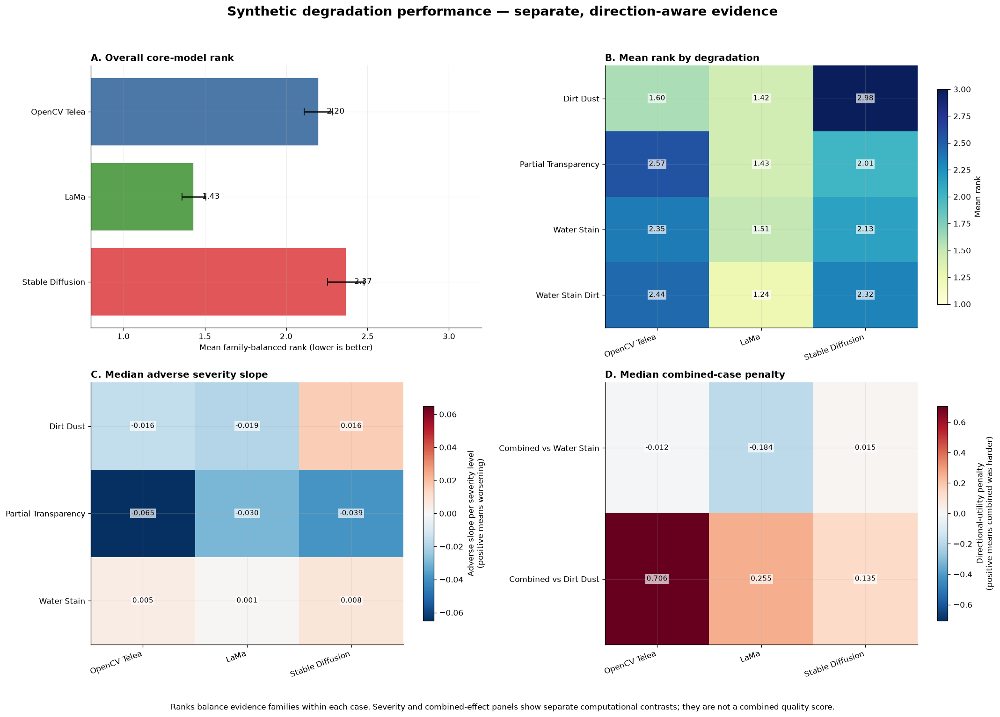

,model_id,estimate,ci_lower,ci_upper
0,opencv_telea,2.199,2.111,2.287
1,lama,1.433,1.360,1.506
2,stable_diffusion_inpainting,2.368,2.254,2.478


Canonical performance figure generated.
Path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\25_synthetic_degradation_analysis\figures\degradation_performance.png
Write attempts: 1
Panels: overall rank, degradation rank, severity slope, and combined-case penalty.


In [39]:
from matplotlib.colors import TwoSlopeNorm


CORE_MODEL_ORDER = list(
    POPULATION["model_order"]
)

CORE_MODEL_LABELS = [
    MODEL_DISPLAY[model_id]
    for model_id in CORE_MODEL_ORDER
]

CORE_MODEL_COLOURS = {
    "opencv_telea": "#4C78A8",
    "lama": "#59A14F",
    "stable_diffusion_inpainting": (
        "#E15759"
    ),
    "sdxl_inpainting": "#B279A2",
}


def annotate_heatmap(
    axis,
    matrix: np.ndarray,
    *,
    format_string: str = ".2f",
) -> None:
    """Write finite matrix values inside heatmap cells."""
    for row_index in range(
        matrix.shape[0]
    ):
        for column_index in range(
            matrix.shape[1]
        ):
            value = matrix[
                row_index,
                column_index,
            ]

            if not np.isfinite(value):
                continue

            axis.text(
                column_index,
                row_index,
                format(
                    value,
                    format_string,
                ),
                ha="center",
                va="center",
                fontsize=9,
                color="black",
                bbox={
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.68,
                    "pad": 1.5,
                },
            )


overall_rank_figure_data = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ]
        .astype(str)
        .eq("overall")
    ]
    .set_index("model_id")
    .reindex(CORE_MODEL_ORDER)
    .reset_index()
)

for column in (
    "estimate",
    "ci_lower",
    "ci_upper",
):
    overall_rank_figure_data[
        column
    ] = pd.to_numeric(
        overall_rank_figure_data[column],
        errors="coerce",
    )

family_rank_matrix = (
    CORE_CASE_RANKS_RAW.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )[
        "family_balanced_rank"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

severity_slope_matrix = (
    MODEL_SEVERITY_SUMMARY.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "single_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

combined_penalty_matrix = (
    COMBINED_COMPONENT_CONTRAST.groupby(
        [
            "component_degradation",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "combined_components"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

performance_figure, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(18, 13),
)

# Panel A — overall family-balanced rank
axis = axes[0, 0]

rank_estimates = (
    overall_rank_figure_data[
        "estimate"
    ].to_numpy(dtype=float)
)

rank_lower_errors = (
    rank_estimates
    - overall_rank_figure_data[
        "ci_lower"
    ].to_numpy(dtype=float)
)

rank_upper_errors = (
    overall_rank_figure_data[
        "ci_upper"
    ].to_numpy(dtype=float)
    - rank_estimates
)

y_positions = np.arange(
    len(CORE_MODEL_ORDER)
)

axis.barh(
    y_positions,
    rank_estimates,
    xerr=np.vstack(
        [
            rank_lower_errors,
            rank_upper_errors,
        ]
    ),
    color=[
        CORE_MODEL_COLOURS[model_id]
        for model_id in CORE_MODEL_ORDER
    ],
    edgecolor="white",
    capsize=5,
)

axis.set_yticks(
    y_positions,
    CORE_MODEL_LABELS,
)

axis.invert_yaxis()
axis.set_xlim(0.8, 3.2)
axis.set_xlabel(
    "Mean family-balanced rank "
    "(lower is better)"
)
axis.set_title(
    "A. Overall core-model rank",
    loc="left",
    fontweight="bold",
)

for position, value in zip(
    y_positions,
    rank_estimates,
):
    axis.text(
        min(value + 0.05, 3.12),
        position,
        f"{value:.2f}",
        va="center",
        fontsize=10,
    )

# Panel B — ranks by degradation family
axis = axes[0, 1]

family_rank_values = (
    family_rank_matrix.to_numpy(
        dtype=float
    )
)

family_rank_image = axis.imshow(
    family_rank_values,
    cmap="YlGnBu",
    vmin=1.0,
    vmax=3.0,
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(family_rank_matrix.index)
    ),
    [
        value.replace("_", " ").title()
        for value in family_rank_matrix.index
    ],
)

axis.set_title(
    "B. Mean rank by degradation",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    family_rank_values,
)

performance_figure.colorbar(
    family_rank_image,
    ax=axis,
    shrink=0.82,
    label="Mean rank",
)

# Panel C — adverse severity slopes
axis = axes[1, 0]

severity_values = (
    severity_slope_matrix.to_numpy(
        dtype=float
    )
)

severity_limit = max(
    float(
        np.nanmax(
            np.abs(severity_values)
        )
    ),
    1e-9,
)

severity_image = axis.imshow(
    severity_values,
    cmap="RdBu_r",
    norm=TwoSlopeNorm(
        vmin=-severity_limit,
        vcenter=0.0,
        vmax=severity_limit,
    ),
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(severity_slope_matrix.index)
    ),
    [
        value.replace("_", " ").title()
        for value
        in severity_slope_matrix.index
    ],
)

axis.set_title(
    "C. Median adverse severity slope",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    severity_values,
    format_string=".3f",
)

performance_figure.colorbar(
    severity_image,
    ax=axis,
    shrink=0.82,
    label=(
        "Adverse slope per severity level\n"
        "(positive means worsening)"
    ),
)

# Panel D — combined-versus-component penalties
axis = axes[1, 1]

combined_values = (
    combined_penalty_matrix.to_numpy(
        dtype=float
    )
)

combined_limit = max(
    float(
        np.nanmax(
            np.abs(combined_values)
        )
    ),
    1e-9,
)

combined_image = axis.imshow(
    combined_values,
    cmap="RdBu_r",
    norm=TwoSlopeNorm(
        vmin=-combined_limit,
        vcenter=0.0,
        vmax=combined_limit,
    ),
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(combined_penalty_matrix.index)
    ),
    [
        (
            "Combined vs "
            + value.replace(
                "_",
                " ",
            ).title()
        )
        for value
        in combined_penalty_matrix.index
    ],
)

axis.set_title(
    "D. Median combined-case penalty",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    combined_values,
    format_string=".3f",
)

performance_figure.colorbar(
    combined_image,
    ax=axis,
    shrink=0.82,
    label=(
        "Directional-utility penalty\n"
        "(positive means combined was harder)"
    ),
)

performance_figure.suptitle(
    (
        "Synthetic degradation performance — "
        "separate, direction-aware evidence"
    ),
    fontsize=17,
    fontweight="bold",
)

performance_figure.text(
    0.5,
    0.012,
    (
        "Ranks balance evidence families within each "
        "case. Severity and combined-effect panels show "
        "separate computational contrasts; they are not "
        "a combined quality score."
    ),
    ha="center",
    va="bottom",
    fontsize=10,
)

performance_figure.tight_layout(
    rect=(0, 0.045, 1, 0.955)
)

performance_figure_write = (
    run_with_permission_retry(
        atomic_save_matplotlib_figure,
        performance_figure,
        OUTPUT_PATHS[
            "performance_figure"
        ],
        dpi=180,
    )
)

plt.show()
plt.close(performance_figure)

display(
    overall_rank_figure_data[
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ]
    ]
)

print("Canonical performance figure generated.")
print(
    "Path: "
    f"{OUTPUT_PATHS['performance_figure']}"
)
print(
    "Write attempts: "
    f"{performance_figure_write['attempts']}"
)
print(
    "Panels: overall rank, degradation rank, "
    "severity slope, and combined-case penalty."
)

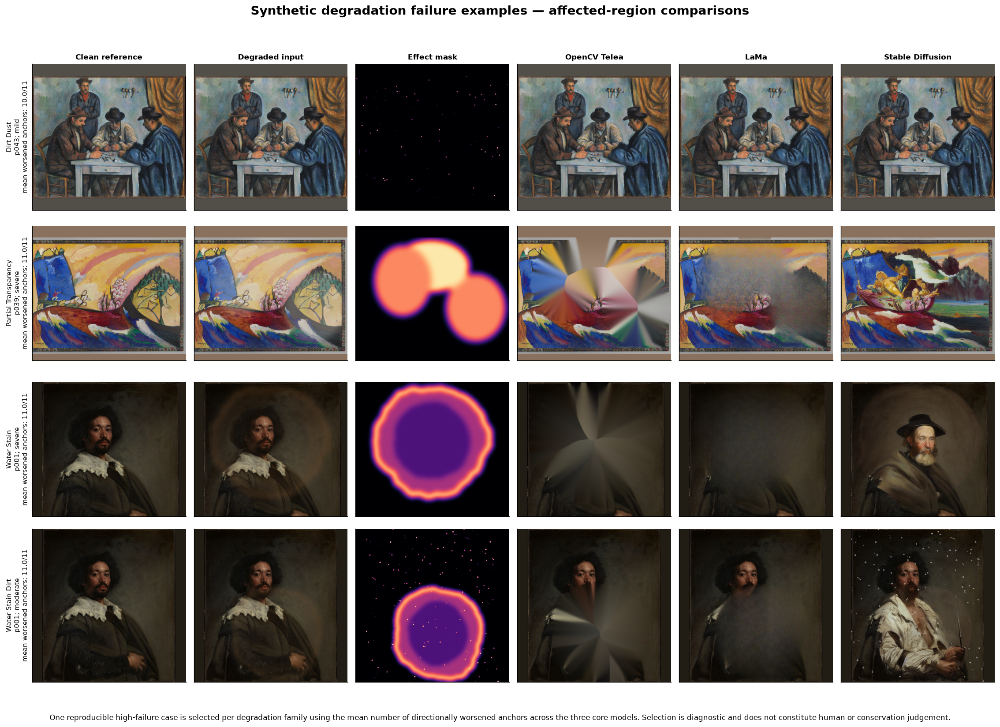

,degradation_family,case_id,painting_id,severity,mean_worsened_anchors,maximum_worsened_anchors,mean_improved_anchors,affected_content_fraction
0,dirt_dust,synthetic_degradation__p043__dirt_dust__mild,p043,mild,10.0,10,0.0,0.007719
1,partial_transparency,synthetic_degradation__p039__partial_transparency__severe,p039,severe,11.0,11,0.0,0.607221
2,water_stain,synthetic_degradation__p001__water_stain__severe,p001,severe,11.0,11,0.0,0.597747
3,water_stain_dirt,synthetic_degradation__p001__water_stain_dirt__moderate,p001,moderate,11.0,11,0.0,0.418395


Canonical failure-example figure generated.
Path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\25_synthetic_degradation_analysis\figures\degradation_failure_examples.png
Write attempts: 1
Selected degradation families: ['dirt_dust', 'partial_transparency', 'water_stain', 'water_stain_dirt']


In [40]:
core_failure_profiles = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .copy()
)

failure_case_summary = (
    core_failure_profiles.groupby(
        [
            "case_id",
            "degradation_family",
            "painting_id",
            "severity",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        mean_worsened_anchors=(
            "worsened_anchor_count",
            "mean",
        ),
        maximum_worsened_anchors=(
            "worsened_anchor_count",
            "max",
        ),
        mean_improved_anchors=(
            "improved_anchor_count",
            "mean",
        ),
        compared_models=(
            "model_id",
            "nunique",
        ),
    )
)

failure_case_metadata = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER),
        [
            "case_id",
            "input_image_path",
            "clean_image_path",
            "mask_or_effect_path",
            "severity_rank",
            "affected_content_fraction",
            "changed_content_fraction",
        ],
    ]
    .drop_duplicates("case_id")
)

failure_case_summary = (
    failure_case_summary.merge(
        failure_case_metadata,
        on="case_id",
        how="left",
        validate="one_to_one",
    )
)

failure_case_summary = (
    failure_case_summary.sort_values(
        [
            "degradation_family",
            "mean_worsened_anchors",
            "maximum_worsened_anchors",
            "severity_rank",
            "case_id",
        ],
        ascending=[
            True,
            False,
            False,
            False,
            True,
        ],
        kind="stable",
    )
)

FAILURE_FIGURE_CASES = (
    failure_case_summary.groupby(
        "degradation_family",
        sort=False,
        as_index=False,
    )
    .head(1)
    .copy()
)

family_order_lookup = {
    family: order
    for order, family in enumerate(
        POPULATION[
            "eligible_degradation_order"
        ]
    )
}

FAILURE_FIGURE_CASES[
    "_family_order"
] = (
    FAILURE_FIGURE_CASES[
        "degradation_family"
    ].map(family_order_lookup)
)

FAILURE_FIGURE_CASES = (
    FAILURE_FIGURE_CASES.sort_values(
        [
            "_family_order",
            "case_id",
        ],
        kind="stable",
    )
    .drop(columns="_family_order")
    .reset_index(drop=True)
)

failure_candidate_lookup = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in (
        SELECTED_CANDIDATES.loc[
            SELECTED_CANDIDATES[
                "model_id"
            ]
            .astype(str)
            .isin(CORE_MODEL_ORDER)
        ]
        .itertuples(index=False)
    )
}

failure_view_columns = [
    ("clean", "Clean reference"),
    ("degraded", "Degraded input"),
    ("mask", "Effect mask"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
]

failure_figure, axes = plt.subplots(
    nrows=len(FAILURE_FIGURE_CASES),
    ncols=len(failure_view_columns),
    figsize=(19, 14),
    squeeze=False,
)

for row_index, case in enumerate(
    FAILURE_FIGURE_CASES.itertuples(
        index=False
    )
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )

    degraded_rgb = load_rgb_array(
        case.input_image_path
    )

    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    x_min, y_min, x_max, y_max = (
        mask_bounding_box(
            mask_array,
            margin_fraction=0.08,
        )
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(
        failure_view_columns
    ):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            image_array = clean_rgb
            colour_map = None
        elif view_id == "degraded":
            image_array = degraded_rgb
            colour_map = None
        elif view_id == "mask":
            image_array = mask_array
            colour_map = "magma"
        else:
            candidate = (
                failure_candidate_lookup[
                    (
                        str(case.case_id),
                        view_id,
                    )
                ]
            )

            image_array = load_rgb_array(
                candidate.restored_path
            )
            colour_map = None

        cropped = image_array[
            y_min:y_max,
            x_min:x_max,
        ]

        if colour_map is None:
            axis.imshow(cropped)
        else:
            axis.imshow(
                cropped,
                cmap=colour_map,
                vmin=0,
                vmax=255,
            )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    case.degradation_family
                    .replace("_", " ")
                    .title()
                    + "\n"
                    + f"{case.painting_id}; "
                    + f"{case.severity}\n"
                    + "mean worsened anchors: "
                    + (
                        f"{case.mean_worsened_anchors:.1f}"
                        "/11"
                    )
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

failure_figure.suptitle(
    (
        "Synthetic degradation failure examples — "
        "affected-region comparisons"
    ),
    fontsize=17,
    fontweight="bold",
)

failure_figure.text(
    0.5,
    0.012,
    (
        "One reproducible high-failure case is selected "
        "per degradation family using the mean number "
        "of directionally worsened anchors across the "
        "three core models. Selection is diagnostic and "
        "does not constitute human or conservation judgement."
    ),
    ha="center",
    va="bottom",
    fontsize=10,
)

failure_figure.tight_layout(
    rect=(0, 0.045, 1, 0.955)
)

failure_figure_write = (
    run_with_permission_retry(
        atomic_save_matplotlib_figure,
        failure_figure,
        OUTPUT_PATHS[
            "failure_figure"
        ],
        dpi=180,
    )
)

plt.show()
plt.close(failure_figure)

display(
    FAILURE_FIGURE_CASES[
        [
            "degradation_family",
            "case_id",
            "painting_id",
            "severity",
            "mean_worsened_anchors",
            "maximum_worsened_anchors",
            "mean_improved_anchors",
            "affected_content_fraction",
        ]
    ]
)

print("Canonical failure-example figure generated.")
print(
    "Path: "
    f"{OUTPUT_PATHS['failure_figure']}"
)
print(
    "Write attempts: "
    f"{failure_figure_write['attempts']}"
)
print(
    "Selected degradation families: "
    f"{FAILURE_FIGURE_CASES['degradation_family'].tolist()}"
)

In [41]:
BATCH_8_STAGE = (
    "batch_8_persistence_figures_validation"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_8_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_8_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_8_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


def inspect_png(
    path: Path,
) -> dict:
    """Return independently reloaded PNG metadata."""
    with Image.open(path) as image:
        image.load()

        return {
            "format": image.format,
            "mode": image.mode,
            "width": int(image.width),
            "height": int(image.height),
            "size_bytes": int(
                path.stat().st_size
            ),
            "sha256": sha256_file(path),
        }


prior_blocking_failures = [
    check
    for check in VALIDATION.blocking_failures
    if check.validation_stage
    != BATCH_8_STAGE
]

add_batch_8_check(
    check_id="prior_batches_passed",
    description=(
        "Batches 1–7 contain no unresolved "
        "blocking failures."
    ),
    expected=0,
    observed=len(
        prior_blocking_failures
    ),
    passed=not prior_blocking_failures,
)

reloaded_analysis_validation = (
    validate_synthetic_degradation_analysis(
        RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

expected_kind_counts = {
    analysis_kind: int(
        EXPECTED[
            f"{analysis_kind}_rows"
        ]
    )
    for analysis_kind
    in SETTINGS["analysis_kinds"]
}

observed_kind_counts = {
    str(analysis_kind): int(count)
    for analysis_kind, count in (
        RELOADED_ANALYSIS.groupby(
            "analysis_kind"
        )
        .size()
        .to_dict()
        .items()
    )
}

add_batch_8_check(
    check_id="canonical_analysis_round_trip",
    description=(
        "The persisted analysis reloads with its "
        "complete schema and exact 4,695-row contract."
    ),
    expected={
        "passed": True,
        "rows": 4695,
        "analysis_kinds": 17,
    },
    observed={
        "passed": bool(
            reloaded_analysis_validation[
                "passed"
            ]
        ),
        "rows": len(
            RELOADED_ANALYSIS
        ),
        "analysis_kinds": int(
            RELOADED_ANALYSIS[
                "analysis_kind"
            ].nunique()
        ),
    },
    passed=(
        bool(
            reloaded_analysis_validation[
                "passed"
            ]
        )
        and len(RELOADED_ANALYSIS)
        == int(
            EXPECTED[
                "canonical_analysis_rows"
            ]
        )
        and RELOADED_ANALYSIS[
            "analysis_kind"
        ].nunique()
        == 17
    ),
)

add_batch_8_check(
    check_id="canonical_row_identity_and_kinds",
    description=(
        "Round-trip identifiers and all 17 "
        "analysis-kind counts are unchanged."
    ),
    expected={
        "identifier_sets_match": True,
        "kind_counts": (
            expected_kind_counts
        ),
    },
    observed={
        "identifier_sets_match": bool(
            round_trip_ids_match
        ),
        "kind_counts": (
            observed_kind_counts
        ),
    },
    passed=(
        round_trip_ids_match
        and observed_kind_counts
        == expected_kind_counts
    ),
)

performance_figure_info = inspect_png(
    OUTPUT_PATHS[
        "performance_figure"
    ]
)

failure_figure_info = inspect_png(
    OUTPUT_PATHS[
        "failure_figure"
    ]
)

figure_information = {
    "performance_figure": (
        performance_figure_info
    ),
    "failure_figure": (
        failure_figure_info
    ),
}

figure_integrity_passed = all(
    information["format"] == "PNG"
    and information["width"] >= 2000
    and information["height"] >= 1200
    and information["size_bytes"] > 50_000
    for information
    in figure_information.values()
)

add_batch_8_check(
    check_id="canonical_figure_integrity",
    description=(
        "Both canonical analytical figures reload as "
        "substantial high-resolution PNG files."
    ),
    expected={
        "figures": 2,
        "format": "PNG",
        "minimum_width": 2000,
        "minimum_height": 1200,
        "minimum_size_bytes": 50_000,
    },
    observed=figure_information,
    passed=(
        len(figure_information) == 2
        and figure_integrity_passed
    ),
)

performance_panel_counts = {
    "overall_rank_rows": len(
        overall_rank_figure_data
    ),
    "degradation_model_cells": int(
        family_rank_matrix.notna()
        .sum()
        .sum()
    ),
    "severity_model_cells": int(
        severity_slope_matrix.notna()
        .sum()
        .sum()
    ),
    "combined_component_model_cells": int(
        combined_penalty_matrix.notna()
        .sum()
        .sum()
    ),
}

add_batch_8_check(
    check_id="performance_figure_evidence_coverage",
    description=(
        "The performance figure covers the complete "
        "core overall, degradation, severity, and "
        "combined-component summaries."
    ),
    expected={
        "overall_rank_rows": 3,
        "degradation_model_cells": 12,
        "severity_model_cells": 9,
        "combined_component_model_cells": 6,
    },
    observed=performance_panel_counts,
    passed=(
        performance_panel_counts
        == {
            "overall_rank_rows": 3,
            "degradation_model_cells": 12,
            "severity_model_cells": 9,
            "combined_component_model_cells": 6,
        }
    ),
)

failure_figure_coverage = {
    "rows": len(
        FAILURE_FIGURE_CASES
    ),
    "unique_cases": int(
        FAILURE_FIGURE_CASES[
            "case_id"
        ].nunique()
    ),
    "degradation_families": sorted(
        FAILURE_FIGURE_CASES[
            "degradation_family"
        ].astype(str).unique()
    ),
    "core_models_per_case": sorted(
        FAILURE_FIGURE_CASES[
            "case_id"
        ]
        .map(
            core_failure_profiles.groupby(
                "case_id"
            )["model_id"].nunique()
        )
        .astype(int)
        .unique()
        .tolist()
    ),
}

add_batch_8_check(
    check_id="failure_figure_evidence_coverage",
    description=(
        "The failure figure contains one deterministic "
        "case for every eligible degradation family "
        "with all three core models."
    ),
    expected={
        "rows": 4,
        "unique_cases": 4,
        "degradation_families": sorted(
            POPULATION[
                "eligible_degradation_order"
            ]
        ),
        "core_models_per_case": [3],
    },
    observed=failure_figure_coverage,
    passed=(
        failure_figure_coverage[
            "rows"
        ]
        == 4
        and failure_figure_coverage[
            "unique_cases"
        ]
        == 4
        and failure_figure_coverage[
            "degradation_families"
        ]
        == sorted(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
        and failure_figure_coverage[
            "core_models_per_case"
        ]
        == [3]
    ),
)

runtime_ranking_rows = int(
    RELOADED_ANALYSIS.loc[
        RELOADED_ANALYSIS[
            "analysis_kind"
        ]
        .astype(str)
        .isin(
            [
                "candidate_runtime",
                "runtime_summary",
            ]
        ),
        "quality_ranking_eligible",
    ]
    .fillna(False)
    .astype(bool)
    .sum()
)

uncertainty_analysis_rows = int(
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .astype(str)
    .str.contains(
        "uncertainty",
        case=False,
        regex=False,
    )
    .sum()
)

sdxl_scope_rows = (
    RELOADED_ANALYSIS.loc[
        RELOADED_ANALYSIS[
            "analysis_kind"
        ]
        .astype(str)
        .isin(
            [
                "sdxl_subset_case_rank",
                "sdxl_subset_anchor_summary",
            ]
        )
    ]
)

sdxl_scope_is_bounded = bool(
    len(sdxl_scope_rows) == 68
    and sdxl_scope_rows[
        "population_id"
    ]
    .astype(str)
    .eq(
        "sdxl_partial_six_case"
    )
    .all()
    and sdxl_scope_rows[
        "coverage_role"
    ]
    .astype(str)
    .eq(
        "bounded_sdxl_subset"
    )
    .all()
)

add_batch_8_check(
    check_id="scientific_scope_safeguards",
    description=(
        "Runtime remains outside quality ranking, "
        "uncertainty remains unavailable, and SDXL "
        "remains a bounded descriptive subset."
    ),
    expected={
        "runtime_ranking_rows": 0,
        "uncertainty_rows": 0,
        "sdxl_rows": 68,
        "sdxl_scope_bounded": True,
        "combined_quality_score": False,
    },
    observed={
        "runtime_ranking_rows": (
            runtime_ranking_rows
        ),
        "uncertainty_rows": (
            uncertainty_analysis_rows
        ),
        "sdxl_rows": len(
            sdxl_scope_rows
        ),
        "sdxl_scope_bounded": (
            sdxl_scope_is_bounded
        ),
        "combined_quality_score": bool(
            STATISTICS[
                "combined_quality_score_retained"
            ]
        ),
    },
    passed=(
        runtime_ranking_rows == 0
        and uncertainty_analysis_rows == 0
        and sdxl_scope_is_bounded
        and not bool(
            STATISTICS[
                "combined_quality_score_retained"
            ]
        )
    ),
)

expected_batch_8_files = {
    OUTPUT_PATHS["metrics"].resolve(),
    OUTPUT_PATHS[
        "performance_figure"
    ].resolve(),
    OUTPUT_PATHS[
        "failure_figure"
    ].resolve(),
}

observed_batch_8_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

temporary_batch_8_files = [
    path
    for path in observed_batch_8_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

add_batch_8_check(
    check_id="batch_8_output_scope",
    description=(
        "Only the canonical analysis CSV and two "
        "canonical figures exist after Batch 8."
    ),
    expected={
        "canonical_files": 3,
        "temporary_files": 0,
        "work_files": 0,
    },
    observed={
        "canonical_files": len(
            observed_batch_8_files
        ),
        "temporary_files": len(
            temporary_batch_8_files
        ),
        "work_files": len(
            work_files
        ),
    },
    passed=(
        observed_batch_8_files
        == expected_batch_8_files
        and not temporary_batch_8_files
        and not work_files
    ),
)

BATCH_8_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_8_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_8_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 8 passed.")
print(
    "Batch 8 checks: "
    f"{len(BATCH_8_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_8_CHECKS['passed']).sum())}"
)
print(
    "Persisted analysis rows: "
    f"{len(RELOADED_ANALYSIS):,}"
)
print(
    "Performance figure: "
    f"{performance_figure_info}"
)
print(
    "Failure figure: "
    f"{failure_figure_info}"
)
print(
    "Canonical files written: "
    f"{len(observed_batch_8_files)}"
)
print(
    "Next batch: approved-mock-aligned report, "
    "manifests, consolidated validation, and "
    "final completion traceability."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_persistence_figures_validation,prior_batches_passed,Batches 1–7 contain no unresolved blocking failures.,blocking,0,0,True,
1,batch_8_persistence_figures_validation,canonical_analysis_round_trip,"The persisted analysis reloads with its complete schema and exact 4,695-row contract.",blocking,"{""analysis_kinds"": 17, ""passed"": true, ""rows"": 4695}","{""analysis_kinds"": 17, ""passed"": true, ""rows"": 4695}",True,
2,batch_8_persistence_figures_validation,canonical_row_identity_and_kinds,Round-trip identifiers and all 17 analysis-kind counts are unchanged.,blocking,"{""identifier_sets_match"": true, ""kind_counts"": {""affected_area_association"": 99, ""candidate_failure_profile"": 156, ""candidate_quality_anchor"": 171...","{""identifier_sets_match"": true, ""kind_counts"": {""affected_area_association"": 99, ""candidate_failure_profile"": 156, ""candidate_quality_anchor"": 171...",True,
3,batch_8_persistence_figures_validation,canonical_figure_integrity,Both canonical analytical figures reload as substantial high-resolution PNG files.,blocking,"{""figures"": 2, ""format"": ""PNG"", ""minimum_height"": 1200, ""minimum_size_bytes"": 50000, ""minimum_width"": 2000}","{""failure_figure"": {""format"": ""PNG"", ""height"": 2475, ""mode"": ""RGBA"", ""sha256"": ""a8b9851ac581c1c9177fabb96571a56499185da3ebc4973c30d785f5cfc77750"",...",True,
4,batch_8_persistence_figures_validation,performance_figure_evidence_coverage,"The performance figure covers the complete core overall, degradation, severity, and combined-component summaries.",blocking,"{""combined_component_model_cells"": 6, ""degradation_model_cells"": 12, ""overall_rank_rows"": 3, ""severity_model_cells"": 9}","{""combined_component_model_cells"": 6, ""degradation_model_cells"": 12, ""overall_rank_rows"": 3, ""severity_model_cells"": 9}",True,
5,batch_8_persistence_figures_validation,failure_figure_evidence_coverage,The failure figure contains one deterministic case for every eligible degradation family with all three core models.,blocking,"{""core_models_per_case"": [3], ""degradation_families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""rows"": 4, ""unique...","{""core_models_per_case"": [3], ""degradation_families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""rows"": 4, ""unique...",True,
6,batch_8_persistence_figures_validation,scientific_scope_safeguards,"Runtime remains outside quality ranking, uncertainty remains unavailable, and SDXL remains a bounded descriptive subset.",blocking,"{""combined_quality_score"": false, ""runtime_ranking_rows"": 0, ""sdxl_rows"": 68, ""sdxl_scope_bounded"": true, ""uncertainty_rows"": 0}","{""combined_quality_score"": false, ""runtime_ranking_rows"": 0, ""sdxl_rows"": 68, ""sdxl_scope_bounded"": true, ""uncertainty_rows"": 0}",True,
7,batch_8_persistence_figures_validation,batch_8_output_scope,Only the canonical analysis CSV and two canonical figures exist after Batch 8.,blocking,"{""canonical_files"": 3, ""temporary_files"": 0, ""work_files"": 0}","{""canonical_files"": 3, ""temporary_files"": 0, ""work_files"": 0}",True,


Batch 8 passed.
Batch 8 checks: 8
Blocking failures: 0
Persisted analysis rows: 4,695
Performance figure: {'format': 'PNG', 'mode': 'RGBA', 'width': 3200, 'height': 2301, 'size_bytes': 323014, 'sha256': 'f4200f9a774d79aee656f94f229e4ab850703e9f0b089b3705566341773a70c1'}
Failure figure: {'format': 'PNG', 'mode': 'RGBA', 'width': 3402, 'height': 2475, 'size_bytes': 6400203, 'sha256': 'a8b9851ac581c1c9177fabb96571a56499185da3ebc4973c30d785f5cfc77750'}
Canonical files written: 3
Next batch: approved-mock-aligned report, manifests, consolidated validation, and final completion traceability.


## Batch 9 — Approved-mock report, manifests, and completion gate

Build the final self-contained HTML report using the approved mock as its binding structural baseline.

The final report preserves the approved section order, visual roles, conclusion placement, evidence-to-assertion pattern, and thesis synthesis. Enhancements are additive: fictional mock values are replaced with validated Notebook 25 evidence, report-only plots and restoration panels are embedded, and technical provenance is expanded.

After validating the standalone report, persist the consolidated validation table, artifact manifest, run manifest, and project-path registrations.

In [42]:
import base64
import io
import re
from html import escape

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_path,
)
from restoration_eval.multi_model_comparison import (
    image_grid_to_data_uri,
    image_path_to_data_uri,
)
from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    load_project_paths_registry,
    to_repo_relative,
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)
from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    VALIDATION_SCHEMA_VERSION,
)


MOCK_TO_FINAL_TRACEABILITY = pd.DataFrame(
    [
        (
            1,
            "executive_findings",
            "Executive findings",
            (
                "Headline indicators, main conclusions, "
                "canonical performance figure, and scope warning"
            ),
            (
                "Canonical ranks, anchor winners, spillover, "
                "SDXL scope, and uncertainty availability"
            ),
        ),
        (
            2,
            "what_was_evaluated",
            "What was evaluated?",
            (
                "Population arithmetic, eligibility, methods, "
                "evidence families, and independent-unit boundary"
            ),
            (
                "Eligibility audit, selected candidates, "
                "quality-anchor registry"
            ),
        ),
        (
            3,
            "procedural_input_severity",
            "Procedural input severity",
            (
                "Affected-area summaries, input/mask overview, "
                "and severity ladder"
            ),
            (
                "Notebook 07 cases and Notebook 08 eligibility"
            ),
        ),
        (
            4,
            "overall_core_model_performance",
            "Overall core-model performance",
            (
                "Overall family-balanced ranks, confidence "
                "intervals, and direct model conclusion"
            ),
            (
                "Core rank summaries and paired anchor evidence"
            ),
        ),
        (
            5,
            "behaviour_by_degradation",
            "Behaviour by degradation",
            (
                "Per-family rankings, four restoration atlases, "
                "and family-level conclusions"
            ),
            (
                "Case ranks and candidate restorations"
            ),
        ),
        (
            6,
            "severity_and_affected_area",
            "Severity and affected area",
            (
                "Severity slopes, affected-area associations, "
                "inference status, and interpretation"
            ),
            (
                "Model severity summaries and area associations"
            ),
        ),
        (
            7,
            "combined_versus_individual",
            "Combined versus individual degradations",
            (
                "Combined-component contrasts, restoration "
                "atlas, conclusions, and physical-scope warning"
            ),
            (
                "Combined-component contrast evidence"
            ),
        ),
        (
            8,
            "evidence_beyond_pixel_similarity",
            "Evidence beyond pixel similarity",
            (
                "Anchor winners across pixel, perceptual, "
                "feature, colour, seam, texture, and semantic evidence"
            ),
            (
                "Eleven predeclared quality anchors and "
                "Notebook 21 disagreement evidence"
            ),
        ),
        (
            9,
            "failures_and_metric_disagreement",
            "Failures and metric disagreement",
            (
                "Candidate failure profiles, canonical failure "
                "figure, representative atlas, and visual conclusions"
            ),
            (
                "Candidate anchor-direction profiles and "
                "stored restoration images"
            ),
        ),
        (
            10,
            "sdxl_bounded_subset",
            "SDXL bounded subset",
            (
                "Six-case four-model comparison, restoration "
                "atlas, and explicit non-generalizability"
            ),
            (
                "Bounded SDXL ranks and anchor summaries"
            ),
        ),
        (
            11,
            "compute_and_quality",
            "Compute and quality",
            (
                "Runtime summaries separated from quality "
                "ranking and operational interpretation"
            ),
            (
                "Candidate runtime and runtime summaries"
            ),
        ),
        (
            12,
            "painting_specific_behaviour",
            "Painting-specific behaviour",
            (
                "Painting-level rank profiles, visual atlas, "
                "and painting/category confounding warning"
            ),
            (
                "Painting-scope ranks and selected restorations"
            ),
        ),
        (
            13,
            "supported_conclusions_and_limits",
            "Supported conclusions and limits",
            (
                "Binary evidence-backed conclusions, unsupported "
                "claims, and limitations"
            ),
            (
                "All validated Notebook 25 evidence"
            ),
        ),
        (
            14,
            "contribution_to_thesis",
            "Contribution to the thesis",
            (
                "RQ1, RQ2, and RQ3 synthesis with explicit "
                "coverage boundaries"
            ),
            (
                "Proposal questions and roadmap extensions"
            ),
        ),
        (
            15,
            "technical_provenance",
            "Technical provenance",
            (
                "Methods, source notebooks, schemas, row "
                "contracts, traceability, and reproducibility"
            ),
            (
                "Run manifests, configuration, analysis table, "
                "and validation evidence"
            ),
        ),
    ],
    columns=[
        "mock_order",
        "mock_element_id",
        "mock_section",
        "approved_role",
        "canonical_evidence_source",
    ],
)

MOCK_TO_FINAL_TRACEABILITY[
    "final_section"
] = MOCK_TO_FINAL_TRACEABILITY[
    "mock_element_id"
]

MOCK_TO_FINAL_TRACEABILITY[
    "implementation_status"
] = "upgraded_additively"

MOCK_TO_FINAL_TRACEABILITY[
    "deviation_reason"
] = ""

EXPECTED_REPORT_SECTION_ORDER = (
    MOCK_TO_FINAL_TRACEABILITY.sort_values(
        "mock_order"
    )["mock_element_id"]
    .astype(str)
    .tolist()
)


def dataframe_to_report_html(
    frame: pd.DataFrame,
) -> str:
    """Render a compact escaped report table."""
    return frame.to_html(
        index=False,
        border=0,
        classes="data-table",
        escape=True,
        na_rep="—",
    )


def figure_to_data_uri(
    figure,
    *,
    dpi: int = 145,
) -> str:
    """Encode an in-memory analytical figure as PNG."""
    buffer = io.BytesIO()

    figure.savefig(
        buffer,
        format="png",
        dpi=int(dpi),
        bbox_inches="tight",
        facecolor="white",
    )

    payload = base64.b64encode(
        buffer.getvalue()
    ).decode("ascii")

    buffer.close()

    return (
        "data:image/png;base64,"
        + payload
    )


def atomic_write_text(
    text: str,
    output_path: Path,
) -> Path:
    """Persist UTF-8 text atomically inside the output root."""
    destination = Path(output_path)

    if not destination.resolve().is_relative_to(
        OUTPUT_ROOT
    ):
        raise ValueError(
            "Text destination is outside the "
            "Notebook 25 output root."
        )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = destination.with_name(
        destination.name + ".tmp"
    )

    try:
        temporary.write_text(
            text,
            encoding="utf-8",
            newline="\n",
        )

        os.replace(
            temporary,
            destination,
        )

    finally:
        temporary.unlink(
            missing_ok=True
        )

    return destination


ANALYTICAL_VIEWS = []
REPORT_VISUAL_PANELS = []


def register_analytical_view(
    *,
    view_id: str,
    title: str,
    caption: str,
    source: str,
    data_uri: str,
    tile_count: int = 1,
) -> None:
    ANALYTICAL_VIEWS.append(
        {
            "view_id": view_id,
            "title": title,
            "caption": caption,
            "source": source,
            "data_uri": data_uri,
            "tile_count": int(
                tile_count
            ),
        }
    )


def register_report_panel(
    *,
    panel_id: str,
    title: str,
    caption: str,
    items,
    columns: int,
) -> None:
    REPORT_VISUAL_PANELS.append(
        {
            "panel_id": panel_id,
            "title": title,
            "caption": caption,
            "tile_count": len(items),
            "data_uri": (
                image_grid_to_data_uri(
                    items,
                    columns=int(columns),
                    tile_size=(300, 235),
                    quality=79,
                )
            ),
        }
    )

    print(
        "Report panel prepared: "
        f"{panel_id} "
        f"({len(items)} tiles)"
    )


def model_display(
    model_id: str,
) -> str:
    return MODEL_DISPLAY.get(
        str(model_id),
        str(model_id)
        .replace("_", " ")
        .title(),
    )


def grouped_bar_data_uri(
    pivot: pd.DataFrame,
    *,
    title: str,
    y_label: str,
    zero_line: bool = False,
) -> str:
    """Render a model-grouped bar chart from a matrix."""
    figure, axis = plt.subplots(
        figsize=(10.5, 5.8)
    )

    colours = [
        CORE_MODEL_COLOURS.get(
            str(column),
            "#777777",
        )
        for column in pivot.columns
    ]

    plot_frame = pivot.copy()

    plot_frame.columns = [
        model_display(column)
        for column in plot_frame.columns
    ]

    plot_frame.index = [
        str(value)
        .replace("_", " ")
        .title()
        for value in plot_frame.index
    ]

    plot_frame.plot(
        kind="bar",
        ax=axis,
        color=colours,
        edgecolor="white",
        width=0.78,
    )

    if zero_line:
        axis.axhline(
            0.0,
            color="#222222",
            linewidth=1.0,
        )

    axis.set_title(
        title,
        fontweight="bold",
    )
    axis.set_xlabel("")
    axis.set_ylabel(y_label)
    axis.tick_params(
        axis="x",
        rotation=20,
    )
    axis.legend(
        frameon=False,
        ncol=min(
            4,
            len(plot_frame.columns),
        ),
    )
    axis.grid(
        axis="x",
        visible=False,
    )

    figure.tight_layout()

    data_uri = figure_to_data_uri(
        figure
    )

    plt.close(figure)

    return data_uri


def single_bar_data_uri(
    values: pd.Series,
    *,
    title: str,
    y_label: str,
    lower_is_better: bool = False,
) -> str:
    """Render one deterministic labelled bar plot."""
    series = values.copy()

    labels = [
        model_display(value)
        for value in series.index
    ]

    colours = [
        CORE_MODEL_COLOURS.get(
            str(model_id),
            "#777777",
        )
        for model_id in series.index
    ]

    figure, axis = plt.subplots(
        figsize=(9.5, 5.4)
    )

    positions = np.arange(
        len(series)
    )

    axis.bar(
        positions,
        series.to_numpy(dtype=float),
        color=colours,
        edgecolor="white",
    )

    axis.set_xticks(
        positions,
        labels,
        rotation=18,
        ha="right",
    )

    axis.set_title(
        title,
        fontweight="bold",
    )
    axis.set_ylabel(y_label)
    axis.grid(
        axis="x",
        visible=False,
    )

    for position, value in zip(
        positions,
        series.to_numpy(dtype=float),
    ):
        axis.text(
            position,
            value,
            f"{value:.3f}",
            ha="center",
            va=(
                "bottom"
                if value >= 0
                else "top"
            ),
            fontsize=9,
        )

    if lower_is_better:
        axis.text(
            0.99,
            0.98,
            "Lower is better",
            transform=axis.transAxes,
            ha="right",
            va="top",
            fontsize=9,
            color="#58677a",
        )

    figure.tight_layout()

    data_uri = figure_to_data_uri(
        figure
    )

    plt.close(figure)

    return data_uri


print("Batch 9 report infrastructure initialized.")
print(
    "Approved mock sections: "
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Section order: "
    f"{EXPECTED_REPORT_SECTION_ORDER}"
)

Batch 9 report infrastructure initialized.
Approved mock sections: 15
Section order: ['executive_findings', 'what_was_evaluated', 'procedural_input_severity', 'overall_core_model_performance', 'behaviour_by_degradation', 'severity_and_affected_area', 'combined_versus_individual', 'evidence_beyond_pixel_similarity', 'failures_and_metric_disagreement', 'sdxl_bounded_subset', 'compute_and_quality', 'painting_specific_behaviour', 'supported_conclusions_and_limits', 'contribution_to_thesis', 'technical_provenance']


In [44]:
# Make this cell safe to rerun after partial execution.
ANALYTICAL_VIEWS.clear()


def add_grouped_report_view(
    *,
    view_id,
    title,
    caption,
    source,
    matrix,
    plot_title,
    y_label,
    zero_line=False,
):
    register_analytical_view(
        view_id=view_id,
        title=title,
        caption=caption,
        source=source,
        data_uri=grouped_bar_data_uri(
            matrix,
            title=plot_title,
            y_label=y_label,
            zero_line=zero_line,
        ),
    )


def add_single_report_view(
    *,
    view_id,
    title,
    caption,
    source,
    values,
    plot_title,
    y_label,
    lower_is_better=False,
):
    register_analytical_view(
        view_id=view_id,
        title=title,
        caption=caption,
        source=source,
        data_uri=single_bar_data_uri(
            values,
            title=plot_title,
            y_label=y_label,
            lower_is_better=(
                lower_is_better
            ),
        ),
    )


# ---------------------------------------------------------------------------
# Canonical figures
# ---------------------------------------------------------------------------

register_analytical_view(
    view_id="canonical_performance",
    title=(
        "Canonical synthetic-degradation "
        "performance summary"
    ),
    caption=(
        "Overall family-balanced rank, degradation-"
        "specific rank, adverse severity slopes, and "
        "combined-component contrasts remain separate."
    ),
    source=(
        "Notebook 25 canonical figure: "
        "degradation_performance.png"
    ),
    data_uri=image_path_to_data_uri(
        OUTPUT_PATHS[
            "performance_figure"
        ],
        max_dimension=1700,
        photographic_format="JPEG",
        quality=88,
    ),
    tile_count=4,
)

register_analytical_view(
    view_id="canonical_failures",
    title=(
        "Canonical affected-region failure examples"
    ),
    caption=(
        "One deterministic high-failure case per "
        "eligible degradation family, with clean, "
        "degraded, mask, and three-model context."
    ),
    source=(
        "Notebook 25 canonical figure: "
        "degradation_failure_examples.png"
    ),
    data_uri=image_path_to_data_uri(
        OUTPUT_PATHS[
            "failure_figure"
        ],
        max_dimension=1800,
        photographic_format="JPEG",
        quality=86,
    ),
    tile_count=24,
)

print("Analytical view progress: 2/14")


# ---------------------------------------------------------------------------
# Eligibility overview
# ---------------------------------------------------------------------------

eligibility_plot_data = (
    ELIGIBILITY_CASE_MODEL.assign(
        eligible_flag=pd.to_numeric(
            ELIGIBILITY_CASE_MODEL[
                "estimate"
            ],
            errors="coerce",
        ).eq(1)
    )
    .groupby("model_id")
    .agg(
        eligible=(
            "eligible_flag",
            "sum",
        ),
        total=(
            "analysis_row_id",
            "size",
        ),
    )
)

eligibility_plot_data[
    "excluded"
] = (
    eligibility_plot_data["total"]
    - eligibility_plot_data["eligible"]
)

eligibility_plot_frame = (
    eligibility_plot_data[
        [
            "eligible",
            "excluded",
        ]
    ]
    .reindex(
        POPULATION["all_model_order"]
    )
)

eligibility_plot_frame.index = [
    model_display(model_id)
    for model_id
    in eligibility_plot_frame.index
]

eligibility_figure, eligibility_axis = (
    plt.subplots(
        figsize=(9.5, 5.4)
    )
)

eligibility_plot_frame.plot(
    kind="bar",
    stacked=True,
    ax=eligibility_axis,
    color=[
        "#59A14F",
        "#D9DEE5",
    ],
    edgecolor="white",
)

eligibility_axis.set_title(
    "Eligibility decisions by model",
    fontweight="bold",
)
eligibility_axis.set_xlabel("")
eligibility_axis.set_ylabel(
    "Generated synthetic cases"
)
eligibility_axis.tick_params(
    axis="x",
    rotation=18,
)
eligibility_axis.legend(
    frameon=False
)
eligibility_axis.grid(
    axis="x",
    visible=False,
)

eligibility_figure.tight_layout()

register_analytical_view(
    view_id="eligibility_overview",
    title=(
        "Eligibility is not the same as failure"
    ),
    caption=(
        "Only eligibility-approved localized "
        "degradations enter restoration comparison. "
        "Excluded combinations are scope decisions, "
        "not failed restorations."
    ),
    source=(
        "Canonical eligibility_case_model rows"
    ),
    data_uri=figure_to_data_uri(
        eligibility_figure
    ),
)

plt.close(eligibility_figure)

print("Analytical view progress: 3/14")


# ---------------------------------------------------------------------------
# Procedural input area and severity
# ---------------------------------------------------------------------------

DESIGN_CASES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .drop_duplicates("case_id")
    .copy()
)

input_area_matrix = (
    DESIGN_CASES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        sort=True,
    )[
        "affected_content_fraction"
    ]
    .median()
    .unstack("severity")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=POPULATION[
            "severity_order"
        ],
    )
)

add_grouped_report_view(
    view_id="input_area_severity",
    title=(
        "Affected content by degradation "
        "and configured severity"
    ),
    caption=(
        "Configured severity is ordinal. Affected "
        "area differs across families and is not an "
        "independent conservation-condition scale."
    ),
    source=(
        "Notebook 07 case geometry joined through "
        "the selected Notebook 25 population"
    ),
    matrix=input_area_matrix,
    plot_title=(
        "Median affected-content fraction"
    ),
    y_label=(
        "Affected content fraction"
    ),
)

print("Analytical view progress: 4/14")


# ---------------------------------------------------------------------------
# Core-model ranks
# ---------------------------------------------------------------------------

overall_rank_series = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ]
        .astype(str)
        .eq("overall")
    ]
    .set_index("model_id")[
        "estimate"
    ]
    .astype(float)
    .reindex(CORE_MODEL_ORDER)
)

add_single_report_view(
    view_id="overall_core_rank",
    title="Overall core-model ranking",
    caption=(
        "Ranks balance evidence families within each "
        "case. Lower values indicate a better relative "
        "position, not a calibrated quality distance."
    ),
    source=(
        "Canonical core_rank_summary rows"
    ),
    values=overall_rank_series,
    plot_title=(
        "Overall mean family-balanced rank"
    ),
    y_label="Mean rank",
    lower_is_better=True,
)

add_grouped_report_view(
    view_id="degradation_family_rank",
    title=(
        "Performance differs by degradation"
    ),
    caption=(
        "Mean family-balanced rank is shown separately "
        "for each eligible degradation family."
    ),
    source=(
        "Core case-family-balanced ranks"
    ),
    matrix=family_rank_matrix,
    plot_title=(
        "Core-model rank by degradation family"
    ),
    y_label=(
        "Mean family-balanced rank "
        "(lower is better)"
    ),
)

print("Analytical view progress: 6/14")


# ---------------------------------------------------------------------------
# Severity and affected-area evidence
# ---------------------------------------------------------------------------

add_grouped_report_view(
    view_id="severity_slopes",
    title="Adverse severity slopes",
    caption=(
        "Positive values mean that directional utility "
        "became worse as configured severity increased. "
        "Negative values indicate a non-monotonic or "
        "opposite descriptive pattern."
    ),
    source=(
        "Canonical model_severity_summary rows"
    ),
    matrix=severity_slope_matrix,
    plot_title=(
        "Median adverse slope per severity level"
    ),
    y_label="Adverse slope",
    zero_line=True,
)

affected_area_matrix = (
    AFFECTED_AREA_ASSOCIATION.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "single_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="affected_area_associations",
    title="Affected-area associations",
    caption=(
        "Within-family clustered Spearman associations "
        "are descriptive. Positive values mean larger "
        "affected areas tended to coincide with more "
        "adverse evidence."
    ),
    source=(
        "Canonical affected_area_association rows"
    ),
    matrix=affected_area_matrix,
    plot_title=(
        "Median affected-area association"
    ),
    y_label=(
        "Median clustered Spearman rho"
    ),
    zero_line=True,
)

print("Analytical view progress: 8/14")


# ---------------------------------------------------------------------------
# Combined-component evidence
# ---------------------------------------------------------------------------

add_grouped_report_view(
    view_id="combined_component_penalties",
    title=(
        "Combined-versus-component penalties"
    ),
    caption=(
        "Positive values mean the ordered combined "
        "computational case was harder than the named "
        "single component. These are not physical "
        "interaction estimates."
    ),
    source=(
        "Canonical combined_component_contrast rows"
    ),
    matrix=combined_penalty_matrix,
    plot_title=(
        "Median combined-case performance penalty"
    ),
    y_label=(
        "Directional-utility penalty"
    ),
    zero_line=True,
)

print("Analytical view progress: 9/14")


# ---------------------------------------------------------------------------
# Metric disagreement
# ---------------------------------------------------------------------------

anchor_winner_counts = (
    OUR_CORE_ANCHOR_WINNERS[
        "winner_model_id"
    ]
    .value_counts()
    .reindex(
        CORE_MODEL_ORDER,
        fill_value=0,
    )
    .astype(float)
)

add_single_report_view(
    view_id="anchor_winner_counts",
    title=(
        "Different evidence families select "
        "different models"
    ),
    caption=(
        "The eleven predeclared anchors retain pixel, "
        "perceptual, feature, spatial, colour, texture, "
        "seam, semantic, and structural disagreement."
    ),
    source=(
        "Notebook 21 winner cross-check reproduced "
        "from Notebook 25 anchor evidence"
    ),
    values=anchor_winner_counts,
    plot_title=(
        "Number of overall anchor wins"
    ),
    y_label="Anchor wins out of 11",
)

print("Analytical view progress: 10/14")


# ---------------------------------------------------------------------------
# Candidate failure profiles
# ---------------------------------------------------------------------------

failure_profile_matrix = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )[
        "worsened_anchor_count"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="failure_profiles",
    title=(
        "Candidate-level failure profiles"
    ),
    caption=(
        "The mean number of directionally worsened "
        "anchors is retained separately from improved "
        "and tied counts. It is a diagnostic profile, "
        "not a human failure label."
    ),
    source=(
        "Canonical candidate_failure_profile evidence"
    ),
    matrix=failure_profile_matrix,
    plot_title=(
        "Mean worsened anchors by degradation"
    ),
    y_label=(
        "Mean worsened anchors out of 11"
    ),
)

print("Analytical view progress: 11/14")


# ---------------------------------------------------------------------------
# Bounded SDXL ranking
# ---------------------------------------------------------------------------

sdxl_rank_series = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "model_id"
    )[
        "family_balanced_rank"
    ]
    .mean()
    .reindex(
        POPULATION["all_model_order"]
    )
)

add_single_report_view(
    view_id="sdxl_bounded_rank",
    title="Bounded SDXL subset",
    caption=(
        "Four-model ranks cover only six predeclared "
        "cases. They describe this subset and cannot "
        "support a full SDXL comparison."
    ),
    source=(
        "Canonical sdxl_subset_case_rank rows"
    ),
    values=sdxl_rank_series,
    plot_title=(
        "Mean rank in the six-case SDXL subset"
    ),
    y_label="Mean rank",
    lower_is_better=True,
)

print("Analytical view progress: 12/14")


# ---------------------------------------------------------------------------
# Runtime evidence
# ---------------------------------------------------------------------------

runtime_series = (
    RUNTIME_ENRICHED.assign(
        runtime_seconds=pd.to_numeric(
            RUNTIME_ENRICHED[
                "comparison_value"
            ],
            errors="coerce",
        )
    )
    .groupby("model_id")[
        "runtime_seconds"
    ]
    .median()
    .reindex(
        POPULATION["all_model_order"]
    )
)

if runtime_series.isna().any():
    raise ValueError(
        "Runtime report series contains missing values: "
        f"{runtime_series.to_dict()}"
    )

add_single_report_view(
    view_id="runtime_summary",
    title=(
        "Runtime is operational evidence"
    ),
    caption=(
        "Median recorded candidate runtime is shown "
        "for context and remains excluded from every "
        "quality rank."
    ),
    source=(
        "Canonical candidate_runtime evidence"
    ),
    values=runtime_series,
    plot_title=(
        "Median recorded runtime per candidate"
    ),
    y_label="Runtime seconds",
    lower_is_better=True,
)

print("Analytical view progress: 13/14")


# ---------------------------------------------------------------------------
# Painting-specific ranks
# ---------------------------------------------------------------------------

painting_rank_matrix = (
    CORE_CASE_RANKS_RAW.groupby(
        [
            "painting_id",
            "model_id",
        ],
        sort=True,
    )[
        "family_balanced_rank"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "painting_ids"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="painting_profiles",
    title=(
        "Painting-specific model ranks"
    ),
    caption=(
        "Each painting has its own degradation and "
        "content profile. Painting and category cannot "
        "be separated because there is one painting "
        "per category."
    ),
    source=(
        "Core case-family-balanced ranks grouped "
        "by painting"
    ),
    matrix=painting_rank_matrix,
    plot_title=(
        "Mean family-balanced rank by painting"
    ),
    y_label=(
        "Mean family-balanced rank "
        "(lower is better)"
    ),
)

analytical_view_ids = [
    view["view_id"]
    for view in ANALYTICAL_VIEWS
]

if (
    len(ANALYTICAL_VIEWS) != 14
    or len(set(analytical_view_ids)) != 14
):
    raise ValueError(
        "Analytical-view contract failed: "
        f"rows={len(ANALYTICAL_VIEWS)}, "
        f"unique_ids={len(set(analytical_view_ids))}, "
        f"ids={analytical_view_ids}"
    )

print("Report-only analytical views completed.")
print(
    "Analytical views: "
    f"{len(ANALYTICAL_VIEWS)}"
)
print(
    "Unique view IDs: "
    f"{len(set(analytical_view_ids))}"
)
print(
    "Analytical embedded tiles: "
    f"{sum(view['tile_count'] for view in ANALYTICAL_VIEWS)}"
)

Analytical view progress: 2/14
Analytical view progress: 3/14
Analytical view progress: 4/14
Analytical view progress: 6/14
Analytical view progress: 8/14
Analytical view progress: 9/14
Analytical view progress: 10/14
Analytical view progress: 11/14
Analytical view progress: 12/14
Analytical view progress: 13/14
Report-only analytical views completed.
Analytical views: 14
Unique view IDs: 14
Analytical embedded tiles: 40


In [46]:
# Pillow default-font compatibility for report-grid labels.
# This changes only text drawn inside bitmap grids; report prose remains Unicode.

if "_REGISTER_REPORT_PANEL_BASE" not in globals():
    _REGISTER_REPORT_PANEL_BASE = register_report_panel


def bitmap_safe_text(value) -> str:
    """Convert Unicode punctuation unsupported by Pillow's default font."""
    replacements = str.maketrans(
        {
            "\u2014": " - ",   # em dash
            "\u2013": "-",     # en dash
            "\u2011": "-",     # non-breaking hyphen
            "\u2018": "'",     # left single quote
            "\u2019": "'",     # right single quote
            "\u201c": '"',     # left double quote
            "\u201d": '"',     # right double quote
            "\u2026": "...",   # ellipsis
            "\u00a0": " ",     # non-breaking space
        }
    )

    translated = str(value).translate(replacements)

    return (
        translated
        .encode(
            "latin-1",
            errors="replace",
        )
        .decode("latin-1")
    )


def register_report_panel(
    *,
    panel_id: str,
    title: str,
    caption: str,
    items,
    columns: int,
) -> None:
    """Register a report panel using Pillow-compatible bitmap labels."""
    safe_items = [
        (
            bitmap_safe_text(label),
            path,
        )
        for label, path in items
    ]

    _REGISTER_REPORT_PANEL_BASE(
        panel_id=panel_id,
        title=title,
        caption=caption,
        items=safe_items,
        columns=int(columns),
    )


# Remove any partially registered panels from the failed execution.
REPORT_VISUAL_PANELS.clear()

print("Report-grid Unicode compatibility applied.")
print("Partially registered visual panels cleared.")
print("Rerun the failed visual-panels cell unchanged.")

Report-grid Unicode compatibility applied.
Partially registered visual panels cleared.
Rerun the failed visual-panels cell unchanged.


In [47]:
CASE_METADATA = (
    DESIGN_CASES[
        [
            "case_id",
            "painting_id",
            "degradation_family",
            "severity",
            "severity_rank",
            "clean_image_path",
            "input_image_path",
            "mask_or_effect_path",
            "affected_content_fraction",
        ]
    ]
    .drop_duplicates("case_id")
    .copy()
)

CANDIDATE_LOOKUP = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in (
        SELECTED_CANDIDATES
        .itertuples(index=False)
    )
}


def repository_image_path(
    value,
) -> Path:
    return resolve_repository_file(
        str(value)
    )


def case_metadata_row(
    case_id: str,
):
    matches = CASE_METADATA.loc[
        CASE_METADATA[
            "case_id"
        ]
        .astype(str)
        .eq(str(case_id))
    ]

    if len(matches) != 1:
        raise ValueError(
            "Expected one case metadata row for "
            f"{case_id}, observed {len(matches)}."
        )

    return matches.iloc[0]


def candidate_for_case(
    case_id: str,
    model_id: str,
):
    key = (
        str(case_id),
        str(model_id),
    )

    if key not in CANDIDATE_LOOKUP:
        raise KeyError(
            "Missing candidate for "
            f"{case_id} and {model_id}."
        )

    return CANDIDATE_LOOKUP[key]


def append_case_model_tiles(
    items: list,
    *,
    case_id: str,
    model_ids,
    include_clean: bool = False,
    include_input: bool = True,
    include_mask: bool = False,
) -> None:
    case = case_metadata_row(
        case_id
    )

    prefix = (
        f"{case.painting_id} "
        f"{str(case.degradation_family).replace('_', ' ')} "
        f"{case.severity}"
    )

    if include_clean:
        items.append(
            (
                f"{prefix} — clean",
                repository_image_path(
                    case.clean_image_path
                ),
            )
        )

    if include_input:
        items.append(
            (
                f"{prefix} — degraded",
                repository_image_path(
                    case.input_image_path
                ),
            )
        )

    if include_mask:
        items.append(
            (
                f"{prefix} — mask",
                repository_image_path(
                    case.mask_or_effect_path
                ),
            )
        )

    for model_id in model_ids:
        candidate = candidate_for_case(
            case_id,
            model_id,
        )

        items.append(
            (
                (
                    f"{prefix} — "
                    f"{model_display(model_id)}"
                ),
                repository_image_path(
                    candidate.restored_path
                ),
            )
        )


# Panel 1 — deterministic failure cases
failure_core_items = []

for case in (
    FAILURE_FIGURE_CASES
    .itertuples(index=False)
):
    append_case_model_tiles(
        failure_core_items,
        case_id=case.case_id,
        model_ids=CORE_MODEL_ORDER,
        include_clean=True,
        include_input=True,
    )

register_report_panel(
    panel_id="failure_core_atlas",
    title=(
        "High-failure cases across the "
        "three core models"
    ),
    caption=(
        "The four deterministic cases used in the "
        "canonical failure figure, shown as larger "
        "restoration tiles without changing their "
        "selection rule."
    ),
    items=failure_core_items,
    columns=5,
)


# Panel 2 — severe inputs and masks across paintings
input_mask_cases = (
    CASE_METADATA.loc[
        (
            CASE_METADATA[
                "degradation_family"
            ]
            .astype(str)
            .isin(
                POPULATION[
                    "single_degradation_order"
                ]
            )
            & CASE_METADATA[
                "severity"
            ]
            .astype(str)
            .eq("severe")
        )
        | CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .eq(
            POPULATION[
                "combined_degradation"
            ]
        )
    ]
    .sort_values(
        [
            "degradation_family",
            "painting_id",
        ],
        kind="stable",
    )
)

procedural_input_items = []

for case in input_mask_cases.itertuples(
    index=False
):
    procedural_input_items.extend(
        [
            (
                (
                    f"{case.painting_id} "
                    f"{case.degradation_family} "
                    f"{case.severity} — input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
            (
                (
                    f"{case.painting_id} "
                    f"{case.degradation_family} "
                    f"{case.severity} — mask"
                ),
                repository_image_path(
                    case.mask_or_effect_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="procedural_inputs_masks",
    title=(
        "Procedural inputs and effect masks"
    ),
    caption=(
        "Severe single-degradation cases and the "
        "moderate combined cases across all five "
        "paintings. The masks show the computational "
        "support, not physical material boundaries."
    ),
    items=procedural_input_items,
    columns=8,
)


# Panel 3 — one-painting severity ladder
severity_ladder_cases = (
    CASE_METADATA.loc[
        CASE_METADATA[
            "painting_id"
        ]
        .astype(str)
        .eq("p001")
        & CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .isin(
            POPULATION[
                "single_degradation_order"
            ]
        )
    ]
    .sort_values(
        [
            "degradation_family",
            "severity_rank",
        ],
        kind="stable",
    )
)

severity_ladder_items = []

for case in severity_ladder_cases.itertuples(
    index=False
):
    severity_ladder_items.extend(
        [
            (
                (
                    f"{case.degradation_family} "
                    f"{case.severity} — input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
            (
                (
                    f"{case.degradation_family} "
                    f"{case.severity} — mask"
                ),
                repository_image_path(
                    case.mask_or_effect_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="severity_ladder",
    title=(
        "Configured severity ladder for p001"
    ),
    caption=(
        "Mild, moderate, and severe procedural "
        "variants for the three eligible single "
        "degradations. Severity is ordinal rather "
        "than a calibrated condition grade."
    ),
    items=severity_ladder_items,
    columns=6,
)


def build_family_atlas(
    degradation_family: str,
):
    if (
        degradation_family
        == POPULATION[
            "combined_degradation"
        ]
    ):
        family_cases = (
            CASE_METADATA.loc[
                CASE_METADATA[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
            ]
        )
    else:
        family_cases = (
            CASE_METADATA.loc[
                CASE_METADATA[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
                & CASE_METADATA[
                    "severity"
                ]
                .astype(str)
                .eq("severe")
            ]
        )

    family_cases = (
        family_cases.sort_values(
            "painting_id",
            kind="stable",
        )
    )

    items = []

    for case in family_cases.itertuples(
        index=False
    ):
        append_case_model_tiles(
            items,
            case_id=case.case_id,
            model_ids=CORE_MODEL_ORDER,
            include_clean=False,
            include_input=True,
        )

    return items


family_panel_specs = [
    (
        "dirt_dust_atlas",
        "dirt_dust",
        "Dirt and dust restoration atlas",
    ),
    (
        "partial_transparency_atlas",
        "partial_transparency",
        "Partial-transparency restoration atlas",
    ),
    (
        "water_stain_atlas",
        "water_stain",
        "Water-stain restoration atlas",
    ),
    (
        "combined_atlas",
        "water_stain_dirt",
        "Combined water-stain-and-dirt atlas",
    ),
]

for (
    panel_id,
    degradation_family,
    title,
) in family_panel_specs:
    family_items = build_family_atlas(
        degradation_family
    )

    register_report_panel(
        panel_id=panel_id,
        title=title,
        caption=(
            "Five paintings shown as degraded input, "
            "OpenCV Telea, LaMa, and Stable Diffusion. "
            "Single degradations use severe cases; "
            "the combined family uses its configured "
            "moderate case."
        ),
        items=family_items,
        columns=4,
    )


# Panel 8 — bounded four-model SDXL subset
sdxl_items = []

for case_id in POPULATION[
    "sdxl_case_ids"
]:
    append_case_model_tiles(
        sdxl_items,
        case_id=case_id,
        model_ids=POPULATION[
            "all_model_order"
        ],
        include_clean=False,
        include_input=True,
    )

register_report_panel(
    panel_id="sdxl_bounded_atlas",
    title=(
        "Six-case bounded SDXL comparison"
    ),
    caption=(
        "Each row contains the degraded input and "
        "all four available restorations. The subset "
        "is incomplete and severity-imbalanced."
    ),
    items=sdxl_items,
    columns=5,
)


# Panel 9 — painting context
painting_items = []

painting_context_cases = (
    CASE_METADATA.loc[
        CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .eq("water_stain")
        & CASE_METADATA[
            "severity"
        ]
        .astype(str)
        .eq("severe")
    ]
    .sort_values(
        "painting_id",
        kind="stable",
    )
)

for case in painting_context_cases.itertuples(
    index=False
):
    painting_items.extend(
        [
            (
                (
                    f"{case.painting_id} — "
                    "clean reference"
                ),
                repository_image_path(
                    case.clean_image_path
                ),
            ),
            (
                (
                    f"{case.painting_id} — "
                    "severe water-stain input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="painting_atlas",
    title=(
        "Five-painting content context"
    ),
    caption=(
        "Clean references and one fixed severe "
        "water-stain input per painting. Category "
        "and painting remain inseparable."
    ),
    items=painting_items,
    columns=5,
)

print("Report visual panels completed.")
print(
    "Panels: "
    f"{len(REPORT_VISUAL_PANELS)}"
)
print(
    "Panel tiles: "
    f"{sum(panel['tile_count'] for panel in REPORT_VISUAL_PANELS)}"
)

Report panel prepared: failure_core_atlas (20 tiles)
Report panel prepared: procedural_inputs_masks (40 tiles)
Report panel prepared: severity_ladder (18 tiles)
Report panel prepared: dirt_dust_atlas (20 tiles)
Report panel prepared: partial_transparency_atlas (20 tiles)
Report panel prepared: water_stain_atlas (20 tiles)
Report panel prepared: combined_atlas (20 tiles)
Report panel prepared: sdxl_bounded_atlas (30 tiles)
Report panel prepared: painting_atlas (10 tiles)
Report visual panels completed.
Panels: 9
Panel tiles: 198


In [48]:
overall_rank_report = (
    overall_rank_figure_data[
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ]
    ]
    .copy()
)

overall_rank_report[
    "Model"
] = overall_rank_report[
    "model_id"
].map(model_display)

overall_rank_report = (
    overall_rank_report.rename(
        columns={
            "estimate": "Mean rank",
            "ci_lower": "95% CI lower",
            "ci_upper": "95% CI upper",
        }
    )[
        [
            "Model",
            "Mean rank",
            "95% CI lower",
            "95% CI upper",
        ]
    ]
    .sort_values(
        "Mean rank",
        kind="stable",
    )
)

overall_rank_report[
    [
        "Mean rank",
        "95% CI lower",
        "95% CI upper",
    ]
] = overall_rank_report[
    [
        "Mean rank",
        "95% CI lower",
        "95% CI upper",
    ]
].round(3)

family_rank_report = (
    family_rank_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in family_rank_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
)

family_rank_report[
    "Degradation"
] = (
    family_rank_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

family_rank_report = (
    family_rank_report.round(3)
)

severity_report = (
    severity_slope_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in severity_slope_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
    .round(4)
)

severity_report[
    "Degradation"
] = (
    severity_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

affected_area_report = (
    affected_area_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in affected_area_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
    .round(3)
)

affected_area_report[
    "Degradation"
] = (
    affected_area_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

combined_report = (
    combined_penalty_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in combined_penalty_matrix.columns
        }
    )
    .rename_axis(
        "Compared single component"
    )
    .reset_index()
    .round(3)
)

combined_report[
    "Compared single component"
] = (
    combined_report[
        "Compared single component"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

anchor_winner_report = (
    core_winner_crosscheck[
        [
            "anchor_id",
            "winner_model_id",
        ]
    ]
    .copy()
    .rename(
        columns={
            "anchor_id": "Evidence anchor",
            "winner_model_id": "Winner",
        }
    )
)

anchor_winner_report[
    "Evidence anchor"
] = (
    anchor_winner_report[
        "Evidence anchor"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

anchor_winner_report[
    "Winner"
] = anchor_winner_report[
    "Winner"
].map(model_display)

failure_report = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(
            POPULATION[
                "all_model_order"
            ]
        )
    ]
    .groupby("model_id")
    .agg(
        candidates=(
            "candidate_id",
            "size",
        ),
        mean_worsened=(
            "worsened_anchor_count",
            "mean",
        ),
        median_worsened=(
            "worsened_anchor_count",
            "median",
        ),
        mean_improved=(
            "improved_anchor_count",
            "mean",
        ),
    )
    .reset_index()
)

failure_report[
    "Model"
] = failure_report[
    "model_id"
].map(model_display)

failure_report = (
    failure_report.rename(
        columns={
            "candidates": "Candidates",
            "mean_worsened": (
                "Mean worsened anchors"
            ),
            "median_worsened": (
                "Median worsened anchors"
            ),
            "mean_improved": (
                "Mean improved anchors"
            ),
        }
    )[
        [
            "Model",
            "Candidates",
            "Mean worsened anchors",
            "Median worsened anchors",
            "Mean improved anchors",
        ]
    ]
    .round(2)
)

sdxl_rank_report = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "model_id"
    )[
        "family_balanced_rank"
    ]
    .agg(
        [
            "mean",
            "median",
            "min",
            "max",
        ]
    )
    .reindex(
        POPULATION[
            "all_model_order"
        ]
    )
    .reset_index()
)

sdxl_rank_report[
    "Model"
] = sdxl_rank_report[
    "model_id"
].map(model_display)

sdxl_rank_report = (
    sdxl_rank_report.rename(
        columns={
            "mean": "Mean rank",
            "median": "Median rank",
            "min": "Best rank",
            "max": "Worst rank",
        }
    )[
        [
            "Model",
            "Mean rank",
            "Median rank",
            "Best rank",
            "Worst rank",
        ]
    ]
    .round(3)
)

runtime_report = (
    RUNTIME_ENRICHED.assign(
        runtime_seconds=pd.to_numeric(
            RUNTIME_ENRICHED[
                "comparison_value"
            ],
            errors="coerce",
        )
    )
    .groupby("model_id")[
        "runtime_seconds"
    ]
    .agg(
        candidates="size",
        median_seconds="median",
        mean_seconds="mean",
        minimum_seconds="min",
        maximum_seconds="max",
    )
    .reset_index()
)

runtime_report[
    "Model"
] = runtime_report[
    "model_id"
].map(model_display)

runtime_report = (
    runtime_report.rename(
        columns={
            "candidates": "Candidates",
            "median_seconds": (
                "Median seconds"
            ),
            "mean_seconds": (
                "Mean seconds"
            ),
            "minimum_seconds": (
                "Minimum seconds"
            ),
            "maximum_seconds": (
                "Maximum seconds"
            ),
        }
    )[
        [
            "Model",
            "Candidates",
            "Median seconds",
            "Mean seconds",
            "Minimum seconds",
            "Maximum seconds",
        ]
    ]
    .round(3)
)

painting_rank_report = (
    painting_rank_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in painting_rank_matrix.columns
        }
    )
    .rename_axis("Painting")
    .reset_index()
    .round(3)
)

population_report = pd.DataFrame(
    [
        (
            "Generated procedural cases",
            165,
            (
                "All Notebook 07 synthetic cases; "
                "not all are restoration-eligible"
            ),
        ),
        (
            "Eligible localized cases",
            50,
            (
                "45 single-degradation cases and "
                "five combined cases"
            ),
        ),
        (
            "Core candidates",
            150,
            (
                "50 each for Telea, LaMa, and "
                "Stable Diffusion"
            ),
        ),
        (
            "Bounded SDXL candidates",
            6,
            (
                "One seed for six predeclared cases"
            ),
        ),
        (
            "Independent paintings",
            5,
            (
                "Cases are repeated observations "
                "nested within paintings"
            ),
        ),
        (
            "Quality anchors",
            11,
            (
                "Separate pixel, perceptual, feature, "
                "spatial, colour, texture, seam, "
                "semantic, and structural evidence"
            ),
        ),
    ],
    columns=[
        "Population item",
        "Count",
        "Interpretation",
    ],
)

analysis_kind_report = (
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis(
        "Analysis kind"
    )
    .reset_index(
        name="Rows"
    )
)

family_winner_ids = (
    family_rank_matrix.idxmin(
        axis=1
    )
)

family_winner_counts = (
    family_winner_ids
    .value_counts()
    .to_dict()
)

overall_leader_id = str(
    overall_rank_series.idxmin()
)

overall_leader_rank = float(
    overall_rank_series.min()
)

overall_order = (
    overall_rank_series.sort_values()
)

overall_second_id = str(
    overall_order.index[1]
)

overall_second_rank = float(
    overall_order.iloc[1]
)

overall_worst_id = str(
    overall_order.index[-1]
)

overall_worst_rank = float(
    overall_order.iloc[-1]
)

anchor_winner_count_map = {
    str(model_id): int(count)
    for model_id, count in (
        OUR_CORE_ANCHOR_WINNERS[
            "winner_model_id"
        ]
        .value_counts()
        .to_dict()
        .items()
    )
}

severity_fdr_count = int(
    pd.to_numeric(
        MODEL_SEVERITY_SUMMARY[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

area_fdr_count = int(
    pd.to_numeric(
        AFFECTED_AREA_ASSOCIATION[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

paired_core_fdr_count = int(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

fastest_model_id = str(
    runtime_series.idxmin()
)

sdxl_subset_leader_id = str(
    sdxl_rank_series.idxmin()
)

painting_winner_ids = (
    painting_rank_matrix.idxmin(
        axis=1
    )
)

painting_winner_counts = (
    painting_winner_ids
    .value_counts()
    .to_dict()
)

print("Report tables and findings assembled.")
print(
    "Overall leader: "
    f"{model_display(overall_leader_id)} "
    f"({overall_leader_rank:.3f})"
)
print(
    "Degradation-family wins: "
    f"{family_winner_counts}"
)
print(
    "Anchor winner counts: "
    f"{anchor_winner_count_map}"
)
print(
    "FDR-significant model-severity rows: "
    f"{severity_fdr_count}"
)
print(
    "FDR-significant area rows: "
    f"{area_fdr_count}"
)

Report tables and findings assembled.
Overall leader: LaMa (1.433)
Degradation-family wins: {'lama': 4}
Anchor winner counts: {'lama': 8, 'stable_diffusion_inpainting': 2, 'opencv_telea': 1}
FDR-significant model-severity rows: 0
FDR-significant area rows: 0


In [49]:
ANALYTICAL_VIEW_BY_ID = {
    view["view_id"]: view
    for view in ANALYTICAL_VIEWS
}

REPORT_PANEL_BY_ID = {
    panel["panel_id"]: panel
    for panel in REPORT_VISUAL_PANELS
}


def analytical_view_html(
    view_id: str,
) -> str:
    view = ANALYTICAL_VIEW_BY_ID[
        str(view_id)
    ]

    return (
        '<figure class="visual-card">'
        f'<img src="{view["data_uri"]}" '
        f'alt="{escape(view["title"])}">'
        "<figcaption>"
        f"<strong>{escape(view['title'])}</strong>"
        f"<br>{escape(view['caption'])}"
        '<span class="source">'
        f"Source: {escape(view['source'])}"
        "</span>"
        "</figcaption>"
        "</figure>"
    )


def report_panel_html(
    panel_id: str,
) -> str:
    panel = REPORT_PANEL_BY_ID[
        str(panel_id)
    ]

    return (
        '<figure class="visual-card">'
        f'<img src="{panel["data_uri"]}" '
        f'alt="{escape(panel["title"])}">'
        "<figcaption>"
        f"<strong>{escape(panel['title'])}</strong>"
        f"<br>{escape(panel['caption'])}"
        '<span class="source">'
        f"Embedded tiles: {panel['tile_count']}"
        "</span>"
        "</figcaption>"
        "</figure>"
    )


REPORT_CSS = """
<style>
:root {
  --ink: #17202b;
  --muted: #596879;
  --blue: #2f5f8f;
  --green: #3f7d48;
  --red: #ad4848;
  --amber: #b77620;
  --paper: #ffffff;
  --soft: #f3f6f8;
  --line: #d8e0e7;
  --accent: #eaf2f8;
}
* { box-sizing: border-box; }
body {
  margin: 0;
  color: var(--ink);
  background: #edf1f4;
  font-family: Inter, "Segoe UI", Arial, sans-serif;
  line-height: 1.58;
}
main {
  max-width: 1220px;
  margin: 0 auto;
  padding: 34px 44px 72px;
  background: var(--paper);
  box-shadow: 0 0 30px rgba(20, 35, 50, 0.08);
}
header {
  padding: 36px;
  border-radius: 18px;
  color: white;
  background: linear-gradient(135deg, #18344f, #396f91);
}
h1 {
  margin: 0 0 9px;
  line-height: 1.15;
}
h2 {
  margin-top: 50px;
  padding-bottom: 9px;
  border-bottom: 2px solid var(--line);
}
h3 { margin-top: 26px; }
.subtitle {
  font-size: 1.08rem;
  opacity: 0.92;
}
.scope-note {
  margin-top: 18px;
  padding: 14px 17px;
  border-radius: 9px;
  background: rgba(255, 255, 255, 0.13);
}
.summary-grid {
  display: grid;
  grid-template-columns: repeat(auto-fit, minmax(180px, 1fr));
  gap: 14px;
  margin: 22px 0;
}
.summary-card {
  padding: 16px;
  border: 1px solid var(--line);
  border-radius: 12px;
  background: var(--soft);
}
.summary-card strong {
  display: block;
  color: var(--blue);
  font-size: 1.5rem;
}
.assertion {
  padding: 15px 18px;
  border-left: 5px solid var(--green);
  border-radius: 7px;
  background: #edf7ef;
}
.caution {
  padding: 15px 18px;
  border-left: 5px solid var(--amber);
  border-radius: 7px;
  background: #fff7e8;
}
.unsupported {
  padding: 15px 18px;
  border-left: 5px solid var(--red);
  border-radius: 7px;
  background: #fff0f0;
}
.visual-card {
  margin: 24px 0 34px;
  padding: 14px;
  border: 1px solid var(--line);
  border-radius: 14px;
  background: #fbfcfd;
}
.visual-card img {
  display: block;
  width: 100%;
  height: auto;
  border-radius: 8px;
}
figcaption {
  padding: 12px 6px 2px;
  color: var(--muted);
}
.source {
  display: block;
  margin-top: 6px;
  color: #748294;
  font-size: 0.82rem;
}
.data-table {
  width: 100%;
  margin: 18px 0 28px;
  border-collapse: collapse;
  font-size: 0.88rem;
}
.data-table th,
.data-table td {
  padding: 8px 10px;
  border: 1px solid var(--line);
  text-align: left;
  vertical-align: top;
}
.data-table th {
  background: var(--accent);
}
.two-column {
  display: grid;
  grid-template-columns: repeat(auto-fit, minmax(380px, 1fr));
  gap: 22px;
}
ul { padding-left: 23px; }
li { margin: 7px 0; }
code {
  padding: 1px 4px;
  border-radius: 4px;
  background: #eef1f4;
}
footer {
  margin-top: 52px;
  padding-top: 18px;
  border-top: 1px solid var(--line);
  color: var(--muted);
  font-size: 0.86rem;
}
@media (max-width: 720px) {
  main { padding: 18px; }
  header { padding: 24px; }
  .two-column { grid-template-columns: 1fr; }
}
</style>
"""


report_sections = []

report_sections.append(
    f"""
<section id="executive_findings">
<h2>1. Executive findings</h2>
<div class="summary-grid">
  <div class="summary-card">
    <strong>{overall_leader_rank:.2f}</strong>
    {escape(model_display(overall_leader_id))} overall mean rank
  </div>
  <div class="summary-card">
    <strong>{family_winner_counts.get(overall_leader_id, 0)}/4</strong>
    degradation families led by {escape(model_display(overall_leader_id))}
  </div>
  <div class="summary-card">
    <strong>{anchor_winner_count_map.get(overall_leader_id, 0)}/11</strong>
    individual anchors led by {escape(model_display(overall_leader_id))}
  </div>
  <div class="summary-card">
    <strong>0</strong>
    changed pixels outside the effect masks
  </div>
  <div class="summary-card">
    <strong>6</strong>
    cases in the bounded SDXL subset
  </div>
  <div class="summary-card">
    <strong>Not applicable</strong>
    repeated-seed synthetic uncertainty
  </div>
</div>
<ul>
  <li>
    <strong>{escape(model_display(overall_leader_id))} performed best overall.</strong>
    Its mean family-balanced rank was {overall_leader_rank:.3f}, compared with
    {overall_second_rank:.3f} for {escape(model_display(overall_second_id))}
    and {overall_worst_rank:.3f} for {escape(model_display(overall_worst_id))}.
  </li>
  <li>
    <strong>The lead was broad rather than metric-specific.</strong>
    {escape(model_display(overall_leader_id))} led
    {family_winner_counts.get(overall_leader_id, 0)} of four degradation
    families and {anchor_winner_count_map.get(overall_leader_id, 0)}
    of eleven individual evidence anchors.
  </li>
  <li>
    <strong>Stable Diffusion was not the strongest correction method for this task.</strong>
    It retained useful feature-similarity wins but ranked worse overall,
    especially for dirt and dust.
  </li>
  <li>
    <strong>Exact compositing contained every restoration.</strong>
    This establishes zero outside-mask pixel alteration, not successful
    repair inside the mask.
  </li>
</ul>
{analytical_view_html("canonical_performance")}
<p class="assertion">
<strong>Overall conclusion:</strong>
{escape(model_display(overall_leader_id))} is the better core method for
the approved synthetic-degradation population. It provides the strongest
balance across pixel, perceptual, feature, colour, texture, seam, semantic,
and structural evidence. This is a computational conclusion, not a
conservation approval.
</p>
<p class="caution">
The independent sample contains five paintings. The procedural effects
are controlled stress tests and are not exact conservation-damage
simulations.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="what_was_evaluated">
<h2>2. What was evaluated?</h2>
<p>
Notebook 25 evaluates restoration behaviour only where Notebook 08
approved a localized correction objective. It does not reinterpret
excluded model/degradation combinations as failures.
</p>
{dataframe_to_report_html(population_report)}
{analytical_view_html("eligibility_overview")}
<ul>
  <li>50 eligible localized cases were compared across the three core methods.</li>
  <li>Stable Diffusion uses the preselected generic-prompt candidate at seed 2026.</li>
  <li>Prompt-context candidates remain outside this comparison.</li>
  <li>SDXL contributes six bounded candidates rather than a complete fourth-model population.</li>
  <li>The five paintings—not 50 cases or 156 candidates—are the independent units.</li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
the report compares correction behaviour on a controlled eligible
population. The 460 excluded case-model decisions are scope exclusions,
not evidence that those models failed.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="procedural_input_severity">
<h2>3. Procedural input severity</h2>
<p>
The inputs contain three eligible single degradations—dirt and dust,
partial transparency, and water stain—plus one ordered
water-stain-and-dirt composition. Single degradations use mild,
moderate, and severe levels.
</p>
{analytical_view_html("input_area_severity")}
{report_panel_html("procedural_inputs_masks")}
{report_panel_html("severity_ladder")}
<p class="assertion">
<strong>What this means:</strong>
configured severity changes the computational input, but it is not a
calibrated material-condition grade. A larger numerical severity label
must not be translated into a stronger conservation claim.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="overall_core_model_performance">
<h2>4. Overall core-model performance</h2>
<p>
The primary comparison gives one balanced vote to each evidence family
within every case. Rank distance is ordinal: a difference of one rank
unit is not a calibrated difference in restoration quality.
</p>
{analytical_view_html("overall_core_rank")}
{dataframe_to_report_html(overall_rank_report)}
<p class="assertion">
<strong>Direct model conclusion:</strong>
{escape(model_display(overall_leader_id))} is better overall on this
population. {escape(model_display(overall_second_id))} is second, while
{escape(model_display(overall_worst_id))} is worse when all approved
evidence families are balanced.
</p>
<p class="caution">
The paired analysis produced {paired_core_fdr_count} FDR-significant
rows at q &lt; 0.05. Small-sample uncertainty and metric disagreement
must remain visible even when the descriptive rank order is clear.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="behaviour_by_degradation">
<h2>5. Behaviour by degradation</h2>
<p>
Model performance is not constant across degradation families.
The following table and visual keep those differences explicit.
</p>
{analytical_view_html("degradation_family_rank")}
{dataframe_to_report_html(family_rank_report)}
{report_panel_html("dirt_dust_atlas")}
{report_panel_html("partial_transparency_atlas")}
{report_panel_html("water_stain_atlas")}
<p class="assertion">
<strong>Dirt and dust:</strong>
LaMa ranks best, Telea remains competitive, and Stable Diffusion is
clearly worse. Stable Diffusion frequently retains or invents
speckle-like detail, so it is the weaker correction choice for this
family.
</p>
<p class="assertion">
<strong>Partial transparency and water stain:</strong>
LaMa remains best. Telea can create strong radial interpolation
patterns over large affected regions, while Stable Diffusion can
replace original structures with plausible but incorrect content.
</p>
<p class="assertion">
<strong>Combined degradation:</strong>
LaMa again ranks best. This makes LaMa the most consistent core method
across all four approved degradation families.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="severity_and_affected_area">
<h2>6. Severity and affected area</h2>
<p>
Severity effects use within-painting Theil–Sen slopes. Affected-area
associations use within-family painting-clustered Spearman analysis.
Both preserve the five-painting independent-unit boundary.
</p>
<div class="two-column">
  {analytical_view_html("severity_slopes")}
  {analytical_view_html("affected_area_associations")}
</div>
{dataframe_to_report_html(severity_report)}
{dataframe_to_report_html(affected_area_report)}
<ul>
  <li>
    Water-stain slopes are slightly adverse for all three core methods.
  </li>
  <li>
    Dirt/dust and partial-transparency slopes are not uniformly
    monotonic across models.
  </li>
  <li>
    Larger water-stain areas tend to be more adverse descriptively,
    while several dirt/dust and partial-transparency associations are negative.
  </li>
  <li>
    {severity_fdr_count} model-severity rows and {area_fdr_count}
    affected-area rows remain significant after FDR correction.
  </li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
the experiment does not support a universal rule that a higher
configured severity or larger affected area always makes every model
worse. Water stain shows the clearest adverse tendency, but the
five-painting evidence remains limited.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="combined_versus_individual">
<h2>7. Combined versus individual degradations</h2>
<p>
The moderate water-stain-and-dirt case is compared separately with its
moderate water-stain and dirt/dust components. Positive values mean the
combined computational case was harder.
</p>
{analytical_view_html("combined_component_penalties")}
{dataframe_to_report_html(combined_report)}
{report_panel_html("combined_atlas")}
<p class="assertion">
<strong>Compared with dirt and dust alone:</strong>
the combined case is harder for all three core models, with the largest
median penalty for Telea. Telea therefore handles the ordered combined
input worse than its dirt/dust component.
</p>
<p class="assertion">
<strong>Compared with water stain alone:</strong>
the pattern is mixed. LaMa has a negative median penalty, while Stable
Diffusion is close to zero. The combined image is therefore not simply
harder than both individual components.
</p>
<p class="caution">
This is an ordered RGB computation, not a physical degradation
interaction experiment. It cannot establish moisture–dirt synergy,
material chemistry, or treatment difficulty.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="evidence_beyond_pixel_similarity">
<h2>8. Evidence beyond pixel similarity</h2>
<p>
The comparison intentionally extends beyond pixel error. It retains
perceptual, feature, spatial, texture, colour, seam, local semantic,
and structural-layout evidence.
</p>
{analytical_view_html("anchor_winner_counts")}
{dataframe_to_report_html(anchor_winner_report)}
<p class="assertion">
<strong>What the anchors show:</strong>
LaMa wins {anchor_winner_count_map.get("lama", 0)} of eleven anchors,
Stable Diffusion wins
{anchor_winner_count_map.get("stable_diffusion_inpainting", 0)}, and
Telea wins {anchor_winner_count_map.get("opencv_telea", 0)}.
LaMa is therefore better across the broadest set of evidence types,
not only on one pixel metric.
</p>
<p class="assertion">
Stable Diffusion's feature-similarity wins show why multiple metrics
are necessary: semantic or feature affinity can remain strong even
when visible local artifacts and reference-fidelity failures remain.
Those wins do not overturn its weaker overall correction rank.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="failures_and_metric_disagreement">
<h2>9. Failures and metric disagreement</h2>
<p>
Candidate failure profiles count improved, worsened, and tied anchors
separately. They do not collapse those outcomes into a failure score.
</p>
{analytical_view_html("failure_profiles")}
{dataframe_to_report_html(failure_report)}
{analytical_view_html("canonical_failures")}
{report_panel_html("failure_core_atlas")}
<ul>
  <li>
    Telea produces conspicuous radial smearing when a large contiguous
    region must be reconstructed.
  </li>
  <li>
    LaMa generally preserves the best metric balance but can smooth
    texture and remove local detail.
  </li>
  <li>
    Stable Diffusion can reconstruct semantically plausible objects
    while changing identity, structure, clothing, texture, or local
    composition.
  </li>
  <li>
    Dirt and dust can remain visible or be replaced by newly generated
    speckle-like detail.
  </li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
LaMa is better overall, but it is not failure-free. Stable Diffusion's
semantic plausibility can conceal reference changes, while Telea's
large-region failures are often visually obvious. Trustworthy review
therefore requires both metrics and images.
</p>
<p class="caution">
These are computational and visual observations from selected cases.
They are not independent human ratings, historical-authenticity
judgements, or conservation decisions.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="sdxl_bounded_subset">
<h2>10. SDXL bounded subset</h2>
<p>
SDXL completed six predeclared synthetic-degradation cases at one seed.
The same six cases have Telea, LaMa, and Stable Diffusion candidates,
allowing a bounded four-model description.
</p>
{analytical_view_html("sdxl_bounded_rank")}
{dataframe_to_report_html(sdxl_rank_report)}
{report_panel_html("sdxl_bounded_atlas")}
<p class="assertion">
<strong>Subset conclusion:</strong>
{escape(model_display(sdxl_subset_leader_id))} has the best mean rank
inside the six-case subset. SDXL's displayed restorations can make
large semantic changes, so the subset does not provide evidence that
SDXL is a better restoration method.
</p>
<p class="caution">
Six cases, one seed, and imbalanced severity coverage cannot support a
full SDXL comparison or a general four-model ranking.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="compute_and_quality">
<h2>11. Compute and quality</h2>
<p>
Runtime is reported as operational evidence and is excluded from every
quality rank, winner vote, and restoration conclusion.
</p>
{analytical_view_html("runtime_summary")}
{dataframe_to_report_html(runtime_report)}
<p class="assertion">
<strong>Operational conclusion:</strong>
{escape(model_display(fastest_model_id))} has the lowest median recorded
candidate runtime. This makes it computationally faster in the recorded
environment, but does not make it the better restoration method.
</p>
<p class="caution">
Runtime depends on hardware, implementation, batching, caching,
software versions, and system load. LaMa and diffusion runtimes may
also reflect different upstream accounting policies.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="painting_specific_behaviour">
<h2>12. Painting-specific behaviour</h2>
<p>
Performance is summarized separately for p001, p018, p026, p039, and
p043. Each painting contributes repeated degradation cases.
</p>
{analytical_view_html("painting_profiles")}
{dataframe_to_report_html(painting_rank_report)}
{report_panel_html("painting_atlas")}
<p class="assertion">
<strong>What this means:</strong>
{escape(model_display(overall_leader_id))} is the lowest-rank method
for {painting_winner_counts.get(overall_leader_id, 0)} of five
paintings. Its overall lead is therefore not caused by only one
painting.
</p>
<p class="caution">
Each category contains one painting. A painting-specific difference
cannot be separated from a category or style effect.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="supported_conclusions_and_limits">
<h2>13. Supported conclusions and limits</h2>
<h3>Supported conclusions</h3>
<ul>
  <li>
    LaMa is the strongest core correction method for the approved
    synthetic-degradation population.
  </li>
  <li>
    Telea is competitive for sparse dirt/dust correction but becomes
    visibly weak over large contiguous affected areas.
  </li>
  <li>
    Stable Diffusion retains useful feature and semantic affinity but
    is worse overall for reference-aligned degradation correction.
  </li>
  <li>
    Model performance depends on degradation family, painting, and
    the evidence type used for evaluation.
  </li>
  <li>
    Exact compositing prevents outside-mask pixel changes but does not
    guarantee a successful repair.
  </li>
  <li>
    Metric disagreement is informative and must remain visible.
  </li>
</ul>
<h3>Unsupported conclusions</h3>
<ul>
  <li>These procedural effects are not exact conservation damage.</li>
  <li>The experiment does not establish physical degradation interaction.</li>
  <li>It does not estimate independent category or style effects.</li>
  <li>It does not establish historical authenticity or conservation approval.</li>
  <li>The six-case SDXL subset does not establish full SDXL performance.</li>
  <li>Runtime is not quality evidence.</li>
  <li>
    Synthetic-degradation uncertainty is not applicable because no
    repeated-seed synthetic population exists in Notebooks 18 or 19.
  </li>
</ul>
<p class="assertion">
<strong>Final scoped conclusion:</strong>
LaMa is the better computational restoration choice for these
eligible procedural corrections. That result supports model selection
within the experiment, while human and conservation review remain
necessary for real paintings.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="contribution_to_thesis">
<h2>14. Contribution to the thesis</h2>
<h3>RQ1 — How should restoration quality be evaluated?</h3>
<p>
The results show that no single metric is sufficient. Pixel,
perceptual, feature, colour, texture, seam, semantic, structural, and
visual evidence expose different strengths and failures.
</p>
<p class="assertion">
Notebook 25 supports a multi-evidence evaluation framework and rejects
a single combined quality or trust score.
</p>
<h3>RQ2 — How do restoration models compare?</h3>
<p>
LaMa provides the strongest overall correction balance. Telea remains
useful for sparse localized effects, while diffusion methods can
produce plausible but reference-changing content.
</p>
<p class="assertion">
Model choice should depend on the restoration objective and failure
risk, not only on visual plausibility.
</p>
<h3>RQ3 — What makes the evaluation trustworthy?</h3>
<p>
Trust comes from explicit eligibility, fixed candidate selection,
region containment, metric disagreement, independent-unit inference,
bounded claims, embedded visual evidence, and transparent unavailable
evidence.
</p>
<p class="assertion">
Repeated-seed uncertainty is not available for these synthetic cases.
Recording that boundary is more trustworthy than inventing or
borrowing uncertainty values.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="technical_provenance">
<h2>15. Technical provenance</h2>
<p>
Notebook 25 performs no restoration inference and recomputes no
upstream metric. It selects validated candidates, normalizes frozen
evidence, performs painting-aware analysis, and writes one canonical
long-form table.
</p>
<h3>Canonical analysis composition</h3>
{dataframe_to_report_html(analysis_kind_report)}
<h3>Approved mock-to-final traceability</h3>
{dataframe_to_report_html(MOCK_TO_FINAL_TRACEABILITY)}
<ul>
  <li>Analysis schema: <code>{escape(ANALYSIS_SCHEMA_VERSION)}</code></li>
  <li>Configuration schema: <code>{escape(CONFIG_SCHEMA_VERSION)}</code></li>
  <li>Analysis policy: <code>{escape(SETTINGS["analysis_policy_id"])}</code></li>
  <li>Selection policy: <code>{escape(SETTINGS["selection_policy_id"])}</code></li>
  <li>Report policy: <code>{escape(SETTINGS["report_policy_id"])}</code></li>
  <li>Independent unit: five paintings</li>
  <li>Painting-cluster bootstrap resamples: 3,125</li>
  <li>Exact sign-flip assignments: 32</li>
  <li>Canonical analysis rows: 4,695</li>
  <li>Canonical analysis kinds: 17</li>
</ul>
<p class="caution">
General-purpose image metrics remain computational proxies. The report
must be interpreted with its visual examples, eligibility boundaries,
small-sample design, and documented limitations.
</p>
</section>
"""
)

REPORT_HTML = (
    "<!doctype html>\n"
    '<html lang="en">\n'
    "<head>\n"
    '<meta charset="utf-8">\n'
    '<meta name="viewport" '
    'content="width=device-width, initial-scale=1">\n'
    f"<title>{escape(REPORT['title'])}</title>\n"
    f"{REPORT_CSS}\n"
    "</head>\n"
    "<body>\n"
    "<main>\n"
    "<header>\n"
    f"<h1>{escape(REPORT['title'])}</h1>\n"
    f'<p class="subtitle">{escape(REPORT["subtitle"])}</p>\n'
    '<div class="scope-note">\n'
    "<strong>Scope:</strong> 50 eligible localized procedural cases, "
    "150 core candidates, six bounded SDXL candidates, eleven "
    "quality anchors, and five independent paintings. "
    "Procedural effects are not exact conservation damage.\n"
    "</div>\n"
    "</header>\n"
    + "\n".join(report_sections)
    + "\n<footer>\n"
    "Generated by Notebook 25 from validated repository artifacts. "
    "All required figures and restoration panels are embedded directly "
    "in this standalone HTML file.\n"
    "</footer>\n"
    "</main>\n"
    "</body>\n"
    "</html>\n"
)

report_write_result = (
    run_with_permission_retry(
        atomic_write_text,
        REPORT_HTML,
        OUTPUT_PATHS["report"],
    )
)

RELOADED_REPORT_HTML = (
    OUTPUT_PATHS["report"]
    .read_text(encoding="utf-8")
)

REPORT_VALIDATION_ROWS = (
    validate_synthetic_degradation_report_html(
        RELOADED_REPORT_HTML,
        config=ANALYSIS_CONFIG,
    )
)

report_image_sources = re.findall(
    (
        r"<img\b[^>]*\bsrc="
        r"[\"']([^\"']+)[\"']"
    ),
    RELOADED_REPORT_HTML,
    flags=re.IGNORECASE,
)

embedded_report_images = [
    source
    for source in report_image_sources
    if source.startswith(
        "data:image/"
    )
]

external_report_images = [
    source
    for source in report_image_sources
    if not source.startswith(
        "data:image/"
    )
]

report_section_positions = [
    RELOADED_REPORT_HTML.find(
        f'id="{section_id}"'
    )
    for section_id
    in EXPECTED_REPORT_SECTION_ORDER
]

report_section_order_valid = (
    all(
        position >= 0
        for position
        in report_section_positions
    )
    and report_section_positions
    == sorted(
        report_section_positions
    )
)

report_tile_count = int(
    sum(
        view["tile_count"]
        for view in ANALYTICAL_VIEWS
    )
    + sum(
        panel["tile_count"]
        for panel in REPORT_VISUAL_PANELS
    )
)

display(REPORT_VALIDATION_ROWS)

print("Self-contained report generated.")
print(
    "Report write attempts: "
    f"{report_write_result['attempts']}"
)
print(
    "Report size: "
    f"{OUTPUT_PATHS['report'].stat().st_size / (1024 * 1024):.2f} MiB"
)
print(
    "Embedded images: "
    f"{len(embedded_report_images)}"
)
print(
    "External images: "
    f"{len(external_report_images)}"
)
print(
    "Embedded tile count: "
    f"{report_tile_count}"
)
print(
    "Approved section order preserved: "
    f"{report_section_order_valid}"
)

,check_name,observed,expected,passed,issue
0,html_nonempty,4239563,> 0,True,
1,required_visuals_self_contained,0,0,True,
2,embedded_visual_minimum,23,21,True,
3,thesis_question_and_conclusion_terms,"[RQ1, RQ2, RQ3, conclusion, limitation]","[RQ1, RQ2, RQ3, conclusion, limitation]",True,
4,report_soft_size_warning,4.043,<= 55 MiB or documented warning,True,
5,report_section_executive_findings,True,True,True,
6,report_section_what_was_evaluated,True,True,True,
7,report_section_procedural_input_severity,True,True,True,
8,report_section_overall_core_model_performance,True,True,True,
9,report_section_behaviour_by_degradation,True,True,True,


Self-contained report generated.
Report write attempts: 1
Report size: 4.04 MiB
Embedded images: 23
External images: 0
Embedded tile count: 238
Approved section order preserved: True


In [50]:
MOCK_TO_FINAL_TRACEABILITY[
    "passed"
] = (
    MOCK_TO_FINAL_TRACEABILITY[
        "mock_element_id"
    ]
    .astype(str)
    .map(
        lambda section_id: (
            f'id="{section_id}"'
            in RELOADED_REPORT_HTML
        )
    )
    & MOCK_TO_FINAL_TRACEABILITY[
        "implementation_status"
    ]
    .astype(str)
    .isin(
        [
            "preserved",
            "upgraded_additively",
            "approved_deviation",
        ]
    )
)

mock_traceability_failures = (
    MOCK_TO_FINAL_TRACEABILITY.loc[
        ~MOCK_TO_FINAL_TRACEABILITY[
            "passed"
        ]
    ]
)

ROADMAP_TRACEABILITY = pd.DataFrame(
    [
        (
            "N25-R01",
            (
                "Analyze only eligible model and "
                "degradation combinations."
            ),
            (
                "660 eligibility rows preserve 200 "
                "eligible and 460 excluded decisions."
            ),
            len(ELIGIBILITY_CASE_MODEL) == 660,
        ),
        (
            "N25-R02",
            (
                "Separate missing-region restoration "
                "from degradation correction."
            ),
            (
                "Notebook 25 selects only the synthetic-"
                "degradation experiment and makes no "
                "missing-region claim."
            ),
            (
                SELECTED_CANDIDATES[
                    "experiment_id"
                ]
                .astype(str)
                .eq(
                    "synthetic_degradation"
                )
                .all()
            ),
        ),
        (
            "N25-R03",
            (
                "Compare individual and selected "
                "combined degradations."
            ),
            (
                "66 combined-component contrast rows "
                "cover both configured components."
            ),
            len(
                COMBINED_COMPONENT_CONTRAST
            )
            == 66,
        ),
        (
            "N25-R04",
            (
                "Analyze degradation type, severity, "
                "affected area, painting, and model."
            ),
            (
                "Family scopes, severity slopes, area "
                "associations, painting scopes, and "
                "model contrasts are canonical."
            ),
            (
                len(
                    MODEL_SEVERITY_SUMMARY
                )
                == 99
                and len(
                    AFFECTED_AREA_ASSOCIATION
                )
                == 99
                and CORE_RANK_SUMMARY[
                    "scope_type"
                ]
                .astype(str)
                .eq("painting")
                .sum()
                == 15
            ),
        ),
        (
            "N25-R05",
            (
                "Use reference, colour, texture, seam, "
                "semantic, and spillover evidence."
            ),
            (
                "Eleven quality anchors and 156 "
                "spillover rows retain these families."
            ),
            (
                QUALITY_ANCHORS[
                    "anchor_id"
                ].nunique()
                == 11
                and len(
                    CANDIDATE_SPILLOVER
                )
                == 156
            ),
        ),
        (
            "N25-R06",
            (
                "Report excluded combinations and "
                "eligibility reasons."
            ),
            (
                "The eligibility block and report "
                "retain excluded decisions as scope "
                "evidence rather than failures."
            ),
            (
                pd.to_numeric(
                    ELIGIBILITY_CASE_MODEL[
                        "estimate"
                    ],
                    errors="coerce",
                )
                .eq(0)
                .sum()
                == 460
            ),
        ),
        (
            "N25-R07",
            (
                "Compare quality, failure behaviour, "
                "and compute."
            ),
            (
                "Quality anchors, 156 failure profiles, "
                "and 156 runtime rows remain separate."
            ),
            (
                len(
                    CANDIDATE_QUALITY_ANCHOR
                )
                == 1716
                and len(
                    CANDIDATE_FAILURE_PROFILE
                )
                == 156
                and len(
                    CANDIDATE_RUNTIME
                )
                == 156
            ),
        ),
        (
            "N25-R08",
            (
                "State that procedural degradations "
                "are not exact conservation simulations."
            ),
            (
                "The limitation appears in the report "
                "header, conclusions, and technical scope."
            ),
            (
                "procedural effects are not exact "
                "conservation damage"
                in RELOADED_REPORT_HTML.lower()
            ),
        ),
        (
            "N25-R09",
            (
                "Treat synthetic repeated-seed "
                "uncertainty as not applicable."
            ),
            (
                "No uncertainty rows are created and "
                "the unavailable evidence is explicit."
            ),
            (
                not RELOADED_ANALYSIS[
                    "analysis_kind"
                ]
                .astype(str)
                .str.contains(
                    "uncertainty",
                    case=False,
                    regex=False,
                )
                .any()
                and "uncertainty is not applicable"
                in RELOADED_REPORT_HTML.lower()
            ),
        ),
    ],
    columns=[
        "requirement_id",
        "responsibility",
        "completion_evidence",
        "passed",
    ],
)

roadmap_traceability_failures = (
    ROADMAP_TRACEABILITY.loc[
        ~ROADMAP_TRACEABILITY[
            "passed"
        ]
    ]
)

BATCH_9_STAGE = (
    "batch_9_report_and_completion"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_9_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_9_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
    severity: str = "blocking",
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_9_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


prior_blocking_failures = [
    check
    for check in VALIDATION.blocking_failures
    if check.validation_stage
    != BATCH_9_STAGE
]

add_batch_9_check(
    check_id="prior_batches_passed",
    description=(
        "Batches 1–8 contain no unresolved "
        "blocking failures."
    ),
    expected=0,
    observed=len(
        prior_blocking_failures
    ),
    passed=not prior_blocking_failures,
)

hard_report_validation = (
    REPORT_VALIDATION_ROWS.loc[
        REPORT_VALIDATION_ROWS[
            "check_name"
        ]
        .astype(str)
        .ne(
            "report_soft_size_warning"
        )
    ]
)

add_batch_9_check(
    check_id="standalone_report_contract",
    description=(
        "The report is self-contained, mock-aligned, "
        "scientifically scoped, and visually complete."
    ),
    expected={
        "hard_failures": 0,
        "external_images": 0,
        "section_order_valid": True,
    },
    observed={
        "hard_failures": int(
            (
                ~hard_report_validation[
                    "passed"
                ].astype(bool)
            ).sum()
        ),
        "external_images": len(
            external_report_images
        ),
        "section_order_valid": (
            report_section_order_valid
        ),
    },
    passed=(
        hard_report_validation[
            "passed"
        ].astype(bool).all()
        and not external_report_images
        and report_section_order_valid
    ),
)

add_batch_9_check(
    check_id="report_visual_density",
    description=(
        "The report meets the approved analytical-view, "
        "restoration-panel, image, and tile density."
    ),
    expected={
        "analytical_views_minimum": (
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        ),
        "panels_minimum": (
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        ),
        "embedded_images_minimum": 21,
        "tile_count_minimum": (
            REPORT[
                "approximate_embedded_tile_count"
            ]
        ),
    },
    observed={
        "analytical_views": len(
            ANALYTICAL_VIEWS
        ),
        "panels": len(
            REPORT_VISUAL_PANELS
        ),
        "embedded_images": len(
            embedded_report_images
        ),
        "tile_count": (
            report_tile_count
        ),
    },
    passed=(
        len(ANALYTICAL_VIEWS)
        >= int(
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        )
        and len(
            REPORT_VISUAL_PANELS
        )
        >= int(
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        )
        and len(
            embedded_report_images
        )
        >= 21
        and report_tile_count
        >= int(
            REPORT[
                "approximate_embedded_tile_count"
            ]
        )
    ),
)

add_batch_9_check(
    check_id="mock_to_final_fidelity",
    description=(
        "Every approved mock section remains present "
        "in its approved order with no unapproved deviation."
    ),
    expected={
        "sections": 15,
        "failures": 0,
        "order_valid": True,
    },
    observed={
        "sections": len(
            MOCK_TO_FINAL_TRACEABILITY
        ),
        "failures": len(
            mock_traceability_failures
        ),
        "order_valid": (
            report_section_order_valid
        ),
    },
    passed=(
        len(
            MOCK_TO_FINAL_TRACEABILITY
        )
        == 15
        and mock_traceability_failures.empty
        and report_section_order_valid
    ),
)

add_batch_9_check(
    check_id="roadmap_traceability",
    description=(
        "Every Notebook 25 roadmap responsibility "
        "has concrete passing evidence."
    ),
    expected={
        "responsibilities": 9,
        "failures": 0,
    },
    observed={
        "responsibilities": len(
            ROADMAP_TRACEABILITY
        ),
        "failures": len(
            roadmap_traceability_failures
        ),
    },
    passed=(
        len(ROADMAP_TRACEABILITY) == 9
        and roadmap_traceability_failures.empty
    ),
)

unsupported_mock_language = (
    "illustrative value"
    in RELOADED_REPORT_HTML.lower()
    or "placeholder"
    in RELOADED_REPORT_HTML.lower()
    or "fictional result"
    in RELOADED_REPORT_HTML.lower()
)

add_batch_9_check(
    check_id="validated_report_evidence_only",
    description=(
        "The implemented report contains validated "
        "evidence rather than mock values or placeholders."
    ),
    expected=False,
    observed=unsupported_mock_language,
    passed=not unsupported_mock_language,
)

soft_size_rows = (
    REPORT_VALIDATION_ROWS.loc[
        REPORT_VALIDATION_ROWS[
            "check_name"
        ]
        .astype(str)
        .eq(
            "report_soft_size_warning"
        )
    ]
)

soft_size_passed = bool(
    soft_size_rows.empty
    or soft_size_rows[
        "passed"
    ].astype(bool).all()
)

add_batch_9_check(
    check_id="report_soft_size",
    description=(
        "The standalone report remains below the "
        "configured soft size threshold."
    ),
    expected=(
        f"<= {REPORT['soft_report_size_warning_mib']} MiB"
    ),
    observed=(
        round(
            OUTPUT_PATHS[
                "report"
            ].stat().st_size
            / (1024 * 1024),
            3,
        )
    ),
    passed=soft_size_passed,
    severity="warning",
)

expected_pre_metadata_files = {
    OUTPUT_PATHS["metrics"].resolve(),
    OUTPUT_PATHS[
        "performance_figure"
    ].resolve(),
    OUTPUT_PATHS[
        "failure_figure"
    ].resolve(),
    OUTPUT_PATHS["report"].resolve(),
}

observed_pre_metadata_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

temporary_pre_metadata_files = [
    path
    for path in observed_pre_metadata_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

add_batch_9_check(
    check_id="pre_metadata_output_scope",
    description=(
        "Exactly the analysis table, two figures, "
        "and report exist before final metadata."
    ),
    expected={
        "files": 4,
        "temporary_files": 0,
        "work_files": 0,
    },
    observed={
        "files": len(
            observed_pre_metadata_files
        ),
        "temporary_files": len(
            temporary_pre_metadata_files
        ),
        "work_files": len(
            work_files
        ),
    },
    passed=(
        observed_pre_metadata_files
        == expected_pre_metadata_files
        and not temporary_pre_metadata_files
        and not work_files
    ),
)

BATCH_9_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_9_STAGE)
    ]
    .reset_index(drop=True)
)

display(MOCK_TO_FINAL_TRACEABILITY)
display(ROADMAP_TRACEABILITY)
display(BATCH_9_CHECKS)

VALIDATION.raise_for_blocking()

validation_write_result = (
    run_with_permission_retry(
        VALIDATION.write_csv,
        OUTPUT_PATHS["validation"],
    )
)

PERSISTED_VALIDATION = pd.read_csv(
    OUTPUT_PATHS["validation"],
    keep_default_na=False,
)

print("Report and completion validation passed.")
print(
    "Mock sections passed: "
    f"{int(MOCK_TO_FINAL_TRACEABILITY['passed'].sum())}/"
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Roadmap responsibilities passed: "
    f"{int(ROADMAP_TRACEABILITY['passed'].sum())}/"
    f"{len(ROADMAP_TRACEABILITY)}"
)
print(
    "Validation rows: "
    f"{len(PERSISTED_VALIDATION)}"
)
print(
    "Blocking failures: "
    f"{len(VALIDATION.blocking_failures)}"
)
print(
    "Validation write attempts: "
    f"{validation_write_result['attempts']}"
)

,mock_order,mock_element_id,mock_section,approved_role,canonical_evidence_source,final_section,implementation_status,deviation_reason,passed
0,1,executive_findings,Executive findings,"Headline indicators, main conclusions, canonical performance figure, and scope warning","Canonical ranks, anchor winners, spillover, SDXL scope, and uncertainty availability",executive_findings,upgraded_additively,,True
1,2,what_was_evaluated,What was evaluated?,"Population arithmetic, eligibility, methods, evidence families, and independent-unit boundary","Eligibility audit, selected candidates, quality-anchor registry",what_was_evaluated,upgraded_additively,,True
2,3,procedural_input_severity,Procedural input severity,"Affected-area summaries, input/mask overview, and severity ladder",Notebook 07 cases and Notebook 08 eligibility,procedural_input_severity,upgraded_additively,,True
3,4,overall_core_model_performance,Overall core-model performance,"Overall family-balanced ranks, confidence intervals, and direct model conclusion",Core rank summaries and paired anchor evidence,overall_core_model_performance,upgraded_additively,,True
4,5,behaviour_by_degradation,Behaviour by degradation,"Per-family rankings, four restoration atlases, and family-level conclusions",Case ranks and candidate restorations,behaviour_by_degradation,upgraded_additively,,True
5,6,severity_and_affected_area,Severity and affected area,"Severity slopes, affected-area associations, inference status, and interpretation",Model severity summaries and area associations,severity_and_affected_area,upgraded_additively,,True
6,7,combined_versus_individual,Combined versus individual degradations,"Combined-component contrasts, restoration atlas, conclusions, and physical-scope warning",Combined-component contrast evidence,combined_versus_individual,upgraded_additively,,True
7,8,evidence_beyond_pixel_similarity,Evidence beyond pixel similarity,"Anchor winners across pixel, perceptual, feature, colour, seam, texture, and semantic evidence",Eleven predeclared quality anchors and Notebook 21 disagreement evidence,evidence_beyond_pixel_similarity,upgraded_additively,,True
8,9,failures_and_metric_disagreement,Failures and metric disagreement,"Candidate failure profiles, canonical failure figure, representative atlas, and visual conclusions",Candidate anchor-direction profiles and stored restoration images,failures_and_metric_disagreement,upgraded_additively,,True
9,10,sdxl_bounded_subset,SDXL bounded subset,"Six-case four-model comparison, restoration atlas, and explicit non-generalizability",Bounded SDXL ranks and anchor summaries,sdxl_bounded_subset,upgraded_additively,,True


,requirement_id,responsibility,completion_evidence,passed
0,N25-R01,Analyze only eligible model and degradation combinations.,660 eligibility rows preserve 200 eligible and 460 excluded decisions.,True
1,N25-R02,Separate missing-region restoration from degradation correction.,Notebook 25 selects only the synthetic-degradation experiment and makes no missing-region claim.,True
2,N25-R03,Compare individual and selected combined degradations.,66 combined-component contrast rows cover both configured components.,True
3,N25-R04,"Analyze degradation type, severity, affected area, painting, and model.","Family scopes, severity slopes, area associations, painting scopes, and model contrasts are canonical.",True
4,N25-R05,"Use reference, colour, texture, seam, semantic, and spillover evidence.",Eleven quality anchors and 156 spillover rows retain these families.,True
5,N25-R06,Report excluded combinations and eligibility reasons.,The eligibility block and report retain excluded decisions as scope evidence rather than failures.,True
6,N25-R07,"Compare quality, failure behaviour, and compute.","Quality anchors, 156 failure profiles, and 156 runtime rows remain separate.",True
7,N25-R08,State that procedural degradations are not exact conservation simulations.,"The limitation appears in the report header, conclusions, and technical scope.",True
8,N25-R09,Treat synthetic repeated-seed uncertainty as not applicable.,No uncertainty rows are created and the unavailable evidence is explicit.,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_report_and_completion,prior_batches_passed,Batches 1–8 contain no unresolved blocking failures.,blocking,0,0,True,
1,batch_9_report_and_completion,standalone_report_contract,"The report is self-contained, mock-aligned, scientifically scoped, and visually complete.",blocking,"{""external_images"": 0, ""hard_failures"": 0, ""section_order_valid"": true}","{""external_images"": 0, ""hard_failures"": 0, ""section_order_valid"": true}",True,
2,batch_9_report_and_completion,report_visual_density,"The report meets the approved analytical-view, restoration-panel, image, and tile density.",blocking,"{""analytical_views_minimum"": 12, ""embedded_images_minimum"": 21, ""panels_minimum"": 9, ""tile_count_minimum"": 120}","{""analytical_views"": 14, ""embedded_images"": 23, ""panels"": 9, ""tile_count"": 238}",True,
3,batch_9_report_and_completion,mock_to_final_fidelity,Every approved mock section remains present in its approved order with no unapproved deviation.,blocking,"{""failures"": 0, ""order_valid"": true, ""sections"": 15}","{""failures"": 0, ""order_valid"": true, ""sections"": 15}",True,
4,batch_9_report_and_completion,roadmap_traceability,Every Notebook 25 roadmap responsibility has concrete passing evidence.,blocking,"{""failures"": 0, ""responsibilities"": 9}","{""failures"": 0, ""responsibilities"": 9}",True,
5,batch_9_report_and_completion,validated_report_evidence_only,The implemented report contains validated evidence rather than mock values or placeholders.,blocking,False,False,True,
6,batch_9_report_and_completion,report_soft_size,The standalone report remains below the configured soft size threshold.,warning,<= 55 MiB,4.043,True,
7,batch_9_report_and_completion,pre_metadata_output_scope,"Exactly the analysis table, two figures, and report exist before final metadata.",blocking,"{""files"": 4, ""temporary_files"": 0, ""work_files"": 0}","{""files"": 4, ""temporary_files"": 0, ""work_files"": 0}",True,


Report and completion validation passed.
Mock sections passed: 15/15
Roadmap responsibilities passed: 9/9
Validation rows: 125
Blocking failures: 0
Validation write attempts: 1


In [51]:
artifact_specifications = [
    {
        "artifact_key": (
            "synthetic_degradation_analysis.metrics"
        ),
        "path": OUTPUT_PATHS["metrics"],
        "artifact_type": (
            "normalized_analysis_table"
        ),
        "artifact_role": (
            "synthetic_degradation_evidence"
        ),
        "schema_version": (
            ANALYSIS_SCHEMA_VERSION
        ),
        "row_count": len(
            RELOADED_ANALYSIS
        ),
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis."
            "performance_figure"
        ),
        "path": OUTPUT_PATHS[
            "performance_figure"
        ],
        "artifact_type": (
            "analytical_figure"
        ),
        "artifact_role": (
            "direction_aware_performance_summary"
        ),
        "schema_version": (
            "synthetic_degradation_"
            "performance_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis."
            "failure_figure"
        ),
        "path": OUTPUT_PATHS[
            "failure_figure"
        ],
        "artifact_type": (
            "diagnostic_figure"
        ),
        "artifact_role": (
            "representative_failure_evidence"
        ),
        "schema_version": (
            "synthetic_degradation_"
            "failure_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis.report"
        ),
        "path": OUTPUT_PATHS["report"],
        "artifact_type": (
            "self_contained_html_report"
        ),
        "artifact_role": (
            "thesis_aligned_synthetic_"
            "degradation_report"
        ),
        "schema_version": (
            SETTINGS["report_policy_id"]
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "validation."
            "25_synthetic_degradation_analysis"
        ),
        "path": OUTPUT_PATHS[
            "validation"
        ],
        "artifact_type": (
            "validation_table"
        ),
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_SCHEMA_VERSION
        ),
        "row_count": len(
            PERSISTED_VALIDATION
        ),
    },
]

FINAL_ARTIFACT_RECORDS = [
    build_artifact_record(
        artifact_key=specification[
            "artifact_key"
        ],
        producer_notebook=SETTINGS[
            "notebook_stem"
        ],
        path=specification["path"],
        artifact_type=specification[
            "artifact_type"
        ],
        artifact_role=specification[
            "artifact_role"
        ],
        schema_version=specification[
            "schema_version"
        ],
        dataset_scope=POPULATION[
            "dataset_scope"
        ],
        experiment_id=POPULATION[
            "experiment_id"
        ],
        validation_status="passed",
        row_count=specification[
            "row_count"
        ],
        project_root=PROJECT_ROOT,
    )
    for specification
    in artifact_specifications
]

FINAL_ARTIFACTS = (
    artifact_records_dataframe(
        FINAL_ARTIFACT_RECORDS
    )
)

if len(FINAL_ARTIFACTS) != int(
    EXPECTED["artifact_records"]
):
    raise RuntimeError(
        "Notebook 25 must register exactly five "
        "non-self-referential artifacts."
    )

artifact_manifest_write_result = (
    run_with_permission_retry(
        write_artifact_manifest,
        OUTPUT_PATHS["artifacts"],
        FINAL_ARTIFACT_RECORDS,
    )
)

PERSISTED_ARTIFACTS = pd.read_csv(
    OUTPUT_PATHS["artifacts"],
    keep_default_na=False,
)


def infer_input_producer(
    path: Path,
) -> str:
    relative = to_repo_relative(
        path,
        PROJECT_ROOT,
    )

    parts = relative.split("/")

    if relative.startswith(
        "outputs/inventory/"
    ):
        return "global_inventory"

    if (
        len(parts) >= 2
        and parts[0] == "outputs"
        and parts[1][:2].isdigit()
    ):
        return parts[1]

    return "repository_control"


manifest_input_records = [
    {
        "input_key": str(
            input_key
        ),
        "producer": infer_input_producer(
            input_path
        ),
        "relative_path": to_repo_relative(
            input_path,
            PROJECT_ROOT,
        ),
        "required": True,
        "size_bytes": int(
            input_path.stat().st_size
        ),
    }
    for input_key, input_path
    in INPUT_PATHS.items()
]

output_artifact_types = {
    "metrics": "csv",
    "performance_figure": "png",
    "failure_figure": "png",
    "report": (
        "self_contained_html"
    ),
    "run_manifest": "json",
    "artifacts": "csv",
    "validation": "csv",
}

manifest_output_records = [
    {
        "artifact_key": output_key,
        "relative_path": to_repo_relative(
            output_path,
            PROJECT_ROOT,
        ),
        "artifact_type": (
            output_artifact_types[
                output_key
            ]
        ),
    }
    for output_key, output_path
    in OUTPUT_PATHS.items()
]

upstream_run_ids = {
    notebook_id: str(
        manifest.get(
            "run_id",
            "",
        )
    )
    for notebook_id, manifest
    in UPSTREAM_MANIFESTS.items()
}

configuration_paths = [
    CONFIG_PATH,
]

configuration_checksums_by_path = (
    configuration_checksums(
        configuration_paths,
        project_root=PROJECT_ROOT,
    )
)

RUN_COMPLETED_AT_UTC = utc_now_iso()

observed_counts = {
    "generated_cases": int(
        DEGRADATION_CASES[
            "case_id"
        ].nunique()
    ),
    "eligible_cases": int(
        DESIGN_CASES[
            "case_id"
        ].nunique()
    ),
    "paintings": int(
        DESIGN_CASES[
            "painting_id"
        ].nunique()
    ),
    "core_candidates": int(
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
        .sum()
    ),
    "sdxl_candidates": int(
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .sum()
    ),
    "selected_candidates": int(
        len(SELECTED_CANDIDATES)
    ),
    "quality_anchors": int(
        QUALITY_ANCHORS[
            "anchor_id"
        ].nunique()
    ),
    "analysis_rows": int(
        len(RELOADED_ANALYSIS)
    ),
    "analysis_kinds": int(
        RELOADED_ANALYSIS[
            "analysis_kind"
        ].nunique()
    ),
    "analytical_report_views": int(
        len(ANALYTICAL_VIEWS)
    ),
    "report_visual_panels": int(
        len(REPORT_VISUAL_PANELS)
    ),
    "report_embedded_images": int(
        len(embedded_report_images)
    ),
    "report_external_images": int(
        len(external_report_images)
    ),
    "report_tile_count": int(
        report_tile_count
    ),
    "report_size_bytes": int(
        OUTPUT_PATHS[
            "report"
        ].stat().st_size
    ),
    "artifact_record_count": int(
        len(PERSISTED_ARTIFACTS)
    ),
    "validation_row_count": int(
        len(PERSISTED_VALIDATION)
    ),
    "canonical_file_count": int(
        EXPECTED[
            "canonical_output_files"
        ]
    ),
}

FINAL_RUN_MANIFEST = build_run_manifest(
    notebook_id=SETTINGS[
        "notebook_id"
    ],
    notebook_name=SETTINGS[
        "notebook_stem"
    ],
    origin=SETTINGS["origin"],
    run_status="completed",
    started_at_utc=(
        RUN_STARTED_AT_UTC
    ),
    completed_at_utc=(
        RUN_COMPLETED_AT_UTC
    ),
    inventory_run_id=str(
        INVENTORY_RUN[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "analysis_config_version": (
            ANALYSIS_CONFIG[
                "config_version"
            ]
        ),
        "analysis_schema_version": (
            ANALYSIS_SCHEMA_VERSION
        ),
        "upstream_run_ids": (
            upstream_run_ids
        ),
    },
    configuration_paths=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in configuration_paths
    ],
    configuration_checksums_by_path=(
        configuration_checksums_by_path
    ),
    helper_versions={
        "synthetic_degradation_analysis": (
            MODULE_VERSION
        ),
        "manifests": (
            MANIFESTS_MODULE_VERSION
        ),
        "paths": (
            PATHS_MODULE_VERSION
        ),
        "validation": (
            VALIDATION_MODULE_VERSION
        ),
    },
    inputs=manifest_input_records,
    outputs=manifest_output_records,
    expected_counts=dict(EXPECTED),
    observed_counts=observed_counts,
    validation_summary=(
        VALIDATION.summary()
    ),
    known_limitations=list(
        SETTINGS[
            "known_limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "matplotlib",
        "PyYAML",
        "scipy",
    ),
    hardware={
        "analysis_mode": (
            "tabular_statistical_visual_"
            "and_self_contained_report"
        ),
        "restoration_inference_performed": (
            False
        ),
        "independent_unit": (
            STATISTICS[
                "independent_unit"
            ]
        ),
    },
)

FINAL_RUN_MANIFEST.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "analysis_policy_id": (
            SETTINGS[
                "analysis_policy_id"
            ]
        ),
        "selection_policy_id": (
            SETTINGS[
                "selection_policy_id"
            ]
        ),
        "report_policy_id": (
            SETTINGS[
                "report_policy_id"
            ]
        ),
        "combined_quality_score_retained": (
            False
        ),
        "stochastic_uncertainty_estimated": (
            False
        ),
        "physical_degradation_interaction_estimated": (
            False
        ),
        "independent_category_effect_estimated": (
            False
        ),
        "independent_style_effect_estimated": (
            False
        ),
        "historical_authenticity_established": (
            False
        ),
        "conservation_approval_established": (
            False
        ),
        "sdxl_full_comparison_completed": (
            False
        ),
        "output_checksums": {
            str(record["artifact_key"]): str(
                record["checksum"]
            )
            for record
            in FINAL_ARTIFACT_RECORDS
        },
        "artifact_manifest_checksum": (
            sha256_file(
                OUTPUT_PATHS[
                    "artifacts"
                ]
            )
        ),
        "report_visual_contract": {
            "approved_mock_sections": len(
                MOCK_TO_FINAL_TRACEABILITY
            ),
            "analytical_views": len(
                ANALYTICAL_VIEWS
            ),
            "visual_panels": len(
                REPORT_VISUAL_PANELS
            ),
            "embedded_images": len(
                embedded_report_images
            ),
            "external_images": len(
                external_report_images
            ),
            "tile_count": (
                report_tile_count
            ),
            "report_size_bytes": int(
                OUTPUT_PATHS[
                    "report"
                ].stat().st_size
            ),
        },
        "roadmap_requirement_count": len(
            ROADMAP_TRACEABILITY
        ),
        "roadmap_traceability_failures": len(
            roadmap_traceability_failures
        ),
        "mock_element_count": len(
            MOCK_TO_FINAL_TRACEABILITY
        ),
        "mock_traceability_failures": len(
            mock_traceability_failures
        ),
    }
)

run_manifest_write_result = (
    run_with_permission_retry(
        write_run_manifest,
        OUTPUT_PATHS[
            "run_manifest"
        ],
        FINAL_RUN_MANIFEST,
    )
)

latest_project_paths = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

updated_project_paths = (
    upsert_project_path_artifacts(
        latest_project_paths,
        FINAL_ARTIFACT_RECORDS,
    )
)

project_paths_errors = (
    validate_project_paths_registry(
        updated_project_paths
    )
)

if project_paths_errors:
    raise RuntimeError(
        "Updated project-path registry is invalid: "
        + "; ".join(
            project_paths_errors
        )
    )

registry_write_result = (
    run_with_permission_retry(
        write_project_paths_registry,
        updated_project_paths,
        PROJECT_ROOT,
    )
)

(
    registry_json_path,
    registry_markdown_path,
) = registry_write_result["result"]

display(PERSISTED_ARTIFACTS)

print("Final manifests and project paths persisted.")
print(
    "Artifact records: "
    f"{len(PERSISTED_ARTIFACTS)}"
)
print(
    "Artifact-manifest write attempts: "
    f"{artifact_manifest_write_result['attempts']}"
)
print(
    "Run-manifest write attempts: "
    f"{run_manifest_write_result['attempts']}"
)
print(
    "Run status: "
    f"{FINAL_RUN_MANIFEST['run_status']}"
)
print(
    "Completion gate recorded: "
    f"{FINAL_RUN_MANIFEST['completion_gate_passed']}"
)
print(
    "Registry JSON: "
    f"{to_repo_relative(registry_json_path, PROJECT_ROOT)}"
)
print(
    "Registry Markdown: "
    f"{to_repo_relative(registry_markdown_path, PROJECT_ROOT)}"
)

,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_b91a3e73602b018e877b,synthetic_degradation_analysis.metrics,25_synthetic_degradation_analysis,normalized_analysis_table,synthetic_degradation_evidence,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,csv,controlled_50,synthetic_degradation,synthetic_degradation_analysis.v1,4695,1,4931374,07327031bb7bb4e8f883079142fc0158112cac24c0e5ec8037ced831866c5732,passed
1,artifact_99405434bab7b17ad250,synthetic_degradation_analysis.performance_figure,25_synthetic_degradation_analysis,analytical_figure,direction_aware_performance_summary,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,png,controlled_50,synthetic_degradation,synthetic_degradation_performance_figure.v1,,1,323014,f4200f9a774d79aee656f94f229e4ab850703e9f0b089b3705566341773a70c1,passed
2,artifact_cb92440ef10f6158adb6,synthetic_degradation_analysis.failure_figure,25_synthetic_degradation_analysis,diagnostic_figure,representative_failure_evidence,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,png,controlled_50,synthetic_degradation,synthetic_degradation_failure_figure.v1,,1,6400203,a8b9851ac581c1c9177fabb96571a56499185da3ebc4973c30d785f5cfc77750,passed
3,artifact_bbc1fb3556e40a0976b0,synthetic_degradation_analysis.report,25_synthetic_degradation_analysis,self_contained_html_report,thesis_aligned_synthetic_degradation_report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,html,controlled_50,synthetic_degradation,approved_mock_aligned_self_contained_synthetic_degradation_report.v1,,1,4239581,d7d8679aa123cd5ade32b1564f7de7f7d6a72401de3a34b686f339b30d070e68,passed
4,artifact_f5f0172f809b3ae6b21d,validation.25_synthetic_degradation_analysis,25_synthetic_degradation_analysis,validation_table,validation_evidence,outputs/25_synthetic_degradation_analysis/validation/checks.csv,csv,controlled_50,synthetic_degradation,validation_checks.v1,125,1,41434,ae456b313634892fd2e31c871882c0db51339a0c772ba6ac1efcf5fc7104f4b4,passed


Final manifests and project paths persisted.
Artifact records: 5
Artifact-manifest write attempts: 1
Run-manifest write attempts: 1
Run status: completed
Completion gate recorded: True
Registry JSON: outputs/inventory/project_paths.json
Registry Markdown: outputs/inventory/project_paths.md


In [52]:
FINAL_RELOADED_ANALYSIS = pd.read_csv(
    OUTPUT_PATHS["metrics"],
    low_memory=False,
)

FINAL_RELOADED_VALIDATION = pd.read_csv(
    OUTPUT_PATHS["validation"],
    keep_default_na=False,
)

FINAL_RELOADED_ARTIFACTS = pd.read_csv(
    OUTPUT_PATHS["artifacts"],
    keep_default_na=False,
)

FINAL_RELOADED_REPORT = (
    OUTPUT_PATHS["report"]
    .read_text(encoding="utf-8")
)

with OUTPUT_PATHS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as handle:
    FINAL_RELOADED_RUN_MANIFEST = (
        json.load(handle)
    )

FINAL_RELOADED_REGISTRY = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

final_analysis_contract = (
    validate_synthetic_degradation_analysis(
        FINAL_RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

final_report_contract = (
    validate_synthetic_degradation_report_html(
        FINAL_RELOADED_REPORT,
        config=ANALYSIS_CONFIG,
    )
)

final_report_sources = re.findall(
    (
        r"<img\b[^>]*\bsrc="
        r"[\"']([^\"']+)[\"']"
    ),
    FINAL_RELOADED_REPORT,
    flags=re.IGNORECASE,
)

final_embedded_sources = [
    source
    for source in final_report_sources
    if source.startswith(
        "data:image/"
    )
]

final_external_sources = [
    source
    for source in final_report_sources
    if not source.startswith(
        "data:image/"
    )
]

final_passed_values = (
    FINAL_RELOADED_VALIDATION[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failures = int(
    (
        ~final_passed_values
        & FINAL_RELOADED_VALIDATION[
            "severity"
        ]
        .astype(str)
        .eq("blocking")
    ).sum()
)

final_warning_failures = int(
    (
        ~final_passed_values
        & FINAL_RELOADED_VALIDATION[
            "severity"
        ]
        .astype(str)
        .eq("warning")
    ).sum()
)

expected_final_files = {
    path.resolve()
    for path in OUTPUT_PATHS.values()
}

observed_final_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

final_temporary_files = [
    path
    for path in observed_final_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

final_work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

registry_records = {
    str(record["artifact_key"]): record
    for record in (
        FINAL_RELOADED_REGISTRY[
            "artifacts"
        ]
    )
}

artifact_checksum_failures = []
registry_failures = []
manifest_checksum_failures = []

for artifact_number, record in enumerate(
    FINAL_RELOADED_ARTIFACTS.to_dict(
        "records"
    ),
    start=1,
):
    artifact_key = str(
        record["artifact_key"]
    )

    artifact_path = (
        PROJECT_ROOT
        / str(record["relative_path"])
    )

    observed_checksum = sha256_path(
        artifact_path
    )

    if observed_checksum != str(
        record["checksum"]
    ):
        artifact_checksum_failures.append(
            artifact_key
        )

    registry_record = (
        registry_records.get(
            artifact_key
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(record["relative_path"])
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(record["checksum"])
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
    ):
        registry_failures.append(
            artifact_key
        )

    if (
        FINAL_RELOADED_RUN_MANIFEST[
            "output_checksums"
        ].get(artifact_key)
        != str(record["checksum"])
    ):
        manifest_checksum_failures.append(
            artifact_key
        )

    print(
        "Artifact audit progress: "
        f"{artifact_number}/"
        f"{len(FINAL_RELOADED_ARTIFACTS)}"
    )

hard_final_report_rows = (
    final_report_contract.loc[
        final_report_contract[
            "check_name"
        ]
        .astype(str)
        .ne(
            "report_soft_size_warning"
        )
    ]
)

final_mock_order_positions = [
    FINAL_RELOADED_REPORT.find(
        f'id="{section_id}"'
    )
    for section_id
    in EXPECTED_REPORT_SECTION_ORDER
]

final_mock_order_valid = (
    all(
        position >= 0
        for position
        in final_mock_order_positions
    )
    and final_mock_order_positions
    == sorted(
        final_mock_order_positions
    )
)

final_failures = []

if not final_analysis_contract[
    "passed"
]:
    final_failures.append(
        "canonical analysis schema"
    )

if not hard_final_report_rows[
    "passed"
].astype(bool).all():
    final_failures.append(
        "standalone report contract"
    )

if (
    len(FINAL_RELOADED_ANALYSIS)
    != int(
        EXPECTED[
            "canonical_analysis_rows"
        ]
    )
    or FINAL_RELOADED_ANALYSIS[
        "analysis_row_id"
    ].nunique()
    != int(
        EXPECTED[
            "canonical_analysis_rows"
        ]
    )
):
    final_failures.append(
        "canonical analysis row contract"
    )

if (
    len(FINAL_RELOADED_ARTIFACTS)
    != int(
        EXPECTED[
            "artifact_records"
        ]
    )
):
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_files
    != expected_final_files
    or len(observed_final_files)
    != int(
        EXPECTED[
            "canonical_output_files"
        ]
    )
):
    final_failures.append(
        "canonical output file contract"
    )

if final_temporary_files:
    final_failures.append(
        "temporary files"
    )

if final_work_files:
    final_failures.append(
        "work files"
    )

if final_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if final_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_failures:
    final_failures.append(
        "project-path registry records"
    )

if manifest_checksum_failures:
    final_failures.append(
        "run-manifest output checksums"
    )

if (
    FINAL_RELOADED_RUN_MANIFEST[
        "artifact_manifest_checksum"
    ]
    != sha256_file(
        OUTPUT_PATHS[
            "artifacts"
        ]
    )
):
    final_failures.append(
        "artifact-manifest checksum"
    )

if (
    FINAL_RELOADED_RUN_MANIFEST[
        "run_status"
    ]
    != "completed"
    or FINAL_RELOADED_RUN_MANIFEST[
        "validation_status"
    ]
    != "passed"
    or FINAL_RELOADED_RUN_MANIFEST[
        "refactor_status"
    ]
    != "refactored"
    or not FINAL_RELOADED_RUN_MANIFEST[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        FINAL_RELOADED_RUN_MANIFEST[
            "validation_summary"
        ]["check_count"]
    )
    != len(
        FINAL_RELOADED_VALIDATION
    )
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    len(final_embedded_sources) < 21
    or final_external_sources
):
    final_failures.append(
        "self-contained report images"
    )

if (
    int(
        FINAL_RELOADED_RUN_MANIFEST[
            "report_visual_contract"
        ]["tile_count"]
    )
    < int(
        REPORT[
            "approximate_embedded_tile_count"
        ]
    )
):
    final_failures.append(
        "report tile density"
    )

if not final_mock_order_valid:
    final_failures.append(
        "approved mock section order"
    )

if not mock_traceability_failures.empty:
    final_failures.append(
        "mock-to-final traceability"
    )

if not roadmap_traceability_failures.empty:
    final_failures.append(
        "roadmap traceability"
    )

if final_failures:
    raise RuntimeError(
        "Notebook 25 final completion assertion "
        "failed: "
        + ", ".join(
            final_failures
        )
    )

final_stage_summary = (
    FINAL_RELOADED_VALIDATION.groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

display(final_stage_summary)
display(FINAL_RELOADED_ARTIFACTS)
display(MOCK_TO_FINAL_TRACEABILITY)
display(ROADMAP_TRACEABILITY)

print("Notebook 25 completion gate passed.")
print(
    "Canonical analysis rows: "
    f"{len(FINAL_RELOADED_ANALYSIS):,}"
)
print(
    "Embedded report images: "
    f"{len(final_embedded_sources)}"
)
print(
    "External report images: "
    f"{len(final_external_sources)}"
)
print(
    "Embedded report tiles: "
    f"{report_tile_count}"
)
print(
    "Report size: "
    f"{OUTPUT_PATHS['report'].stat().st_size / (1024 * 1024):.2f} MiB"
)
print(
    "Validation rows: "
    f"{len(FINAL_RELOADED_VALIDATION)}"
)
print(
    "Blocking failures: "
    f"{final_blocking_failures}"
)
print(
    "Warning failures: "
    f"{final_warning_failures}"
)
print(
    "Canonical files: "
    f"{len(observed_final_files)}"
)
print(
    "Artifact records: "
    f"{len(FINAL_RELOADED_ARTIFACTS)}"
)
print(
    "Artifact checksum failures: "
    f"{artifact_checksum_failures}"
)
print(
    "Registry failures: "
    f"{registry_failures}"
)
print(
    "Mock sections passed: "
    f"{int(MOCK_TO_FINAL_TRACEABILITY['passed'].sum())}/"
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Roadmap responsibilities passed: "
    f"{int(ROADMAP_TRACEABILITY['passed'].sum())}/"
    f"{len(ROADMAP_TRACEABILITY)}"
)
print(
    "Run status: "
    f"{FINAL_RELOADED_RUN_MANIFEST['run_status']}"
)
print(
    "Validation status: "
    f"{FINAL_RELOADED_RUN_MANIFEST['validation_status']}"
)
print(
    "Completion gate: "
    f"{FINAL_RELOADED_RUN_MANIFEST['completion_gate_passed']}"
)
print("Notebook 25 is complete.")

Artifact audit progress: 1/5
Artifact audit progress: 2/5
Artifact audit progress: 3/5
Artifact audit progress: 4/5
Artifact audit progress: 5/5


,validation_stage,checks,passed
0,batch_1_preflight,39,39
1,batch_2_population_loading,18,18
2,batch_3_representative_smoke_test,9,9
3,batch_4_evidence_normalization,13,13
4,batch_5_core_model_performance,11,11
5,batch_6_severity_area_combined,9,9
6,batch_7_failures_ranks_runtime_sdxl,10,10
7,batch_8_persistence_figures_validation,8,8
8,batch_9_report_and_completion,8,8


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_b91a3e73602b018e877b,synthetic_degradation_analysis.metrics,25_synthetic_degradation_analysis,normalized_analysis_table,synthetic_degradation_evidence,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,csv,controlled_50,synthetic_degradation,synthetic_degradation_analysis.v1,4695,1,4931374,07327031bb7bb4e8f883079142fc0158112cac24c0e5ec8037ced831866c5732,passed
1,artifact_99405434bab7b17ad250,synthetic_degradation_analysis.performance_figure,25_synthetic_degradation_analysis,analytical_figure,direction_aware_performance_summary,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,png,controlled_50,synthetic_degradation,synthetic_degradation_performance_figure.v1,,1,323014,f4200f9a774d79aee656f94f229e4ab850703e9f0b089b3705566341773a70c1,passed
2,artifact_cb92440ef10f6158adb6,synthetic_degradation_analysis.failure_figure,25_synthetic_degradation_analysis,diagnostic_figure,representative_failure_evidence,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,png,controlled_50,synthetic_degradation,synthetic_degradation_failure_figure.v1,,1,6400203,a8b9851ac581c1c9177fabb96571a56499185da3ebc4973c30d785f5cfc77750,passed
3,artifact_bbc1fb3556e40a0976b0,synthetic_degradation_analysis.report,25_synthetic_degradation_analysis,self_contained_html_report,thesis_aligned_synthetic_degradation_report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,html,controlled_50,synthetic_degradation,approved_mock_aligned_self_contained_synthetic_degradation_report.v1,,1,4239581,d7d8679aa123cd5ade32b1564f7de7f7d6a72401de3a34b686f339b30d070e68,passed
4,artifact_f5f0172f809b3ae6b21d,validation.25_synthetic_degradation_analysis,25_synthetic_degradation_analysis,validation_table,validation_evidence,outputs/25_synthetic_degradation_analysis/validation/checks.csv,csv,controlled_50,synthetic_degradation,validation_checks.v1,125,1,41434,ae456b313634892fd2e31c871882c0db51339a0c772ba6ac1efcf5fc7104f4b4,passed


,mock_order,mock_element_id,mock_section,approved_role,canonical_evidence_source,final_section,implementation_status,deviation_reason,passed
0,1,executive_findings,Executive findings,"Headline indicators, main conclusions, canonical performance figure, and scope warning","Canonical ranks, anchor winners, spillover, SDXL scope, and uncertainty availability",executive_findings,upgraded_additively,,True
1,2,what_was_evaluated,What was evaluated?,"Population arithmetic, eligibility, methods, evidence families, and independent-unit boundary","Eligibility audit, selected candidates, quality-anchor registry",what_was_evaluated,upgraded_additively,,True
2,3,procedural_input_severity,Procedural input severity,"Affected-area summaries, input/mask overview, and severity ladder",Notebook 07 cases and Notebook 08 eligibility,procedural_input_severity,upgraded_additively,,True
3,4,overall_core_model_performance,Overall core-model performance,"Overall family-balanced ranks, confidence intervals, and direct model conclusion",Core rank summaries and paired anchor evidence,overall_core_model_performance,upgraded_additively,,True
4,5,behaviour_by_degradation,Behaviour by degradation,"Per-family rankings, four restoration atlases, and family-level conclusions",Case ranks and candidate restorations,behaviour_by_degradation,upgraded_additively,,True
5,6,severity_and_affected_area,Severity and affected area,"Severity slopes, affected-area associations, inference status, and interpretation",Model severity summaries and area associations,severity_and_affected_area,upgraded_additively,,True
6,7,combined_versus_individual,Combined versus individual degradations,"Combined-component contrasts, restoration atlas, conclusions, and physical-scope warning",Combined-component contrast evidence,combined_versus_individual,upgraded_additively,,True
7,8,evidence_beyond_pixel_similarity,Evidence beyond pixel similarity,"Anchor winners across pixel, perceptual, feature, colour, seam, texture, and semantic evidence",Eleven predeclared quality anchors and Notebook 21 disagreement evidence,evidence_beyond_pixel_similarity,upgraded_additively,,True
8,9,failures_and_metric_disagreement,Failures and metric disagreement,"Candidate failure profiles, canonical failure figure, representative atlas, and visual conclusions",Candidate anchor-direction profiles and stored restoration images,failures_and_metric_disagreement,upgraded_additively,,True
9,10,sdxl_bounded_subset,SDXL bounded subset,"Six-case four-model comparison, restoration atlas, and explicit non-generalizability",Bounded SDXL ranks and anchor summaries,sdxl_bounded_subset,upgraded_additively,,True


,requirement_id,responsibility,completion_evidence,passed
0,N25-R01,Analyze only eligible model and degradation combinations.,660 eligibility rows preserve 200 eligible and 460 excluded decisions.,True
1,N25-R02,Separate missing-region restoration from degradation correction.,Notebook 25 selects only the synthetic-degradation experiment and makes no missing-region claim.,True
2,N25-R03,Compare individual and selected combined degradations.,66 combined-component contrast rows cover both configured components.,True
3,N25-R04,"Analyze degradation type, severity, affected area, painting, and model.","Family scopes, severity slopes, area associations, painting scopes, and model contrasts are canonical.",True
4,N25-R05,"Use reference, colour, texture, seam, semantic, and spillover evidence.",Eleven quality anchors and 156 spillover rows retain these families.,True
5,N25-R06,Report excluded combinations and eligibility reasons.,The eligibility block and report retain excluded decisions as scope evidence rather than failures.,True
6,N25-R07,"Compare quality, failure behaviour, and compute.","Quality anchors, 156 failure profiles, and 156 runtime rows remain separate.",True
7,N25-R08,State that procedural degradations are not exact conservation simulations.,"The limitation appears in the report header, conclusions, and technical scope.",True
8,N25-R09,Treat synthetic repeated-seed uncertainty as not applicable.,No uncertainty rows are created and the unavailable evidence is explicit.,True


Notebook 25 completion gate passed.
Canonical analysis rows: 4,695
Embedded report images: 23
External report images: 0
Embedded report tiles: 238
Report size: 4.04 MiB
Validation rows: 125
Blocking failures: 0
Warning failures: 0
Canonical files: 7
Artifact records: 5
Artifact checksum failures: []
Registry failures: []
Mock sections passed: 15/15
Roadmap responsibilities passed: 9/9
Run status: completed
Validation status: passed
Completion gate: True
Notebook 25 is complete.
